In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/widsdatathon2025/SAMPLE_SUBMISSION.xlsx
/kaggle/input/widsdatathon2025/Data Dictionary.xlsx
/kaggle/input/widsdatathon2025/TRAIN_OLD/TRAIN_FUNCTIONAL_CONNECTOME_MATRICES.csv
/kaggle/input/widsdatathon2025/TRAIN_OLD/TRAINING_SOLUTIONS.xlsx
/kaggle/input/widsdatathon2025/TRAIN_OLD/TRAIN_CATEGORICAL_METADATA.xlsx
/kaggle/input/widsdatathon2025/TRAIN_OLD/TRAIN_QUANTITATIVE_METADATA.xlsx
/kaggle/input/widsdatathon2025/TRAIN_NEW/TRAINING_SOLUTIONS.xlsx
/kaggle/input/widsdatathon2025/TRAIN_NEW/TRAIN_FUNCTIONAL_CONNECTOME_MATRICES_new_36P_Pearson.csv
/kaggle/input/widsdatathon2025/TRAIN_NEW/TRAIN_CATEGORICAL_METADATA_new.xlsx
/kaggle/input/widsdatathon2025/TRAIN_NEW/TRAIN_QUANTITATIVE_METADATA_new.xlsx
/kaggle/input/widsdatathon2025/TEST/TEST_FUNCTIONAL_CONNECTOME_MATRICES.csv
/kaggle/input/widsdatathon2025/TEST/TEST_CATEGORICAL.xlsx
/kaggle/input/widsdatathon2025/TEST/TEST_QUANTITATIVE_METADATA.xlsx


# Libraries

In [2]:
!pip install torch_geometric

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 63.1/63.1 kB 2.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 18.2 MB/s eta 0:00:00


In [3]:
# Standard library
import os
import random
import re
import textwrap
import time
import warnings
import itertools
import joblib

# Data manipulation
import numpy as np
import pandas as pd

# Visualization
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objs as go
import plotly.io as pio
from IPython.display import display, Markdown

# Progress bar
from tqdm.notebook import tqdm  # use `from tqdm import tqdm` outside notebooks

# Machine Learning — Preprocessing
from sklearn.decomposition import PCA
from sklearn.model_selection import (
    StratifiedKFold,
    cross_validate,
    GridSearchCV,
    train_test_split,
)
from sklearn.preprocessing import StandardScaler

# Machine Learning — Metrics
from sklearn.metrics import (
    accuracy_score,
    auc,
    classification_report,
    confusion_matrix,
    f1_score,
    make_scorer,
    precision_recall_curve,
    precision_score,
    recall_score,
    roc_auc_score,
    roc_curve,
)

# Machine Learning — Models
from sklearn.ensemble import (
    ExtraTreesClassifier,
    GradientBoostingClassifier,
    RandomForestClassifier,
)
from sklearn.linear_model import LogisticRegression
from sklearn.multioutput import MultiOutputClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.impute import SimpleImputer
from sklearn.pipeline import Pipeline

# Advanced Gradient Boosting
from catboost import CatBoostClassifier
from lightgbm import LGBMClassifier
from xgboost import XGBClassifier

# Statistics
from scipy.stats import pearsonr, spearmanr, ttest_ind

# Network Analysis
import networkx as nx
import community.community_louvain as community_louvain

# Deep Learning — PyTorch
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

# Deep Learning — PyTorch Geometric
from torch_geometric.data import Data
from torch_geometric.loader import DataLoader
from torch_geometric.nn import BatchNorm, GraphConv, global_max_pool, global_mean_pool
from torch_geometric.utils import dense_to_sparse



In [4]:
warnings.filterwarnings("ignore", category=RuntimeWarning) 

In [5]:
pd.set_option('display.max_rows', 100)
pd.set_option('display.max_columns', 100)
pd.set_option('display.width', 200)
pd.set_option('display.max_colwidth', None)

# Global Variable

In [6]:
# create the target map for the real meaning of targets
TARGET_MAP = {
    'ADHD_Outcome': {
        0: 'Non-ADHD',
        1: 'ADHD'
    },
    'Sex_F': {
        0: 'Male',
        1: 'Female'
    }
}


In [7]:
# Create the seed
SEED = 8828

random.seed(SEED)
np.random.seed(SEED)

# Load Data


### Common Ways to Load Tabular Data in pandas

Depending on the file format, there are different ways to load tabular data in pandas:

-  **Excel File (.xlsx)**: Use `pd.read_excel()` for a quick and simple load, especially if the file contains only one sheet.
-  **Multi-sheet Excel File (.xlsx)**: Use `pd.ExcelFile()` to explore available sheets first, and then parse the one you need.
-  **CSV File (.csv)**: Use `pd.read_csv()` for comma-separated plain text files — a common and lightweight format in data science.

<br>

**Choosing the right method depends on the file format and whether you need to handle multiple sheets or just a single dataset.**

| File Type | Method Used                    | Use Case                                 |
|-----------|--------------------------------|------------------------------------------|
| `.xlsx`   | `pd.read_excel('file.xlsx')`              | Quick load of default or single sheet    |
| `.xlsx`   | `pd.ExcelFile('file.xlsx')` + `.parse('sheet_name)`  | Explore then load from **multiple** sheets    |
| `.csv`    | `pd.read_csv('file.csv')`                | Lightweight and standard text-based load |


## load train data

In [8]:
#load categorical data
df_c = pd.read_excel("/kaggle/input/widsdatathon2025/TRAIN_NEW/TRAIN_CATEGORICAL_METADATA_new.xlsx")

In [9]:
#load quantitative data
df_q = pd.read_excel("/kaggle/input/widsdatathon2025/TRAIN_NEW/TRAIN_QUANTITATIVE_METADATA_new.xlsx")

In [10]:
#load funtional connectome metrics data 
#Attention this datasets is huge with columns
df_m = pd.read_csv("/kaggle/input/widsdatathon2025/TRAIN_NEW/TRAIN_FUNCTIONAL_CONNECTOME_MATRICES_new_36P_Pearson.csv")

In [11]:
#load the labels for training data
df_s= pd.read_excel("/kaggle/input/widsdatathon2025/TRAIN_NEW/TRAINING_SOLUTIONS.xlsx")

## load the data dictionary


In [12]:
# this contains multiple sheets, we load it before reading
data_dictionary = pd.ExcelFile("/kaggle/input/widsdatathon2025/Data Dictionary.xlsx")

# we can load the sheet seperately

# this is the main reference sheet. 
# it acts as a lookup table to understand the columns
# to check the field which instrument (method used to measure) they belong to
# proved the descrition of the field measured
# the expected data types for each field
# specific labels or values meaning
dictionary = data_dictionary.parse("Dictionary")


# a high-level description of the different questionnaires or data collection methods used
# explains what each instrument is designed to measure or collect overall.
# you can check here for the short introduction of methods like apq
instrument_description = data_dictionary.parse("Instrument_Description")

# Alabama Parenting Questionnaire = APQ
# list of actual questions text asked in the APQ and the corresponding answer scale
# measures five dimensions of parenting that are relevant to the etiology and treatment of child externalizing problems
apq = data_dictionary.parse("APQ")

# Edinburgh Handedness Questionnaire = ehq
# lists the specific Actions (like 'Writing', 'Throwing') assessed by the EHQ
# explains the corresponding Hand preference scale or scoring used for each action.
ehq = data_dictionary.parse("EHQ")

# Strengths and Difficulties Questionnaire = sdq
# list of actual questions text asked in the SDQ and the corresponding answer scale
# a brief emotional and behavioural screening questionnaire for children and young people
sdq = data_dictionary.parse("SDQ")


## load test data

In [13]:
#load categorical data
test_c = pd.read_excel("/kaggle/input/widsdatathon2025/TEST/TEST_CATEGORICAL.xlsx")

In [14]:
#load quantitative data
test_q = pd.read_excel("/kaggle/input/widsdatathon2025/TEST/TEST_QUANTITATIVE_METADATA.xlsx")


In [15]:
#load funtional connectome metrics data 
test_c = pd.read_csv("/kaggle/input/widsdatathon2025/TEST/TEST_FUNCTIONAL_CONNECTOME_MATRICES.csv")

#  EDA for categorical training dataset

In [16]:
df_c.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1213 entries, 0 to 1212
Data columns (total 10 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   participant_id                    1213 non-null   object 
 1   Basic_Demos_Enroll_Year           1213 non-null   int64  
 2   Basic_Demos_Study_Site            1213 non-null   int64  
 3   PreInt_Demos_Fam_Child_Ethnicity  1170 non-null   float64
 4   PreInt_Demos_Fam_Child_Race       1159 non-null   float64
 5   MRI_Track_Scan_Location           1210 non-null   float64
 6   Barratt_Barratt_P1_Edu            1198 non-null   float64
 7   Barratt_Barratt_P1_Occ            1182 non-null   float64
 8   Barratt_Barratt_P2_Edu            1015 non-null   float64
 9   Barratt_Barratt_P2_Occ            991 non-null    float64
dtypes: float64(7), int64(2), object(1)
memory usage: 94.9+ KB


In [17]:
df_c.dtypes

participant_id                       object
Basic_Demos_Enroll_Year               int64
Basic_Demos_Study_Site                int64
PreInt_Demos_Fam_Child_Ethnicity    float64
PreInt_Demos_Fam_Child_Race         float64
MRI_Track_Scan_Location             float64
Barratt_Barratt_P1_Edu              float64
Barratt_Barratt_P1_Occ              float64
Barratt_Barratt_P2_Edu              float64
Barratt_Barratt_P2_Occ              float64
dtype: object

**Attention**: \
As we can see there exists null values in numeric columns. \
This can trigger **RuntimeWarning** if we wants to use `.head()` or `.describe()`.\
Because when pandas is trying to check whether data is too large or too small, \
it get `np.abs(np.nan) > 1e6`.


**Obervation of features**
- `Basic_Demos_Enroll_Year`, `Basic_Demos_Study_Site`, `MRI_Track_Scan_Location` :<br> These features are primarily basic demographic and socioeconomic indicators. While differences between sites/years could reflect underlying demographic shifts or varying recruitment strategies that might correlate weakly with ADHD prevalence or gender balance in the sample, they aren't direct individual risk factors.
- `PreInt_Demos_Fam_Child_Ethnicity`, `PreInt_Demos_Fam_Child_Race` : <br>
Research does suggest variations in ADHD diagnosis rates and symptom presentation across different ethnic and racial groups. However, these are complex associations influenced by cultural factors, diagnostic access, and potential biases. These might offer some weak predictive signal at a group level, but are unlikely to be strong individual predictors. Gender ratios might also differ between these groups.
- `Barratt_Barratt_P1_Edu`, `Barratt_Barratt_P1_Occ`, `Barratt_Barratt_P2_Edu`, `arratt_Barratt_P2_Occ`: <br>
These act as proxies for Socioeconomic Status (SES). While some studies link lower SES to slightly higher risks for various neurodevelopmental issues, including potentially ADHD (due to factors like stress, nutrition, resource access), this link is often indirect and not universally strong for prediction. Furthermore, the significant missing data for Parent 2's details (which we imputed using the mode) likely weakened these features considerably, potentially introducing noise.

**we can see**

This dataset lacks features known to be more directly related to ADHD or gender.
- This dataset shows limited prediction value for prediction model.
- This datset is valuable for descriptive and obervervational analysis.

**Hence we will use this categorical dataset for some visualization instead of put into prediction models.**

**Also we need the "Dictionary" sheet for get the mapping of the real values of the categories.**

In [18]:
#check the column names
dictionary.columns

Index(['DataType', 'Instrument', 'Field', 'Description', 'Type', 'Labels'], dtype='object')

In [19]:
# we need to check the unique values of DataType 
# So that we could get the info we need from this  
dictionary['DataType'].unique()

array(['QUANTITATIVE METADATA', nan, 'Quantitative',
       'CATEGORICAL METADATA', 'Categorical ', 'TARGETS', 'Target'],
      dtype=object)

In [20]:
# attention there is a ' ' when filter the data we need
df_checkinfo = dictionary[np.logical_or(dictionary['DataType'] == 'Categorical ',dictionary['DataType'] == 'Target')][['Field', 'Description', 'Labels']].reset_index(drop=True)


In [21]:
def parse_to_dict(s):
    """
    Convert a string with 'key=value' pairs into a dictionary.
    Handles both newline-separated and comma-separated formats.

    Parameters
    ----------
    s : str or NaN
        A string containing multiple 'key=value' pairs, separated by either newlines ('\\n') or commas (',').
        Example: '1=Apple\\n2=Banana' or '0= Other/None, 1=ADHD'

    Returns
    -------
    dict
        A dictionary where keys are integers and values are corresponding cleaned strings.

    Example
    -------
    >>> parse_to_dict("1=Apple\\n2=Banana")
    {1: 'Apple', 2: 'Banana'}
    
    >>> parse_to_dict("0= Other/None, 1=ADHD")
    {0: 'Other/None', 1: 'ADHD'}
    """
    # handle the nul ocaasion
    if pd.isna(s):
        return {}
    if '\n' in s:
        entries = s.split('\n')
    else:
        entries = s.split(',')
    result = {}
    for entry in entries:
        if '=' in entry:
            # split the string at the first "=" into two part and only once
            key, val = entry.split('=',1)
            # remove any possible extral spaces
            result[int(key.strip())] = val.strip()
    return result

In [22]:
# we need to clean the labels to be a dictionary format without "\n"
df_checkinfo['Labels'] = df_checkinfo['Labels'].apply(parse_to_dict)

In [23]:
#Recheck the labels
df_checkinfo.head(3)

,Field,Description,Labels
0,Basic_Demos_Enroll_Year,Year of enrollment,{}
1,Basic_Demos_Study_Site,Site of phenotypic testing,"{1: 'Staten Island', 2: 'MRV', 3: 'Midtown', 4: 'Harlem', 5: 'SI RUMC'}"
2,PreInt_Demos_Fam_Child_Ethnicity,Ethnicity of child,"{0: 'Not Hispanic or Latino', 1: 'Hispanic or Latino', 2: 'Decline to specify', 3: 'Unknown'}"


In [24]:
# we merge the dataframe between df_c (the original categorical dataframe) df_s (the solution)
data_c = pd.merge(df_c,df_s,on="participant_id",how="inner")

In [25]:
# it is categorical data and they used float because of missing values
# I will turn them into string or category for better present without warning
data_c.dtypes

participant_id                       object
Basic_Demos_Enroll_Year               int64
Basic_Demos_Study_Site                int64
PreInt_Demos_Fam_Child_Ethnicity    float64
PreInt_Demos_Fam_Child_Race         float64
MRI_Track_Scan_Location             float64
Barratt_Barratt_P1_Edu              float64
Barratt_Barratt_P1_Occ              float64
Barratt_Barratt_P2_Edu              float64
Barratt_Barratt_P2_Occ              float64
ADHD_Outcome                          int64
Sex_F                                 int64
dtype: object

In [26]:
# turn the type into int so we could map with real values
for col in data_c.columns:
    if col != 'participant_id':
        data_c[col] = data_c[col].apply(lambda x : int(x) if pd.notna(x) else pd.NA)

In [27]:
# replace code value with label dictionary

for _, row in df_checkinfo.iterrows():
    field = row['Field']
    labels_dict = row['Labels']

# check if column exists and the labels are a dict with actual content
    if field in data_c.columns and isinstance(labels_dict,dict) and labels_dict:
        data_c[field] = data_c[field].map(labels_dict).astype('category')
        




In [28]:
# check the data_c
data_c.head(2)

,participant_id,Basic_Demos_Enroll_Year,Basic_Demos_Study_Site,PreInt_Demos_Fam_Child_Ethnicity,PreInt_Demos_Fam_Child_Race,MRI_Track_Scan_Location,Barratt_Barratt_P1_Edu,Barratt_Barratt_P1_Occ,Barratt_Barratt_P2_Edu,Barratt_Barratt_P2_Occ,ADHD_Outcome,Sex_F
0,00aIpNTbG5uh,2019,Harlem,Hispanic or Latino,White/Caucasian,CBIC,Graduate degree,"Physician, attorney, professor, chemical and aerospace engineer, judge, CEO, senior manager, public official, psychologist, pharmacist, accountant.",NaN,NaN,ADHD,Male
1,00fV0OyyoLfw,2017,Staten Island,Not Hispanic or Latino,Other race,RUBIC,Graduate degree,"Homemaker, stay at home parent.",Graduate degree,"Physician, attorney, professor, chemical and aerospace engineer, judge, CEO, senior manager, public official, psychologist, pharmacist, accountant.",ADHD,Male


In [29]:
# Create a dictionary bewteen 'Field' and 'Description'
field_to_description = dict(zip(df_checkinfo['Field'], df_checkinfo['Description']))

In [30]:
# save this categorical data with real value into csv
# not necessarr to run

# data_c.to_csv('cleaned_categorical_data.csv')

## Table of Category Frequencies

In [31]:
# create a dictionary consist of the counts of dataframes for each field
count_results = {}
for col in data_c.columns:
    if col != 'participant_id':
        df_ = data_c[col].value_counts().reset_index(name='count').rename(columns={'index':col})
        count_results[col] = df_ 

In [32]:
# check the counts of values
for key,df in count_results.items():
    display(Markdown(f"### {key} is {field_to_description[key]}"))
    display(df)

### Basic_Demos_Enroll_Year is Year of enrollment

,Basic_Demos_Enroll_Year,count
0,2018,415
1,2019,312
2,2017,254
3,2016,191
4,2015,36
5,2020,5


### Basic_Demos_Study_Site is Site of phenotypic testing

,Basic_Demos_Study_Site,count
0,Staten Island,652
1,Midtown,430
2,Harlem,120
3,MRV,11


### PreInt_Demos_Fam_Child_Ethnicity is Ethnicity of child

,PreInt_Demos_Fam_Child_Ethnicity,count
0,Not Hispanic or Latino,777
1,Hispanic or Latino,296
2,Decline to specify,77
3,Unknown,20


### PreInt_Demos_Fam_Child_Race is Race of child

,PreInt_Demos_Fam_Child_Race,count
0,White/Caucasian,573
1,Two or more races,195
2,Black/African American,181
3,Hispanic,128
4,Asian,30
5,Other race,23
6,Unknown,11
7,Indian,10
8,Choose not to specify,6
9,Native Hawaiian/Other Pacific Islander,2


### MRI_Track_Scan_Location is Scan location

,MRI_Track_Scan_Location,count
0,RUBIC,532
1,CBIC,463
2,Staten Island,179
3,CUNY,36


### Barratt_Barratt_P1_Edu is Parent 1 level of education

,Barratt_Barratt_P1_Edu,count
0,Graduate degree,470
1,College education,421
2,Partial college (at least one year),162
3,High school graduate,97
4,Partial high school (10th or 11th grade),28
5,Junior high/Middle school (9th grade),15
6,Less than 7th grade,5


### Barratt_Barratt_P1_Occ is Parent 1 occupation

,Barratt_Barratt_P1_Occ,count
0,"Homemaker, stay at home parent.",286
1,"Nurse, skilled technician, medical technician, counselor, manager, police and fire personnel, financial manager, physical, occupational, speech therapist.",219
2,"Physician, attorney, professor, chemical and aerospace engineer, judge, CEO, senior manager, public official, psychologist, pharmacist, accountant.",187
3,"Mechanical, nuclear, and electrical engineer, educational administrator, veterinarian, military officer, elementary, high school and special education teacher.",154
4,"Supervisor, librarian, aircraft mechanic, artist and artisan, electrician, administrator, military enlisted personnel, buyer.",154
5,"Machinist, musician, bookkeeper, secretary, insurance sales, cabinet maker, personnel specialist, welder.",79
6,"Painter, skilled construction trade, sales clerk, truck driver, cook, sales counter or general office clerk.",35
7,"Automobile mechanic, typist, locksmith, farmer, carpenter, receptionist, construction laborer, hairdresser.",31
8,"Day laborer, janitor, house cleaner, farm worker, food counter sales, food preparation worker, busboy.",31
9,"Garbage collector, short-order cook, cab driver, shoe sales, assembly line workers, masons, baggage porter.",6


### Barratt_Barratt_P2_Edu is Parent 2 level of education

,Barratt_Barratt_P2_Edu,count
0,Graduate degree,323
1,College education,301
2,Partial college (at least one year),166
3,High school graduate,162
4,Partial high school (10th or 11th grade),44
5,Junior high/Middle school (9th grade),14
6,Less than 7th grade,5


### Barratt_Barratt_P2_Occ is Parent 2 occupation

,Barratt_Barratt_P2_Occ,count
0,"Physician, attorney, professor, chemical and aerospace engineer, judge, CEO, senior manager, public official, psychologist, pharmacist, accountant.",239
1,"Nurse, skilled technician, medical technician, counselor, manager, police and fire personnel, financial manager, physical, occupational, speech therapist.",195
2,"Supervisor, librarian, aircraft mechanic, artist and artisan, electrician, administrator, military enlisted personnel, buyer.",149
3,"Mechanical, nuclear, and electrical engineer, educational administrator, veterinarian, military officer, elementary, high school and special education teacher.",116
4,"Painter, skilled construction trade, sales clerk, truck driver, cook, sales counter or general office clerk.",86
5,"Homemaker, stay at home parent.",65
6,"Automobile mechanic, typist, locksmith, farmer, carpenter, receptionist, construction laborer, hairdresser.",41
7,"Day laborer, janitor, house cleaner, farm worker, food counter sales, food preparation worker, busboy.",38
8,"Garbage collector, short-order cook, cab driver, shoe sales, assembly line workers, masons, baggage porter.",37
9,"Machinist, musician, bookkeeper, secretary, insurance sales, cabinet maker, personnel specialist, welder.",25


### ADHD_Outcome is Type of Diagnosis

,ADHD_Outcome,count
0,ADHD,831
1,Other/None,382


### Sex_F is Sex of participant

,Sex_F,count
0,Male,797
1,Female,416


In [33]:
# save as seperate csv file
# not necessary to run
for col, table in count_results.items():
    table.to_csv(f'counts_by_field_{col}.csv')

## Bar Charts of Categorical Distributions



In [34]:
# we need this function for ploting with the occupation of parents
def wrap_labels_html(labels, width=60):
    """
    Wraps a list of labels into multiple lines using HTML <br> tags,
    so they display nicely in interactive Plotly plots (especially long category labels on axes).

    Parameters
    ----------
    labels : list or iterable
        A list (or other iterable) of labels to wrap. Labels are converted to strings if not already.

    width : int, default=60
        The maximum number of characters per line before inserting a line break.
        Adjust this based on your plot size and readability preference.

    Returns
    -------
    wrapped_labels : list of str
        A list of strings where long labels are split into lines using <br> tags.
        Suitable for use in Plotly axis labels to allow line breaks.
    
    Example
    -------
    >>> wrap_labels_html(["Long occupation, very long title", "Short label"], width=20)
    ['Long occupation,<br>very long title', 'Short label']
    """
    return ['<br>'.join(textwrap.wrap(str(label), width=width)) for label in labels]

In [35]:
for col in data_c.columns:
    if col != 'participant_id':
        counts = data_c[col].value_counts().sort_values()

        fig = px.bar(
            x=counts.values,
            y=wrap_labels_html(counts.index),
            orientation = 'h',
            title = f"The count of the {field_to_description[col]}",
            labels = {'x':'count','y':field_to_description[col]}
        )

    #ensure the plot is clean and formatted
        fig.update_layout(
        height = 600,
        yaxis=dict(tickfont=dict(size=10)),
        margin=dict(l=20,r=20,t=50,b=50),
        )

        fig.show()


### Observation:
- This dataset is skewed toward ADHD-positive participants.
- Well-educated families are heavily represented
- The sample is predominantly white/caucasian.
- The sample appears to over-sample ADHD-positive male children for focused analysis.
- Parent's occupation suggest the sample may be slightly socioeconomically advantaged overall.
- Even majority of parents are well-educated, if two parents exist, it might suggest one parent has to choose stay at home for caring the child, and one parent is out for professional career.

## Comparing Categories Across Sex and Diagnosis

In [36]:
# to create a dictionary consist of dataframe
crosstab_results = {}

for col in data_c.columns:
    if col not in ['participant_id', 'Sex_F', 'ADHD_Outcome']:
         #crosstab: counts grouped by column + sex + ADHD outcome
        cross_counts = pd.crosstab(index=data_c[col],
                                  columns=[data_c['Sex_F'], data_c['ADHD_Outcome']])
        cross_counts.index.name == col

        #save it for later visualization
        #crosstab_results is a dictionary consist of Pandas DataFrame for each field
        crosstab_results[col] = cross_counts

In [37]:
# Display the dataframes
for key,df in crosstab_results.items(): 
    display(Markdown(f"### The {key} is the {field_to_description[key]}\n"))
    display(crosstab_results[key])

### The Basic_Demos_Enroll_Year is the Year of enrollment


Sex_F                   Female            Male           
ADHD_Outcome              ADHD Other/None ADHD Other/None
Basic_Demos_Enroll_Year                                  
2015                         8          6   15          7
2016                        29         43   67         52
2017                        51         41  113         49
2018                        93         49  219         54
2019                        68         27  163         54
2020                         1          0    4          0

### The Basic_Demos_Study_Site is the Site of phenotypic testing


Sex_F                  Female            Male           
ADHD_Outcome             ADHD Other/None ADHD Other/None
Basic_Demos_Study_Site                                  
Harlem                     29         12   58         21
MRV                         3          1    6          1
Midtown                    86         47  228         69
Staten Island             132        106  289        125

### The PreInt_Demos_Fam_Child_Ethnicity is the Ethnicity of child


Sex_F                            Female            Male           
ADHD_Outcome                       ADHD Other/None ADHD Other/None
PreInt_Demos_Fam_Child_Ethnicity                                  
Decline to specify                   20          6   35         16
Hispanic or Latino                   62         34  145         55
Not Hispanic or Latino              159        110  377        131
Unknown                               5          3   10          2

### The PreInt_Demos_Fam_Child_Race is the Race of child


Sex_F                                  Female            Male           
ADHD_Outcome                             ADHD Other/None ADHD Other/None
PreInt_Demos_Fam_Child_Race                                             
Asian                                       6          5   13          6
Black/African American                     37         19  100         25
Choose not to specify                       2          0    2          2
Hispanic                                   22         16   67         23
Indian                                      3          3    2          2
Native Hawaiian/Other Pacific Islander      1          0    1          0
Other race                                  5          2   11          5
Two or more races                          42         26   86         41
Unknown                                     1          2    5          3
White/Caucasian                           124         77  277         95

### The MRI_Track_Scan_Location is the Scan location


Sex_F                   Female            Male           
ADHD_Outcome              ADHD Other/None ADHD Other/None
MRI_Track_Scan_Location                                  
CBIC                       103         52  248         60
CUNY                         5          1   20         10
RUBIC                      112         70  247        103
Staten Island               30         42   64         43

### The Barratt_Barratt_P1_Edu is the Parent 1 level of education


Sex_F                                    Female            Male           
ADHD_Outcome                               ADHD Other/None ADHD Other/None
Barratt_Barratt_P1_Edu                                                    
College education                            86         55  209         71
Graduate degree                             108         69  208         85
High school graduate                         17          9   53         18
Junior high/Middle school (9th grade)         2          2    7          4
Less than 7th grade                           2          0    2          1
Partial college (at least one year)          26         22   83         31
Partial high school (10th or 11th grade)      8          6   11          3

### The Barratt_Barratt_P1_Occ is the Parent 1 occupation


Sex_F                                                                                                                                                           Female            Male           
ADHD_Outcome                                                                                                                                                      ADHD Other/None ADHD Other/None
Barratt_Barratt_P1_Occ                                                                                                                                                                           
Automobile mechanic, typist, locksmith, farmer, carpenter, receptionist, construction laborer, hairdresser.                                                          4          4   14          9
Day laborer, janitor, house cleaner, farm worker, food counter sales, food preparation worker, busboy.                                                               7          1   14          9
Garbage collector, short-order cook, cab driver, shoe sales, assembly line workers, masons, baggage porter.                                                          2          1    3          0
Homemaker, stay at home parent.                                                                                                                                     50         42  138         56
Machinist, musician, bookkeeper, secretary, insurance sales, cabinet maker, personnel specialist, welder.                                                           15         13   37         14
Mechanical, nuclear, and electrical engineer, educational administrator, veterinarian, military officer, elementary, high school and special education teacher.     38         22   69         25
Nurse, skilled technician, medical technician, counselor, manager, police and fire personnel, financial manager, physical, occupational, speech therapist.          50         30  106         33
Painter, skilled construction trade, sales clerk, truck driver, cook, sales counter or general office clerk.                                                         8          4   17          6
Physician, attorney, professor, chemical and aerospace engineer, judge, CEO, senior manager, public official, psychologist, pharmacist, accountant.                 39         32   89         27
Supervisor, librarian, aircraft mechanic, artist and artisan, electrician, administrator, military enlisted personnel, buyer.                                       33         13   79         29

### The Barratt_Barratt_P2_Edu is the Parent 2 level of education


Sex_F                                    Female            Male           
ADHD_Outcome                               ADHD Other/None ADHD Other/None
Barratt_Barratt_P2_Edu                                                    
College education                            63         41  139         58
Graduate degree                              63         55  153         52
High school graduate                         34         14   80         34
Junior high/Middle school (9th grade)         4          2    5          3
Less than 7th grade                           2          2    1          0
Partial college (at least one year)          29         19   88         30
Partial high school (10th or 11th grade)     12          6   18          8

### The Barratt_Barratt_P2_Occ is the Parent 2 occupation


Sex_F                                                                                                                                                           Female            Male           
ADHD_Outcome                                                                                                                                                      ADHD Other/None ADHD Other/None
Barratt_Barratt_P2_Occ                                                                                                                                                                           
Automobile mechanic, typist, locksmith, farmer, carpenter, receptionist, construction laborer, hairdresser.                                                          8          2   21         10
Day laborer, janitor, house cleaner, farm worker, food counter sales, food preparation worker, busboy.                                                              12          4   16          6
Garbage collector, short-order cook, cab driver, shoe sales, assembly line workers, masons, baggage porter.                                                          5          7   19          6
Homemaker, stay at home parent.                                                                                                                                     18         12   22         13
Machinist, musician, bookkeeper, secretary, insurance sales, cabinet maker, personnel specialist, welder.                                                            9          3    9          4
Mechanical, nuclear, and electrical engineer, educational administrator, veterinarian, military officer, elementary, high school and special education teacher.     23         14   59         20
Nurse, skilled technician, medical technician, counselor, manager, police and fire personnel, financial manager, physical, occupational, speech therapist.          36         28   95         36
Painter, skilled construction trade, sales clerk, truck driver, cook, sales counter or general office clerk.                                                        18         15   37         16
Physician, attorney, professor, chemical and aerospace engineer, judge, CEO, senior manager, public official, psychologist, pharmacist, accountant.                 39         35  122         43
Supervisor, librarian, aircraft mechanic, artist and artisan, electrician, administrator, military enlisted personnel, buyer.                                       34         16   69         30

In [38]:
# save as seperate csv file
# not necessary need
# for col, table in crosstab_results.items():
#    table.to_csv(f'counts_by_sex_adhd_{col}.csv')

## Stacked Bar Plots: Gender and Diagnosis Breakdown

In [39]:
def flatten_crosstab_simple(crosstab_df, index_col_name=None, sep='_'):
    """
    Flattens a crosstab DataFrame with MultiIndex columns into a long-form tidy DataFrame.

    This version flattens column MultiIndex into string labels like 'Female_ADHD',
    and optionally splits them back into group variables.

    Parameters
    ----------
    crosstab_df : pd.DataFrame
        The crosstab DataFrame to flatten. Must have a named index.

    index_col_name : str, optional
        The name of the index column. If None, will use crosstab_df.index.name.

    sep : str, default='_'
        Separator used to join MultiIndex column values.

    Returns
    -------
    pd.DataFrame
        A tidy DataFrame with columns: [index_col, Group, count, group1, group2]
    """
    # Reset index to make the row index a column
    df = crosstab_df.reset_index()

    # Flatten multi-index column names into strings
    df.columns = [sep.join(map(str, col)).strip(sep) for col in df.columns]

    # Determine name of the row label column
    index_col = index_col_name or crosstab_df.index.name

    # Melt the DataFrame
    df_melted = df.melt(
        id_vars=[index_col],
        var_name='Group',
        value_name='count'
    )

    # Split group column back into parts if possible
    if df_melted['Group'].str.contains(sep).any():
        group_cols = ['Group_1', 'Group_2']
        df_melted[group_cols] = df_melted['Group'].str.split(sep, expand=True)
    else:
        group_cols = []

    return df_melted[[index_col, 'Group', 'count'] + group_cols]


In [40]:
# Dictionary to hold the flattened DataFrames
flattened_results = {}

# Loop through each crosstab and flatten it
for key, df in crosstab_results.items():
    flat_df = flatten_crosstab_simple(df, index_col_name=key)
    flattened_results[key] = flat_df


In [41]:
def plot_horizontal_stacked(df_flat, category_col, 
                            adhd_col='Group_2', sex_col='Group_1', 
                            wrap_width=40, height_per_row=40, title=None):
    """
    Plot a horizontal stacked bar chart showing ADHD vs Non, stacked by Sex.

    Parameters
    ----------
    df_flat : pd.DataFrame
        The melted/flattened crosstab DataFrame with columns like: [category_col, Group, count, Group_1, Group_2]
    
    category_col : str
        Name of the column with the categories (e.g., 'Barratt_Barratt_P1_Edu')
    
    adhd_col : str
        Column name that holds ADHD grouping (default: 'Group_2')
    
    sex_col : str
        Column name that holds Sex grouping (default: 'Group_1')

    wrap_width : int, default=40
        Number of characters to wrap category labels for readability

    height_per_row : int, default=40
        Height allocated per category (affects figure height)

    title : str, optional
        Title of the chart. If None, generated from column name.
    """
    # Prepare labels with wrapping
    df_flat['wrapped'] = df_flat[category_col].apply(
        lambda x: '<br>'.join(textwrap.wrap(str(x), width=wrap_width))
    )

    # Plot
    fig = px.bar(
        df_flat,
        x='count',
        y='wrapped',
        color=sex_col,
        orientation='h',
        facet_col=adhd_col,
        title=title or f"{category_col}: ADHD vs Non, stacked by sex",
        labels={'wrapped': category_col}
    )

    fig.update_layout(
        height=max(400, height_per_row * df_flat[category_col].nunique()),
        margin=dict(l=300, r=30, t=50, b=50),
        yaxis=dict(tickfont=dict(size=10)),
        barmode='stack'
    )

    fig.show()

In [42]:
# Loop through each crosstab, flatten and plot
for key, df in flattened_results.items():

    # Wrap labels
    df['wrapped'] = wrap_labels_html(df[key])

    fig = px.bar(
        df,
        x='count',
        y='wrapped',
        color='Group_1',  # Sex: Male / Female
        facet_col='Group_2',  # ADHD status
        orientation='h',
        title=f"{field_to_description.get(key, key)}: ADHD vs Non, stacked by sex",
        labels={'wrapped': field_to_description.get(key, key)}
    )

    # Tidy layout
    fig.update_layout(
        height=max(700, 35 * df[key].nunique()),
        margin=dict(l=20, r=20, t=50, b=50),
        yaxis=dict(tickfont=dict(size=10)),
        barmode='stack'
    )

    fig.show()

### **Oberservation**

- **Non-ADHD Group**:
  - Male and female counts are roughly balanced across most categories (year, site, ethnicity, etc.).
  - This suggests intentional balancing, likely to serve as a reliable control group for comparative analysis.

<br>

- **ADHD Group**:
   - Noticeable male dominance, especially in:

   - Enrollment years (2018, 2019) — males roughly double females.

   - Testing sites and scan locations — consistently more males.
 
<br>


#### **We can see**:


*ADHD is more frequently diagnosed in males (typically ~2:1 or higher in children), especially for hyperactive/impulsive types.*

- The ADHD group refects natural prevalence, amking it more ecologically valid.
- The non-ADHD group is balanced by design, which helps with clean statistical comparision. (maybe we could isolate ADHD-specific effects while controlling for sex.)

## *Summary of Observations on Categorical Dataset*

### Purpose
This categorical dataset provides rich demographic and socioeconomic context for participants in an ADHD study. While not ideal for predictive modeling, it offers valuable insights for **exploratory and observational analysis**.

---

### Feature Insights

- `Basic_Demos_Enroll_Year`, `Basic_Demos_Study_Site`, `MRI_Track_Scan_Location` :<br>
These variables reflect **logistical or recruitment aspects** rather than direct individual traits. Differences may indirectly relate to ADHD prevalence or gender balance due to regional or temporal biases, but they carry **limited predictive value** for ADHD status at the individual level.


  


- `PreInt_Demos_Fam_Child_Ethnicity`, `PreInt_Demos_Fam_Child_Race` : <br>
There are known disparities in ADHD diagnosis rates across racial and ethnic groups, influenced by **cultural norms**, **diagnostic access**, and **systemic bias**. While potentially informative at a **group level**, these features are **weak predictors** individually. They may also correlate with **sex distribution**, warranting further exploration.

-  `Barratt_Barratt_P1_Edu`, `Barratt_Barratt_P1_Occ`, `Barratt_Barratt_P2_Edu`, `arratt_Barratt_P2_Occ`: <br>
These serve as **proxies for socioeconomic status (SES)**. Lower SES has some association with increased ADHD risk due to stress, nutrition, and healthcare access, but the link is generally **indirect and variable**. Moreover, significant **missing data** for Parent 2 weakens the signal and may introduce **noise**, despite imputation efforts.

---

### Dataset Utility

- **Not ideal for direct ADHD prediction**, due to lack of behavioral, clinical, or neurological indicators.
- **Highly valuable for understanding the structure, bias, and sampling strategy** of the cohort.
- **Useful for visualizations and descriptive analysis**, such as identifying overrepresentation or stratification.

---

### Key Observations

- The dataset **skews toward ADHD-positive participants**, especially **male children**.
- **Well-educated families** dominate the sample; many parents hold college or graduate degrees.
- The cohort is predominantly **White/Caucasian**, with underrepresentation of minority groups.
- **Parent 1** often appears to hold a **professional occupation**, while **Parent 2** is sometimes a stay-at-home parent — suggesting a **socioeconomically advantaged sample**.
- The **Non-ADHD group is gender-balanced**, likely by design, serving as a **controlled comparison group**.
- The **ADHD group shows a naturalistic sex imbalance**, with **males outnumbering females ~2:1**, particularly in 2018–2019.

---

### Modeling Considerations

- #### Avoid **conflating sex-based patterns** with ADHD-specific ones.
- #### Consider **stratified sampling** by sex and ADHD status to maintain balance in training/testing sets.
- #### Explore **sex-aware modeling approaches**, especially if clinical implications differ by sex.
- #### Perform **sensitivity analyses** to assess whether model outcomes are robust across subgroups (e.g., site, ethnicity, SES).



# EDA for quantitative training dataset

## Quick check for describes

In [43]:
# merge quantitative training dataset with solution
data_q = pd.merge(df_q,df_s,on="participant_id",how="inner")

In [44]:
#check the shape
data_q.shape

(1213, 21)

In [45]:
data_q.columns

Index(['participant_id', 'EHQ_EHQ_Total', 'ColorVision_CV_Score', 'APQ_P_APQ_P_CP', 'APQ_P_APQ_P_ID', 'APQ_P_APQ_P_INV', 'APQ_P_APQ_P_OPD', 'APQ_P_APQ_P_PM', 'APQ_P_APQ_P_PP',
       'SDQ_SDQ_Conduct_Problems', 'SDQ_SDQ_Difficulties_Total', 'SDQ_SDQ_Emotional_Problems', 'SDQ_SDQ_Externalizing', 'SDQ_SDQ_Generating_Impact', 'SDQ_SDQ_Hyperactivity', 'SDQ_SDQ_Internalizing',
       'SDQ_SDQ_Peer_Problems', 'SDQ_SDQ_Prosocial', 'MRI_Track_Age_at_Scan', 'ADHD_Outcome', 'Sex_F'],
      dtype='object')

In [46]:
data_q.describe()

,EHQ_EHQ_Total,ColorVision_CV_Score,APQ_P_APQ_P_CP,APQ_P_APQ_P_ID,APQ_P_APQ_P_INV,APQ_P_APQ_P_OPD,APQ_P_APQ_P_PM,APQ_P_APQ_P_PP,SDQ_SDQ_Conduct_Problems,SDQ_SDQ_Difficulties_Total,SDQ_SDQ_Emotional_Problems,SDQ_SDQ_Externalizing,SDQ_SDQ_Generating_Impact,SDQ_SDQ_Hyperactivity,SDQ_SDQ_Internalizing,SDQ_SDQ_Peer_Problems,SDQ_SDQ_Prosocial,MRI_Track_Age_at_Scan,ADHD_Outcome,Sex_F
count,1200.000000,1190.000000,1201.000000,1201.000000,1201.000000,1201.000000,1201.000000,1201.000000,1204.000000,1204.000000,1204.000000,1204.000000,1204.000000,1204.000000,1204.000000,1204.000000,1204.000000,853.000000,1213.000000,1213.000000
mean,59.514750,13.419328,3.819317,13.337219,39.767694,17.963364,16.557036,25.498751,2.074751,12.213455,2.324751,7.613787,4.103821,5.539037,4.599668,2.274917,7.740864,11.245678,0.685078,0.342951
std,49.744631,2.112830,1.330348,3.593562,4.872729,3.333965,5.146548,3.053720,2.022992,6.517330,2.166399,4.130399,2.808079,2.807063,3.510469,2.089041,2.094832,3.234372,0.464676,0.474891
min,-100.000000,0.000000,2.000000,5.000000,23.000000,7.000000,5.000000,13.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,46.670000,14.000000,3.000000,11.000000,36.000000,16.000000,13.000000,23.000000,0.000000,7.000000,1.000000,5.000000,2.000000,4.000000,2.000000,0.000000,6.000000,8.803901,0.000000,0.000000
50%,77.800000,14.000000,3.000000,13.000000,40.000000,18.000000,16.000000,26.000000,2.000000,12.000000,2.000000,8.000000,4.000000,6.000000,4.000000,2.000000,8.000000,10.739219,1.000000,0.000000
75%,94.470000,14.000000,4.000000,16.000000,43.000000,20.000000,19.000000,28.000000,3.000000,17.000000,4.000000,10.000000,6.000000,8.000000,7.000000,4.000000,10.000000,13.460871,1.000000,1.000000
max,100.000000,14.000000,12.000000,28.000000,50.000000,28.000000,37.000000,30.000000,10.000000,34.000000,10.000000,20.000000,10.000000,10.000000,17.000000,9.000000,10.000000,21.564453,1.000000,1.000000


#### Observe:
- **1213 entries with 18 features and 2 targets**
- **Missing data exist, especially in `MRI_Track_Age_at_Scan `**
- **Features at differenct scales (we need scaler to unify in the future)**
- **Some features are skewed (we might need transformations in the future)**
- **`ADHD_Outcome` and `Sex_F` are binary (0/1) encoded variables**

## Missing values observation

In [47]:
# split it into 4 subgroup

# adhd-female
df_af = data_q[np.logical_and(data_q['ADHD_Outcome'] == 1, data_q['Sex_F'] == 1)]

# adhd-male
df_am = data_q[np.logical_and(data_q['ADHD_Outcome'] == 1, data_q['Sex_F'] == 0)]

# none-female
df_nf = data_q[np.logical_and(data_q['ADHD_Outcome'] == 0, data_q['Sex_F'] == 1)]

# none-male
df_nm = data_q[np.logical_and(data_q['ADHD_Outcome'] == 0, data_q['Sex_F'] == 0)]

In [48]:
# create a dictionary of dataframes include the whole dataset and the 4 subgroup dataset
dict_df_q = {
    'total' : data_q,
    'adhd-female' : df_af,
    'adhd-male' : df_am,
    'none-female' : df_nf,
    'none-male' : df_nm
}

In [49]:
#check the info for missing values

def check_missing_values(dict):
    """
    This function checks and displays the missing values information for each subgroup in the input dictionary of dataframes.

    For each dataframe in the dictionary, the following information is displayed:
    1. The shape of the dataframe (number of rows and columns).
    2. The count of missing values for each column.
    3. The total number of rows in the dataframe.
    4. The number of rows with at least one missing value.
    5. The percentage of rows that would be dropped if rows with any missing values are removed.

    Parameters:
    dict (dict): A dictionary where keys represent subgroup names and values are pandas DataFrames.

    Returns:
    None: This function displays the information using the `display()` function but does not return any value.
    """
    for key,df in dict.items():
        
        display(Markdown(f"#### This is the infos of the **{key}** subgroup:"))
        # display the shape of this subgroup
        display(Markdown("The shape is : \n"))
        display(df.shape)
        # display the missing values for each columns
        display(Markdown(f"Missing values count"))
        display(df.isnull().sum())
        # display how many rows with at leaset one missing values
        rows_missing = df[df.isnull().any(axis=1)].shape[0]
        display(Markdown(f"Number of rows: \n **{df.shape[0]}**"))
        display(Markdown(f"Number of rows with missing values:  **{rows_missing}**"))
    
        #display the percentage of rows that will be dropped
        drop_percentage = (rows_missing / df.shape[0]) * 100
        display(Markdown(f"Percentage of rows to be imputed or dropped: **{drop_percentage:.2f}%**"))
        
        display(Markdown("___"))
        


In [50]:
# if we keep all the columns
display(Markdown("### If keep all the `MRI_Track_Age_at_Scan` feature"))
check_missing_values(dict_df_q)

### If keep all the `MRI_Track_Age_at_Scan` feature

#### This is the infos of the **total** subgroup:

The shape is : 


(1213, 21)

Missing values count

participant_id                  0
EHQ_EHQ_Total                  13
ColorVision_CV_Score           23
APQ_P_APQ_P_CP                 12
APQ_P_APQ_P_ID                 12
APQ_P_APQ_P_INV                12
APQ_P_APQ_P_OPD                12
APQ_P_APQ_P_PM                 12
APQ_P_APQ_P_PP                 12
SDQ_SDQ_Conduct_Problems        9
SDQ_SDQ_Difficulties_Total      9
SDQ_SDQ_Emotional_Problems      9
SDQ_SDQ_Externalizing           9
SDQ_SDQ_Generating_Impact       9
SDQ_SDQ_Hyperactivity           9
SDQ_SDQ_Internalizing           9
SDQ_SDQ_Peer_Problems           9
SDQ_SDQ_Prosocial               9
MRI_Track_Age_at_Scan         360
ADHD_Outcome                    0
Sex_F                           0
dtype: int64

Number of rows: 
 **1213**

Number of rows with missing values:  **401**

Percentage of rows to be imputed or dropped: **33.06%**

___

#### This is the infos of the **adhd-female** subgroup:

The shape is : 


(250, 21)

Missing values count

participant_id                 0
EHQ_EHQ_Total                  3
ColorVision_CV_Score           4
APQ_P_APQ_P_CP                 3
APQ_P_APQ_P_ID                 3
APQ_P_APQ_P_INV                3
APQ_P_APQ_P_OPD                3
APQ_P_APQ_P_PM                 3
APQ_P_APQ_P_PP                 3
SDQ_SDQ_Conduct_Problems       2
SDQ_SDQ_Difficulties_Total     2
SDQ_SDQ_Emotional_Problems     2
SDQ_SDQ_Externalizing          2
SDQ_SDQ_Generating_Impact      2
SDQ_SDQ_Hyperactivity          2
SDQ_SDQ_Internalizing          2
SDQ_SDQ_Peer_Problems          2
SDQ_SDQ_Prosocial              2
MRI_Track_Age_at_Scan         76
ADHD_Outcome                   0
Sex_F                          0
dtype: int64

Number of rows: 
 **250**

Number of rows with missing values:  **86**

Percentage of rows to be imputed or dropped: **34.40%**

___

#### This is the infos of the **adhd-male** subgroup:

The shape is : 


(581, 21)

Missing values count

participant_id                  0
EHQ_EHQ_Total                   7
ColorVision_CV_Score            9
APQ_P_APQ_P_CP                  3
APQ_P_APQ_P_ID                  3
APQ_P_APQ_P_INV                 3
APQ_P_APQ_P_OPD                 3
APQ_P_APQ_P_PM                  3
APQ_P_APQ_P_PP                  3
SDQ_SDQ_Conduct_Problems        2
SDQ_SDQ_Difficulties_Total      2
SDQ_SDQ_Emotional_Problems      2
SDQ_SDQ_Externalizing           2
SDQ_SDQ_Generating_Impact       2
SDQ_SDQ_Hyperactivity           2
SDQ_SDQ_Internalizing           2
SDQ_SDQ_Peer_Problems           2
SDQ_SDQ_Prosocial               2
MRI_Track_Age_at_Scan         175
ADHD_Outcome                    0
Sex_F                           0
dtype: int64

Number of rows: 
 **581**

Number of rows with missing values:  **189**

Percentage of rows to be imputed or dropped: **32.53%**

___

#### This is the infos of the **none-female** subgroup:

The shape is : 


(166, 21)

Missing values count

participant_id                 0
EHQ_EHQ_Total                  2
ColorVision_CV_Score           4
APQ_P_APQ_P_CP                 3
APQ_P_APQ_P_ID                 3
APQ_P_APQ_P_INV                3
APQ_P_APQ_P_OPD                3
APQ_P_APQ_P_PM                 3
APQ_P_APQ_P_PP                 3
SDQ_SDQ_Conduct_Problems       2
SDQ_SDQ_Difficulties_Total     2
SDQ_SDQ_Emotional_Problems     2
SDQ_SDQ_Externalizing          2
SDQ_SDQ_Generating_Impact      2
SDQ_SDQ_Hyperactivity          2
SDQ_SDQ_Internalizing          2
SDQ_SDQ_Peer_Problems          2
SDQ_SDQ_Prosocial              2
MRI_Track_Age_at_Scan         48
ADHD_Outcome                   0
Sex_F                          0
dtype: int64

Number of rows: 
 **166**

Number of rows with missing values:  **56**

Percentage of rows to be imputed or dropped: **33.73%**

___

#### This is the infos of the **none-male** subgroup:

The shape is : 


(216, 21)

Missing values count

participant_id                 0
EHQ_EHQ_Total                  1
ColorVision_CV_Score           6
APQ_P_APQ_P_CP                 3
APQ_P_APQ_P_ID                 3
APQ_P_APQ_P_INV                3
APQ_P_APQ_P_OPD                3
APQ_P_APQ_P_PM                 3
APQ_P_APQ_P_PP                 3
SDQ_SDQ_Conduct_Problems       3
SDQ_SDQ_Difficulties_Total     3
SDQ_SDQ_Emotional_Problems     3
SDQ_SDQ_Externalizing          3
SDQ_SDQ_Generating_Impact      3
SDQ_SDQ_Hyperactivity          3
SDQ_SDQ_Internalizing          3
SDQ_SDQ_Peer_Problems          3
SDQ_SDQ_Prosocial              3
MRI_Track_Age_at_Scan         61
ADHD_Outcome                   0
Sex_F                          0
dtype: int64

Number of rows: 
 **216**

Number of rows with missing values:  **70**

Percentage of rows to be imputed or dropped: **32.41%**

___

In [51]:
# create the dataframes that without ` MRI_Track_Age_at_Scan`

#total
data_q_nm = data_q.copy().drop(columns=['MRI_Track_Age_at_Scan'])
# adhd-female
df_af_nm = df_af.copy().drop(columns=['MRI_Track_Age_at_Scan'])
# adhd-male
df_am_nm = df_am.copy().drop(columns=['MRI_Track_Age_at_Scan'])
# none-female
df_nf_nm = df_nf.copy().drop(columns=['MRI_Track_Age_at_Scan'])
# none-male
df_nm_nm = df_nm.copy().drop(columns=['MRI_Track_Age_at_Scan'])

In [52]:
# create the dictionary consists of the dfs without ` MRI_Track_Age_at_Scan`
dict_df_q_nm = {
    'total' : data_q_nm,
    'adhd-female' : df_af_nm,
    'adhd-male' : df_am_nm,
    'none-female' : df_nf_nm,
    'none-male' : df_nm_nm
}

In [53]:
display(Markdown("### If we drop `MRI_Track_Age_at_Scan`"))
check_missing_values(dict_df_q_nm)

### If we drop `MRI_Track_Age_at_Scan`

#### This is the infos of the **total** subgroup:

The shape is : 


(1213, 20)

Missing values count

participant_id                 0
EHQ_EHQ_Total                 13
ColorVision_CV_Score          23
APQ_P_APQ_P_CP                12
APQ_P_APQ_P_ID                12
APQ_P_APQ_P_INV               12
APQ_P_APQ_P_OPD               12
APQ_P_APQ_P_PM                12
APQ_P_APQ_P_PP                12
SDQ_SDQ_Conduct_Problems       9
SDQ_SDQ_Difficulties_Total     9
SDQ_SDQ_Emotional_Problems     9
SDQ_SDQ_Externalizing          9
SDQ_SDQ_Generating_Impact      9
SDQ_SDQ_Hyperactivity          9
SDQ_SDQ_Internalizing          9
SDQ_SDQ_Peer_Problems          9
SDQ_SDQ_Prosocial              9
ADHD_Outcome                   0
Sex_F                          0
dtype: int64

Number of rows: 
 **1213**

Number of rows with missing values:  **54**

Percentage of rows to be imputed or dropped: **4.45%**

___

#### This is the infos of the **adhd-female** subgroup:

The shape is : 


(250, 20)

Missing values count

participant_id                0
EHQ_EHQ_Total                 3
ColorVision_CV_Score          4
APQ_P_APQ_P_CP                3
APQ_P_APQ_P_ID                3
APQ_P_APQ_P_INV               3
APQ_P_APQ_P_OPD               3
APQ_P_APQ_P_PM                3
APQ_P_APQ_P_PP                3
SDQ_SDQ_Conduct_Problems      2
SDQ_SDQ_Difficulties_Total    2
SDQ_SDQ_Emotional_Problems    2
SDQ_SDQ_Externalizing         2
SDQ_SDQ_Generating_Impact     2
SDQ_SDQ_Hyperactivity         2
SDQ_SDQ_Internalizing         2
SDQ_SDQ_Peer_Problems         2
SDQ_SDQ_Prosocial             2
ADHD_Outcome                  0
Sex_F                         0
dtype: int64

Number of rows: 
 **250**

Number of rows with missing values:  **11**

Percentage of rows to be imputed or dropped: **4.40%**

___

#### This is the infos of the **adhd-male** subgroup:

The shape is : 


(581, 20)

Missing values count

participant_id                0
EHQ_EHQ_Total                 7
ColorVision_CV_Score          9
APQ_P_APQ_P_CP                3
APQ_P_APQ_P_ID                3
APQ_P_APQ_P_INV               3
APQ_P_APQ_P_OPD               3
APQ_P_APQ_P_PM                3
APQ_P_APQ_P_PP                3
SDQ_SDQ_Conduct_Problems      2
SDQ_SDQ_Difficulties_Total    2
SDQ_SDQ_Emotional_Problems    2
SDQ_SDQ_Externalizing         2
SDQ_SDQ_Generating_Impact     2
SDQ_SDQ_Hyperactivity         2
SDQ_SDQ_Internalizing         2
SDQ_SDQ_Peer_Problems         2
SDQ_SDQ_Prosocial             2
ADHD_Outcome                  0
Sex_F                         0
dtype: int64

Number of rows: 
 **581**

Number of rows with missing values:  **21**

Percentage of rows to be imputed or dropped: **3.61%**

___

#### This is the infos of the **none-female** subgroup:

The shape is : 


(166, 20)

Missing values count

participant_id                0
EHQ_EHQ_Total                 2
ColorVision_CV_Score          4
APQ_P_APQ_P_CP                3
APQ_P_APQ_P_ID                3
APQ_P_APQ_P_INV               3
APQ_P_APQ_P_OPD               3
APQ_P_APQ_P_PM                3
APQ_P_APQ_P_PP                3
SDQ_SDQ_Conduct_Problems      2
SDQ_SDQ_Difficulties_Total    2
SDQ_SDQ_Emotional_Problems    2
SDQ_SDQ_Externalizing         2
SDQ_SDQ_Generating_Impact     2
SDQ_SDQ_Hyperactivity         2
SDQ_SDQ_Internalizing         2
SDQ_SDQ_Peer_Problems         2
SDQ_SDQ_Prosocial             2
ADHD_Outcome                  0
Sex_F                         0
dtype: int64

Number of rows: 
 **166**

Number of rows with missing values:  **9**

Percentage of rows to be imputed or dropped: **5.42%**

___

#### This is the infos of the **none-male** subgroup:

The shape is : 


(216, 20)

Missing values count

participant_id                0
EHQ_EHQ_Total                 1
ColorVision_CV_Score          6
APQ_P_APQ_P_CP                3
APQ_P_APQ_P_ID                3
APQ_P_APQ_P_INV               3
APQ_P_APQ_P_OPD               3
APQ_P_APQ_P_PM                3
APQ_P_APQ_P_PP                3
SDQ_SDQ_Conduct_Problems      3
SDQ_SDQ_Difficulties_Total    3
SDQ_SDQ_Emotional_Problems    3
SDQ_SDQ_Externalizing         3
SDQ_SDQ_Generating_Impact     3
SDQ_SDQ_Hyperactivity         3
SDQ_SDQ_Internalizing         3
SDQ_SDQ_Peer_Problems         3
SDQ_SDQ_Prosocial             3
ADHD_Outcome                  0
Sex_F                         0
dtype: int64

Number of rows: 
 **216**

Number of rows with missing values:  **13**

Percentage of rows to be imputed or dropped: **6.02%**

___

#### To keep or to leave? 
##### `MRI_Track_Age_at_Scan`  we need to check the dictionary.


In [54]:
# extract the feature details of quantitative data
dic_q = dictionary[dictionary['DataType'] == 'Quantitative'][['Instrument','Field','Description']]
dic_q

,Instrument,Field,Description
2,Edinburgh Handedness Questionnaire,EHQ_EHQ_Total,Laterality Index (Score)
3,Ishihara Color Vision Test,ColorVision_CV_Score,Color vision test score
4,Alabama Parenting Questionnaire - Parent Report,APQ_P_APQ_P_CP,Corporal Punishment Score
5,Alabama Parenting Questionnaire - Parent Report,APQ_P_APQ_P_ID,Inconsistent Discipline Score
6,Alabama Parenting Questionnaire - Parent Report,APQ_P_APQ_P_INV,Involvement Score
7,Alabama Parenting Questionnaire - Parent Report,APQ_P_APQ_P_OPD,Other Discipline Practices Score (Not factored into total score but provides item level information)
8,Alabama Parenting Questionnaire - Parent Report,APQ_P_APQ_P_PM,Poor Monitoring/Supervision Score
9,Alabama Parenting Questionnaire - Parent Report,APQ_P_APQ_P_PP,Positive Parenting Score
10,Strength and Difficulties Questionnaire,SDQ_SDQ_Conduct_Problems,Conduct problems scale
11,Strength and Difficulties Questionnaire,SDQ_SDQ_Difficulties_Total,Total Difficulties Score


#### Attention: `MRI_Track,Age_at_Scan` should be replaced as `MRI_Track_Age_at_Scan`

In [55]:
# use df.at[index,column_name] to change a single value
dic_q.at[19,'Field']='MRI_Track_Age_at_Scan'

#### Since this features stands for the age at time of MRI scan, we need to consider if **age** is a key factor in this study.
#### So that we could know if we should keep this column in our modeling.


## Violin Plots for Each Feature distribution

In [56]:
# we will create a look-up dictionary for the field and description
desc_dict=dic_q.set_index('Field')['Description'].to_dict()


In [57]:
def plot_split_violin_by_groups(
    df,
    x_col,
    hue_col,
    label_map=TARGET_MAP,
    exclude_cols=None,
    desc_dict=desc_dict  
):
    """
    Plots violin plots where:
    - x_col: categorical axis (e.g. ADHD_Outcome or Sex_F)
    - hue_col: variable to split violins
    - label_map: maps 0/1 to human labels
    - exclude_cols: additional fields to skip
    - desc_dict: maps field names to human-readable descriptions
    """

    df = df.copy()

    # Apply label mappings
    if label_map:
        for col, mapping in label_map.items():
            df[col + '_label'] = df[col].map(mapping)
    else:
        df[x_col + '_label'] = df[x_col]
        df[hue_col + '_label'] = df[hue_col]

    x_label_col = x_col + '_label'
    hue_label_col = hue_col + '_label'

    # Exclusions
    default_exclude = ['participant_id', x_col, hue_col]
    if exclude_cols:
        excluded = list(set(default_exclude + exclude_cols))
    else:
        excluded = default_exclude

    # Features = numeric columns not excluded
    features = df.select_dtypes(include='number').columns
    features = [col for col in features if col not in excluded]

    for feature in features:
        subset = df[[feature, x_label_col, hue_label_col]].dropna()
        if subset.empty or subset[hue_label_col].nunique() < 2:
            continue

        # Get description if available
        description = desc_dict.get(feature, feature)

        display(Markdown(f"#### `{feature}` — *{description}*"))
        display(Markdown(f"#### Violin Plot for `{feature}` ({x_label_col} × split by {hue_label_col})"))

        plt.figure(figsize=(8, 6))
        sns.violinplot(
            x=x_label_col,
            y=feature,
            hue=hue_label_col,
            data=subset,
            split=True,
            palette='Set2'
        )
        plt.xlabel(x_label_col.replace('_label', '').replace('_', ' ').title())
        plt.ylabel(description)
        plt.legend(title=hue_label_col.replace('_label', '').replace('_', ' ').title())
        plt.tight_layout()
        plt.show()
        display(Markdown('___'))


### ADHD VS NON-ADHD (split by gender)

#### `EHQ_EHQ_Total` — *Laterality Index (Score)*

#### Violin Plot for `EHQ_EHQ_Total` (ADHD_Outcome_label × split by Sex_F_label)

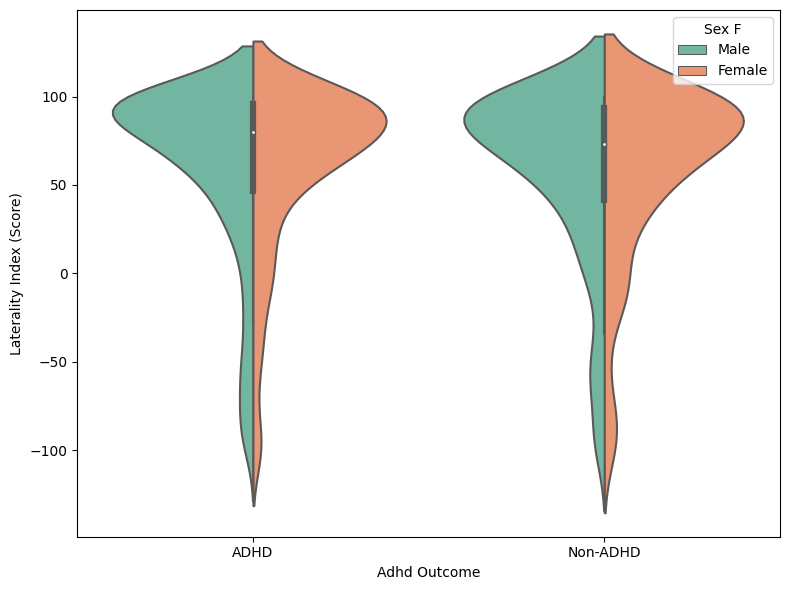

___

#### `ColorVision_CV_Score` — *Color vision test score*

#### Violin Plot for `ColorVision_CV_Score` (ADHD_Outcome_label × split by Sex_F_label)

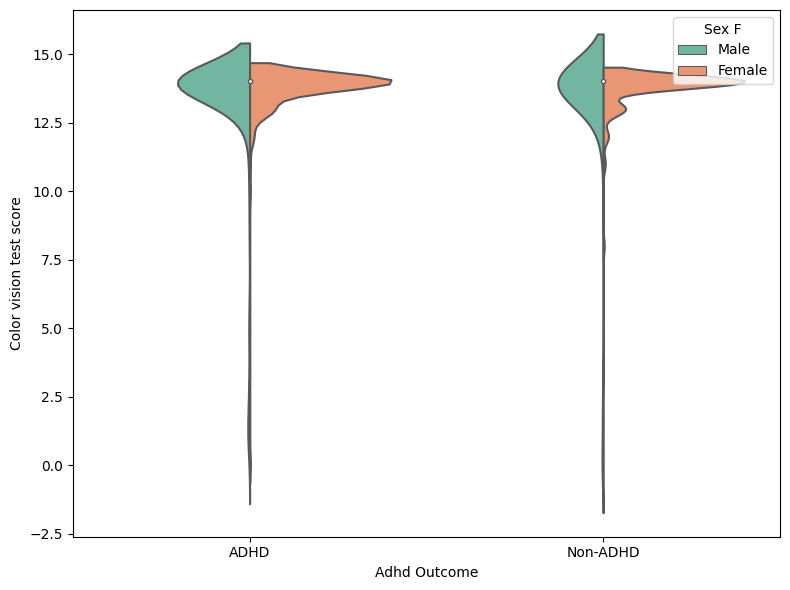

___

#### `APQ_P_APQ_P_CP` — *Corporal Punishment Score*

#### Violin Plot for `APQ_P_APQ_P_CP` (ADHD_Outcome_label × split by Sex_F_label)

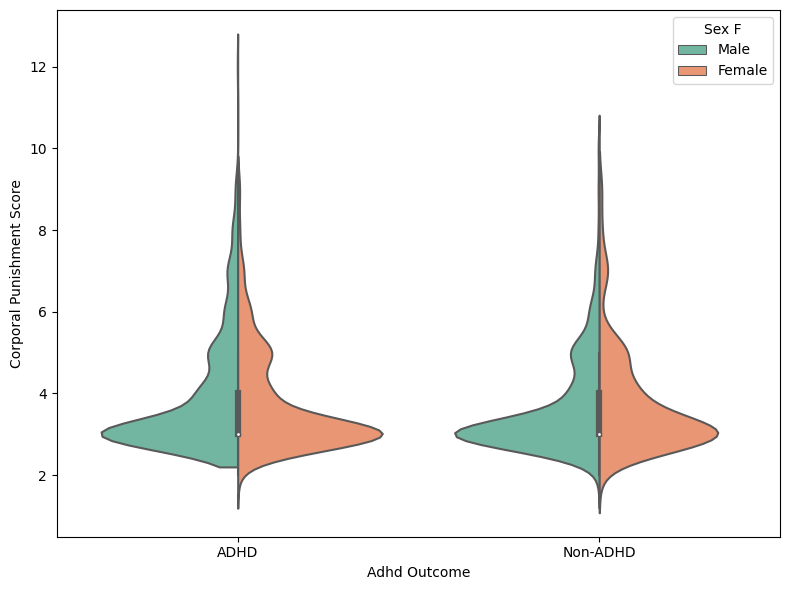

___

#### `APQ_P_APQ_P_ID` — *Inconsistent Discipline Score*

#### Violin Plot for `APQ_P_APQ_P_ID` (ADHD_Outcome_label × split by Sex_F_label)

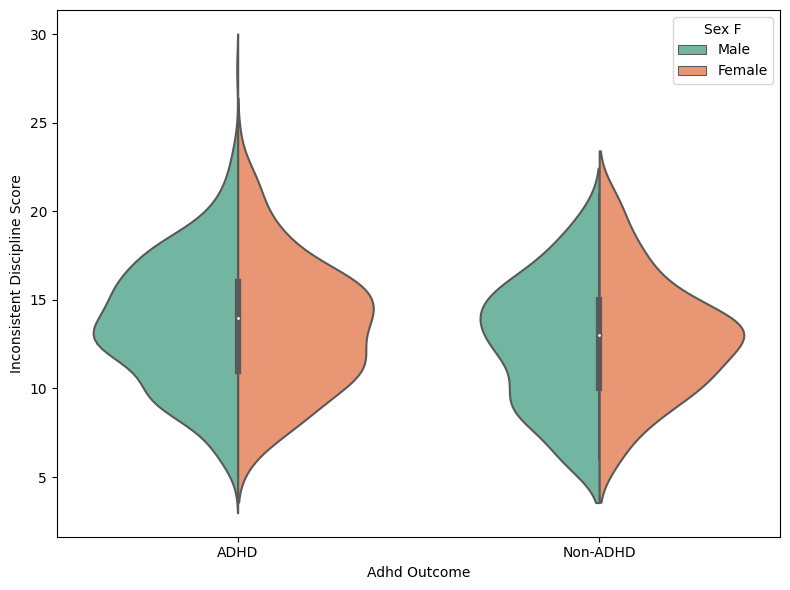

___

#### `APQ_P_APQ_P_INV` — *Involvement Score*

#### Violin Plot for `APQ_P_APQ_P_INV` (ADHD_Outcome_label × split by Sex_F_label)

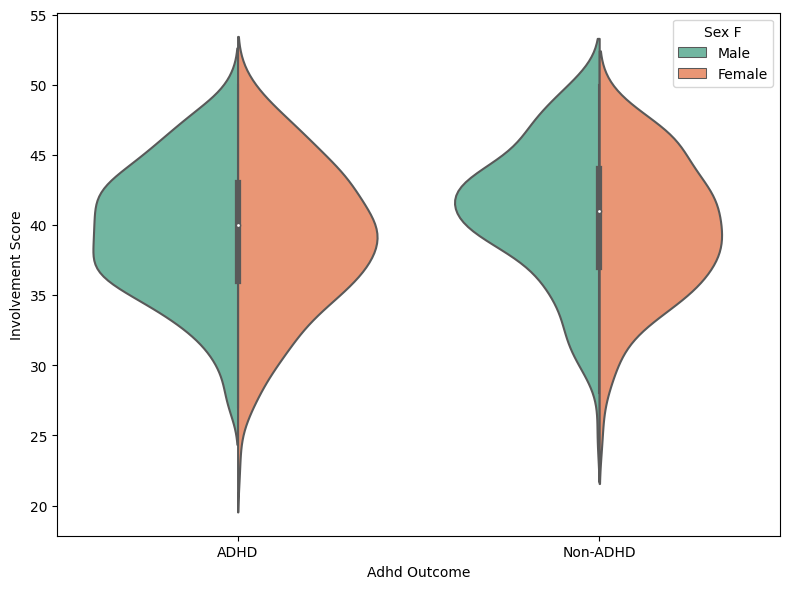

___

#### `APQ_P_APQ_P_OPD` — *Other Discipline Practices Score (Not factored into total score but provides item level information)*

#### Violin Plot for `APQ_P_APQ_P_OPD` (ADHD_Outcome_label × split by Sex_F_label)

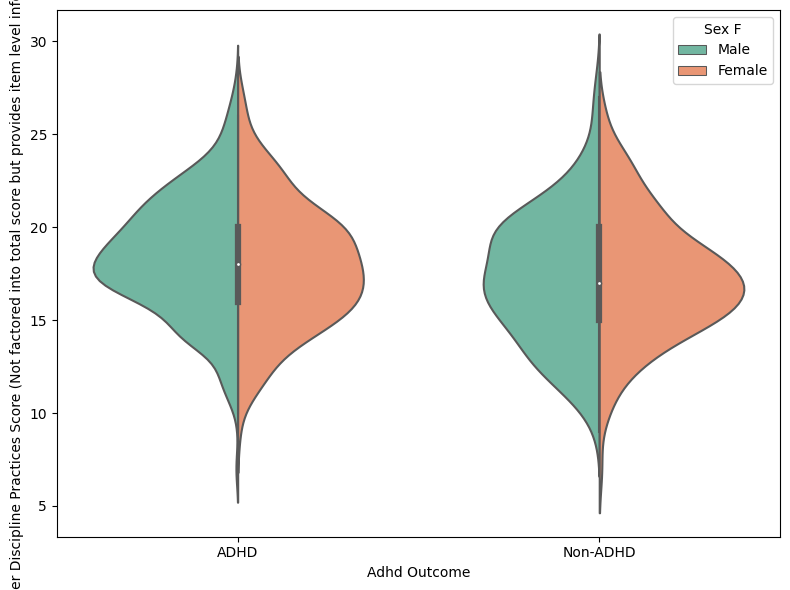

___

#### `APQ_P_APQ_P_PM` — *Poor Monitoring/Supervision Score*

#### Violin Plot for `APQ_P_APQ_P_PM` (ADHD_Outcome_label × split by Sex_F_label)

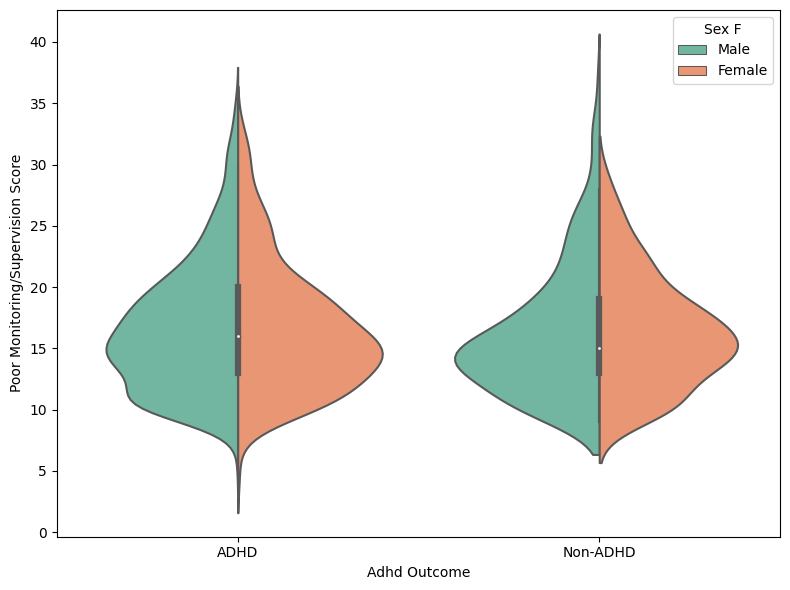

___

#### `APQ_P_APQ_P_PP` — *Positive Parenting Score*

#### Violin Plot for `APQ_P_APQ_P_PP` (ADHD_Outcome_label × split by Sex_F_label)

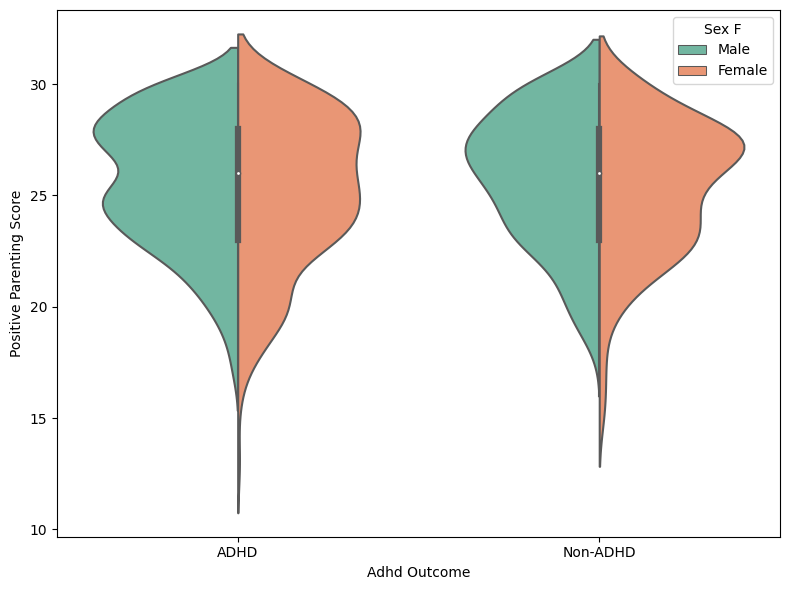

___

#### `SDQ_SDQ_Conduct_Problems` — *Conduct problems scale*

#### Violin Plot for `SDQ_SDQ_Conduct_Problems` (ADHD_Outcome_label × split by Sex_F_label)

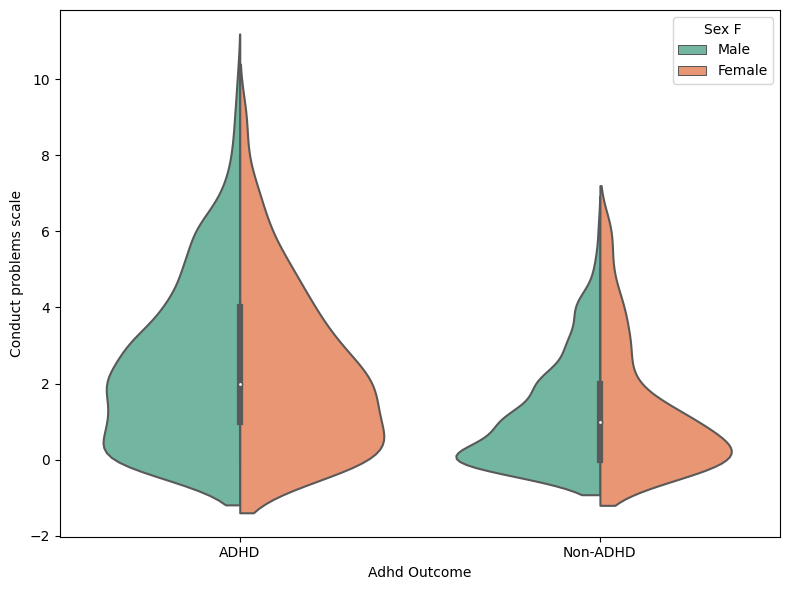

___

#### `SDQ_SDQ_Difficulties_Total` — *Total Difficulties Score*

#### Violin Plot for `SDQ_SDQ_Difficulties_Total` (ADHD_Outcome_label × split by Sex_F_label)

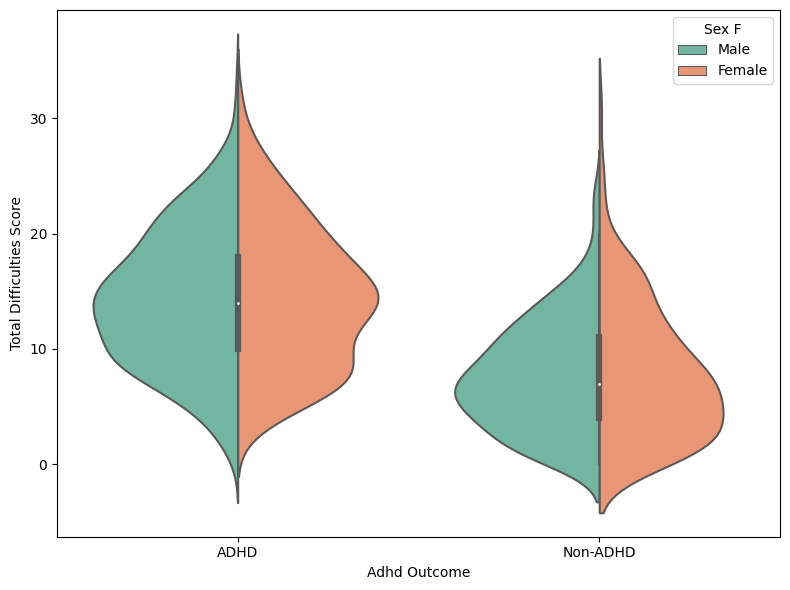

___

#### `SDQ_SDQ_Emotional_Problems` — *Emotional Problems Scale*

#### Violin Plot for `SDQ_SDQ_Emotional_Problems` (ADHD_Outcome_label × split by Sex_F_label)

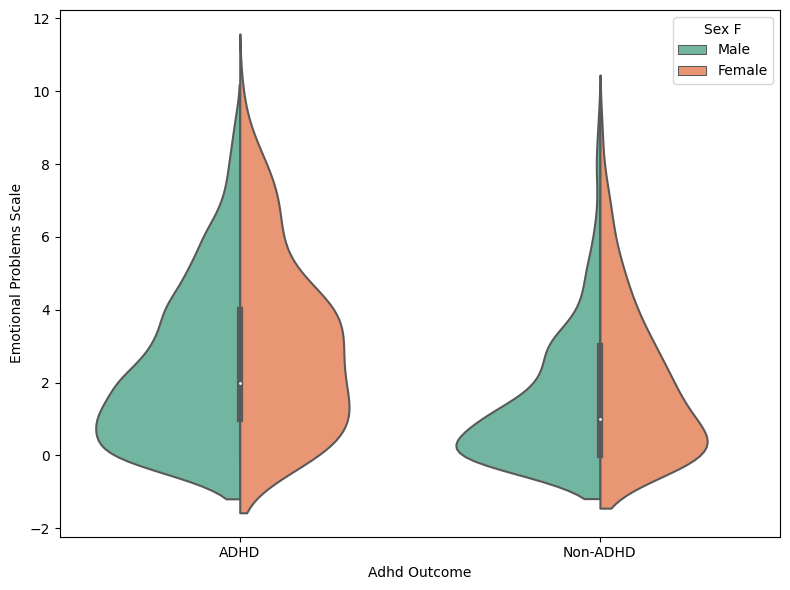

___

#### `SDQ_SDQ_Externalizing` — *Externalizing Score*

#### Violin Plot for `SDQ_SDQ_Externalizing` (ADHD_Outcome_label × split by Sex_F_label)

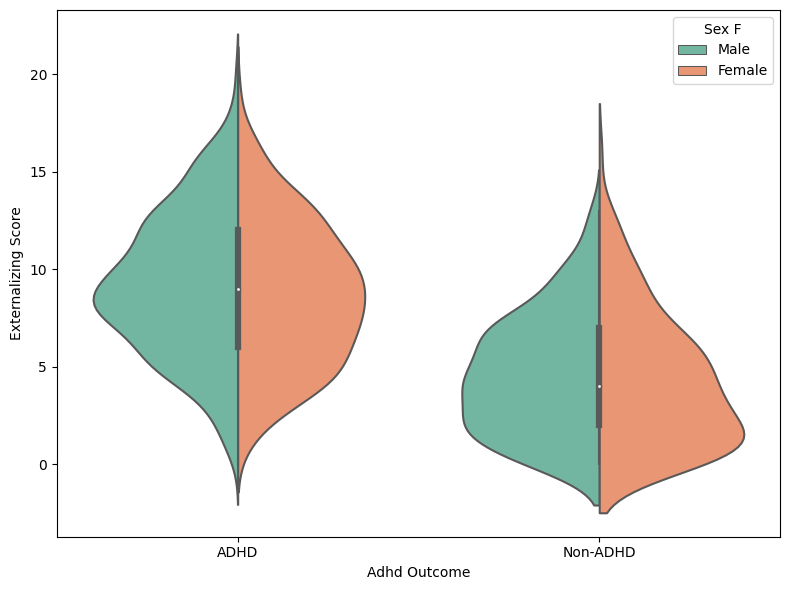

___

#### `SDQ_SDQ_Generating_Impact` — *Generating Impact Scores*

#### Violin Plot for `SDQ_SDQ_Generating_Impact` (ADHD_Outcome_label × split by Sex_F_label)

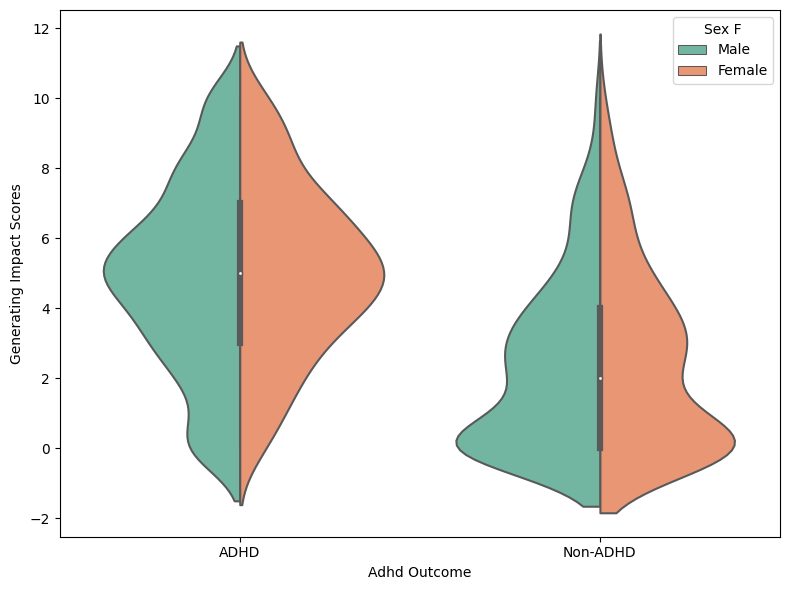

___

#### `SDQ_SDQ_Hyperactivity` — *Hyperactivity Scale*

#### Violin Plot for `SDQ_SDQ_Hyperactivity` (ADHD_Outcome_label × split by Sex_F_label)

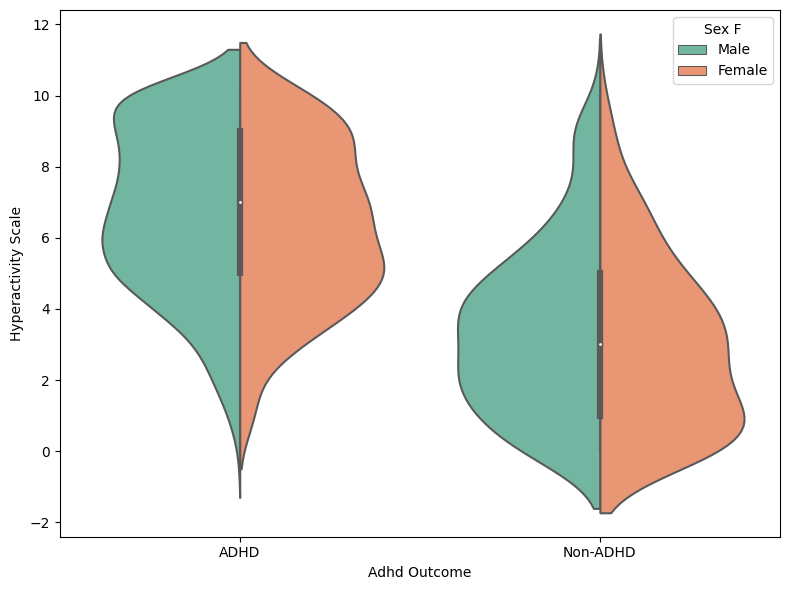

___

#### `SDQ_SDQ_Internalizing` — *Internalizing Score*

#### Violin Plot for `SDQ_SDQ_Internalizing` (ADHD_Outcome_label × split by Sex_F_label)

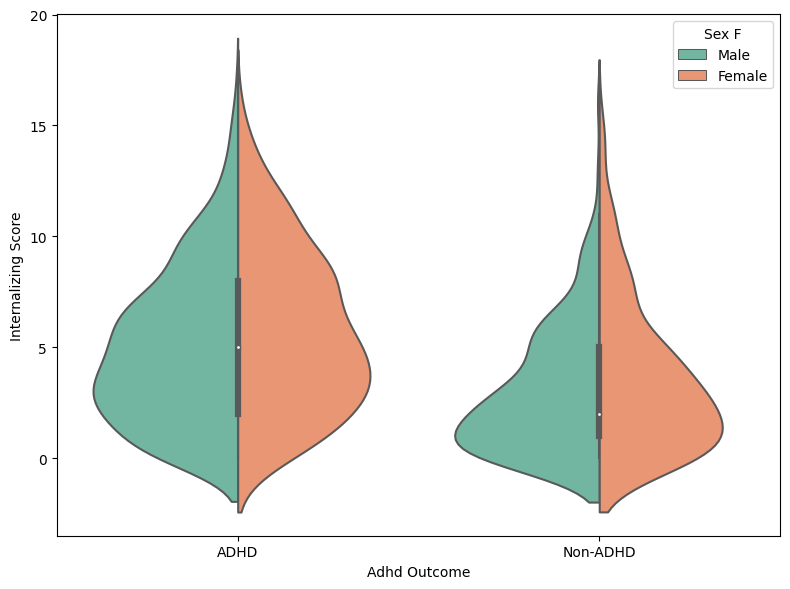

___

#### `SDQ_SDQ_Peer_Problems` — *Peer Problems Scale*

#### Violin Plot for `SDQ_SDQ_Peer_Problems` (ADHD_Outcome_label × split by Sex_F_label)

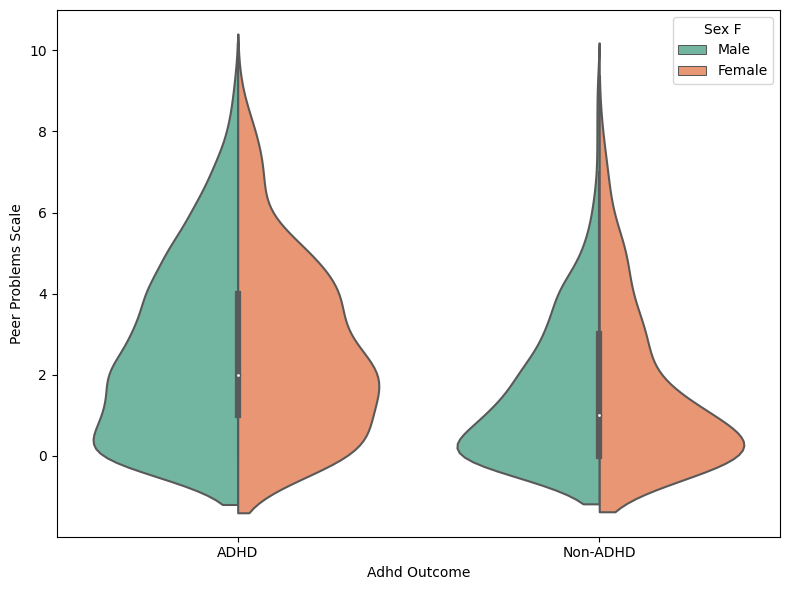

___

#### `SDQ_SDQ_Prosocial` — *Prosocial Scale*

#### Violin Plot for `SDQ_SDQ_Prosocial` (ADHD_Outcome_label × split by Sex_F_label)

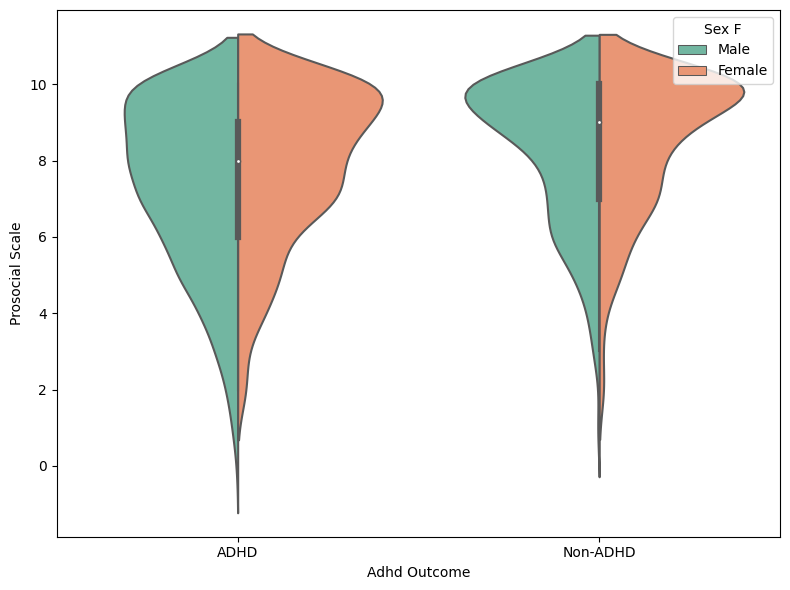

___

#### `MRI_Track_Age_at_Scan` — *Age at time of MRI scan*

#### Violin Plot for `MRI_Track_Age_at_Scan` (ADHD_Outcome_label × split by Sex_F_label)

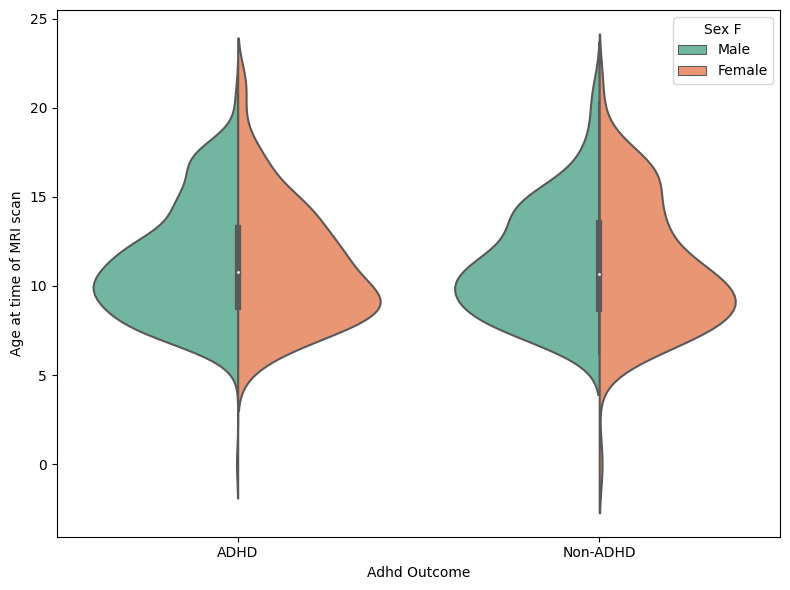

___

In [58]:
# ADHD vs Non-ADHD on x-axis, split by sex (clean and short now!)
plot_split_violin_by_groups(
    df=data_q,
    x_col='ADHD_Outcome',
    hue_col='Sex_F'
)


### Female vs male ( split by ADHD vs non ADHD)

#### `EHQ_EHQ_Total` — *Laterality Index (Score)*

#### Violin Plot for `EHQ_EHQ_Total` (Sex_F_label × split by ADHD_Outcome_label)

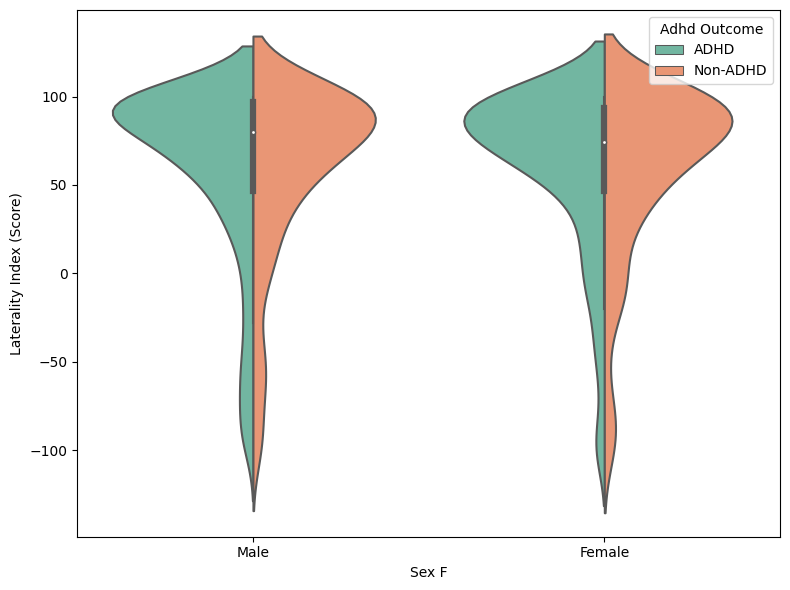

___

#### `ColorVision_CV_Score` — *Color vision test score*

#### Violin Plot for `ColorVision_CV_Score` (Sex_F_label × split by ADHD_Outcome_label)

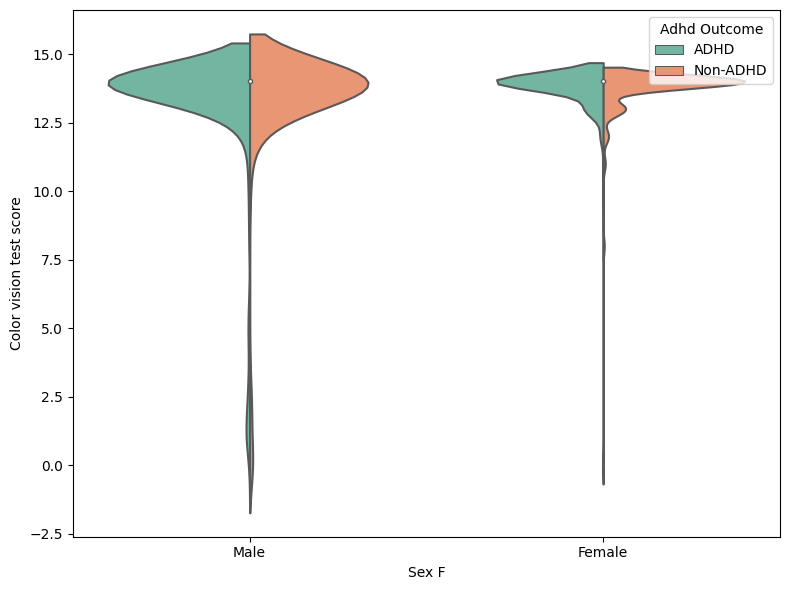

___

#### `APQ_P_APQ_P_CP` — *Corporal Punishment Score*

#### Violin Plot for `APQ_P_APQ_P_CP` (Sex_F_label × split by ADHD_Outcome_label)

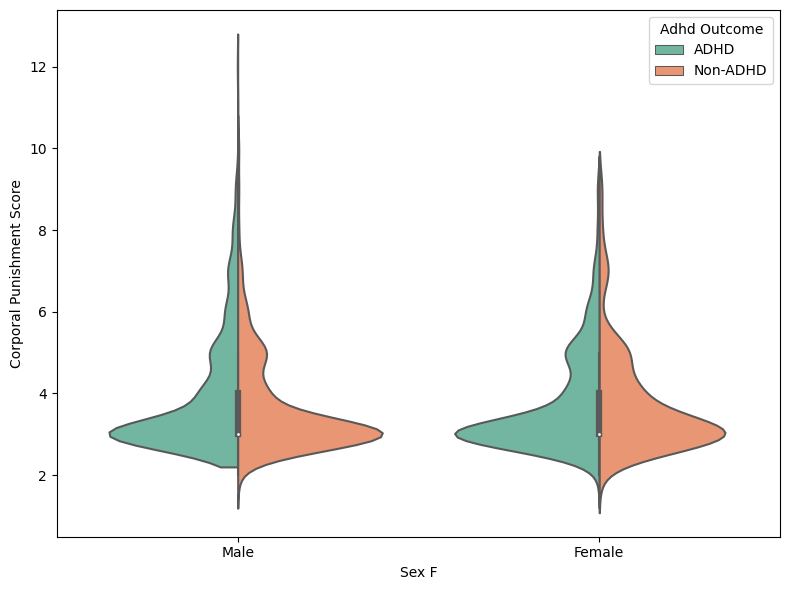

___

#### `APQ_P_APQ_P_ID` — *Inconsistent Discipline Score*

#### Violin Plot for `APQ_P_APQ_P_ID` (Sex_F_label × split by ADHD_Outcome_label)

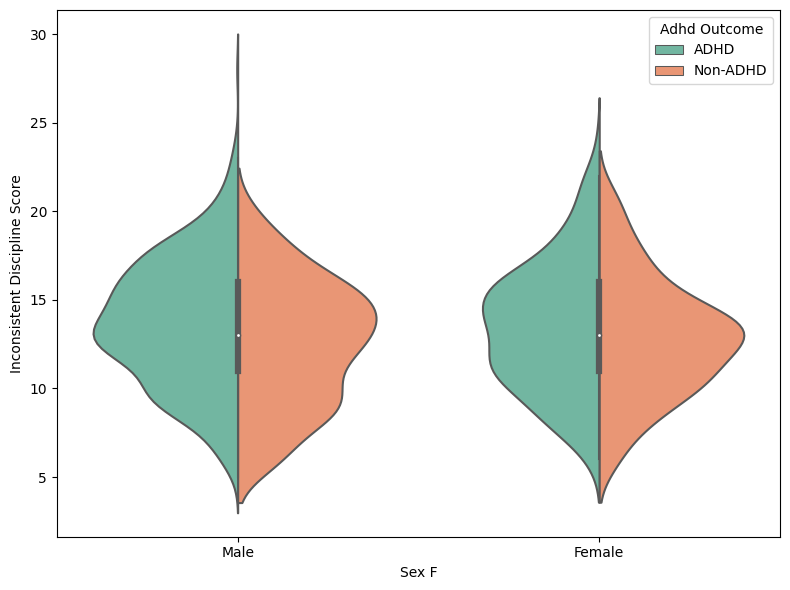

___

#### `APQ_P_APQ_P_INV` — *Involvement Score*

#### Violin Plot for `APQ_P_APQ_P_INV` (Sex_F_label × split by ADHD_Outcome_label)

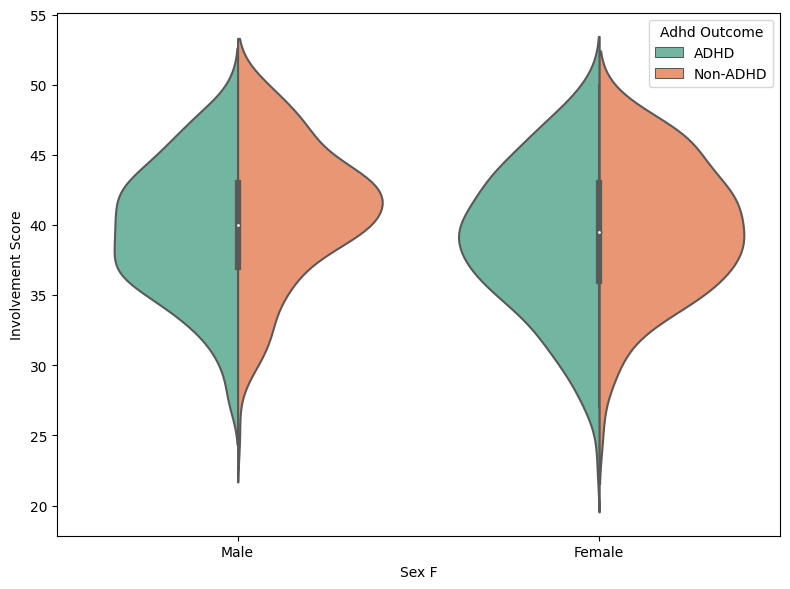

___

#### `APQ_P_APQ_P_OPD` — *Other Discipline Practices Score (Not factored into total score but provides item level information)*

#### Violin Plot for `APQ_P_APQ_P_OPD` (Sex_F_label × split by ADHD_Outcome_label)

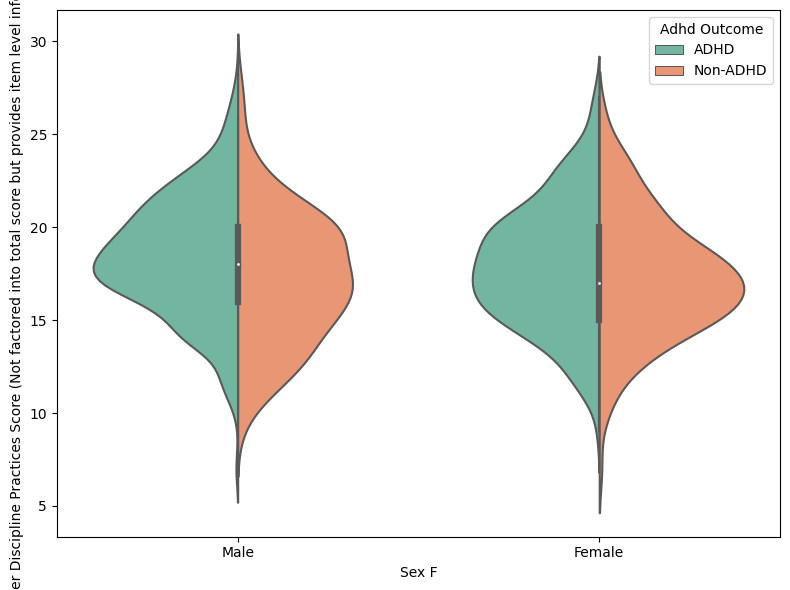

___

#### `APQ_P_APQ_P_PM` — *Poor Monitoring/Supervision Score*

#### Violin Plot for `APQ_P_APQ_P_PM` (Sex_F_label × split by ADHD_Outcome_label)

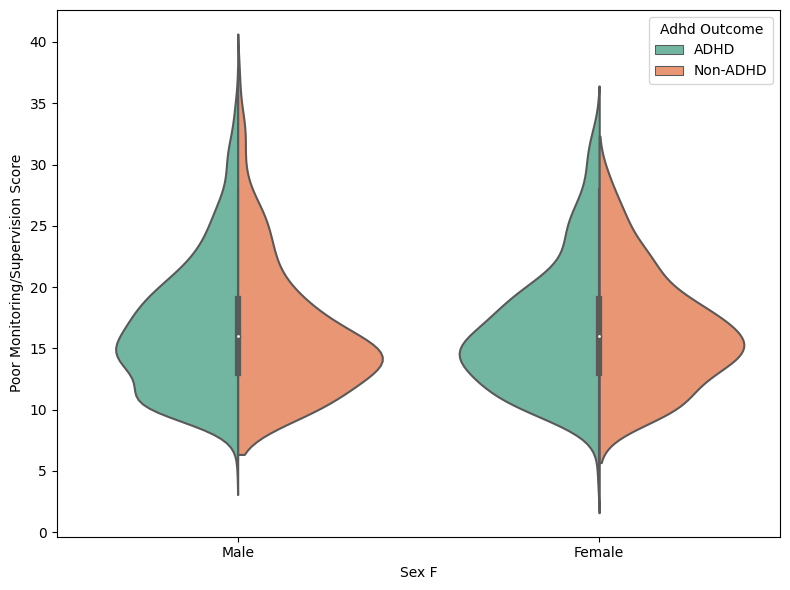

___

#### `APQ_P_APQ_P_PP` — *Positive Parenting Score*

#### Violin Plot for `APQ_P_APQ_P_PP` (Sex_F_label × split by ADHD_Outcome_label)

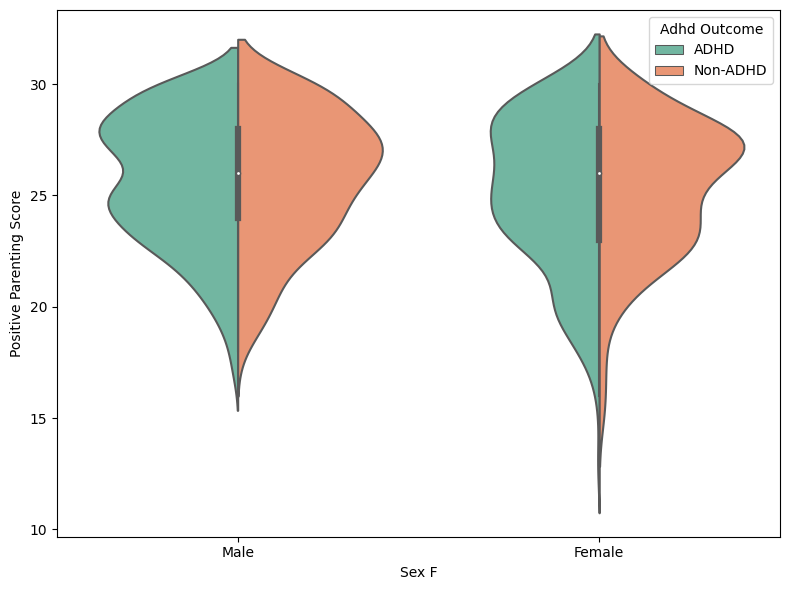

___

#### `SDQ_SDQ_Conduct_Problems` — *Conduct problems scale*

#### Violin Plot for `SDQ_SDQ_Conduct_Problems` (Sex_F_label × split by ADHD_Outcome_label)

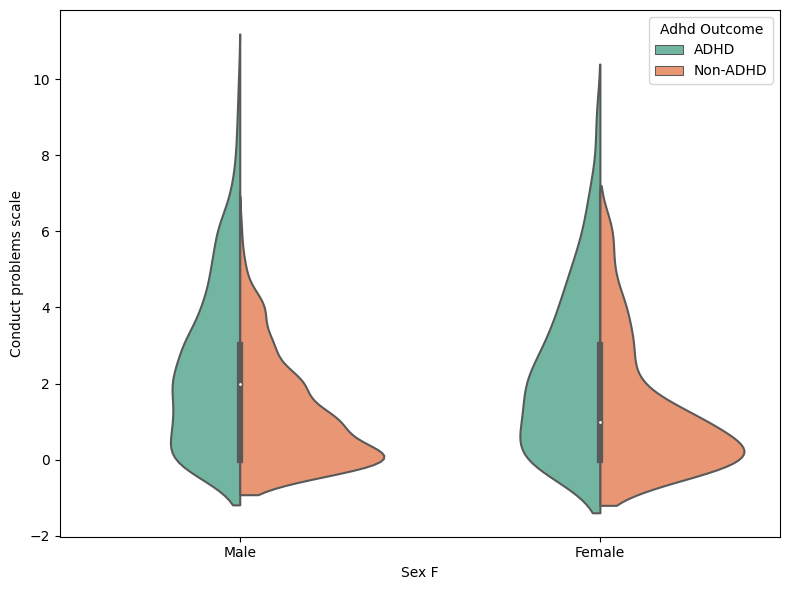

___

#### `SDQ_SDQ_Difficulties_Total` — *Total Difficulties Score*

#### Violin Plot for `SDQ_SDQ_Difficulties_Total` (Sex_F_label × split by ADHD_Outcome_label)

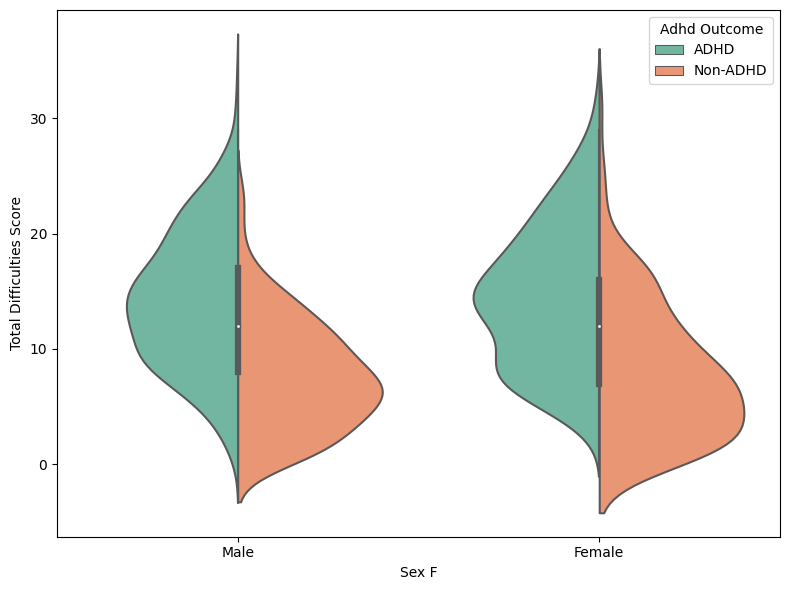

___

#### `SDQ_SDQ_Emotional_Problems` — *Emotional Problems Scale*

#### Violin Plot for `SDQ_SDQ_Emotional_Problems` (Sex_F_label × split by ADHD_Outcome_label)

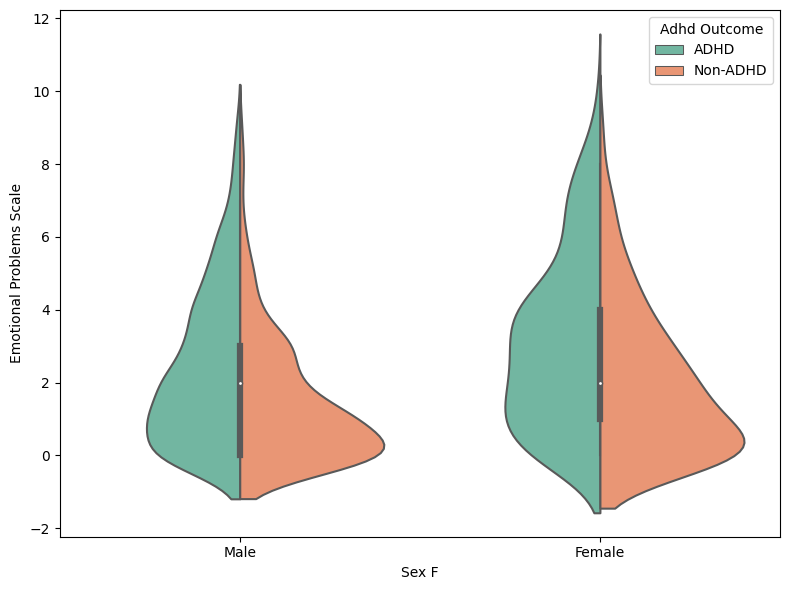

___

#### `SDQ_SDQ_Externalizing` — *Externalizing Score*

#### Violin Plot for `SDQ_SDQ_Externalizing` (Sex_F_label × split by ADHD_Outcome_label)

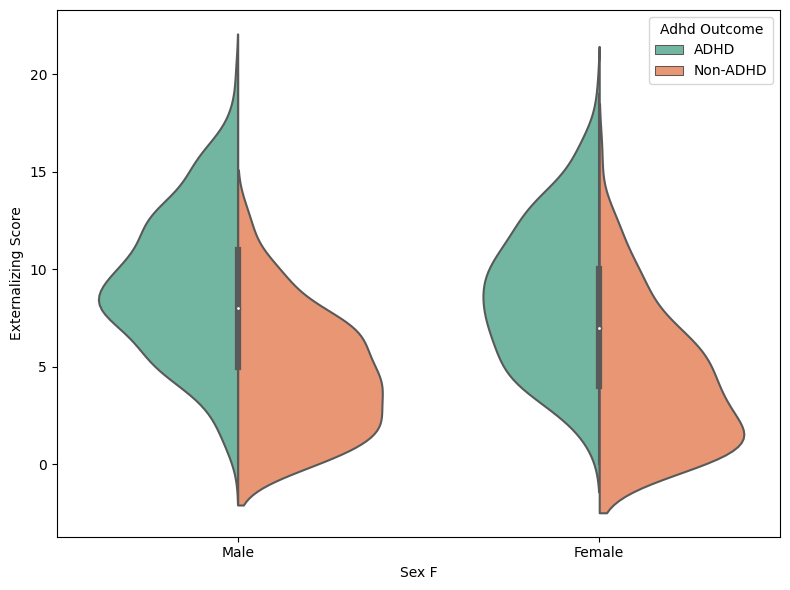

___

#### `SDQ_SDQ_Generating_Impact` — *Generating Impact Scores*

#### Violin Plot for `SDQ_SDQ_Generating_Impact` (Sex_F_label × split by ADHD_Outcome_label)

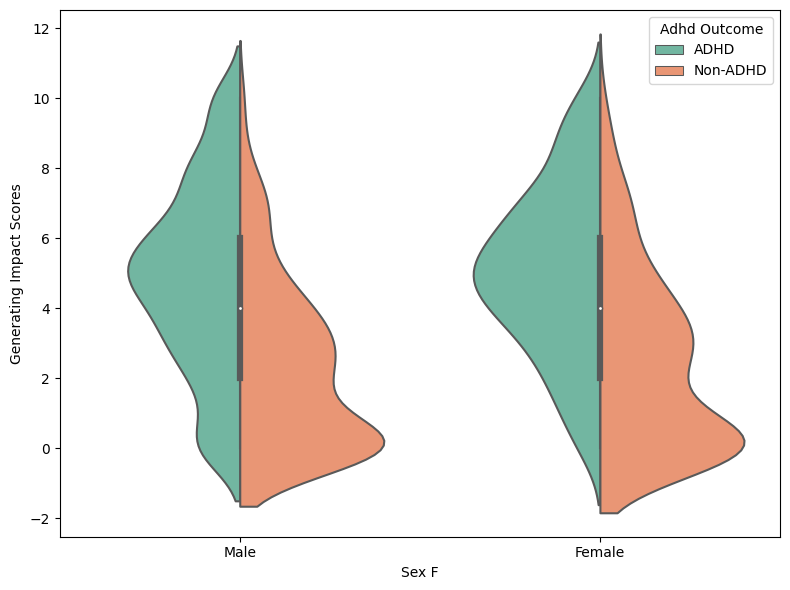

___

#### `SDQ_SDQ_Hyperactivity` — *Hyperactivity Scale*

#### Violin Plot for `SDQ_SDQ_Hyperactivity` (Sex_F_label × split by ADHD_Outcome_label)

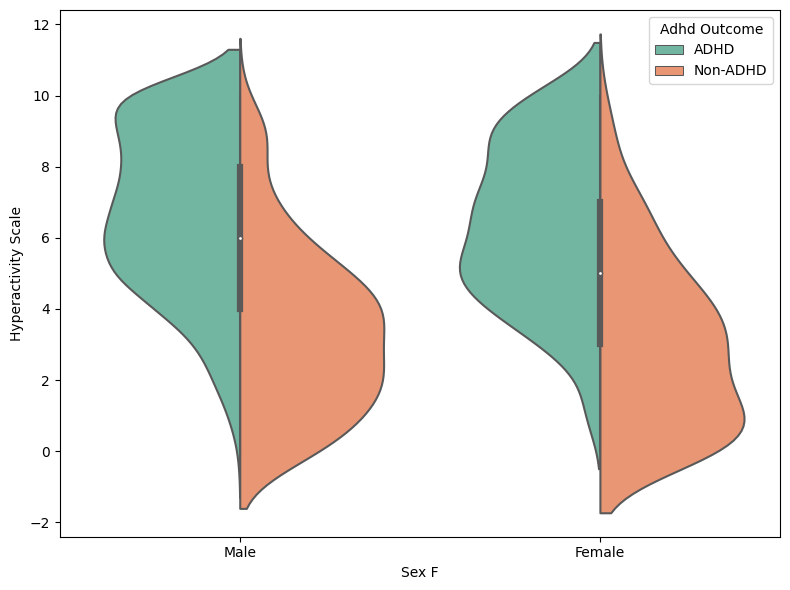

___

#### `SDQ_SDQ_Internalizing` — *Internalizing Score*

#### Violin Plot for `SDQ_SDQ_Internalizing` (Sex_F_label × split by ADHD_Outcome_label)

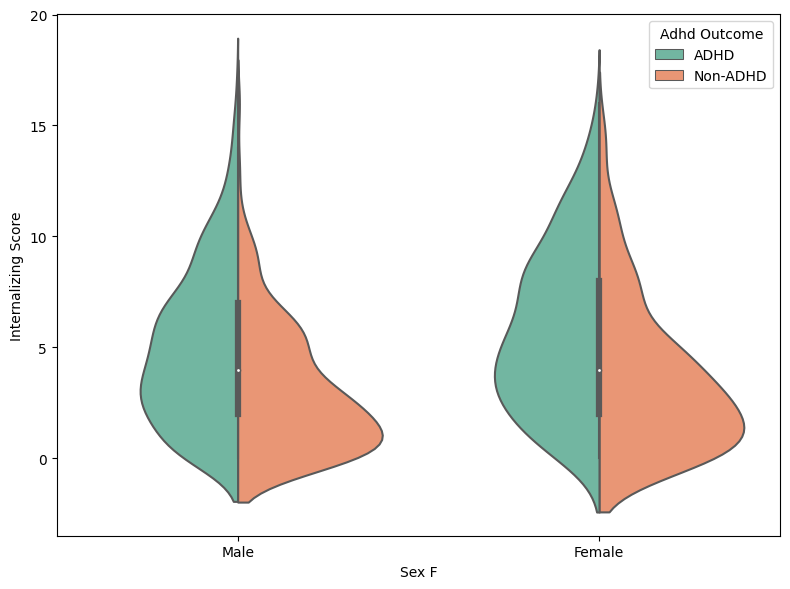

___

#### `SDQ_SDQ_Peer_Problems` — *Peer Problems Scale*

#### Violin Plot for `SDQ_SDQ_Peer_Problems` (Sex_F_label × split by ADHD_Outcome_label)

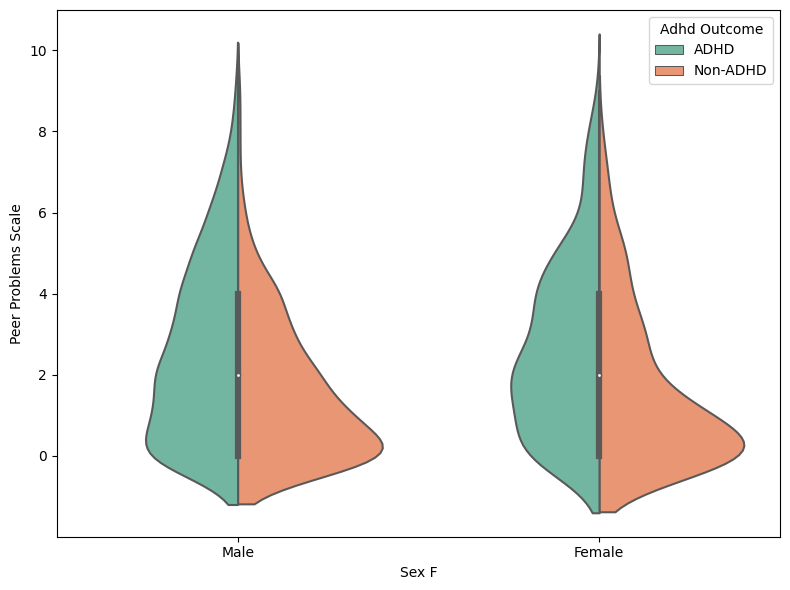

___

#### `SDQ_SDQ_Prosocial` — *Prosocial Scale*

#### Violin Plot for `SDQ_SDQ_Prosocial` (Sex_F_label × split by ADHD_Outcome_label)

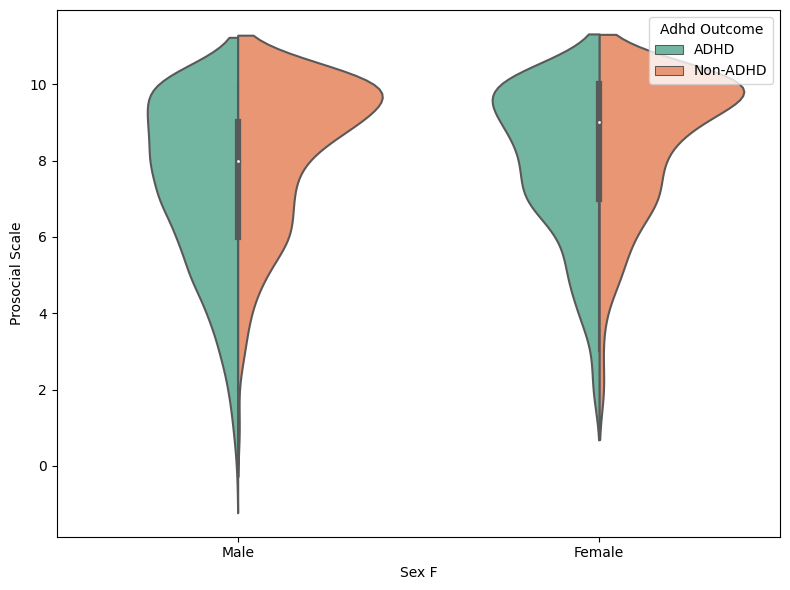

___

#### `MRI_Track_Age_at_Scan` — *Age at time of MRI scan*

#### Violin Plot for `MRI_Track_Age_at_Scan` (Sex_F_label × split by ADHD_Outcome_label)

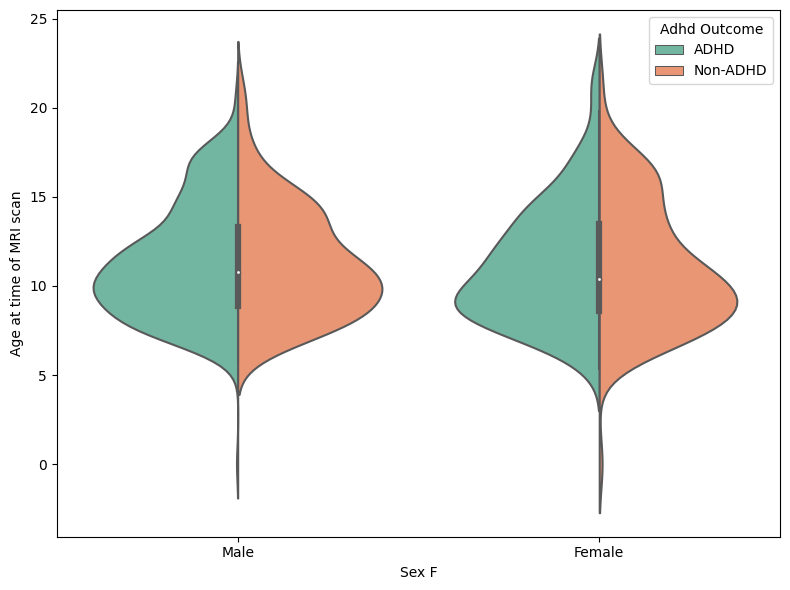

___

In [59]:
plot_split_violin_by_groups(
    df=data_q,
    x_col='Sex_F',
    hue_col='ADHD_Outcome'
)

### Summary

| Feature Name                  | ADHD Relation     | Gender Relation | Summary                                    |
|------------------------------|-------------------|------------------|--------------------------------------------|
| `EHQ_Laterality_Index`       | No                | No               | Not related to ADHD or gender              |
| `ColorVision_Score`          | No                | No               | Ceiling effect; not useful                 |
| `APQ_Corporal_Punishment`    | No                | No               | Unrelated; low variation                   |
| `APQ_Inconsistent_Discipline`| Weak              | No               | Slight ADHD shift                          |
| `APQ_Parental_Involvement`   | Weak              | No               | Slightly higher in Non-ADHD                |
| `APQ_Other_Discipline`       | No                | No               | No visible differences                     |
| `APQ_Poor_Monitoring`        | Weak              | No               | Slightly broader distribution in ADHD      |
| `APQ_Positive_Patienting`    | No                | No               | Equal across groups                        |
| `SDQ_Conduct_Problems`       | Strong            | No               | Clear ADHD signal                          |
| `SDQ_Total_Difficulties`     | Strong            | No               | Broad ADHD-related difficulties            |
| `SDQ_Emotional_Problems`     | Moderate          | No               | Internalising symptoms elevated in ADHD    |
| `SDQ_Externalizing`          | Strong            | No               | Most powerful ADHD discriminator           |
| `SDQ_Generating_Impact`      | Strong            | No               | Greater impairment perceived by parents    |
| `SDQ_Hyperactivity`          | Very Strong       | No               | Clearest ADHD-related feature              |
| `SDQ_Internalizing`          | Moderate          | No               | Elevated in ADHD, smaller effect size      |
| `SDQ_Peer_Problems`          | Weak              | No               | ADHD kids struggle more with peers         |
| `SDQ_Prosocial`              | Weak              | No               | Slight reduction in ADHD                   |
| `Age_at_MRI`                 | No                | No               | Well-balanced; not a confounder            |




### Strong ADHD-related Features
- `SDQ_Conduct_Problems`         → clear behavioural difference
- `SDQ_Total_Difficulties`       → broad multi-domain difference
- `SDQ_Externalizing`            → large gap; excellent discriminator
- `SDQ_Generating_Impact`        → higher perceived impact in ADHD
- `SDQ_Hyperactivity`            → most visually distinct ADHD feature

### Moderate ADHD-related Features
- `SDQ_Emotional_Problems`       → elevated internalising symptoms
- `SDQ_Internalizing`            → mix of emotional + peer issues, moderate effect

### Weak ADHD-related Features
- `APQ_Inconsistent_Discipline`  → small shift; overlapping curves
- `APQ_Parental_Involvement`     → slightly lower in ADHD
- `APQ_Poor_Monitoring`          → broader distribution in ADHD
- `SDQ_Peer_Problems`            → modest ADHD-linked increase
- `SDQ_Prosocial`                → mildly reduced in ADHD

### No Observable ADHD Effect
- `EHQ_Laterality_Index`
- `ColorVision_Score`
- `APQ_Corporal_Punishment`
- `APQ_Other_Discipline`
- `APQ_Positive_Patienting`
- `Age_at_MRI`


#### Also, It seems like this dataset isn't strong at gender prediction, from visual plots.
### Is *"gender differences aren't statistically significant"* in this quantitative dataset?

## **Correclation check for qualidative dataset**

### r (correlation coefficient)

- `r` is a **number between -1 and 1**.
- It measures **how strong** and **in what direction** two variables move together.

**Interpretation of r:**

| r value           | Interpretation |
|:------------------|:---------------|
| close to 1        | strong positive correlation (both go up together) |
| close to -1       | strong negative correlation (one goes up, other goes down) |
| close to 0        | little or no linear correlation |

**Example:**
- r = 0.8 → strong positive relationship
- r = -0.7 → strong negative relationship
- r = 0.05 → almost no relationship

✅ **Pearson r** measures **linear** relationship.  
✅ **Spearman r** (often called rho) measures **monotonic** relationship (not necessarily straight-line).

---

### p (p-value)

- `p` is a **probability**.
- It tells you whether the correlation you observed might just be **random**.

**Interpretation of p-value:**

| p value            | Meaning |
|:-------------------|:--------|
| p < 0.05            | statistically significant (the correlation is probably real) |
| p >= 0.05           | not statistically significant (could be just random noise) |

**Example:**
- p = 0.001 → very significant (very unlikely due to chance)
- p = 0.25 → not significant (could just be randomness)

✅ Small p-value means you can **trust** the r you calculated.  
✅ Big p-value means you **cannot trust** the r — could be random.

---

### Simple way to remember:

| Term | Think of it like... |
|:-----|:--------------------|
| **r** | How *strong* and *which way* they move together |
| **p** | How *confident* we are that this is not by random luck |

---

### Quick check:

- If **p < 0.05** → check r:
  - r > 0 → positive relationship
  - r < 0 → negative relationship
- If **p >= 0.05** → no significant relationship (ignore r)

---

### Pearson (Linear) vs. Spearman (Monotonic)

When analyzing relationships between two variables, correlation coefficients help us quantify the strength and direction of their association. Two of the most common types are Pearson's `r` and Spearman's `rho` (`rs`). 

While both range from -1 (perfect negative association) to +1 (perfect positive association), they measure different *types* of relationships.

### Pearson Correlation (`r`): The Linear Specialist

* **What it measures:** The strength and direction of a **linear** relationship.
* **Think:** How well do the data points fit onto a **straight line**?
* **How it works:** Uses the actual numerical values of the variables.
* **Key takeaway:** Pearson `r` is high (close to 1 or -1) only when the variables change together at a *constant rate*, forming a straight line pattern in a scatter plot. It's sensitive to outliers.

### Spearman Rank Correlation (`rho` or `rs`): The Monotonic Specialist

* **What it measures:** The strength and direction of a **monotonic** relationship.
* **Think:** As one variable increases, does the other variable **consistently increase** OR **consistently decrease**, even if **not in a straight line**? It's about the **consistent direction** of the relationship.
* **How it works:** It doesn't use the actual values. Instead, it converts the values to **ranks** within each variable and then calculates the Pearson correlation on those ranks. This focuses purely on the order and consistency of change.
* **Key takeaway:** Spearman `rho` can be high even if the relationship is curved, as long as it's consistently increasing or decreasing. It's robust to outliers and doesn't require a linear pattern.

### Linear vs. Monotonic (Non-Linear)

The term "non-linear" can be broad. Spearman specifically looks for **monotonic** relationships, which are a *subset* of non-linear relationships. 

-  **Linear Relationship:**
    * Data follows a straight line.
    * *Detected strongly by:* **Pearson** and **Spearman** (a straight line is also monotonic).

-  **Monotonic Non-Linear Relationship:**
    * Data follows a trend that is *consistently* increasing or *consistently* decreasing, but it's *curved*.
    * *Example:* An exponential growth curve ($y = e^x$ for x>0) - always goes up, but gets steeper.
    * *Detected strongly by:* **Spearman**. Pearson might be moderate or low depending on how much it deviates from a straight line.

-  **Non-Monotonic Non-Linear Relationship:**
    * Data follows a pattern, but the trend *changes direction*.
    * *Example:* A U-shape ($y = x^2$) or a wave pattern ($y = \sin(x)$).
    * *Detected strongly by:* **Neither Pearson nor Spearman** might show a strong correlation here, as the overall direction isn't consistent. Specialized methods might be needed to capture these.

**summary:**

* Use **Pearson `r`** when you specifically want to know about the *straight-line* relationship.
* Use **Spearman `rho`** when you want to know if variables tend to move in the *same relative direction* (consistently increasing or decreasing), regardless of whether the pattern forms a straight line.

**exemple**:
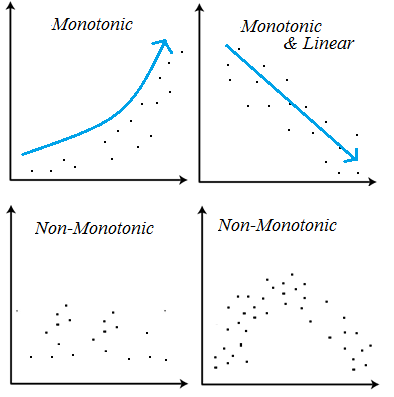!
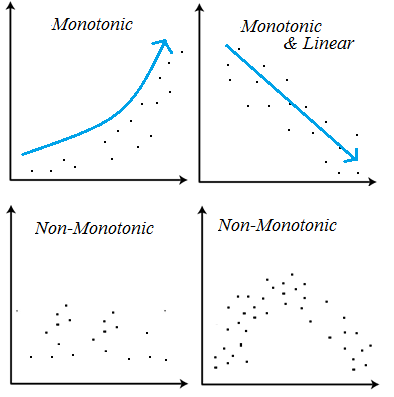

In [60]:
# get the feature names
features = [col for col in data_q.columns if col not in ['participant_id','Sex_F', 'ADHD_Outcome']]

## **Correlation: Features vs Targets**

---
### Why should we check feature vs target correlation?
#### To understand the data fundamentally and aiding interpretation later.
- **The initial insight of the relationship betwen features and targets.**
- **If non of the features are correlated with the targets, it means predicting the target are inherently difficult, regardless the modelling techniques.**
- **It helps with the future interpretations, like if we use PCA, we want to interpret the combination of features for principle components,and we could try to understand why.**


In [61]:
# create two list of libraries of correlation score
result_spearmanr = []
result_pearsonr = []

for feature in features:
    for target in ['Sex_F', 'ADHD_Outcome']:
        # Drop NaN for the current feature and target
        df_tmp = data_q[[feature, target]].dropna()

        if len(df_tmp) > 1:  # Need at least 2 points to compute correlation
            r_pearson, pval_pearson = pearsonr(df_tmp[feature], df_tmp[target])
            r_spearman, pval_spearman = spearmanr(df_tmp[feature], df_tmp[target])
        else:
            r_pearson, pval_pearson = float('nan'), float('nan')
            r_spearman, pval_spearman = float('nan'), float('nan')

        result_pearsonr.append({'feature': feature, 'target': target, 'pearsonr_r': r_pearson, 'p_value': pval_pearson})
        result_spearmanr.append({'feature': feature, 'target': target, 'spearmanr_r': r_spearman, 'p_value': pval_spearman})

In [62]:
def generate_correlation_dataframe(result_pearsonr, result_spearmanr, alpha=0.05):
    """
    Generate a DataFrame comparing Pearson and Spearman correlation results.

    Args:
        result_pearsonr (list): list of dicts with keys ['feature', 'target', 'pearsonr_r', 'p_value']
        result_spearmanr (list): list of dicts with keys ['feature', 'target', 'spearmanr_r', 'p_value']
        alpha (float): significance level, default 0.05

    Returns:
        pd.DataFrame: Correlation comparison table with strength.
    """
    import pandas as pd

    # Convert lists to DataFrames
    df_pearson = pd.DataFrame(result_pearsonr)
    df_spearman = pd.DataFrame(result_spearmanr)

    # Merge on feature and target
    df = pd.merge(df_pearson, df_spearman, on=['feature', 'target'], suffixes=('_pearson', '_spearman'))

    # Decide correlation type
    correlation_type = []
    strength = []

    for _, row in df.iterrows():
        if pd.notna(row['pearsonr_r']) and row['p_value_pearson'] < alpha:
            correlation_type.append('🟢 Linear (Pearson)')
            r_used = abs(row['pearsonr_r'])
        elif pd.notna(row['spearmanr_r']) and row['p_value_spearman'] < alpha:
            correlation_type.append('🟡 Non-linear (Spearman)')
            r_used = abs(row['spearmanr_r'])
        else:
            correlation_type.append('🔴 No significant correlation')
            r_used = None

        # Decide strength
        if r_used is None:
            strength.append('No correlation')
        elif r_used >= 0.5:
            strength.append('Strong')
        elif r_used >= 0.3:
            strength.append('Medium')
        elif r_used >= 0.1:
            strength.append('Weak')
        else:
            strength.append('Very weak')

    # Add two new columns
    df['correlation_type'] = correlation_type
    df['strength'] = strength

    return df



In [63]:
def display_correlation_by_target(df_correlation):
    """
    Display the correlation dataframe grouped by target, showing feature and correlation type.

    Args:
        df_correlation (pd.DataFrame): The correlation result dataframe.
    """
    targets = df_correlation['target'].unique()

    for target in targets:
        display(Markdown(f"\n### Target: `{target}`\n"))
        df_target = df_correlation[df_correlation['target'] == target]

        for _, row in df_target.iterrows():
            feature = row['feature']
            correlation_type = row['correlation_type']
            display(Markdown(f"- Feature: `{feature}` → {correlation_type}"))


In [64]:

def summarize_correlation_by_target_markdown(df_correlation):
    """
    Summarize features by target and correlation type (linear, non-linear, no significant correlation),
    and display nicely in Markdown format, including strength.
    """
    targets = df_correlation['target'].unique()

    for target in targets:
        md_text = f"### Target: `{target}`\n\n"

        df_target = df_correlation[df_correlation['target'] == target]

        # Subgroup: Linear
        df_linear = df_target[df_target['correlation_type'].str.contains('Linear')]
        md_text += "### 🟢 Linear Correlations (Pearson significant):\n\n"
        if not df_linear.empty:
            for _, row in df_linear.iterrows():
                feature = row['feature']
                strength = row['strength']
                md_text += f"- `{feature}` (**{strength}**)\n"
        else:
            md_text += "_No linear correlations found._\n"

        # Subgroup: Non-linear
        df_nonlinear = df_target[df_target['correlation_type'].str.contains('Non-linear')]
        md_text += "\n\n### 🟡 Non-linear Correlations (Spearman significant only):\n\n"
        if not df_nonlinear.empty:
            for _, row in df_nonlinear.iterrows():
                feature = row['feature']
                strength = row['strength']
                md_text += f"- `{feature}` (**{strength}**)\n"
        else:
            md_text += "_No non-linear correlations found._\n"

        # Subgroup: No significant correlation
        df_nosig = df_target[df_target['correlation_type'].str.contains('No significant')]
        md_text += "\n\n### 🔴 No Significant Correlation:\n\n"
        if not df_nosig.empty:
            for _, row in df_nosig.iterrows():
                feature = row['feature']
                strength = row['strength']
                md_text += f"- `{feature}` (**{strength}**)\n"
        else:
            md_text += "_All features have significant correlations._\n"

        # Display markdown
        display(Markdown(md_text))



In [65]:
def get_significant_linear_features_by_target(df_correlation):
    """
    Get lists of features that are significantly linearly correlated with each target,
    grouped by strength.

    Args:
        df_correlation (pd.DataFrame): Correlation dataframe.

    Returns:
        dict: Nested dictionary {target: {strength: [list_of_features]}}
    """
    significant_features = {}

    targets = df_correlation['target'].unique()
    strength_levels = ['Strong', 'Medium', 'Weak', 'Very weak']

    for target in targets:
        df_target = df_correlation[df_correlation['target'] == target]

        # Keep only Linear correlations
        df_linear = df_target[df_target['correlation_type'].str.contains('Linear')]

        # Initialize inner dictionary for this target
        strength_dict = {level: [] for level in strength_levels}

        # Fill strength_dict
        for _, row in df_linear.iterrows():
            feature = row['feature']
            strength = row['strength']
            if strength in strength_levels:
                strength_dict[strength].append(feature)

        significant_features[target] = strength_dict

    return significant_features

In [66]:
# generate the dataframe of correlations
df_correlation = generate_correlation_dataframe(result_pearsonr, result_spearmanr)

In [67]:
display(df_correlation)

,feature,target,pearsonr_r,p_value_pearson,spearmanr_r,p_value_spearman,correlation_type,strength
0,EHQ_EHQ_Total,Sex_F,0.000689,9.809796e-01,-0.027276,3.451402e-01,🔴 No significant correlation,No correlation
1,EHQ_EHQ_Total,ADHD_Outcome,0.019770,4.938343e-01,0.035731,2.161386e-01,🔴 No significant correlation,No correlation
2,ColorVision_CV_Score,Sex_F,0.106389,2.363605e-04,0.026919,3.535100e-01,🟢 Linear (Pearson),Weak
3,ColorVision_CV_Score,ADHD_Outcome,-0.023184,4.242645e-01,-0.006321,8.275631e-01,🔴 No significant correlation,No correlation
4,APQ_P_APQ_P_CP,Sex_F,-0.034227,2.359102e-01,-0.024124,4.035640e-01,🔴 No significant correlation,No correlation
5,APQ_P_APQ_P_CP,ADHD_Outcome,0.059494,3.925896e-02,0.055971,5.247510e-02,🟢 Linear (Pearson),Very weak
6,APQ_P_APQ_P_ID,Sex_F,-0.018703,5.172743e-01,-0.027369,3.433011e-01,🔴 No significant correlation,No correlation
7,APQ_P_APQ_P_ID,ADHD_Outcome,0.124358,1.546231e-05,0.115642,5.895991e-05,🟢 Linear (Pearson),Weak
8,APQ_P_APQ_P_INV,Sex_F,-0.064444,2.552618e-02,-0.059066,4.069549e-02,🟢 Linear (Pearson),Very weak
9,APQ_P_APQ_P_INV,ADHD_Outcome,-0.099289,5.693045e-04,-0.101296,4.383605e-04,🟢 Linear (Pearson),Very weak


In [68]:
# store the linear-correlated features
significant_features = get_significant_linear_features_by_target(df_correlation)

# Access the lists
sex_features = significant_features['Sex_F']
adhd_features = significant_features['ADHD_Outcome']

In [69]:
# for each target the correclations
display_correlation_by_target(df_correlation)


### Target: `Sex_F`


- Feature: `EHQ_EHQ_Total` → 🔴 No significant correlation

- Feature: `ColorVision_CV_Score` → 🟢 Linear (Pearson)

- Feature: `APQ_P_APQ_P_CP` → 🔴 No significant correlation

- Feature: `APQ_P_APQ_P_ID` → 🔴 No significant correlation

- Feature: `APQ_P_APQ_P_INV` → 🟢 Linear (Pearson)

- Feature: `APQ_P_APQ_P_OPD` → 🟢 Linear (Pearson)

- Feature: `APQ_P_APQ_P_PM` → 🔴 No significant correlation

- Feature: `APQ_P_APQ_P_PP` → 🟢 Linear (Pearson)

- Feature: `SDQ_SDQ_Conduct_Problems` → 🟡 Non-linear (Spearman)

- Feature: `SDQ_SDQ_Difficulties_Total` → 🔴 No significant correlation

- Feature: `SDQ_SDQ_Emotional_Problems` → 🟢 Linear (Pearson)

- Feature: `SDQ_SDQ_Externalizing` → 🟢 Linear (Pearson)

- Feature: `SDQ_SDQ_Generating_Impact` → 🔴 No significant correlation

- Feature: `SDQ_SDQ_Hyperactivity` → 🟢 Linear (Pearson)

- Feature: `SDQ_SDQ_Internalizing` → 🟢 Linear (Pearson)

- Feature: `SDQ_SDQ_Peer_Problems` → 🔴 No significant correlation

- Feature: `SDQ_SDQ_Prosocial` → 🟢 Linear (Pearson)

- Feature: `MRI_Track_Age_at_Scan` → 🔴 No significant correlation


### Target: `ADHD_Outcome`


- Feature: `EHQ_EHQ_Total` → 🔴 No significant correlation

- Feature: `ColorVision_CV_Score` → 🔴 No significant correlation

- Feature: `APQ_P_APQ_P_CP` → 🟢 Linear (Pearson)

- Feature: `APQ_P_APQ_P_ID` → 🟢 Linear (Pearson)

- Feature: `APQ_P_APQ_P_INV` → 🟢 Linear (Pearson)

- Feature: `APQ_P_APQ_P_OPD` → 🟢 Linear (Pearson)

- Feature: `APQ_P_APQ_P_PM` → 🔴 No significant correlation

- Feature: `APQ_P_APQ_P_PP` → 🔴 No significant correlation

- Feature: `SDQ_SDQ_Conduct_Problems` → 🟢 Linear (Pearson)

- Feature: `SDQ_SDQ_Difficulties_Total` → 🟢 Linear (Pearson)

- Feature: `SDQ_SDQ_Emotional_Problems` → 🟢 Linear (Pearson)

- Feature: `SDQ_SDQ_Externalizing` → 🟢 Linear (Pearson)

- Feature: `SDQ_SDQ_Generating_Impact` → 🟢 Linear (Pearson)

- Feature: `SDQ_SDQ_Hyperactivity` → 🟢 Linear (Pearson)

- Feature: `SDQ_SDQ_Internalizing` → 🟢 Linear (Pearson)

- Feature: `SDQ_SDQ_Peer_Problems` → 🟢 Linear (Pearson)

- Feature: `SDQ_SDQ_Prosocial` → 🟢 Linear (Pearson)

- Feature: `MRI_Track_Age_at_Scan` → 🔴 No significant correlation

In [70]:
summarize_correlation_by_target_markdown(df_correlation)

### Target: `Sex_F`

### 🟢 Linear Correlations (Pearson significant):

- `ColorVision_CV_Score` (**Weak**)
- `APQ_P_APQ_P_INV` (**Very weak**)
- `APQ_P_APQ_P_OPD` (**Very weak**)
- `APQ_P_APQ_P_PP` (**Very weak**)
- `SDQ_SDQ_Emotional_Problems` (**Weak**)
- `SDQ_SDQ_Externalizing` (**Weak**)
- `SDQ_SDQ_Hyperactivity` (**Weak**)
- `SDQ_SDQ_Internalizing` (**Very weak**)
- `SDQ_SDQ_Prosocial` (**Weak**)


### 🟡 Non-linear Correlations (Spearman significant only):

- `SDQ_SDQ_Conduct_Problems` (**Very weak**)


### 🔴 No Significant Correlation:

- `EHQ_EHQ_Total` (**No correlation**)
- `APQ_P_APQ_P_CP` (**No correlation**)
- `APQ_P_APQ_P_ID` (**No correlation**)
- `APQ_P_APQ_P_PM` (**No correlation**)
- `SDQ_SDQ_Difficulties_Total` (**No correlation**)
- `SDQ_SDQ_Generating_Impact` (**No correlation**)
- `SDQ_SDQ_Peer_Problems` (**No correlation**)
- `MRI_Track_Age_at_Scan` (**No correlation**)


### Target: `ADHD_Outcome`

### 🟢 Linear Correlations (Pearson significant):

- `APQ_P_APQ_P_CP` (**Very weak**)
- `APQ_P_APQ_P_ID` (**Weak**)
- `APQ_P_APQ_P_INV` (**Very weak**)
- `APQ_P_APQ_P_OPD` (**Weak**)
- `SDQ_SDQ_Conduct_Problems` (**Weak**)
- `SDQ_SDQ_Difficulties_Total` (**Medium**)
- `SDQ_SDQ_Emotional_Problems` (**Weak**)
- `SDQ_SDQ_Externalizing` (**Strong**)
- `SDQ_SDQ_Generating_Impact` (**Medium**)
- `SDQ_SDQ_Hyperactivity` (**Strong**)
- `SDQ_SDQ_Internalizing` (**Weak**)
- `SDQ_SDQ_Peer_Problems` (**Weak**)
- `SDQ_SDQ_Prosocial` (**Weak**)


### 🟡 Non-linear Correlations (Spearman significant only):

_No non-linear correlations found._


### 🔴 No Significant Correlation:

- `EHQ_EHQ_Total` (**No correlation**)
- `ColorVision_CV_Score` (**No correlation**)
- `APQ_P_APQ_P_PM` (**No correlation**)
- `APQ_P_APQ_P_PP` (**No correlation**)
- `MRI_Track_Age_at_Scan` (**No correlation**)


---
### Should we consider `SDQ_SDQ_Conduct_Problems` in our modeling ?
---

## **Correlation: Target vs Target**

---
### Why should we check target vs target correlation?

#### To understand the target independence, it helps with the modeling strategy. 
- If Target vs Target correlation is **Strong**, we need to model the targets sequentially by `ClassifierChhain` or `RegressorChain`. So we need to predict one target as a feature for the next one.
- If Target vs Target correlation is **Week**, we can model them seperately and independant.
---


In [71]:
df_target =data_q[['ADHD_Outcome','Sex_F']]

corr_coeff, p_value = pearsonr(df_target['ADHD_Outcome'], df_target['Sex_F'])

display(Markdown(f"#### The correlation is: \n  **{corr_coeff}** \n #### The confidence level is \n **{p_value}**"))

#### The correlation is: 
  **-0.13083644955441023** 
 #### The confidence level is 
 **4.836483919237572e-06**

### Summary:
##### `ADHD_Outcome` and `Sex_F` are weakly negative correlated and the correlation is statistically signifcant.
##### If we turn from female(1) to male(0), it might have a slightly tendency to the outcome of ADHD(1).

##### We can assume these two targets are roughly independant.  

---

## **Correltaion: Feature vs Feature**


---
### Why should we check feature vs feature correlation?

#### The primary purpose is to detecting **Multicollinearity.**

**Multicollinearity occurs when two or more input features are highly correlated with each other.**

**Multicollinearity can make linear models's feature weights unstable and unreliable. Make the model difficult to dermine the individual contribution of each correlated fetaure.**

**If two features are highly correlated, we might need to remove one of them or combine them into a new feature.(PCA is good at it)**

---


In [72]:
#create a dataframe wuth features only
df_features= data_q[features].copy()

# correlation matrix
# we check the linear correlation to be simple
correlation_matrix = df_features.corr(method = 'pearson')

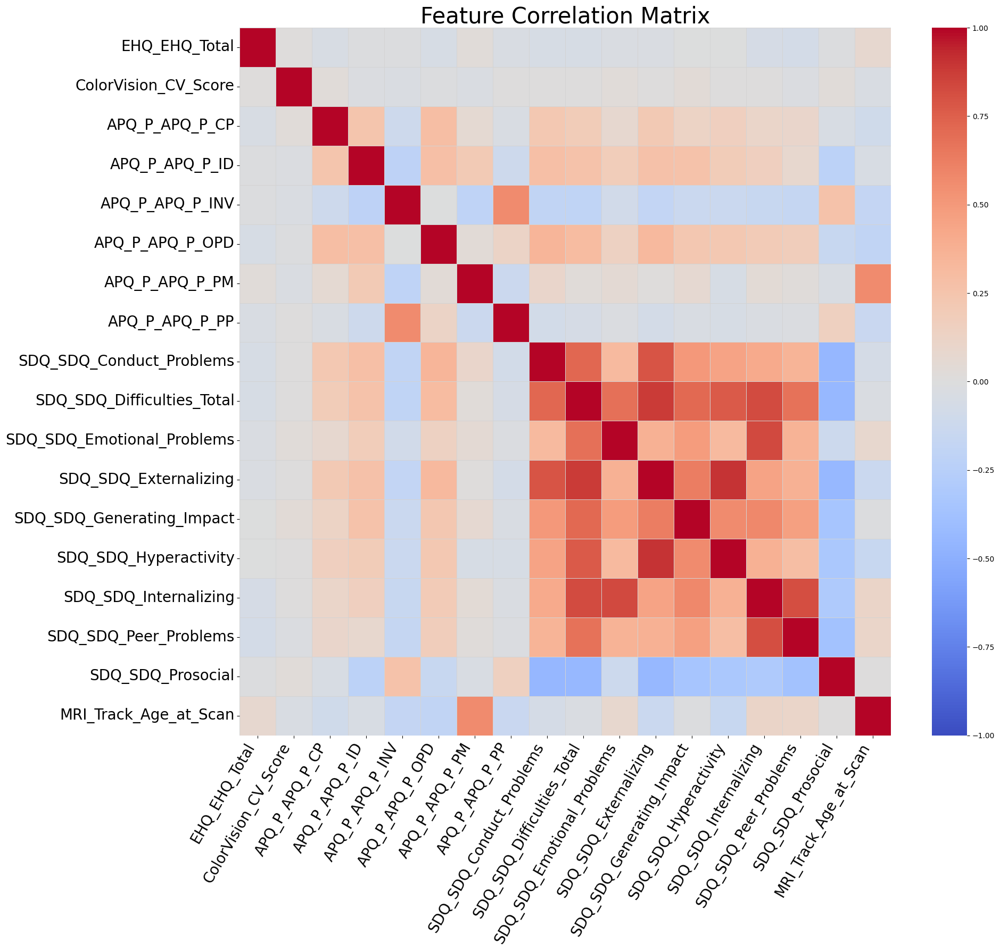

In [73]:
# visualize

plt.figure(figsize = (20,18))

sns.heatmap(
    correlation_matrix,
    annot = False, # set true to see values but it will be messy
    cmap = 'coolwarm',
    vmin=-1,
    vmax=1,
    linewidths = 0.5,
    linecolor = 'lightgrey',
    cbar = True
)

plt.title('Feature Correlation Matrix',fontsize=30)
plt.xticks(rotation = 60,ha='right',fontsize=20)
plt.yticks(fontsize=20)

plt.tight_layout()
plt.show()


### Summary of Feature Correlation Matrix (Pearson)
---

* **Major Finding: High Multicollinearity within SDQ Scales**
    * Many Strengths and Difficulties Questionnaire (SDQ) subscales are **highly correlated** with each other and with the `SDQ_Difficulties_Total` score. This indicates significant redundancy.
    * **Examples (|r| > 0.8):**
        * `SDQ_Difficulties_Total` vs `SDQ_Externalizing` (0.88) & `SDQ_Internalizing` (0.83).
        * `SDQ_Externalizing` vs `SDQ_Hyperactivity` (0.90).
        * `SDQ_Internalizing` vs `SDQ_Emotional_Problems` (0.83) & `SDQ_Peer_Problems` (0.82).
    * **Implication:** Using highly correlated SDQ subscales together in standard linear models is risky due to multicollinearity. Consider using total/summary scores, selecting specific subscales, or using techniques like PCA.

* **Other Notable Correlations:**
    * **Moderate:** Some moderate correlations exist *within* APQ scales (e.g., `APQ_P_APQ_P_INV` vs `APQ_P_APQ_P_PP`, r=0.56) and between `MRI_Track_Age_at_Scan` and `APQ_P_APQ_P_PM` (r=0.57). `SDQ_Prosocial` has moderate negative correlations with SDQ problem scales.
    * **Weak:** `EHQ_EHQ_Total` and `ColorVision_CV_Score` show weak correlations overall. Most cross-correlations between APQ and SDQ scales are weak to moderate.

* **Overall:** The most critical takeaway for modeling is the need to carefully manage the SDQ features to avoid multicollinearity issues.

---

## **Summary of Quantitative training dataset**

---

### 1. Dataset Overview

* **Shape:** 1213 rows (participants) and 21 columns.
* **Content:** Includes participant ID, EHQ (handedness), Color Vision score, APQ (parenting) subscales, SDQ (strengths/difficulties) subscales, MRI Age at Scan, and binary indicators for `ADHD_Outcome` and `Sex_F`.

### 2. Missing Data

* **Significant Issue:** `MRI_Track_Age_at_Scan` has substantial missing data (360 missing values, ~30% of rows). This requires careful handling (imputation or column removal).
* **Minor Issues:** Several other features (EHQ, ColorVision, APQ, SDQ) have a small number of missing values (9-23 each). These likely require simple imputation (e.g., **median**, given potential skewness).
* **Overall Impact:** 401 rows (~33%) contain at least one missing value, making listwise deletion (dropping rows) highly problematic due to excessive data loss.

### 3. Target Variable Analysis (`ADHD_Outcome` & `Sex_F`)

* **Relationship:** The two variables have a **weak, statistically significant negative correlation** (r ≈ -0.13).
* **Interpretation:** Suggests Males (`Sex_F=0`) have a slightly higher tendency towards `ADHD_Outcome=1` in this sample compared to Females (`Sex_F=1`).
* **Modeling Implication:** The weak correlation indicates the targets are largely independent; complex multi-output models focusing on target dependency are likely unnecessary.

### 4. Feature Relationships with Targets

* **Predicting `ADHD_Outcome`:**
    * **Strongest Associations:** `SDQ_Externalizing` and `SDQ_Hyperactivity` show strong positive linear correlations. Violin plots confirm clear distributional separation for these between ADHD/Non-ADHD groups.
    * **Medium Associations:** `SDQ_Difficulties_Total` and `SDQ_Generating_Impact` show medium positive linear correlations and clear distributional differences.
    * **Weak Associations:** Other SDQ scales (`Conduct`, `Emotional`, `Internalizing`, `Peer`, `Prosocial` [negative]) and several APQ scales (`CP`, `ID`, `INV`, `OPD`) show weak, but often significant, linear correlations. Violin plots show modest differences for these.
    * **No Significant Correlation:** `EHQ_Total`, `ColorVision_CV_Score`, `APQ_P_APQ_P_PM`, `APQ_P_APQ_P_PP`, and `MRI_Track_Age_at_Scan` show no significant linear correlation with `ADHD_Outcome`. Violin plots confirm minimal distributional difference for these (except perhaps minor trends for APQ).
* **Predicting `Sex_F`:**
    * Generally **weak or very weak significant linear correlations** observed with several features (e.g., `ColorVision`, some APQ, some SDQ).
    * Violin plots confirm **minimal distributional differences** between males and females for most variables. `Sex_F` appears difficult to predict well from these features alone.

### 5. Feature-Feature Relationships (Multicollinearity)

* **Major Concern:** **High multicollinearity exists within the SDQ scales.**
    * Many subscales (`Externalizing`, `Internalizing`, `Hyperactivity`, `Emotional`, `Peer`, `Conduct`) are highly correlated (`|r|` often > 0.7) with each other and with the `SDQ_Difficulties_Total` score.
    * Particularly high correlations (`|r| > 0.8`) exist between `Difficulties_Total` <-> `Externalizing`/`Internalizing`; `Externalizing` <-> `Hyperactivity`; `Internalizing` <-> `Emotional`/`Peer`.
* **Moderate Correlations:** Noted between `MRI_Track_Age_at_Scan` and `APQ_P_APQ_P_PM` (r=0.57) and within some APQ scales (e.g., `INV` vs `PP`, r=0.56).
* **Implication:** Including multiple highly correlated SDQ scales simultaneously in standard models (like linear/logistic regression) is problematic. Addressing this redundancy (e.g., using total scores, feature selection, PCA) is crucial.

### 6. Overall Implications for Modeling

-  **Missing Data Handling:** Address `MRI_Track_Age_at_Scan` (likely drop or advanced imputation) and perform minor imputation (likely median) for other features before training most models.
-  **Address SDQ Multicollinearity:** Do not include all SDQ subscales together naively in sensitive models. Choose summary scores, select a representative subset, or use dimensionality reduction (PCA).
-  **Feature Relevance (for ADHD_Outcome):** Focus on SDQ scales (especially Externalizing, Hyperactivity, Total) as primary predictors. APQ scales may offer secondary value. EHQ, ColorVision, and Age appear less relevant based on this analysis.
-  **Model Choice:** Given the largely independent targets, simpler multi-output strategies (like **independent models**) are likely sufficient if predicting both `ADHD_Outcome` and `Sex_F`.





---

# Model by quantitative dataset

**From the correlation analysis from above, we should use PCA to avoid multicollinearity between features.**


**However PCA cannot handle a lot of missing data, so we will drop `MRI_Track_Age_at_Scan` and inpute other features with missing data.**

**However we need to standardlize data before apply PCA.**



### **Why do we need scale our data before applying PCA?** 

---
**PCA finds the principal components (directions) that capture the maximum amount of variance in the data.**

**Thus PCA can be heavily influenced by features with larger variance.**

**And we could see from `describe` that our features std is not 1.**

**By scaling each features to have unit variance(std=1), all features can contribute equally to the PCA based on their correlation structure.** 

---

### The types of Feature scalers

---

**StandardScaler**: 
Transform each feature to have a mean of 0 and standard deviation of 1. 

`(x - mean) / std_dev`

**Sensitive to outlier.**

**Excellent for algorithms sensitive to feature variance, like PCA, linear regression, logistic regression, Support Vector Machine(SVMs), and neural network.**

**Preassumption: data is normally distributed**.

___

**MinMaxScaler**:
Rescale each feature into a fixed range, typically [0,1] or [-1,1].

`(x - min)/(max - min)`

**Useful when data needs to be in a specific bounded range.**

**No distribution assumption**

**Highly sensitive to outliers**

---
**RobustScaler**
Removes median and scales the data by the Interquartile Range (IQR,25th-75th percentile).

`(x-median) / IQR `

**Highly Robust to outliers**

**Not good at highly skewed data**

**Don't center data strictly=t at 0**

**No gurantee in unit variance**

---

**MaxAbsScaler**
Scale each feature by its maximum absolute value, bring the data into [-1,1] range.

**Not shift or center data.**

**Preserve the sparse datasets (with many zeros)**

**Not reduce the effects of outliers, it only linearly scales them down.**

---

### Why should we split the dataset before normalization?

When building a machine learning pipeline, it is important to **split the dataset into training and testing sets before applying normalization** (or any transformation like scaling, PCA, feature selection, etc.).

#### The key reasons are:

- **Avoid Data Leakage**:  
  If you normalize before splitting, the `StandardScaler` will compute the mean and standard deviation using *all* the data — including future unseen test data.  
  This leaks information from the test set into the training process, leading to unrealistically good model performance.

- **Simulate Real-world Conditions**:  
  In real-world deployment, your model will only have access to new unseen data, not the full dataset.  
  Therefore, **transformations should be learned only from training data**, and applied to test data **without retraining** the transformation.

- **Fair Evaluation**:  
  If the test set influences the training process, the evaluation metrics (accuracy, AUC, etc.) will be biased and not reflect true model generalization.

#### Correct order:

1. Impute missing values (data cleaning).
2. Split the dataset into training and testing sets.
3. Fit the scaler on the **training set only**.
4. Transform both the training and test sets using the fitted scaler.
5. Train the model on the scaled training set, and evaluate on the scaled test set.

---

**In short**:  
Always split **before** any data transformation that learns from data.  
This practice prevents data leakage and ensures a fair, realistic model evaluation.


--- 
## Base Model: Multioutput

In [74]:
# Create the df for modelling
# We need to drop the too much missing column to do PCA
df = pd.merge(df_q,df_s,on="participant_id",how="inner").drop(['MRI_Track_Age_at_Scan','participant_id'],axis=1)

In [75]:
# impute the missing values by its median
df = df.fillna(df.median())

In [76]:
# recheck 
df.isnull().sum()

EHQ_EHQ_Total                 0
ColorVision_CV_Score          0
APQ_P_APQ_P_CP                0
APQ_P_APQ_P_ID                0
APQ_P_APQ_P_INV               0
APQ_P_APQ_P_OPD               0
APQ_P_APQ_P_PM                0
APQ_P_APQ_P_PP                0
SDQ_SDQ_Conduct_Problems      0
SDQ_SDQ_Difficulties_Total    0
SDQ_SDQ_Emotional_Problems    0
SDQ_SDQ_Externalizing         0
SDQ_SDQ_Generating_Impact     0
SDQ_SDQ_Hyperactivity         0
SDQ_SDQ_Internalizing         0
SDQ_SDQ_Peer_Problems         0
SDQ_SDQ_Prosocial             0
ADHD_Outcome                  0
Sex_F                         0
dtype: int64

In [77]:
# create a combined strification label
# like 1 1 -> 1_1, so it exist 4 group in the combined label
stratify_col = df['ADHD_Outcome'].astype(str) + "_" + df['Sex_F'].astype(str)

#split train and test according to the 4 groups ratio
train, test = train_test_split(
    df,
    test_size=0.2,
    random_state = SEED,
    stratify = stratify_col
)


In [78]:
# Then we apply normalization on features only
target_cols = ['ADHD_Outcome', 'Sex_F']
feature_cols = [col for col in df.columns if col not in target_cols]

#initialize the scaler
scaler = StandardScaler()

#Fit on training data's features
train[feature_cols] = scaler.fit_transform(train[feature_cols])

In [79]:
# transform test features

test[feature_cols] = scaler.transform(test[feature_cols])

In [80]:
# split the train dataset
X_train = train[feature_cols]
y_train = train[target_cols]

#split the test dataset
X_test = test[feature_cols]
y_test = test[target_cols]

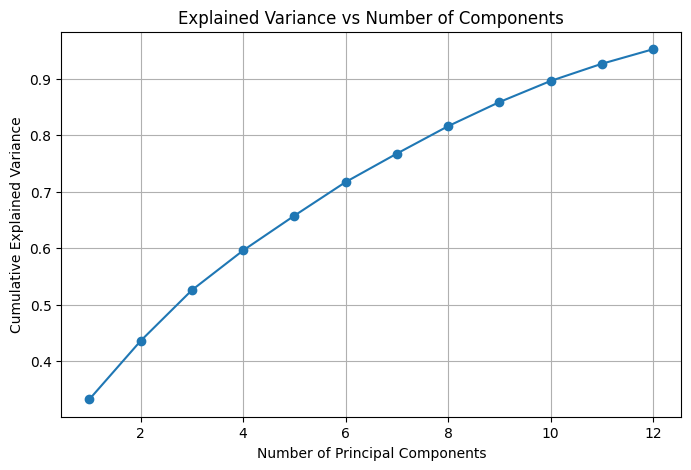

In [81]:
# Since we know some of our features are highly correlated,
# We need to apply PCA to get independant features
pca = PCA(n_components = 0.95) #keep 95 % varianc
# fit the model
pca.fit(X_train)
# Plot
plt.figure(figsize=(8,5))
plt.plot(range(1, len(pca.explained_variance_ratio_)+1), pca.explained_variance_ratio_.cumsum(), marker='o')
plt.xlabel('Number of Principal Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('Explained Variance vs Number of Components')
plt.grid(True)
plt.show()

In [82]:
# Apply to train and test data
X_train_pca = pca.transform(X_train)

X_test_pca = pca.transform(X_test)


In [83]:
# Then we apply it to the base model
# initialize and fit the model
model = MultiOutputClassifier(LGBMClassifier(random_state=42))
model.fit(X_train_pca,y_train)

[LightGBM] [Info] Number of positive: 664, number of negative: 306
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003186 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3060
[LightGBM] [Info] Number of data points in the train set: 970, number of used features: 12
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.684536 -> initscore=0.774697
[LightGBM] [Info] Start training from score 0.774697
[LightGBM] [Info] Number of positive: 333, number of negative: 637
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000154 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3060
[LightGBM] [Info] Number of data points in the train set: 970, number of used features: 12
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.343299 -> initscore=-0.648627
[LightGBM] [Info] Start training from score -0.648627


MultiOutputClassifier(estimator=LGBMClassifier(random_state=42))

In [84]:
# Get the prediction
y_pred = model.predict(X_test_pca)

In [85]:
def f1_weighted(y_true, y_pred):
    """
    Custom F1 weighted score:
    - Weighs female ADHD cases double in ADHD_Outcome
    - Normal F1 score for Sex_F
    - Returns averaged score
    """
    # Create sample weights: Female ADHD cases get 2, others get 1
    weights = np.logical_and(y_true['ADHD_Outcome'] == 1, y_true['Sex_F'] == 1).astype(int) + 1

    # F1 Score for ADHD_Outcome (with weights)
    f1_adhd = f1_score(y_true['ADHD_Outcome'], y_pred[:, 0], sample_weight=weights)

    # F1 Score for Sex_F (without weights)
    f1_sex = f1_score(y_true['Sex_F'], y_pred[:, 1])

    # Average them
    final_score = (f1_adhd + f1_sex) / 2

    return final_score

In [86]:
# check weighted f1 score

f1_score_weighted = f1_weighted(y_test,y_pred)

print(f1_score_weighted)

0.6599730373714572


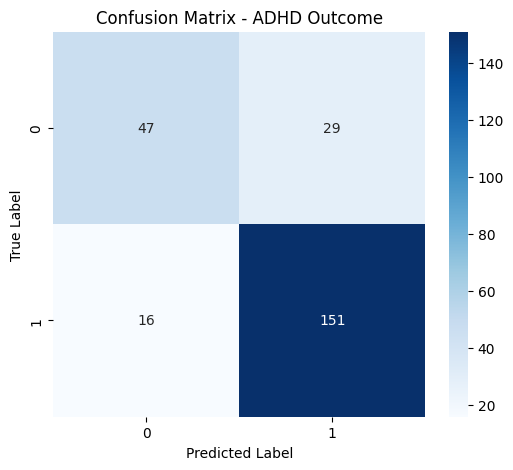

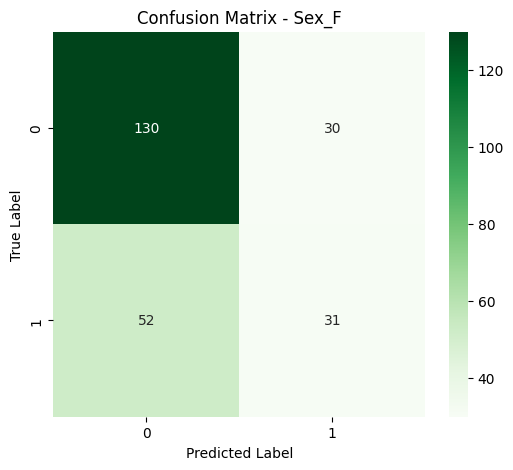

In [87]:
# Confusion matrix for ADHD Outcome
cm_adhd = confusion_matrix(y_test['ADHD_Outcome'], y_pred[:, 0])

# Confusion matrix for Sex_F
cm_sex = confusion_matrix(y_test['Sex_F'], y_pred[:, 1])

# Plot confusion matrix for ADHD Outcome
plt.figure(figsize=(6,5))
sns.heatmap(cm_adhd, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix - ADHD Outcome')
plt.show()

# Plot confusion matrix for Sex_F
plt.figure(figsize=(6,5))
sns.heatmap(cm_sex, annot=True, fmt='d', cmap='Greens')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix - Sex_F')
plt.show()

---
**Above is the baseline model. The score is terrible and we need to try other model and parameters.**



### Confusion Matrix Interpretation

#### ADHD Outcome

|   | Predicted 0 | Predicted 1 |
|:--|:--|:--|
| **True 0** (Non-ADHD) | 47 (True Negative) | 29 (False Positive) |
| **True 1** (ADHD) | 16 (False Negative) | 151 (True Positive) |

- **Recall (detecting ADHD):** ≈ 90.4%
- **Precision (predicting ADHD correctly):** ≈ 83.9%
- **Comment:** Model is good at detecting ADHD, with high sensitivity and reasonable precision.

---

#### Sex_F (Female)

|   | Predicted 0 | Predicted 1 |
|:--|:--|:--|
| **True 0** (Male) | 130 (True Negative) | 30 (False Positive) |
| **True 1** (Female) | 52 (False Negative) | 31 (True Positive) |

- **Recall (detecting females):** ≈ 37.3%
- **Precision (predicting females correctly):** ≈ 50.8%
- **Comment:** The model struggles to identify females correctly, with low sensitivity. Many females are misclassified as males.

---

#### Overall Observations:
- ADHD detection is **strong**, particularly in recall.
- Female detection is **weak**, consistent with the general difficulty of detecting ADHD in females.
- If the main goal is to **catch ADHD-Female cases**, further adjustments (e.g., threshold tuning, special loss weighting) are recommended.


## ADHD Prediction only model 


In [88]:
def try_classifiers(
    X_train, X_test, y_train, y_test, classifiers, cv=5, random_state=SEED
):
    """
    Train & evaluate multiple classifiers with stratified k-fold CV
    and evaluate once on hold-out test set.

    Parameters
    ----------
    X_train, X_test, y_train, y_test : array-like
        Training and testing sets.
    classifiers : dict
        {model name: model instance}
    cv : int
        Number of folds for StratifiedKFold.
    random_state : int
        Random seed for reproducibility.

    Returns
    -------
    pd.DataFrame
        Model name, CV mean ± std, and Test set scores.
    """

    skf = StratifiedKFold(n_splits=cv, shuffle=True, random_state=random_state)
    
    scoring = {
        "acc": make_scorer(accuracy_score),
        "prec": make_scorer(precision_score, zero_division=0),
        "rec": make_scorer(recall_score, zero_division=0),
        "f1": make_scorer(f1_score, zero_division=0),
    }

    records = []

    for name, clf in classifiers.items():
        # Cross-validation on training data
        cv_res = cross_validate(
            clf, X_train, y_train,
            cv=skf, scoring=scoring, n_jobs=-1, return_train_score=False
        )

        # Fit on all training data and evaluate on hold-out test set
        clf.fit(X_train, y_train)
        y_pred = clf.predict(X_test)

        records.append({
            "Model": name,
            "CV Accuracy": f"{cv_res['test_acc'].mean():.4f} ± {cv_res['test_acc'].std():.4f}",
            "CV Precision": f"{cv_res['test_prec'].mean():.4f} ± {cv_res['test_prec'].std():.4f}",
            "CV Recall": f"{cv_res['test_rec'].mean():.4f} ± {cv_res['test_rec'].std():.4f}",
            "CV F1": f"{cv_res['test_f1'].mean():.4f} ± {cv_res['test_f1'].std():.4f}",
            "Test Accuracy": accuracy_score(y_test, y_pred),
            "Test Precision": precision_score(y_test, y_pred, zero_division=0),
            "Test Recall": recall_score(y_test, y_pred, zero_division=0),
            "Test F1": f1_score(y_test, y_pred, zero_division=0),
        })

    return pd.DataFrame(records)

In [89]:
my_classifiers = {
    "Logistic Regression": LogisticRegression(),
    "Random Forest": RandomForestClassifier(),
    "Decision Tree": DecisionTreeClassifier(),
    "K-Nearest Neighbors": KNeighborsClassifier(),
    "Gaussian NB": GaussianNB(),
    "Support Vector Classifier": SVC(probability=True),
    "XGBoost": XGBClassifier(use_label_encoder=False, eval_metric='logloss'),
    "LightGBM": LGBMClassifier(force_col_wise=True,verbose=-1),
    "CatBoost": CatBoostClassifier(verbose=0)
}

In [90]:
# 1) Merge & drop unwanted cols
df = (
    df_q
    .merge(df_s, on="participant_id", how="inner")
    .drop(['participant_id','MRI_Track_Age_at_Scan'], axis=1)
)

# 2) Impute missing features by median
df[df.columns] = SimpleImputer(strategy='median').fit_transform(df)

# 3) Train/test split (stratify only on ADHD_Outcome)
train, test = train_test_split(
    df,
    test_size=0.2,
    random_state=SEED,
    stratify=df['ADHD_Outcome']
)

# 4) Define target & features
target_col   = 'ADHD_Outcome'
feature_cols = [c for c in df.columns if c != target_col]

# 5) Scale
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(train[feature_cols])
X_test_scaled  = scaler.transform(test[feature_cols])

# 6) PCA
pca = PCA(n_components=0.95, random_state=SEED)
X_train_pca = pca.fit_transform(X_train_scaled)
X_test_pca  = pca.transform(X_test_scaled)

# 7) Extract y
y_train = train[target_col].values
y_test  = test[target_col].values


In [91]:
# 8) Apply
result_df = try_classifiers(X_train_pca,X_test_pca,y_train,y_test,my_classifiers)

In [92]:
result_df.sort_values(by="Test F1", ascending=False)

,Model,CV Accuracy,CV Precision,CV Recall,CV F1,Test Accuracy,Test Precision,Test Recall,Test F1
0,Logistic Regression,0.7990 ± 0.0193,0.8302 ± 0.0102,0.8887 ± 0.0313,0.8582 ± 0.0155,0.777778,0.807692,0.885542,0.844828
6,XGBoost,0.7701 ± 0.0162,0.8072 ± 0.0136,0.8737 ± 0.0249,0.8389 ± 0.0124,0.753086,0.804598,0.843373,0.823529
8,CatBoost,0.7907 ± 0.0116,0.8152 ± 0.0150,0.8992 ± 0.0211,0.8549 ± 0.0081,0.740741,0.775401,0.873494,0.821530
1,Random Forest,0.7856 ± 0.0148,0.7999 ± 0.0148,0.9173 ± 0.0213,0.8543 ± 0.0102,0.736626,0.765625,0.885542,0.821229
5,Support Vector Classifier,0.7887 ± 0.0156,0.8093 ± 0.0104,0.9053 ± 0.0272,0.8544 ± 0.0124,0.736626,0.765625,0.885542,0.821229
7,LightGBM,0.7804 ± 0.0203,0.8114 ± 0.0222,0.8872 ± 0.0293,0.8470 ± 0.0141,0.732510,0.779006,0.849398,0.812680
3,K-Nearest Neighbors,0.7567 ± 0.0281,0.7950 ± 0.0157,0.8692 ± 0.0358,0.8302 ± 0.0216,0.720165,0.763441,0.855422,0.806818
4,Gaussian NB,0.7876 ± 0.0191,0.8312 ± 0.0069,0.8662 ± 0.0320,0.8480 ± 0.0161,0.711934,0.769663,0.825301,0.796512
2,Decision Tree,0.6948 ± 0.0231,0.7765 ± 0.0059,0.7789 ± 0.0427,0.7772 ± 0.0228,0.654321,0.756250,0.728916,0.742331


#### **`Logistic Regression` behave the best at Test F1 (0.84)**

#### With PCA first model selections in ADHD prediction

#### Interpret:
Metric | Meaning
:--|:--|
Accuracy | Overall percentage of correct predictions.
Precision | When the model predicts ADHD (positive), how often is it correct?
Recall (Sensitivity) | Of all true ADHD cases, how many were caught?
F1 Score | Balance between Precision and Recall. High F1 means good overall detection especially when you care about both catching positives and avoiding too many false alarms.

#### `Logistic Regression` could be applied with hyperparameter searching.

In [93]:
def tune_models(X_train, y_train, models_params, scoring_metric='f1'):
    """
    Tune multiple classifiers using GridSearchCV and return the best one.

    Parameters
    ----------
    X_train, y_train : array-like
        Training data
    models_params : dict
        Dictionary {model name: (model instance, param_grid)}
    scoring_metric : str
        Scoring metric to optimize (default = 'f1')

    Returns
    -------
    results_df : pd.DataFrame
        Each model's best parameters and CV score.
    best_model : sklearn estimator
        The best-trained model (with highest CV score).
    """

    best_models = {}
    records = []

    for name, (model, param_grid) in models_params.items():
        grid = GridSearchCV(
            model,
            param_grid,
            cv=5,
            scoring=scoring_metric,
            verbose=0,
            n_jobs=1  # safe for Kaggle
        )
        grid.fit(X_train, y_train)

        best_models[name] = grid.best_estimator_
        records.append({
            'Model': name,
            'Best F1 Score': grid.best_score_,
            'Best Parameters': grid.best_params_
        })

    # Create results DataFrame
    results_df = pd.DataFrame(records)

    # Find the best model overall (highest CV F1 score)
    best_row = results_df.loc[results_df['Best F1 Score'].idxmax()]
    best_model = best_models[best_row['Model']]

    return results_df, best_model

In [94]:
# set the model parameters
logreg_param_grid = [
    # ------ L2 penalty (regular ridge-style) ------
    {
        "penalty": ["l2"],
        "C": [0.01, 0.1, 1, 10, 100],
        "solver": ["lbfgs", "saga"],
    },
    # ------ No penalty ----------------------------
    {
        "penalty": [None],
        "solver": ["lbfgs", "saga"],
    },
    # ------ L1 penalty (lasso) --------------------
    {
        "penalty": ["l1"],
        "C": [0.01, 0.1, 1, 10, 100],
        "solver": ["saga"],
    },
    # ------ Elastic-net ---------------------------
    {
        "penalty": ["elasticnet"],
        "C": [0.01, 0.1, 1, 10, 100],
        "l1_ratio": [0.25, 0.5, 0.75],
        "solver": ["saga"],
    },
]



models_params = {
    "Logistic Regression": (
        LogisticRegression(max_iter=2000),  # long enough for convergence
        logreg_param_grid
    )
}



In [95]:
results_tune, best_model_adhd = tune_models(X_train_pca, y_train, models_params)

In [96]:
results_tune

,Model,Best F1 Score,Best Parameters
0,Logistic Regression,0.860156,"{'C': 0.01, 'penalty': 'l2', 'solver': 'lbfgs'}"


In [97]:
# check prediction score of best_model_adhd

print(f1_score(y_test, best_model_adhd.predict(X_test_pca), zero_division=0))

0.8314606741573033


#### The best paramaters for CV in logistic_Regression

| Model               | Best F1 Score | Best Parameters                                 |
|:--------------------|--------------:|:------------------------------------------------|
| Logistic Regression |       0.860156 | `{'C': 0.01, 'penalty': 'l2', 'solver': 'lbfgs'}` |

#### With F1 `0.860156` in Cross Validation on Train , F1 `0.8314606741573033` in Test

### Over tuning can lead to overfitting sometimes.
#### Tuning can improve the score of CV in the training dataset, however it might not perform as well as in Test Dataset.

## Experimental Test on the feature selection

In [98]:
df = df_q.merge(df_s, on='participant_id', how='inner')

target_col = 'ADHD_Outcome'

# only the Strong ADHD‐related features
cols1 = [
    "SDQ_SDQ_Conduct_Problems",
    "SDQ_SDQ_Difficulties_Total",
    "SDQ_SDQ_Externalizing",
    "SDQ_SDQ_Generating_Impact",
    "SDQ_SDQ_Hyperactivity",
]

# union of Strong + Moderate features
cols2 = cols1 + [
    "SDQ_SDQ_Emotional_Problems",
    "SDQ_SDQ_Internalizing",
]

# union of Strong + Moderate + Weak features
cols3 = cols2 + [
    "APQ_P_APQ_P_ID",   # Inconsistent_Discipline
    "APQ_P_APQ_P_INV",  # Parental_Involvement
    "APQ_P_APQ_P_PM",   # Poor_Monitoring
    "SDQ_SDQ_Peer_Problems",
    "SDQ_SDQ_Prosocial",
]

# complete columns Strong + Moderate + Weak + not_siginificant without MRI_Track_Age_at_Scan
cols4 = ['EHQ_EHQ_Total', 'ColorVision_CV_Score', 'APQ_P_APQ_P_CP', 'APQ_P_APQ_P_ID', 'APQ_P_APQ_P_INV', 'APQ_P_APQ_P_OPD', 'APQ_P_APQ_P_PM', 'APQ_P_APQ_P_PP',
       'SDQ_SDQ_Conduct_Problems', 'SDQ_SDQ_Difficulties_Total', 'SDQ_SDQ_Emotional_Problems', 'SDQ_SDQ_Externalizing', 'SDQ_SDQ_Generating_Impact', 'SDQ_SDQ_Hyperactivity', 'SDQ_SDQ_Internalizing',
       'SDQ_SDQ_Peer_Problems', 'SDQ_SDQ_Prosocial']

feature_sets = {
    'strong':         cols1,
    'strong+moderate': cols2,
    'all (strong+moderate+weak)': cols3,
    'complete columns' : cols4
}



In [99]:
def evaluate_strategies(
    df: pd.DataFrame,
    feature_sets: dict,
    target_col: str,
    classifiers: dict = None,
    missing_strategies: list = ['drop', 'median'],
    test_size: float = 0.2,
    cv_folds: int = 5,
    random_state: int = SEED,
    pca_variance: float = 0.95
) -> pd.DataFrame:
    """
    Compare missing‐value strategies (“drop” vs “median”) across
    feature‐sets × classifiers × PCA on/off × normalization on/off.
    
    Returns a DataFrame with columns:
      ['strategy','features','classifier','normalized','pca',
       'cv_accuracy','cv_f1','test_accuracy','test_f1']
    """
    if classifiers is None:
        classifiers = {
            'LogisticRegression': LogisticRegression(max_iter=1000, random_state=random_state),
            'SVC': SVC(random_state=random_state)
        }

    records = []
    for strategy in missing_strategies:
        # Prepare X_full, y_full depending on strategy
        if strategy == 'drop':
            # drop rows with ANY missing in features+target
            df_pre = df.dropna(subset=sum(feature_sets.values(), []) + [target_col])
            X_full = {name: df_pre[feats].values for name, feats in feature_sets.items()}
            y_full = df_pre[target_col].values
        elif strategy == 'median':
            # drop only missing target; features imputed later
            df_pre = df.dropna(subset=[target_col])
            X_full = {name: df_pre[feats].values for name, feats in feature_sets.items()}
            y_full = df_pre[target_col].values
        else:
            raise ValueError(f"Unknown strategy: {strategy}")

        # single split for hold‐out
        for feat_name, feats in feature_sets.items():
            X = X_full[feat_name]
            y = y_full
            X_train, X_test, y_train, y_test = train_test_split(
                X, y, test_size=test_size, stratify=y, random_state=random_state
            )
            cv_split = StratifiedKFold(n_splits=cv_folds, shuffle=True, random_state=random_state)

            for clf_name, clf in classifiers.items():
                for do_norm, do_pca in itertools.product([False, True], [False, True]):
                    steps = []
                    if strategy == 'median':
                        steps.append(('imputer', SimpleImputer(strategy='median')))
                    # (for 'drop' we already removed missing → no imputer)
                    if do_norm:
                        steps.append(('scaler', StandardScaler()))
                    if do_pca:
                        steps.append(('pca', PCA(n_components=pca_variance, random_state=random_state)))
                    steps.append(('clf', clf))
                    pipe = Pipeline(steps)

                    # cross‐validate on train
                    cv = cross_validate(
                        pipe, X_train, y_train,
                        cv=cv_split,
                        scoring=['accuracy','f1'],
                        return_train_score=False
                    )
                    cv_acc = cv['test_accuracy'].mean()
                    cv_f1  = cv['test_f1'].mean()

                    # final fit & hold‐out test
                    pipe.fit(X_train, y_train)
                    y_pred = pipe.predict(X_test)
                    test_acc = accuracy_score(y_test, y_pred)
                    test_f1  = f1_score(y_test, y_pred, average='binary')

                    records.append({
                        'strategy':      strategy,
                        'features':      feat_name,
                        'classifier':    clf_name,
                        'normalized':    do_norm,
                        'pca':           do_pca,
                        'cv_accuracy':   cv_acc,
                        'cv_f1':         cv_f1,
                        'test_accuracy': test_acc,
                        'test_f1':       test_f1
                    })

    return pd.DataFrame(records)

In [100]:
results_cmp = evaluate_strategies(
    df,
    feature_sets,
    target_col='ADHD_Outcome',
    classifiers={
        'LogisticRegression': LogisticRegression(max_iter=1000, random_state=SEED),
        'SVC': SVC(random_state=SEED)
    },
    missing_strategies=['drop','median'],
    test_size=0.2,
    cv_folds=5,
    random_state=SEED,
    pca_variance=0.95
)

In [101]:
results_cmp.sort_values(['strategy','test_f1','test_accuracy'],ascending=False)

,strategy,features,classifier,normalized,pca,cv_accuracy,cv_f1,test_accuracy,test_f1
48,median,all (strong+moderate+weak),LogisticRegression,False,False,0.802062,0.861755,0.786008,0.853107
50,median,all (strong+moderate+weak),LogisticRegression,True,False,0.803093,0.862360,0.781893,0.850704
51,median,all (strong+moderate+weak),LogisticRegression,True,True,0.802062,0.861308,0.781893,0.850704
43,median,strong+moderate,LogisticRegression,True,True,0.810309,0.867357,0.781893,0.849858
32,median,strong,LogisticRegression,False,False,0.809278,0.866730,0.777778,0.847458
34,median,strong,LogisticRegression,True,False,0.813402,0.869624,0.777778,0.847458
35,median,strong,LogisticRegression,True,True,0.812371,0.868783,0.777778,0.847458
59,median,complete columns,LogisticRegression,True,True,0.801031,0.860316,0.777778,0.847458
33,median,strong,LogisticRegression,False,True,0.808247,0.865731,0.777778,0.846591
37,median,strong,SVC,False,True,0.797938,0.861066,0.769547,0.844444


**Observe**:

| strategy | features                        | classifier           | normalized | pca   | cv_accuracy | cv_f1   | test_accuracy | test_f1   |
| -------- | ------------------------------- | -------------------- | ---------- | ----- | ----------- | ------- | ------------- | --------- |
| median   | all (strong+moderate+weak)      | LogisticRegression   | False      | False | 0.802062    | 0.861755| 0.786008      | 0.853107  |
| median   | all (strong+moderate+weak)      | LogisticRegression   | True       | False | 0.803093    | 0.862360| 0.781893      | 0.850704  |
| median   | all (strong+moderate+weak)      | LogisticRegression   | True       | True  | 0.802062    | 0.861308| 0.781893      | 0.850704  |
| drop     | all (strong+moderate+weak)      | LogisticRegression   | True       | False | 0.796152    | 0.858406| 0.831897      | 0.885630  |
| drop     | strong                          | SVC                  | True       | False | 0.793990    | 0.859070| 0.827586      | 0.884393  |
| drop     | strong                          | SVC                  | True       | True  | 0.798303    | 0.862153| 0.827586      | 0.884393  |
| drop     | strong                          | LogisticRegression   | True       | True  | 0.802633    | 0.863318| 0.827586      | 0.882353  |
| drop     | all (strong+moderate+weak)      | LogisticRegression   | False      | False | 0.795071    | 0.857529| 0.827586      | 0.882353  |
| drop     | strong+moderate                 | LogisticRegression   | True       | True  | 0.793990    | 0.857353| 0.827586      | 0.881657  |



### The “raw” pipeline (no norm, no PCA) actually generalizes best to **unseen data here.**

### Best Configuration

| | |
|:--|:--|
Strategy:    | median as imputer (Because we can't drop the test data with missing)
Features:     | ['SDQ_SDQ_Conduct_Problems', 'SDQ_SDQ_Difficulties_Total', 'SDQ_SDQ_Externalizing', 'SDQ_SDQ_Generating_Impact', 'SDQ_SDQ_Hyperactivity', 'SDQ_SDQ_Emotional_Problems', 'SDQ_SDQ_Internalizing', 'APQ_P_APQ_P_ID', 'APQ_P_APQ_P_INV', 'APQ_P_APQ_P_PM', 'SDQ_SDQ_Peer_Problems', 'SDQ_SDQ_Prosocial']|
Model:        |Logistic Regression
Preprocess:   |None
CV:           |Accuracy ≈ 0.802 / F₁ ≈ 0.861755
Test:         |Accuracy ≈ 0.786008 / F₁ ≈ 0.853107


#### However considering we need to apply the same transform on train data to the test dataset, and we need to predict exactly every single test data even if it has missing.
#### We need **Imputation as our strategy** even if it perform a little loose.

## Best model for ADHD

In [102]:
# === 1. Merge data ===
# Combine your questionnaires and scores
df = df_q.merge(df_s, on='participant_id', how='inner')

# === 2. Define target and features ===
target_col = 'ADHD_Outcome'
feature_cols = [
    'SDQ_SDQ_Conduct_Problems',
    'SDQ_SDQ_Difficulties_Total',
    'SDQ_SDQ_Externalizing',
    'SDQ_SDQ_Generating_Impact',
    'SDQ_SDQ_Hyperactivity',
    'SDQ_SDQ_Emotional_Problems',
    'SDQ_SDQ_Internalizing',
    'APQ_P_APQ_P_ID',
    'APQ_P_APQ_P_INV',
    'APQ_P_APQ_P_PM',
    'SDQ_SDQ_Peer_Problems',
    'SDQ_SDQ_Prosocial'
]

X = df[feature_cols]
y = df[target_col]

# === 3. Build the pipeline ===
# - Imputer fills any missing values in new data with the training medians
# - Scaler standardizes features
# - LogisticRegression uses your chosen hyperparameters
pipeline = Pipeline([
    ('imputer', SimpleImputer(strategy='median')),
    ('scaler',  StandardScaler()),
    ('clf',     LogisticRegression(
                     C=0.01,
                     penalty='l2',
                     solver='lbfgs',
                     max_iter=1000,
                     random_state=SEED
                 ))
])

# === 4. Train on the *entire* dataset ===
pipeline.fit(X, y)

# === 5. Save the trained model ===
# Later you can load it with: model = joblib.load('adhd_logreg_model.joblib')
joblib.dump(pipeline, 'adhd_logreg_model.joblib')


['adhd_logreg_model.joblib']

# Understanding the Funtional Metric Dataset

> Functional connectivity, which is a measure that attempts to summarize how different brain regions may interact with each other, is a vital part of brain imaging.

This dataset represents functional connectivity (FC) metrics. 

FC measures the statistical dependencies (often correlations) between the activity signals of different brain regions over time, typically measured using resting-state functional MRI (rs-fMRI). 

Essentially, it maps how brain areas' activities fluctuate together, indicating potential interactions or networks.

For a **200X200** matrix, there are (200*199)/2 = 19900 unique connections( excluding the diagonal). 

According to the name of the dataset, its correlation is Pearsonr (linear relationships) between areas.

We can understand as each features in the dataset describe how two areas of brain is interacting, and we mesure it between (-1,1).

In [103]:
# create the dataframe with target
df = df_m.merge(df_s,on='participant_id',how='inner').drop('participant_id',axis=1)

In [104]:
# check the shape
df.shape

(1213, 19902)

In [105]:
# check the missing
# since two mnay features we use second sum to see if exist 
df.isnull().sum().sum()

0

In [106]:
df.columns

Index(['0throw_1thcolumn', '0throw_2thcolumn', '0throw_3thcolumn', '0throw_4thcolumn', '0throw_5thcolumn', '0throw_6thcolumn', '0throw_7thcolumn', '0throw_8thcolumn', '0throw_9thcolumn',
       '0throw_10thcolumn',
       ...
       '195throw_198thcolumn', '195throw_199thcolumn', '196throw_197thcolumn', '196throw_198thcolumn', '196throw_199thcolumn', '197throw_198thcolumn', '197throw_199thcolumn', '198throw_199thcolumn',
       'ADHD_Outcome', 'Sex_F'],
      dtype='object', length=19902)

In [107]:
feature_cols = [col for col in df.columns if col not in ['ADHD_Outcome', 'Sex_F']]

In [108]:
# create dictionary { (throw, column) : original_name }

throw_column_map = {}

for col in df.columns:
    match = re.match(r'(\d+)throw_(\d+)thcolumn',col)
    if match:
        throw = int(match.group(1))
        column = int(match.group(2))
        throw_column_map[(throw,column)] = col

In [109]:
# compute the mean for each group
adhd_female_mean = df[(df['ADHD_Outcome'] == 1) & (df['Sex_F'] == 1)][feature_cols].mean()
adhd_male_mean = df[(df['ADHD_Outcome'] == 1) & (df['Sex_F'] == 0)][feature_cols].mean()
other_female_mean = df[(df['ADHD_Outcome'] == 0) & (df['Sex_F'] == 1)][feature_cols].mean()
other_male_mean = df[(df['ADHD_Outcome'] == 0) & (df['Sex_F'] == 0)][feature_cols].mean()

In [110]:
def build_feature_matrix(
    row,
    throw_column_map=throw_column_map,
    fill_value=np.nan,
    matrix_size=(200, 200)
):
    """
    Build a (throw, column) matrix from one sampled row or mean vector,
    symmetrize it, and set the diagonal to 1.

    Parameters:
    - row: DataFrame (1 row) or Series (mean vector)
    - throw_column_map: dict {(throw, column): original column name}
    - fill_value: value to fill missing entries (default np.nan)
    - matrix_size: tuple (n_throws, n_columns)

    Returns:
    - A 2D NumPy array representing the symmetric feature matrix
      with 1s on the diagonal.
    """
    # 1) Initialize with fill_value
    matrix = np.full(matrix_size, fill_value, dtype=float)

    # 2) Populate
    for (throw, column), col_name in throw_column_map.items():
        if col_name in row.index:
            value = row[col_name]
            if isinstance(value, np.ndarray):
                value = value[0]
            matrix[throw, column] = value

    # 3) Symmetrize:
    #    Wherever matrix is NaN but its transpose has a value, copy that over.
    #    Then average the two halves to handle any non-NaN / non-NaN pairs.
    #    This also leaves pure-NaN pairs as NaN.
    trans = matrix.T
    # Copy non-NaN from trans into matrix where matrix is NaN
    matrix = np.where(np.isnan(matrix) & ~np.isnan(trans), trans, matrix)
    # Now average the two halves
    matrix = (matrix + matrix.T) / 2

    # 4) Diagonal = 1
    np.fill_diagonal(matrix, 1.0)

    return matrix

In [111]:
# apply 
adhd_female_matrix=build_feature_matrix(adhd_female_mean)

adhd_male_matrix = build_feature_matrix(adhd_male_mean)

other_female_matrix = build_feature_matrix(other_female_mean)

other_male_matrix = build_feature_matrix(other_male_mean)

In [112]:
# create diff matrix
# female group, adhd vs non-adhd
diff_ADHD_vs_Other_F  = adhd_female_matrix  - other_female_matrix
# male group adhd vs non-adhd
diff_ADHD_vs_Other_M  = adhd_male_matrix    - other_male_matrix
# adhd group female vs male
diff_Female_vs_Male_A = adhd_female_matrix  - adhd_male_matrix
# non-adhd group female vas male
diff_Female_vs_Male_O = other_female_matrix - other_male_matrix


## Heatmap for the difference of subgroups' mean

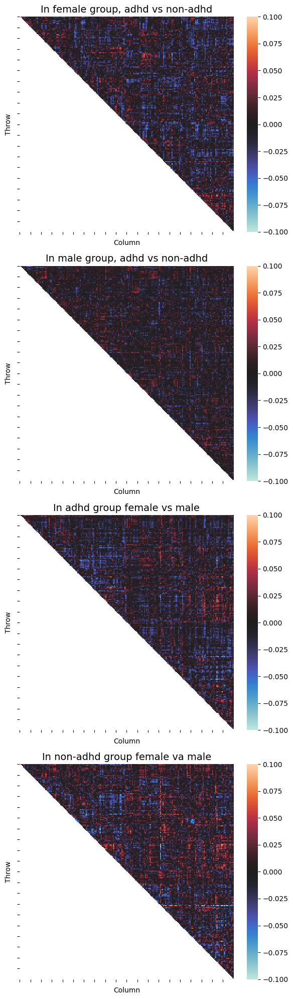

In [113]:
fig, axes = plt.subplots(4, 1, figsize=(6, 20))

# Set each subplot manually
for ax, (matrix, title) in zip(
    axes.flatten(),
    [
        (diff_ADHD_vs_Other_F, 'female group, adhd vs non-adhd'),
        (diff_ADHD_vs_Other_M, 'male group, adhd vs non-adhd'),
        (diff_Female_vs_Male_A, 'adhd group female vs male'),
        (diff_Female_vs_Male_O, 'non-adhd group female va male')
    ]
):
    # Mask
    mask = np.tril(np.ones_like(matrix, dtype=bool))
    
    # Plot directly onto the given ax
    sns.heatmap(
        matrix,
        mask=mask,
        square=False,
        linecolor='grey',
        center=0,
        ax=ax,
        vmin = - 0.1,
        vmax = 0.1
    )
    ax.set_title(f"In {title}", fontsize=14)
    ax.set_xlabel("Column", fontsize = 10)
    ax.set_ylabel("Throw",fontsize = 10)
    ax.set_xticks(np.arange(0, 200, 10))
    ax.set_yticks(np.arange(0, 200, 10))

plt.tight_layout()
plt.show()


#### What is it:
-- **Each heatmap shows the difference in mean correlation strength between pairs of brain regions for specific group comparisons.**

-- **Red areas = the first group has stronger connectivity.**

-- **Blue areas = the second group has stronger connectivity.**

-- **White areas = very little difference.**

#### Observe:

**The difference is strong in connectivity across sub-groups, widespread distributed with small magnitude.**

**If we set a threshold, we could see some potential sparsities, which shows the pattern of significant differences unlikely to be due to chance.)**

---

## Network plot with difference between sub groups

### Terms:
- ##### **Node**: represents one brain region (we have 200 of them, indexed 0…199).  
- ##### **Edge**: represents a connection between two regions.  In our case, we include an edge only if the absolute mean‐difference in correlation (_r_) between groups exceeds a threshold _t_.  
- ##### **Community**: a cluster of nodes more densely connected among themselves than to the rest of the graph.  Communities often correspond to functional subnetworks in the brain.
- ##### **Community Detection with Louvain**: The Louvain method seeks to maximize modularity Q, a measure of how well the partition divides the graph into dense modules.
  - High modularity (closer to 1) means strong community structure.

  - Low modularity (closer to 0) means weak or fragmented structure.


In [114]:
def build_connectivity_graph_plotly_density(matrix,
                                            density=0.05,
                                            title="Functional Connectivity Graph"):
    """
    Build and plot an interactive connectivity graph using Plotly,
    keeping the top `density` fraction of edges by absolute weight,
    and coloring nodes by community structure (Louvain method).

    Parameters:
    - matrix: 2D NumPy array (e.g., a correlation or difference matrix), square of size N×N.
    - density: fraction of all possible edges to keep (0 < density <= 1).
    - title: title for the graph.
    """
    import numpy as np
    import networkx as nx
    import plotly.graph_objects as go
    import plotly.express as px
    from community import community_louvain  # pip install python-louvain if needed

    # --- 1. Validate input ---
    if matrix is None:
        print("No matrix provided.")
        return
    if not isinstance(matrix, np.ndarray) or matrix.ndim != 2:
        print("Input 'matrix' must be a 2D NumPy array.")
        return
    if matrix.shape[0] != matrix.shape[1]:
        print(f"Warning: Matrix is not square {matrix.shape} – node labels may be confusing.")
    n_nodes = matrix.shape[0]

    # --- 2. Compute absolute weights and cutoff ---
    # Gather all unique abs(matrix[i,j]) for i<j, ignoring NaNs
    abs_weights = [
        abs(matrix[i, j])
        for i in range(n_nodes)
        for j in range(i + 1, n_nodes)
        if not np.isnan(matrix[i, j])
    ]
    n_possible = len(abs_weights)
    n_keep = max(1, int(np.floor(n_possible * density)))
    # Sort descending and pick the nth weight as cutoff
    sorted_w = sorted(abs_weights, reverse=True)
    cutoff = sorted_w[n_keep - 1]

    # --- 3. Build Graph with top-density edges ---
    G = nx.Graph()
    G.add_nodes_from(str(i) for i in range(n_nodes))
    for i in range(n_nodes):
        for j in range(i + 1, n_nodes):
            w = matrix[i, j]
            if not np.isnan(w) and abs(w) >= cutoff:
                G.add_edge(str(i), str(j),
                           weight=abs(w),      # for community detection/layout
                           actual_diff=w)       # keep sign for hover info

    if G.number_of_edges() == 0:
        print(f"No edges kept at density={density:.3f} (cutoff={cutoff:.3f}).")
        # Still plot nodes only
    else:
        print(f"Keeping {G.number_of_edges()} edges (top {density*100:.1f}% by |weight|, cutoff={cutoff:.3f})")

    # --- 4. Community detection ---
    partition = {}
    node_colors = ['lightgray'] * n_nodes
    num_comms = 0
    try:
        partition = community_louvain.best_partition(G, weight='weight', random_state=42)
        num_comms = len(set(partition.values()))
        print(f"Detected {num_comms} communities.")
        # pick a qualitative color palette
        palette = px.colors.qualitative.Plotly
        # extend if needed
        if num_comms > len(palette):
            repeats = (num_comms // len(palette)) + 1
            palette = palette * repeats
        # assign colors
        for node, comm in partition.items():
            node_colors[int(node)] = palette[comm]
    except Exception as e:
        print(f"Community detection failed: {e}. All nodes will be gray.")

    # --- 5. Layout ---
    try:
        pos = nx.spring_layout(G,
                               weight='weight',
                               k=1.0/np.sqrt(n_nodes),
                               iterations=50,
                               seed=42)
    except:
        pos = nx.random_layout(G, seed=42)

    # --- 6. Build edge trace ---
    edge_x, edge_y, edge_text = [], [], []
    for u, v, data in G.edges(data=True):
        x0, y0 = pos[u]
        x1, y1 = pos[v]
        edge_x += [x0, x1, None]
        edge_y += [y0, y1, None]
        txt = f"{u}–{v}<br>Δr = {data['actual_diff']:.3f}"
        edge_text += [txt, txt, None]

    edge_trace = go.Scatter(
        x=edge_x, y=edge_y,
        mode='lines',
        line=dict(width=0.5, color='#888'),
        hoverinfo='text',
        hovertext=edge_text
    )

    # --- 7. Build node trace ---
    node_x, node_y, node_text, node_label = [], [], [], []
    for i in range(n_nodes):
        xi, yi = pos[str(i)]
        node_x.append(xi)
        node_y.append(yi)
        deg = G.degree(str(i))
        comm = partition.get(str(i), -1)
        node_text.append(f"Node {i}<br>Degree: {deg}<br>Community: {comm}")
        node_label.append(str(i))

    node_trace = go.Scatter(
        x=node_x, y=node_y,
        mode='markers+text',
        text=node_label,
        textposition='bottom center',
        hoverinfo='text',
        hovertext=node_text,
        marker=dict(
            size=10,
            color=node_colors,
            line=dict(width=1, color='black')
        )
    )

    # --- 8. Figure & Show ---
    fig = go.Figure(data=[edge_trace, node_trace],
                    layout=go.Layout(
                        title=f"{title} – Top {density*100:.1f}% Edges, {num_comms} Communities",
                        titlefont_size=16,
                        showlegend=False,
                        hovermode='closest',
                        margin=dict(b=20, l=5, r=5, t=40),
                        xaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
                        yaxis=dict(showgrid=False, zeroline=False, showticklabels=False)
                    ))
    fig.show()

    return G


In [115]:
G1 = build_connectivity_graph_plotly_density(diff_ADHD_vs_Other_F, density=0.05, title="Female group: ADHD vs NON-ADHD")


Keeping 995 edges (top 5.0% by |weight|, cutoff=0.039)
Detected 9 communities.


In [116]:
G2=build_connectivity_graph_plotly_density(diff_ADHD_vs_Other_M,density=0.05, title="Male group: ADHD vs NON-ADHD")

Keeping 995 edges (top 5.0% by |weight|, cutoff=0.029)
Detected 8 communities.


In [117]:
G3=build_connectivity_graph_plotly_density(diff_Female_vs_Male_A, density=0.05, title="ADHD group: Female vs Male")


Keeping 995 edges (top 5.0% by |weight|, cutoff=0.038)
Detected 13 communities.


In [118]:
G4=build_connectivity_graph_plotly_density(diff_Female_vs_Male_O, density=0.05, title="Non-ADHD group: Female vs Male")

Keeping 995 edges (top 5.0% by |weight|, cutoff=0.043)
Detected 10 communities.


### Interpreting & Comparing Density-Based Graphs (Top 5% Edges)

Below are the four graphs you generated with `density=0.05` (i.e. keeping the strongest 5 % of all possible edges).  Each graph shows:

- **Cutoff Δr**: the minimum absolute difference in Pearson _r_ needed to be in the top 5 % of all edges.  
- **#Edges**: always 995 (since 200×199/2 ≈ 19 900, 5 % ≈ 995).  
- **#Communities**: how many modules Louvain found.

| Comparison                         | Cutoff Δr | #Edges | #Communities |
|------------------------------------|---------:|-------:|-------------:|
| **Female: ADHD vs Non-ADHD**       | 0.039    | 995    | 9            |
| **Male: ADHD vs Non-ADHD**         | 0.029    | 995    | 8            |
| **ADHD: Female vs Male**           | 0.038    | 995    | 13           |
| **Non-ADHD: Female vs Male**       | 0.043    | 995    | 10           |

---

#### 1. What the **Cutoff Δr** tells you

- It’s the effect‐size threshold that just selects 995 edges.  
- **Higher** cutoff → the group‐differences are **stronger** on average.  
  - _E.g._, non-ADHD sex differences need Δr≥0.043 to hit 5 %, but ADHD sex differences only need Δr≥0.038 → **sex effects are stronger in controls**.  
  - Similarly, ADHD→control differences are **weaker in males** (cutoff 0.029) than in females (0.039).

#### 2. What the **Number of Communities** means

- **Few communities** (e.g. 8 or 9) → edges cluster into **cohesive subnetworks**.  
- **Many communities** (e.g. 13) → the graph is more **fragmented**, with many small modules or singletons.

##### Key observations

- **ADHD vs Control**  
   - Females: 9 communities  
   - Males:   8 communities  
   - → Both sexes show a handful of modules where connectivity differs, but male differences are slightly more “cohesive.”

- **Sex Differences**  
   - Controls:   10 communities  
   - ADHD group: 13 communities  
   - → In Control subjects, sex‐difference edges form about 10 stable modules; in ADHD, those sex‐difference patterns are **more fragmented**.

---

#### 3. Putting it together

- **Effect-size magnitude** (Cutoff Δr):  
  Non-ADHD sex differences > ADHD sex differences; Female ADHD vs Control > Male ADHD vs Control.

- **Modular coherence** (#Communities):  
  Sex differences in ADHD are more scattered (13 vs 10 communities) → ADHD disrupts normal sex-dimorphic subnetworks.  
  ADHD vs Control differences form ~8–9 modules per sex → there are a few core networks altered by ADHD.

---



#### Each graph has the same sparsity, so differences in module count and cutoff truly reflect underlying group or sex effects.  



## Comparing Modularity _Q_ Across Graphs

##### To see which networks are more tightly clustered into communities.

---

#### What is Modularity _Q_?

Modularity _Q_ measures how well a partition (e.g. Louvain communities) captures “more edges inside modules, fewer between.”  Formally,

$$
Q = \frac{1}{2m} \sum_{i,j} \left( A_{ij} - \frac{k_i k_j}{2m} \right) \delta(c_i, c_j)
$$


- _m_ = total edge weight in the graph  
- _A<sub>ij</sub>_ = weight of edge _i–j_  
- _k<sub>i</sub>_ = strength (sum of weights) of node _i_  
- _c<sub>i</sub>_ = community label of node _i_  
- δ(·,·) = 1 if _c<sub>i</sub>_ = _c<sub>j</sub>_, else 0  

Higher _Q_ (closer to 1) means stronger community structure.

---


#### Intuition

- If two nodes are strongly connected **and** are in the same community → positive contribution to \( Q \).
- If two nodes are weakly connected or in **different** communities → negative or no contribution.

**Goal**:  
Find a partition of nodes that **maximizes** \( Q \).

In [119]:
graphs = {
    "Female ADHD vs Control": G1,
    "Male ADHD vs Control":   G2,
    "ADHD: Female vs Male":   G3,
    "Control: Female vs Male":G4
}

records = []
for name, G in graphs.items():
    partition = community_louvain.best_partition(G, weight='weight', random_state=42)
    Q = community_louvain.modularity(partition, G, weight='weight')
    records.append({"Comparison": name, "Modularity_Q": Q})

df_Q = pd.DataFrame(records)
display(df_Q)

,Comparison,Modularity_Q
0,Female ADHD vs Control,0.361188
1,Male ADHD vs Control,0.320571
2,ADHD: Female vs Male,0.311018
3,Control: Female vs Male,0.308768


#### Observe

|Comparison | Modularity QQQ|
|:--|:--|
|Female ADHD vs Control | 0.361|
|Male ADHD vs Control | 0.321|
|ADHD: Female vs Male | 0.311|
|Control: Female vs Male | 0.309|


**Since high modularity Q -> stronger, clearer community structure, while lower modularity Q -> more random, diffuse structure**

**We see:**:
- **Female ADHD vs Control** shows strongest community structure.
- **Control: Female vs Male** shows weakest community structure.

**Interpretation**:
- **ADHD vs Control (both sexes):**  Both comparisons (female and male) have reasonably good community structure (0.36 and 0.32), but females have stronger modular organization than males.
- **Sex Differences:**
    - In ADHD group (Q = 0.311) and Control group (Q = 0.309), the modularity is lower.

    - That suggests that **sex differences (whether ADHD or not) are more diffuse across the brain — not concentrated in tight networks as much as ADHD/control differences are.**

---

### Summary 

**Using density-matched graphs (top 5% of edges) and Louvain community detection, we found that ADHD vs control group differences, especially in females, exhibited stronger modular organization (Q=0.361) than sex differences in either ADHD (Q=0.311) or control (Q=0.309) groups.** 

**This suggests that ADHD-related alterations preferentially affect structured functional subnetworks**

### Summarize communites

In [120]:
def summarize_communities(graphs, big_threshold=10):
    """
    Summarize the number of big communities and singleton communities in each graph.
    
    Parameters:
    - graphs: dict, {name: NetworkX graph}
    - big_threshold: int, minimum number of nodes to call a community 'big'
    
    Returns:
    - pandas DataFrame with summary
    """
    records = []
    
    for name, G in graphs.items():
        partition = community_louvain.best_partition(G, weight='weight', random_state=42)
        communities = {}
        for node, comm in partition.items():
            communities.setdefault(comm, []).append(node)
        
        num_big = 0
        num_singleton = 0
        for members in communities.values():
            size = len(members)
            if size >= big_threshold:
                num_big += 1
            if size == 1:
                num_singleton += 1
        
        records.append({
            "Comparison": name,
            "Total_Communities": len(communities),
            "Big_Communities": num_big,
            "Singleton_Communities": num_singleton
        })
    
    df_summary = pd.DataFrame(records)
    return df_summary

In [121]:
df_comm_summary = summarize_communities(graphs, big_threshold=10)
display(df_comm_summary)

,Comparison,Total_Communities,Big_Communities,Singleton_Communities
0,Female ADHD vs Control,9,6,3
1,Male ADHD vs Control,8,8,0
2,ADHD: Female vs Male,13,7,6
3,Control: Female vs Male,10,7,3


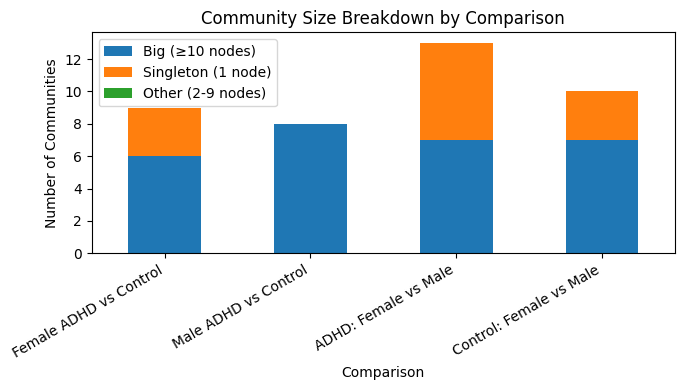

In [122]:
df_plot = df_comm_summary.copy()
df_plot["Other_Communities"] = df_plot["Total_Communities"] - df_plot["Big_Communities"] - df_plot["Singleton_Communities"]

# Stack big / singleton / other
df_plot.set_index("Comparison")[["Big_Communities", "Singleton_Communities", "Other_Communities"]].plot(
    kind="bar", stacked=True, figsize=(7,4), color=["#1f77b4", "#ff7f0e", "#2ca02c"]
)

plt.ylabel("Number of Communities")
plt.title("Community Size Breakdown by Comparison")
plt.xticks(rotation=30, ha='right')
plt.legend(["Big (≥10 nodes)", "Singleton (1 node)", "Other (2-9 nodes)"])
plt.tight_layout()
plt.show()


#### Observe:

|Comparison | Total Communities | Big Communities (≥10 nodes) | Singleton Communities (1 node)|
|:--|:--|:--|:--|
|Female ADHD vs Control | 9 | 6 | 3 |
|Male ADHD vs Control | 8 | 8 | 0 |
|ADHD: Female vs Male | 13 | 7 | 6 |
|Control: Female vs Male | 10 | 7 | 3

**Terms**:
- Total_Communities = how many different communities were detected.
- Big_Communities = number of communities with ≥ 10 nodes (change by big_threshold).
- Singleton_Communities = number of communities with only 1 node.

**Interpretation**:
- **Highly fragmented sex differences inside ADHD group -> ex differences in ADHD are more noisy and scattered.**
- **Male ADHD vs Control difference is cleaner and more cohesive.**
- **Normal sex differences are more stable than ADHD ones**


## Extracting node names inside big communities


In [123]:
def extract_big_communities(graphs, big_threshold=10):
    """
    Extract node IDs for big communities (size ≥ threshold) from multiple graphs.

    Parameters:
    - graphs: dict, {name: NetworkX graph}
    - big_threshold: int, minimum number of nodes to consider a 'big' community.

    Returns:
    - dict: {Comparison name: {Community ID: list of node IDs}}
    """
    big_communities = {}

    for name, G in graphs.items():
        partition = community_louvain.best_partition(G, weight='weight', random_state=42)
        communities = {}
        for node, comm_id in partition.items():
            communities.setdefault(comm_id, []).append(node)

        big_comms = {}
        for comm_id, members in communities.items():
            if len(members) >= big_threshold:
                big_comms[comm_id] = sorted(members)  # Sort node IDs for easier reading

        big_communities[name] = big_comms

    return big_communities


In [124]:
# get the dictionary of big communities and node inside
big_comms = extract_big_communities(graphs, big_threshold=10)

In [125]:

def compute_community_features(matrix, communities):
    """
    For a given subject (or group average) matrix and community dict,
    compute mean intra-community and inter-community connectivity.

    Parameters:
    - matrix: 2D NumPy array (connectivity or difference matrix)
    - communities: dict {community_id: list of node IDs (strings)}

    Returns:
    - dict of features {feature_name: value}
    """
    features = {}
    comm_ids = list(communities.keys())
    
    # Intra-community connectivity
    for cid in comm_ids:
        nodes = [int(n) for n in communities[cid]]  # Convert node labels to int
        if len(nodes) < 2:
            features[f'intra_comm_{cid}'] = np.nan
            continue
        values = []
        for i in range(len(nodes)):
            for j in range(i+1, len(nodes)):
                v = matrix[nodes[i], nodes[j]]
                if not np.isnan(v):
                    values.append(v)
        features[f'intra_comm_{cid}'] = np.mean(values) if values else np.nan
    
    # Inter-community connectivity
    for i in range(len(comm_ids)):
        for j in range(i+1, len(comm_ids)):
            cid1, cid2 = comm_ids[i], comm_ids[j]
            nodes1 = [int(n) for n in communities[cid1]]
            nodes2 = [int(n) for n in communities[cid2]]
            values = []
            for n1 in nodes1:
                for n2 in nodes2:
                    v = matrix[n1, n2]
                    if not np.isnan(v):
                        values.append(v)
            features[f'inter_comm_{cid1}_{cid2}'] = np.mean(values) if values else np.nan
    
    return features


In [126]:
# apply
features_ADHD_vs_Other_F  = compute_community_features(diff_ADHD_vs_Other_F,  big_comms['Female ADHD vs Control'])
features_ADHD_vs_Other_M  = compute_community_features(diff_ADHD_vs_Other_M,  big_comms['Male ADHD vs Control'])
features_Female_vs_Male_A = compute_community_features(diff_Female_vs_Male_A, big_comms['ADHD: Female vs Male'])
features_Female_vs_Male_O = compute_community_features(diff_Female_vs_Male_O, big_comms['Control: Female vs Male'])


In [127]:
df_features = pd.DataFrame([
    {**features_ADHD_vs_Other_F,  "Comparison": "Female ADHD vs Control"},
    {**features_ADHD_vs_Other_M,  "Comparison": "Male ADHD vs Control"},
    {**features_Female_vs_Male_A, "Comparison": "ADHD: Female vs Male"},
    {**features_Female_vs_Male_O, "Comparison": "Control: Female vs Male"}
])

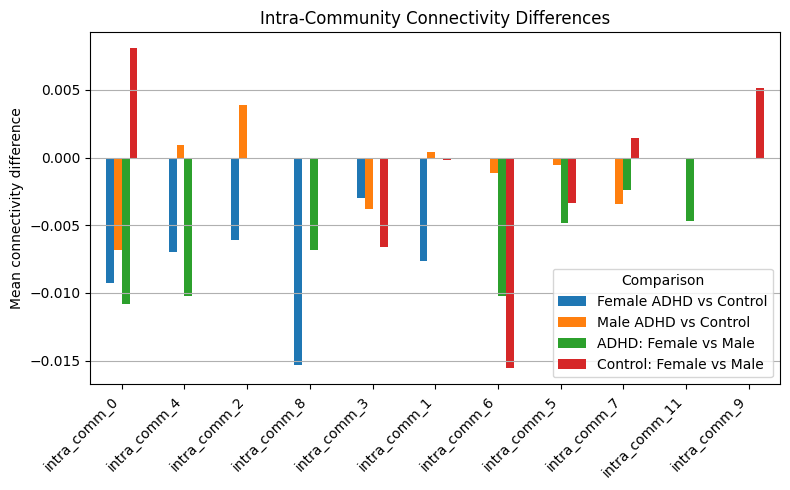

In [128]:
#  plot intra-community connectivities for each group
selected_columns = [col for col in df_features.columns if col.startswith('intra_comm_')]

df_features.set_index("Comparison")[selected_columns].T.plot(kind='bar', figsize=(8,5))

plt.title("Intra-Community Connectivity Differences")
plt.ylabel("Mean connectivity difference")
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y')
plt.tight_layout()
plt.show()


#### Obervation:
Observation | Interpretation
:--|:--|
A bar is below zero | That community is less connected in the first group compared to the second (depending on the comparison)
A bar is above zero | That community is more connected
Larger bars (positive or negative) | Stronger effect on that community
A bar is missing | That community is not detected in that group.

---

- Female ADHD vs Control shows a general loss of intra-community connectivity across many communities (bars negative).
- Male ADHD vs Control sometimes shows small positive effects (some bars slightly above 0).
- Sex differences (ADHD: Female vs Male and Control: Female vs Male) also show strong effects in several communities.
- Community 8 has a strong negative effect across comparisons → might be an important module!

### Spider plot for intra-community features

In [129]:
# Normalize intra-community features
df_norm = df_features.copy()
selected_columns = [col for col in df_norm.columns if col.startswith('intra_comm_')]

# Find the max absolute value across all selected features
max_abs = df_norm[selected_columns].abs().max().max()

# Normalize all selected features
df_norm[selected_columns] = df_norm[selected_columns] / max_abs


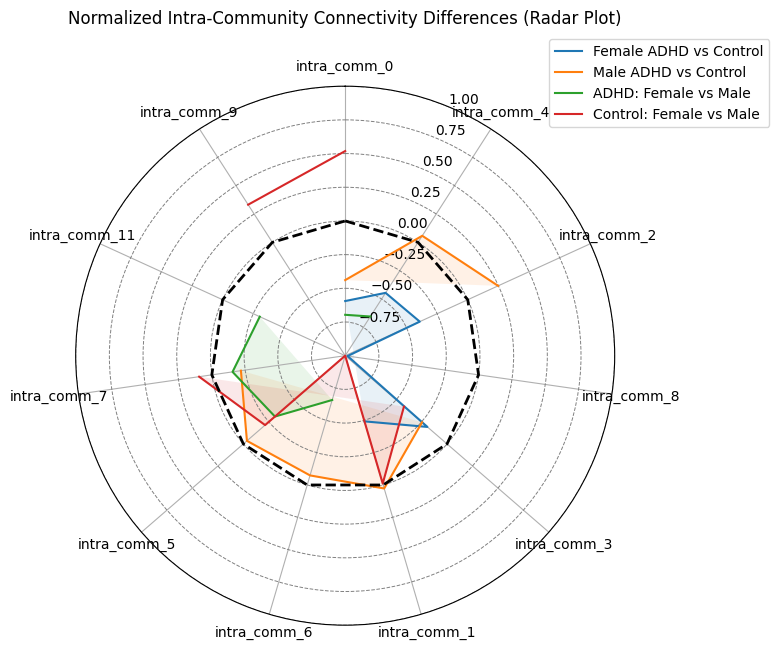

In [130]:
# 1. Prepare angles
num_vars = len(selected_columns)
angles = np.linspace(0, 2 * np.pi, num_vars, endpoint=False).tolist()
angles += angles[:1]  # Complete the loop

# 2. Prepare figure
fig, ax = plt.subplots(figsize=(7,7), subplot_kw=dict(polar=True))

# 3. Plot each group
for idx, row in df_norm.iterrows():
    values = row[selected_columns].tolist()
    values += values[:1]  # Complete the loop
    ax.plot(angles, values, label=row['Comparison'])
    ax.fill(angles, values, alpha=0.1)

# 4. Add a strong zero baseline
ax.plot(angles, [0]*len(angles), color='black', linewidth=2, linestyle='--')

# 5. Customize
ax.set_theta_offset(np.pi / 2)
ax.set_theta_direction(-1)

ax.set_thetagrids(np.degrees(angles[:-1]), selected_columns)

# 6. Adjust r-axis (radial) labels and limits
ax.set_ylim(-1, 1)  # Because we normalized between -1 and 1
ax.yaxis.grid(True, color='grey', linestyle='--', linewidth=0.7)
ax.xaxis.grid(True)

# Add legend and title
plt.legend(loc='upper right', bbox_to_anchor=(1.3, 1.1))
plt.title("Normalized Intra-Community Connectivity Differences (Radar Plot)", y=1.1)
plt.show()


#### Interpretation:

Observation | Interpretation 
:--|:--|
Distance from center | Strength of connectivity difference.
Shape of each line | The "modular signature" of each group difference.

-  Community 8 shows strong negative shifts for ADHD females — possible breakdown of internal modularity.
-  Community 5 and 7 show clear differences between sex groups.
-  Overall Female ADHD is lower (weaker internal connectivity) compared to controls.


## Create graph features Dataframe 

In [131]:
subject_features = []

for idx, row in df.iterrows():
    # 1. Build 200x200 matrix
    subject_matrix = build_feature_matrix(row)

    # 2. Compute graph features for this subject
    features = compute_community_features(subject_matrix, big_comms['Female ADHD vs Control'])  # Or adapt depending on group
    
    # 3. Add subject ID or labels if you want
    features['ADHD_Outcome'] = row['ADHD_Outcome']
    features['Sex_F'] = row['Sex_F']
    subject_features.append(features)

# 4. Create full subject-level DataFrame
df_subject_features = pd.DataFrame(subject_features)

In [132]:
# Save to disk (CSV or Pickle)

# CSV version (easy to read)
# df_subject_features.to_csv("subject_graph_features.csv", index=False)

# OR Pickle version (faster to load, keeps datatypes)
# df_subject_features.to_pickle("subject_graph_features.pkl")

In [133]:
# now we can see we only have a few features
df_subject_features.shape

(1213, 23)

In [134]:
df_subject_features.columns

Index(['intra_comm_0', 'intra_comm_4', 'intra_comm_2', 'intra_comm_8', 'intra_comm_3', 'intra_comm_1', 'inter_comm_0_4', 'inter_comm_0_2', 'inter_comm_0_8', 'inter_comm_0_3', 'inter_comm_0_1',
       'inter_comm_4_2', 'inter_comm_4_8', 'inter_comm_4_3', 'inter_comm_4_1', 'inter_comm_2_8', 'inter_comm_2_3', 'inter_comm_2_1', 'inter_comm_8_3', 'inter_comm_8_1', 'inter_comm_3_1',
       'ADHD_Outcome', 'Sex_F'],
      dtype='object')

## Statistical Testing on graph features

In [135]:
def compute_pvalues(df_subject_features, group_column, group1_value, group2_value):
    """
    Perform T-tests between two groups on intra- and inter-community features.

    Parameters:
    - df_subject_features: DataFrame with subject features and labels
    - group_column: Name of the column to split groups (e.g., 'Sex_F', 'ADHD_Outcome')
    - group1_value: Value corresponding to first group (e.g., 1)
    - group2_value: Value corresponding to second group (e.g., 0)

    Returns:
    - df_pvals: DataFrame with Feature, p_value, and Significance
    """

    # 1. Define the feature columns (intra_comm and inter_comm)
    selected_columns = [col for col in df_subject_features.columns if col.startswith('intra_comm') or col.startswith('inter_comm')]

    # 2. Split subjects
    group1 = df_subject_features[df_subject_features[group_column] == group1_value]
    group2 = df_subject_features[df_subject_features[group_column] == group2_value]

    # 3. Perform T-tests
    p_values = []
    for feature in selected_columns:
        stat, pval = ttest_ind(group1[feature], group2[feature], equal_var=False, nan_policy='omit')
        p_values.append((feature, pval))

    # 4. Build a results DataFrame
    df_pvals = pd.DataFrame(p_values, columns=['Feature', 'p_value']).sort_values('p_value')

    # 5. Add significance stars
    def significance(p):
        if p < 0.001: return '***'
        elif p < 0.01: return '**'
        elif p < 0.05: return '*'
        else: return ''
    
    df_pvals['Significance'] = df_pvals['p_value'].apply(significance)

    return df_pvals


In [136]:
df_pvals_sex = compute_pvalues(df_subject_features, group_column='Sex_F', group1_value=1, group2_value=0)
df_pvals_adhd = compute_pvalues(df_subject_features, group_column='ADHD_Outcome', group1_value=1, group2_value=0)

In [137]:
df_pvals_sex

,Feature,p_value,Significance
5,intra_comm_1,0.002905,**
20,inter_comm_3_1,0.005706,**
15,inter_comm_2_8,0.033873,*
1,intra_comm_4,0.034565,*
17,inter_comm_2_1,0.044847,*
14,inter_comm_4_1,0.045670,*
16,inter_comm_2_3,0.060528,
13,inter_comm_4_3,0.063723,
11,inter_comm_4_2,0.071744,
8,inter_comm_0_8,0.301465,


#### Statistically Important Features for Sex 

| Feature        | p-value  | Significance |
|----------------|----------|--------------|
| intra_comm_1   | 0.000037 | ***          |
| inter_comm_3_1 | 0.004548 | **           |
| intra_comm_3   | 0.004956 | **           |
| inter_comm_2_1 | 0.009671 | **           |
| inter_comm_8_1 | 0.013032 | *            |
| inter_comm_2_8 | 0.013414 | *            |
| inter_comm_2_3 | 0.015908 | *            |
| intra_comm_0   | 0.016610 | *            |
| inter_comm_4_1 | 0.022486 | *            |


In [138]:
df_pvals_adhd

,Feature,p_value,Significance
12,inter_comm_4_8,0.006201,**
1,intra_comm_4,0.006385,**
3,intra_comm_8,0.011345,*
0,intra_comm_0,0.073568,
7,inter_comm_0_2,0.183207,
10,inter_comm_0_1,0.207008,
13,inter_comm_4_3,0.234380,
18,inter_comm_8_3,0.266113,
2,intra_comm_2,0.276506,
15,inter_comm_2_8,0.321767,


#### Statistically Important Features for ADHD

| Feature        | p-value  | Significance |
|----------------|----------|--------------|
| intra_comm_4   | 0.005503 | **           |
| inter_comm_4_8 | 0.016208 | *            |


##### In the ADHD vs Control comparison, intra_comm_4 and inter_comm_4_8 showed statistically significant differences (p < 0.05)

Observation | Explanation
|:--|:--|
Only 2 features are significant | ➔ The brain connectivity differences between ADHD and Control are subtle and localized, not brain-wide.
Most features have high p-values | ➔ Most parts of the brain network are similar between ADHD and Control.
Harder to predict ADHD | ➔ Fewer strong signals means lower predictive power.

##### Possible explanation:
- ADHD does not destroy the whole brain network,

- It selectively alters a few functional modules (e.g., attention, executive control, default mode network),

- Thus only some connections (like intra_comm_4, inter_comm_4_8) become statistically different.

## Sex Prediction Model based on communities as features

In [139]:
my_classifiers = {
    "Logistic Regression": LogisticRegression(),
    "Random Forest": RandomForestClassifier(),
    "Decision Tree": DecisionTreeClassifier(),
    "K-Nearest Neighbors": KNeighborsClassifier(),
    "Gaussian NB": GaussianNB(),
    "Support Vector Classifier": SVC(probability=True),
    "XGBoost": XGBClassifier(use_label_encoder=False, eval_metric='logloss'),
    "LightGBM": LGBMClassifier(force_col_wise=True,verbose=-1),
    "CatBoost": CatBoostClassifier(verbose=0)
}

In [140]:
def try_classifiers_(
    df, col_feature , col_target, classifiers=my_classifiers, cv=5, random_state = SEED
):
    """
    Trains and evaluates multiple classifiers using stratified k-fold
    cross-validation on the training data and then evaluates each trained
    classifier once on a hold-out test set.

    Parameters
    ----------
    df : pd.DataFrame
        The input Pandas DataFrame containing features and the target variable.
    col_feature : list of str
        A list of column names in the DataFrame to be used as features.
    col_target : str
        The column name in the DataFrame to be used as the target variable.
    classifiers : dict
        A dictionary where keys are the names of the classifiers (strings)
        and values are the initialized classifier objects.
        e.g., {'Logistic Regression': LogisticRegression(), 'Random Forest': RandomForestClassifier(random_state=42)}
    cv : int, default=5
        Number of folds to use for StratifiedKFold cross-validation.
    random_state : int, default = SEED
        Random seed for reproducibility of the data splitting and
        cross-validation shuffling. Pass an int for reproducible output
        across multiple function calls.

    Returns
    -------
    pd.DataFrame
        A Pandas DataFrame containing the cross-validation mean and standard
        deviation for accuracy, precision, recall, and F1-score, as well as
        the corresponding scores on the hold-out test set for each classifier.
        The DataFrame has columns: 'Model', 'CV Accuracy', 'CV Precision',
        'CV Recall', 'CV F1', 'Test Accuracy', 'Test Precision',
        'Test Recall', and 'Test F1'.
    """

    # Select features (X) and target (y) from the DataFrame
    X = df[col_feature]
    y = df[col_target]

    # Split the data into training and testing sets, maintaining class proportions
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=random_state, stratify=y)

    # Scale the features using StandardScaler
    scaler = StandardScaler()
    X_train = scaler.fit_transform(X_train)
    X_test = scaler.transform(X_test)

    # Define StratifiedKFold for cross-validation
    skf = StratifiedKFold(n_splits=cv, shuffle=True, random_state=random_state)

    # Define scoring metrics
    scoring = {
        "acc": make_scorer(accuracy_score),
        "prec": make_scorer(precision_score, zero_division=0),
        "rec": make_scorer(recall_score, zero_division=0),
        "f1": make_scorer(f1_score, zero_division=0),
    }

    # Initialize an empty list to store the results
    records = []

    # Iterate through each classifier in the provided dictionary
    for name, clf in classifiers.items():
        # Perform stratified k-fold cross-validation on the training data
        cv_res = cross_validate(
            clf, X_train, y_train,
            cv=skf, scoring=scoring, n_jobs=-1, return_train_score=False
        )

        # Train the classifier on the entire training set
        clf.fit(X_train, y_train)

        # Make predictions on the hold-out test set
        y_pred = clf.predict(X_test)

        # Store the results for the current classifier
        records.append({
            "Model": name,
            "CV Accuracy": f"{cv_res['test_acc'].mean():.4f} ± {cv_res['test_acc'].std():.4f}",
            "CV Precision": f"{cv_res['test_prec'].mean():.4f} ± {cv_res['test_prec'].std():.4f}",
            "CV Recall": f"{cv_res['test_rec'].mean():.4f} ± {cv_res['test_rec'].std():.4f}",
            "CV F1": f"{cv_res['test_f1'].mean():.4f} ± {cv_res['test_f1'].std():.4f}",
            "Test Accuracy": accuracy_score(y_test, y_pred),
            "Test Precision": precision_score(y_test, y_pred, zero_division=0),
            "Test Recall": recall_score(y_test, y_pred, zero_division=0),
            "Test F1": f1_score(y_test, y_pred, zero_division=0),
        })

    # Return the results as a Pandas DataFrame
    return pd.DataFrame(records)

In [141]:
# select features are important to predict sex
feature_sex = df_pvals_sex[df_pvals_sex['p_value']>0.05]['Feature'].to_list()

### ----------------------We check the sex predict in all group-------------------

In [142]:
result_df = try_classifiers_(df_subject_features,feature_sex,'Sex_F')

In [143]:
result_df.sort_values(by='Test Accuracy',ascending=False)

,Model,CV Accuracy,CV Precision,CV Recall,CV F1,Test Accuracy,Test Precision,Test Recall,Test F1
5,Support Vector Classifier,0.6567 ± 0.0025,0.1000 ± 0.2000,0.0030 ± 0.0060,0.0058 ± 0.0116,0.662551,1.000000,0.012048,0.023810
0,Logistic Regression,0.6412 ± 0.0116,0.2119 ± 0.1451,0.0270 ± 0.0198,0.0478 ± 0.0349,0.658436,0.500000,0.024096,0.045977
4,Gaussian NB,0.6021 ± 0.0905,0.4049 ± 0.0668,0.1913 ± 0.2329,0.1796 ± 0.1602,0.650206,0.333333,0.024096,0.044944
6,XGBoost,0.6206 ± 0.0220,0.4070 ± 0.0659,0.2491 ± 0.0641,0.3079 ± 0.0680,0.633745,0.446429,0.301205,0.359712
8,CatBoost,0.6474 ± 0.0168,0.4483 ± 0.1103,0.1050 ± 0.0247,0.1696 ± 0.0387,0.629630,0.294118,0.060241,0.100000
1,Random Forest,0.6515 ± 0.0177,0.4600 ± 0.1306,0.0900 ± 0.0310,0.1500 ± 0.0501,0.613169,0.238095,0.060241,0.096154
7,LightGBM,0.6124 ± 0.0350,0.3901 ± 0.0906,0.2220 ± 0.0448,0.2828 ± 0.0600,0.600823,0.360000,0.216867,0.270677
3,K-Nearest Neighbors,0.6124 ± 0.0409,0.3996 ± 0.0934,0.2641 ± 0.0742,0.3167 ± 0.0823,0.567901,0.296296,0.192771,0.233577
2,Decision Tree,0.5546 ± 0.0254,0.3563 ± 0.0314,0.3696 ± 0.0611,0.3611 ± 0.0402,0.555556,0.345679,0.337349,0.341463


### ----------------------We check the sex predict in ADHD group-------------------

In [144]:
df_a = df_subject_features[df_subject_features['ADHD_Outcome'] == 1]
result_df_a = try_classifiers_(df_a,feature_sex,'Sex_F')
result_df_a.sort_values(by='Test Accuracy',ascending=False)

,Model,CV Accuracy,CV Precision,CV Recall,CV F1,Test Accuracy,Test Precision,Test Recall,Test F1
5,Support Vector Classifier,0.6988 ± 0.0009,0.0000 ± 0.0000,0.0000 ± 0.0000,0.0000 ± 0.0000,0.700599,0.000000,0.00,0.000000
8,CatBoost,0.6942 ± 0.0111,0.4429 ± 0.3270,0.0350 ± 0.0255,0.0618 ± 0.0426,0.700599,0.500000,0.08,0.137931
0,Logistic Regression,0.6958 ± 0.0156,0.4167 ± 0.4014,0.0250 ± 0.0274,0.0463 ± 0.0498,0.694611,0.333333,0.02,0.037736
6,XGBoost,0.6385 ± 0.0173,0.2960 ± 0.0626,0.1500 ± 0.0447,0.1985 ± 0.0525,0.676647,0.423077,0.22,0.289474
1,Random Forest,0.6807 ± 0.0190,0.3505 ± 0.2245,0.0500 ± 0.0274,0.0857 ± 0.0460,0.670659,0.222222,0.04,0.067797
7,LightGBM,0.6461 ± 0.0138,0.3223 ± 0.0632,0.1700 ± 0.0510,0.2213 ± 0.0595,0.664671,0.384615,0.20,0.263158
4,Gaussian NB,0.6100 ± 0.0819,0.2986 ± 0.0688,0.2900 ± 0.2944,0.2307 ± 0.1876,0.652695,0.366667,0.22,0.275000
3,K-Nearest Neighbors,0.6265 ± 0.0324,0.2470 ± 0.0462,0.1100 ± 0.0200,0.1503 ± 0.0234,0.616766,0.266667,0.16,0.200000
2,Decision Tree,0.5768 ± 0.0311,0.3033 ± 0.0566,0.3200 ± 0.0857,0.3101 ± 0.0675,0.610778,0.346939,0.34,0.343434


### ----------------------We check the sex predict in NON-ADHD group-------------------

In [145]:
df_o = df_subject_features[df_subject_features['ADHD_Outcome'] == 0]
result_df_o = try_classifiers_(df_o,feature_sex,'Sex_F')
result_df_o.sort_values(by='Test Accuracy',ascending=False)

,Model,CV Accuracy,CV Precision,CV Recall,CV F1,Test Accuracy,Test Precision,Test Recall,Test F1
4,Gaussian NB,0.5508 ± 0.0382,0.4602 ± 0.0841,0.1818 ± 0.1066,0.2432 ± 0.1249,0.610390,0.800000,0.121212,0.210526
3,K-Nearest Neighbors,0.5869 ± 0.0562,0.5297 ± 0.0743,0.4732 ± 0.0653,0.4996 ± 0.0686,0.571429,0.500000,0.545455,0.521739
5,Support Vector Classifier,0.5672 ± 0.0222,0.5173 ± 0.0559,0.2419 ± 0.1386,0.3030 ± 0.1349,0.571429,0.500000,0.212121,0.297872
1,Random Forest,0.5246 ± 0.0497,0.4287 ± 0.1031,0.2863 ± 0.1092,0.3367 ± 0.1004,0.558442,0.478261,0.333333,0.392857
7,LightGBM,0.5607 ± 0.0533,0.4949 ± 0.0733,0.4504 ± 0.0814,0.4704 ± 0.0738,0.558442,0.481481,0.393939,0.433333
8,CatBoost,0.5902 ± 0.0696,0.5470 ± 0.1221,0.3681 ± 0.0876,0.4378 ± 0.0991,0.558442,0.476190,0.303030,0.370370
2,Decision Tree,0.5279 ± 0.0480,0.4555 ± 0.0562,0.4652 ± 0.1051,0.4572 ± 0.0805,0.506494,0.419355,0.393939,0.406250
0,Logistic Regression,0.5934 ± 0.0502,0.5590 ± 0.0873,0.3843 ± 0.0697,0.4503 ± 0.0628,0.493506,0.350000,0.212121,0.264151
6,XGBoost,0.5672 ± 0.0447,0.4978 ± 0.0715,0.4419 ± 0.0975,0.4671 ± 0.0855,0.467532,0.357143,0.303030,0.327869


### -----------------Summary-----------------------------------

Data Imbalance is a key issue — especially in the general and ADHD datasets.

- SVM consistently fails to identify the minority class despite high accuracy, due to class imbalance.

- GaussianNB and XGBoost provide more meaningful performance in detecting minorities (better recall and F1).

#### The model performs much better for sex prediction in non-ADHD individuals. 

###### This may suggest:

### ADHD-related features mask sex differences

### **We need to try other ways for sex prediction**



# GNN predict Sex by Functional Metrics

In [146]:
# the original dataframe
df_flat = df_m.merge(df_s,on='participant_id',how='inner').drop('participant_id',axis=1)

In [147]:
all_columns = df_flat.columns

In [148]:
target_cols = ['ADHD_Outcome', 'Sex_F']

In [149]:
feature_cols = [col for col in all_columns]

In [150]:
def reconstruct_symmetric_matrix(row, size=200):
    """
    Reconstructs a full symmetric correlation matrix from a pandas Series
    or DataFrame row containing flattened upper/lower triangle features.

    Assumes feature columns are named like 'Rthrow_Cthcolumn' (0-indexed)
    and represent one unique off-diagonal triangle of the matrix.

    Parameters:
    - row: pandas Series or dict-like object containing the flattened features.
           Index/keys should be the feature column names (e.g., '0throw_1thcolumn').
    - size: The dimension of the square matrix (default: 200).

    Returns:
    - A NumPy array of shape (size, size) representing the full,
      symmetric correlation matrix with 1s on the diagonal.
    """
    matrix = np.zeros((size, size), dtype=float)
    
    # Regex to capture row (R) and column (C) indices from names like 'Rthrow_Cthcolumn'
    pattern = re.compile(r'(\d+)throw_(\d+)thcolumn')

    # Iterate through the index (column names) of the input row
    for col_name in row.index:
        match = pattern.match(col_name)
        if match:
            try:
                # Extract row and column indices
                r = int(match.group(1))
                c = int(match.group(2))

                # Ensure indices are within bounds (optional sanity check)
                if 0 <= r < size and 0 <= c < size:
                    # Get the correlation value
                    value = row[col_name]
                    
                    # Place value symmetrically
                    matrix[r, c] = value
                    matrix[c, r] = value
                else:
                    print(f"Warning: Index out of bounds ({r}, {c}) in column {col_name}")

            except ValueError:
                # Handle cases where conversion to int fails (shouldn't happen with pattern)
                 print(f"Warning: Could not parse indices from column {col_name}")
            except KeyError:
                 # Handle cases where col_name isn't actually in the row (shouldn't happen in apply)
                 print(f"Warning: Column {col_name} not found in row.")
                 
    # Fill the diagonal with 1.0
    np.fill_diagonal(matrix, 1.0)

    return matrix



In [151]:
# Create a DataFrame with only features
df_features_flat = df_flat[feature_cols]

In [152]:
# Apply the function to each row (subject)
# This will return a pandas Series where each element is a 200x200 matrix
reconstructed_matrices_series = df_features_flat.apply(reconstruct_symmetric_matrix, axis=1)

In [153]:
# Convert the Series of matrices into a 3D NumPy array
# This is the format usually needed for Deep Learning input (samples, height, width)
X_matrices = np.stack(reconstructed_matrices_series.values)

In [154]:
# 4. Extract targets
y = df_flat[target_cols].values
print(f"Shape of reconstructed matrices (X): {X_matrices.shape}")
print(f"Shape of targets (y): {y.shape}")


Shape of reconstructed matrices (X): (1213, 200, 200)
Shape of targets (y): (1213, 2)


In [155]:
# --- Step 1: Define and Calculate Node Features (Node Strength) ---

print("Calculating node features (Node Strength)...")
node_features_list = []
# Loop through each subject's matrix
for i in tqdm(range(X_matrices.shape[0]), desc="Calculating Node Features"):
    matrix = X_matrices[i]
    # Calculate strength: sum of absolute correlations for each node (row)
    # Using abs() because strength is usually non-negative
    node_strength = np.sum(np.abs(matrix), axis=1)
    # Reshape to PyG standard: (num_nodes, num_node_features) -> (200, 1)
    node_strength_reshaped = node_strength.reshape(-1, 1)
    # Convert to PyTorch tensor
    node_features_list.append(torch.tensor(node_strength_reshaped, dtype=torch.float))

print(f"Calculated node features for {len(node_features_list)} subjects.")
if node_features_list:
    print(f"Example node features shape: {node_features_list[0].shape}") # Should be torch.Size([200, 1])
else:
    print("Warning: No node features were calculated.")


Calculating node features (Node Strength)...


Calculating Node Features:   0%|          | 0/1213 [00:00<?, ?it/s]

Calculated node features for 1213 subjects.
Example node features shape: torch.Size([200, 1])


In [156]:
# --- Step 2: Prepare Graph Data Objects (torch_geometric.data.Data) ---

print("\nCreating PyG Data objects...")
data_list = []
num_subjects = X_matrices.shape[0]

for idx in tqdm(range(num_subjects), desc="Creating Data Objects"):
    # 1. Get Adjacency Matrix (convert to Tensor)
    adj_matrix = torch.from_numpy(X_matrices[idx]).float()

    # 2. Get edge_index and edge_attr for the dense graph
    # We want all connections i<->j where i!=j
    # Use dense_to_sparse on a mask representing all desired connections
    adj_mask = torch.ones_like(adj_matrix) - torch.eye(adj_matrix.size(0)) # Mask excluding diagonal
    edge_index, _ = dense_to_sparse(adj_mask) # COO format indices of edges

    # Get edge attributes (correlation values) for the edges in edge_index
    # Need to handle the shape for PyG layers: [num_edges, num_edge_features]
    edge_attr = adj_matrix[edge_index[0], edge_index[1]].unsqueeze(1) # Shape: [num_edges, 1]

    # 3. Get pre-calculated node features
    # Ensure node features tensor exists for the index
    if idx < len(node_features_list):
         x = torch.eye(200, dtype=torch.float) # Shape: [200, 1]
    else:
         # Handle error: node features missing for this index
         print(f"Error: Missing node features for index {idx}. Skipping.")
         continue # Skip creating Data object if node features are missing

    # 4. Get target labels, ensure correct shape and type for graph-level prediction
    # PyG expects y shape [num_graphs, num_targets] or [num_graphs]
    # We'll store it as [1, 2] here, DataLoader might adjust later.
    y_subj = torch.tensor(y[idx], dtype=torch.float).unsqueeze(0) # Shape: [1, 2]

    # 5. Create Data object
    data = Data(x=x, edge_index=edge_index, edge_attr=edge_attr, y=y_subj)
    data_list.append(data)

print(f"Created {len(data_list)} Data objects.")
if data_list:
    print(f"Example Data object: {data_list[0]}")
    print(f" Data object contains keys: {data_list[0].keys}")
    print(f"  - x shape: {data_list[0].x.shape}")             # Node features
    print(f"  - edge_index shape: {data_list[0].edge_index.shape}") # Connectivity
    print(f"  - edge_attr shape: {data_list[0].edge_attr.shape}")   # Edge weights
    print(f"  - y shape: {data_list[0].y.shape}")             # Target labels
else:
    print("Warning: No Data objects were created.")


Creating PyG Data objects...


Creating Data Objects:   0%|          | 0/1213 [00:00<?, ?it/s]

Created 1213 Data objects.
Example Data object: Data(x=[200, 200], edge_index=[2, 39800], edge_attr=[39800, 1], y=[1, 2])
 Data object contains keys: <bound method BaseData.keys of Data(x=[200, 200], edge_index=[2, 39800], edge_attr=[39800, 1], y=[1, 2])>
  - x shape: torch.Size([200, 200])
  - edge_index shape: torch.Size([2, 39800])
  - edge_attr shape: torch.Size([39800, 1])
  - y shape: torch.Size([1, 2])


In [157]:
#y is NumPy array of shape (1213, 2) with targets
# y[:, 0] is ADHD_Outcome (0 or 1)
# y[:, 1] is Sex_F (0 or 1)

combined_labels = y[:, 0] * 2 + y[:, 1]

# This creates a label:
# 0*2 + 0 = 0 (Control Male)
# 0*2 + 1 = 1 (Control Female)
# 1*2 + 0 = 2 (ADHD Male)
# 1*2 + 1 = 3 (ADHD Female)

# Now use this 'combined_labels' array for stratification.
# It has shape (1213,) and contains values 0, 1, 2, or 3.

In [158]:
print("\nCreating combined labels for stratification...")
if y.shape[1] == 2:
    combined_labels = y[:, 0] * 2 + y[:, 1]
    print("Using combined labels (ControlMale=0, ControlFemale=1, ADHMale=2, ADHFemale=3)")
    # Check distribution (optional)
    unique, counts = np.unique(combined_labels, return_counts=True)
    print(f"Combined label distribution: {dict(zip(unique, counts))}")
    stratify_source = combined_labels
else:
    print("Warning: Target shape is not (N, 2). Using first target for stratification as fallback.")
    stratify_source = y[:, 0]


Creating combined labels for stratification...
Using combined labels (ControlMale=0, ControlFemale=1, ADHMale=2, ADHFemale=3)
Combined label distribution: {0: 216, 1: 166, 2: 581, 3: 250}


In [159]:
# --- Step 3: Split Data into Training, Validation, and Test Sets ---
# Important: Split the list of Data objects

# Stratification for multi-output is complex.
# A simple approach is to stratify based on one target or a combination.
# Here, we'll try stratifying based on the first target (ADHD_Outcome) for simplicity.
# Ensure y has integer labels for stratification if needed, or use probabilities.


print("\nSplitting data using combined labels for stratification...")

try:
    # First split into train+val (85%) and test (15%)
    train_val_list, test_list = train_test_split(
        data_list,
        test_size=0.15,
        random_state=42,
        stratify=stratify_source # Use the combined labels here
    )

    # Need corresponding stratification labels for train_val_list
    # Re-calculate combined labels just for the train_val indices
    train_val_indices = [data_list.index(d) for d in train_val_list] # Find original indices
    train_val_stratify_source = stratify_source[train_val_indices]

    # Then split train+val into train (~70%) and val (~15%)
    train_list, val_list = train_test_split(
        train_val_list,
        test_size=0.1765, # approx 15% of original total (0.15 / 0.85)
        random_state=42,
        stratify=train_val_stratify_source # Stratify the second split too
    )

    print(f"Train samples: {len(train_list)}")
    print(f"Validation samples: {len(val_list)}")
    print(f"Test samples: {len(test_list)}")



except Exception as e:
    # Fallback if stratification fails for some reason
    print(f"Error during stratified split with combined labels: {e}")
    print("Performing non-stratified split as fallback.")



Splitting data using combined labels for stratification...
Train samples: 849
Validation samples: 182
Test samples: 182


In [160]:
# --- Step 4: Create PyG DataLoaders ---

batch_size = 32 # You can tune this hyperparameter (e.g., 16, 32, 64)

# Create DataLoader for the training set
# shuffle=True is important for training to randomize batch composition each epoch
if train_list:
    train_loader = DataLoader(train_list, batch_size=batch_size, shuffle=True)
    print(f"\nTrain DataLoader created with {len(train_loader)} batches (batch size={batch_size}).")
else:
    train_loader = None
    print("\nWarning: Training list is empty. No DataLoader created.")

# Create DataLoader for the validation set
# shuffle=False is standard for validation/testing for consistent evaluation
if val_list:
    val_loader = DataLoader(val_list, batch_size=batch_size, shuffle=False)
    print(f"Validation DataLoader created with {len(val_loader)} batches.")
else:
    val_loader = None
    print("\nWarning: Validation list is empty. No DataLoader created.")

# Create DataLoader for the test set
if test_list:
    test_loader = DataLoader(test_list, batch_size=batch_size, shuffle=False)
    print(f"Test DataLoader created with {len(test_loader)} batches.")
else:
    test_loader = None
    print("\nWarning: Test list is empty. No DataLoader created.")


Train DataLoader created with 27 batches (batch size=32).
Validation DataLoader created with 6 batches.
Test DataLoader created with 6 batches.


In [161]:
# --- Step 5: Define the GNN Model Architecture ---


class BrainGNN_BatchNorm(nn.Module): # Renamed slightly for clarity
    def __init__(self, num_node_features, num_classes, hidden_channels=64):
        """
        GNN model with BatchNorm for graph-level prediction.

        Args:
            num_node_features (int): Dimensionality of node features (e.g., 1 for strength, 200 for identity).
            num_classes (int): Number of output classes (1 for Sex_F).
            hidden_channels (int): Number of channels in hidden GNN/Linear layers.
        """
        super(BrainGNN_BatchNorm, self).__init__()
        torch.manual_seed(42) # for reproducibility

        # Define GNN layers
        self.conv1 = GraphConv(num_node_features, hidden_channels)
        self.conv2 = GraphConv(hidden_channels, hidden_channels * 2)
        self.conv3 = GraphConv(hidden_channels * 2, hidden_channels * 4)

        # Define BatchNorm layers for node features after each convolution
        self.bn1 = BatchNorm(hidden_channels)
        self.bn2 = BatchNorm(hidden_channels * 2)
        self.bn3 = BatchNorm(hidden_channels * 4)

        # Define Linear layers for final classification
        self.lin1 = nn.Linear(hidden_channels * 4, hidden_channels * 2)
        # *** MODIFICATION: The final layer now outputs num_classes dimensions ***
        self.lin2 = nn.Linear(hidden_channels * 2, num_classes)

        # Dropout layer
        self.dropout = nn.Dropout(p=0.5)

    def forward(self, x, edge_index, edge_attr, batch):
        """
        Defines the forward pass of the model with BatchNorm.
        """
        # Ensure edge_attr has the right shape for edge_weight argument
        edge_weight = edge_attr.squeeze()
        # Handle potential case where edge_weight becomes a 0-dim tensor after squeeze
        if edge_weight.dim() == 0:
             edge_weight = edge_weight.unsqueeze(0)
        # Handle case where edge_weight might be empty if a graph has no edges
        if edge_weight.numel() == 0:
            # If edge_weight is empty, pass None to GraphConv
            edge_weight = None
        elif edge_weight.dim() != 1:
             # If after squeeze it's still not 1D (e.g., unexpected input shape)
             # raise an error or handle appropriately. For now, print a warning.
             print(f"Warning: Unexpected edge_weight dimension: {edge_weight.dim()}. Proceeding without edge weights for this batch.")
             # Depending on GraphConv implementation, None might be required or cause errors.
             # If errors occur, you might need to reshape or provide default weights.
             edge_weight = None


        # 1. Obtain node embeddings via GNN layers + BatchNorm + Activation
        x = self.conv1(x, edge_index, edge_weight=edge_weight)
        x = self.bn1(x) # Apply BatchNorm
        x = F.relu(x)   # Apply Activation

        x = self.conv2(x, edge_index, edge_weight=edge_weight)
        x = self.bn2(x) # Apply BatchNorm
        x = F.relu(x)   # Apply Activation

        x = self.conv3(x, edge_index, edge_weight=edge_weight)
        x = self.bn3(x) # Apply BatchNorm
        x = F.relu(x)   # Apply Activation

        # 2. Global Pooling
        graph_embedding = global_mean_pool(x, batch)
        graph_embedding = self.dropout(graph_embedding) # Apply dropout AFTER pooling

        # 3. Apply final classifier
        x = self.lin1(graph_embedding)
        x = F.relu(x)
        x = self.dropout(x)
        x = self.lin2(x) # Output logits (dimension will be num_classes as defined in __init__)

        return x


try:
    # Check the number of features in the first sample of the training list
    # Make sure train_list is defined and not empty
    if 'train_list' in locals() and train_list:
        num_node_features = train_list[0].num_node_features
        print(f"Determined num_node_features = {num_node_features} from train_list sample.")
    else:
        raise NameError # Trigger the fallback if train_list is not available
except (NameError, IndexError):
    # Fallback if train_list not defined or empty - SET MANUALLY
    num_node_features = 1 # Or 200 if you prepared identity features
    print(f"Warning: Could not determine num_node_features from data. Assuming {num_node_features}.")



# *** MODIFICATION: Set num_classes to 1 for predicting only Sex_F ***
num_classes = 1
hidden_channels = 64

# Instantiate the model class with num_classes=1
model = BrainGNN_BatchNorm(num_node_features=num_node_features,
                           num_classes=num_classes, # Pass 1 here
                           hidden_channels=hidden_channels)

print(f"\nUPDATED GNN Model Defined (with BatchNorm for {num_classes} Target - Sex_F):")
print(model)


Determined num_node_features = 200 from train_list sample.

UPDATED GNN Model Defined (with BatchNorm for 1 Target - Sex_F):
BrainGNN_BatchNorm(
  (conv1): GraphConv(200, 64)
  (conv2): GraphConv(64, 128)
  (conv3): GraphConv(128, 256)
  (bn1): BatchNorm(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (bn2): BatchNorm(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (bn3): BatchNorm(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (lin1): Linear(in_features=256, out_features=128, bias=True)
  (lin2): Linear(in_features=128, out_features=1, bias=True)
  (dropout): Dropout(p=0.5, inplace=False)
)


In [162]:
# --- Check model output with a sample batch 

try:
    sample_batch = next(iter(train_loader))
    model.eval() # Set model to evaluation mode for checking
    with torch.no_grad():
         output = model(sample_batch.x, sample_batch.edge_index, sample_batch.edge_attr, sample_batch.batch)
    print(f"\nSample batch output shape: {output.shape}") # Should be [batch_size, 2]
except StopIteration:
    print("\nTrain loader is empty, cannot check sample batch.")



Sample batch output shape: torch.Size([32, 1])


In [163]:
# --- Step 6: Define Define the Loss Function and the Optimizer ---

# Define the device (use GPU if available, otherwise CPU)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"\nUsing device: {device}")

# Move the model to the chosen device
model.to(device)

# --- Calculate Class Weights for Weighted Loss (Sex_F only) ---
print("Calculating class weights for weighted BCE loss (Sex_F) based on training data...")

# Make sure train_list is not empty before proceeding
if 'train_list' not in locals() or not train_list:
    print("Error: Training list ('train_list') is not defined or empty. Cannot calculate weights.")
    # Handle error appropriately, maybe exit or raise exception
    # Set a default weight if calculation fails
    pos_weight_sex = torch.tensor([1.0]).to(device)
    print("Using default pos_weight=1.0 for Sex_F.")
else:
    try:
        # Extract all labels (y tensors) from the training set Data objects
        # Assuming each y now has shape [1, 1] or [1] for the single target
        # Adjust slicing/indexing based on the actual shape of data.y
        train_labels = torch.cat([data.y for data in train_list], dim=0) # Shape: [num_train_samples, 1] or [num_train_samples]

        # Ensure labels are on CPU for numpy conversion or direct calculation
        train_labels_cpu = train_labels.cpu().squeeze() # Squeeze to make it 1D if needed

        # Validate label shape after concatenation and squeezing
        if train_labels_cpu.dim() != 1:
             raise ValueError(f"Expected 1D tensor for labels after processing, but got shape {train_labels_cpu.shape}. Check data.y structure.")

        # Calculate weights for Sex_F (the single target)
        # neg_count = number of samples where label is 0 (e.g., Male)
        # pos_count = number of samples where label is 1 (e.g., Female)
        neg_sex = (train_labels_cpu == 0).sum().item()
        pos_sex = (train_labels_cpu == 1).sum().item()

        # Avoid division by zero if a class is absent in the training set
        # pos_weight = neg_count / pos_count (gives more weight to positive class if it's rarer)
        if pos_sex > 0:
            pos_weight_sex_val = neg_sex / pos_sex
        else:
            print("Warning: Positive class (1) for Sex_F not found in training data. Using default weight 1.0.")
            pos_weight_sex_val = 1.0

        pos_weight_sex = torch.tensor([pos_weight_sex_val], dtype=torch.float)
        print(f"Sex Outcome (Train Set): Negatives (0)={neg_sex}, Positives (1)={pos_sex} => pos_weight={pos_weight_sex.item():.4f}")

        # Move weights to the correct device (GPU or CPU)
        pos_weight_sex = pos_weight_sex.to(device)

    except Exception as e:
        print(f"Error calculating class weights: {e}")
        print("Using default pos_weight=1.0 for Sex_F.")
        pos_weight_sex = torch.tensor([1.0]).to(device)

# --- Define Loss Function (Sex_F only) ---
# Use BCEWithLogitsLoss: combines Sigmoid layer + Binary Cross Entropy. Numerically stable.
# Pass the calculated pos_weight to handle class imbalance for the Sex_F target.
criterion_sex = nn.BCEWithLogitsLoss(pos_weight=pos_weight_sex)

print("\nLoss function (BCEWithLogitsLoss with weights for Sex_F) defined.")

# --- Define Optimizer ---
# Adam / AdamW are generally good choices for GNNs
learning_rate = 1e-5 # Example learning rate - tune as needed (e.g., 1e-3, 5e-4)
# Consider weight decay for regularization with AdamW
optimizer = optim.AdamW(model.parameters(), lr=learning_rate, weight_decay=1e-5)
# Or use standard Adam:
#optimizer = optim.Adam(model.parameters(), lr=learning_rate)

print(f"Optimizer defined: {type(optimizer).__name__} with lr={learning_rate}")

# Example check: Print the criterion and optimizer
# print("\nCriterion:", criterion_sex)
# print("\nOptimizer:", optimizer)


Using device: cpu
Calculating class weights for weighted BCE loss (Sex_F) based on training data...
Error calculating class weights: Expected 1D tensor for labels after processing, but got shape torch.Size([849, 2]). Check data.y structure.
Using default pos_weight=1.0 for Sex_F.

Loss function (BCEWithLogitsLoss with weights for Sex_F) defined.
Optimizer defined: AdamW with lr=1e-05


In [164]:
# --- Step 7 & 8: Implement Training and Validation Loops (Single Target: Sex_F) ---

num_epochs = 200 # Or 100, 200, etc. - Adjust as needed
train_losses = []
val_losses = []
# Store validation metrics per epoch for later analysis/plotting
val_metrics_history = []

print(f"\nStarting training for {num_epochs} epochs (Target: Sex_F)...")

# --- Tracking Best Model ---
# Decide which metric to use for saving the best model.
# Examples: validation loss ('val_loss'), F1 ('f1_Sex'), AUC ('auc_roc_Sex')
tracking_metric = 'f1_Sex' # Example: track F1 score for Sex_F
best_val_metric = -float('inf') if tracking_metric != 'val_loss' else float('inf') # Adjust initial best value

# --- Ensure loaders are available ---
if 'train_loader' not in locals() or 'val_loader' not in locals():
     raise NameError("train_loader or val_loader not defined. Please ensure data loaders are created.")
if 'model' not in locals() or 'criterion_sex' not in locals() or 'optimizer' not in locals():
     raise NameError("model, criterion_sex, or optimizer not defined.")
if 'device' not in locals():
     raise NameError("device (e.g., 'cuda' or 'cpu') not defined.")


for epoch in range(1, num_epochs + 1):
    start_time = time.time()

    # --- Training Phase ---
    model.train()
    epoch_train_loss = 0.0
    train_pbar = tqdm(train_loader, desc=f"Epoch {epoch}/{num_epochs} [Train]", leave=False, ncols=100)
    for batch in train_pbar:
        try:
            batch = batch.to(device)
            optimizer.zero_grad()

            # Model outputs [batch_size, 1]
            outputs = model(batch.x, batch.edge_index, batch.edge_attr, batch.batch) # Shape: [batch_size, 1]

            # *** MODIFICATION: Select the correct target column (assuming Sex_F is index 1) ***
            # Ensure batch.y has at least 2 columns if selecting index 1
            if batch.y.dim() > 1 and batch.y.shape[1] > 1:
                targets = batch.y[:, 1].squeeze().float() # Select Sex_F column, squeeze, ensure float
            else:
                # If batch.y is already 1D or has only one column, assume it's the correct target
                targets = batch.y.squeeze().float()

            # Check for shape mismatch before loss calculation
            # Output shape should be [batch_size, 1] or [batch_size] after squeeze
            # Target shape should be [batch_size]
            output_squeezed = outputs.squeeze()
            if output_squeezed.shape != targets.shape:
                 print(f"\nWarning: Shape mismatch detected in training batch!")
                 print(f"  Output shape after squeeze: {output_squeezed.shape}")
                 print(f"  Target shape after processing batch.y: {targets.shape}")
                 continue # Skip this batch

            loss = criterion_sex(output_squeezed, targets) # Calculate loss for Sex_F

            loss.backward()
            optimizer.step()

            epoch_train_loss += loss.item()
            train_pbar.set_postfix({'loss': f'{loss.item():.4f}'})
        except Exception as e:
            print(f"\nError during training batch: {e}")
            print(f"Batch data keys: {batch.keys}")
            print(f"Output shape: {outputs.shape if 'outputs' in locals() else 'N/A'}")
            print(f"Target shape: {batch.y.shape if batch.y is not None else 'N/A'}")
            continue # Skip to next batch on error


    # Average loss over number of batches processed
    if len(train_loader) > 0:
        avg_train_loss = epoch_train_loss / len(train_loader)
        train_losses.append(avg_train_loss)
    else:
        avg_train_loss = 0
        train_losses.append(avg_train_loss)
        print("Warning: train_loader was empty.")


    # --- Validation Phase ---
    model.eval()
    epoch_val_loss = 0.0
    all_val_outputs_list = []
    all_val_labels_list = [] # Store the CORRECT labels for metric calculation

    with torch.no_grad():
        val_pbar = tqdm(val_loader, desc=f"Epoch {epoch}/{num_epochs} [Val]", leave=False, ncols=100)
        for batch in val_pbar:
            try:
                batch = batch.to(device)
                outputs = model(batch.x, batch.edge_index, batch.edge_attr, batch.batch) # Shape: [batch_size, 1]

                # *** MODIFICATION: Select the correct target column (assuming Sex_F is index 1) ***
                if batch.y.dim() > 1 and batch.y.shape[1] > 1:
                    targets = batch.y[:, 1].squeeze().float() # Select Sex_F column for loss
                    correct_labels_for_metrics = batch.y[:, 1].cpu() # Store the correct labels (CPU)
                else:
                    targets = batch.y.squeeze().float()
                    correct_labels_for_metrics = batch.y.cpu() # Store the correct labels (CPU)


                # Check for shape mismatch before loss calculation
                output_squeezed = outputs.squeeze()
                if output_squeezed.shape != targets.shape:
                     print(f"\nWarning: Shape mismatch detected in validation batch!")
                     print(f"  Output shape after squeeze: {output_squeezed.shape}")
                     print(f"  Target shape after processing batch.y: {targets.shape}")
                     continue # Skip this batch

                loss = criterion_sex(output_squeezed, targets) # Calculate loss for Sex_F
                epoch_val_loss += loss.item()

                # Store results (move to CPU for sklearn metrics)
                all_val_outputs_list.append(outputs.cpu()) # Store raw logits [batch_size, 1]
                all_val_labels_list.append(correct_labels_for_metrics) # Store CORRECT labels
                val_pbar.set_postfix({'loss': f'{loss.item():.4f}'})
            except Exception as e:
                print(f"\nError during validation batch: {e}")
                print(f"Batch data keys: {batch.keys}")
                print(f"Output shape: {outputs.shape if 'outputs' in locals() else 'N/A'}")
                print(f"Target shape: {batch.y.shape if batch.y is not None else 'N/A'}")
                continue # Skip to next batch on error

    # Average loss over number of batches processed
    if len(val_loader) > 0:
        avg_val_loss = epoch_val_loss / len(val_loader)
        val_losses.append(avg_val_loss)
    else:
        avg_val_loss = 0
        val_losses.append(avg_val_loss)
        print("Warning: val_loader was empty.")


    # --- Calculate Metrics after iterating through all validation batches ---
    metrics = {'val_loss': avg_val_loss} # Initialize metrics dict

    if not all_val_outputs_list or not all_val_labels_list:
        print("Warning: No validation results collected, skipping metric calculation.")
    else:
        try:
            all_val_outputs = torch.cat(all_val_outputs_list, dim=0) # Shape: [total_val_samples, 1]
            # Concatenate the correctly selected labels
            all_val_labels = torch.cat(all_val_labels_list, dim=0)   # Shape: [total_val_samples, 1] or [total_val_samples]

            # Get probabilities and predicted classes (thresholding at 0.5)
            val_probs = torch.sigmoid(all_val_outputs.squeeze()) # Squeeze to [total_val_samples]
            val_preds = (val_probs > 0.5).float()                # Shape: [total_val_samples]

            # Convert to NumPy for sklearn functions
            y_true_np = all_val_labels.squeeze().numpy() # Squeeze to 1D array
            y_pred_np = val_preds.numpy()
            y_prob_np = val_probs.numpy()

            # --- Calculate Standard Metrics for Sex_F ---
            target_name = 'Sex' # Only one target now
            try:
                metrics[f'acc_{target_name}'] = accuracy_score(y_true_np, y_pred_np)
                metrics[f'f1_{target_name}'] = f1_score(y_true_np, y_pred_np, zero_division=0)
                metrics[f'recall_{target_name}'] = recall_score(y_true_np, y_pred_np, zero_division=0)
                metrics[f'precision_{target_name}'] = precision_score(y_true_np, y_pred_np, zero_division=0)
                # Calculate AUC only if both classes (0 and 1) are present in the true labels
                if len(np.unique(y_true_np)) > 1:
                    metrics[f'auc_roc_{target_name}'] = roc_auc_score(y_true_np, y_prob_np)
                else:
                    metrics[f'auc_roc_{target_name}'] = np.nan # Assign NaN if only one class in validation fold
            except Exception as e:
                print(f"Warning: Could not calculate standard metrics for {target_name} - {e}")
                metrics[f'acc_{target_name}'] = metrics[f'f1_{target_name}'] = metrics[f'recall_{target_name}'] = metrics[f'precision_{target_name}'] = metrics[f'auc_roc_{target_name}'] = np.nan

        except Exception as e:
             print(f"Error during final metric calculation: {e}")
             # Ensure metrics dictionary still contains placeholders if calculation failed mid-way
             for m in ['acc_Sex', 'f1_Sex', 'recall_Sex', 'precision_Sex', 'auc_roc_Sex']:
                 if m not in metrics: metrics[m] = np.nan


    val_metrics_history.append(metrics) # Store metrics for this epoch

    # --- Print Epoch Results ---
    epoch_duration = time.time() - start_time
    print(f"Epoch {epoch}/{num_epochs} [{epoch_duration:.2f}s] => "
          f"Train Loss: {avg_train_loss:.4f}, Val Loss: {metrics.get('val_loss', 0):.4f}")
    print(f"  Val Metrics Sex: Acc={metrics.get('acc_Sex', 0):.4f}, F1={metrics.get('f1_Sex', 0):.4f}, Recall={metrics.get('recall_Sex', 0):.4f}, Precision={metrics.get('precision_Sex', 0):.4f}, AUC={metrics.get('auc_roc_Sex', 0):.4f}")


    # --- Optional: Save the model based on best validation metric ---
    current_metric_value = metrics.get(tracking_metric, -float('inf') if tracking_metric != 'val_loss' else float('inf'))

    # Handle potential NaN values if metric calculation failed
    if current_metric_value is None or np.isnan(current_metric_value):
        current_metric_value = -float('inf') if tracking_metric != 'val_loss' else float('inf') # Treat NaN as worst score

    save_model = False
    if tracking_metric == 'val_loss':
        if current_metric_value < best_val_metric:
            save_model = True
    else: # Assume higher is better for other metrics like F1/AUC/Accuracy
        if current_metric_value > best_val_metric:
            save_model = True

    if save_model:
        best_val_metric = current_metric_value
        try:
            # Define path for saving the model
            model_save_path = 'best_model_sex_only_checkpoint.pth'
            torch.save(model.state_dict(), model_save_path)
            print(f"    -> Best validation metric ({tracking_metric}={best_val_metric:.4f}) achieved, saving model checkpoint to {model_save_path}.")
        except Exception as e:
            print(f"    -> Error saving model checkpoint: {e}")


print("\nTraining finished.")

# --- Optional: Post-Training Analysis ---
# You can now analyze train_losses, val_losses, and val_metrics_history
# For example, find the best epoch based on the tracked metric
# best_epoch_idx = np.argmax([m.get(tracking_metric, -np.inf) for m in val_metrics_history]) if tracking_metric != 'val_loss' else np.argmin([m.get('val_loss', np.inf) for m in val_metrics_history])
# best_epoch_metrics = val_metrics_history[best_epoch_idx]
# print(f"\nBest validation performance ({tracking_metric}) achieved at epoch {best_epoch_idx + 1}:")
# print(best_epoch_metrics)



Starting training for 200 epochs (Target: Sex_F)...


Epoch 1/200 [Train]:   0%|                                                   | 0/27 [00:00<?, ?it/s]

Epoch 1/200 [Val]:   0%|                                                      | 0/6 [00:00<?, ?it/s]

Epoch 1/200 [140.14s] => Train Loss: 0.6960, Val Loss: 0.6916
  Val Metrics Sex: Acc=0.5110, F1=0.4472, Recall=0.5806, Precision=0.3636, AUC=0.5347
    -> Best validation metric (f1_Sex=0.4472) achieved, saving model checkpoint to best_model_sex_only_checkpoint.pth.


Epoch 2/200 [Train]:   0%|                                                   | 0/27 [00:00<?, ?it/s]

Epoch 2/200 [Val]:   0%|                                                      | 0/6 [00:00<?, ?it/s]

Epoch 2/200 [110.17s] => Train Loss: 0.6909, Val Loss: 0.6843
  Val Metrics Sex: Acc=0.6209, F1=0.2737, Recall=0.2097, Precision=0.3939, AUC=0.5292


Epoch 3/200 [Train]:   0%|                                                   | 0/27 [00:00<?, ?it/s]

Epoch 3/200 [Val]:   0%|                                                      | 0/6 [00:00<?, ?it/s]

Epoch 3/200 [110.09s] => Train Loss: 0.6918, Val Loss: 0.6799
  Val Metrics Sex: Acc=0.6538, F1=0.1370, Recall=0.0806, Precision=0.4545, AUC=0.5284


Epoch 4/200 [Train]:   0%|                                                   | 0/27 [00:00<?, ?it/s]

Epoch 4/200 [Val]:   0%|                                                      | 0/6 [00:00<?, ?it/s]

Epoch 4/200 [105.56s] => Train Loss: 0.6805, Val Loss: 0.6769
  Val Metrics Sex: Acc=0.6593, F1=0.0606, Recall=0.0323, Precision=0.5000, AUC=0.5253


Epoch 5/200 [Train]:   0%|                                                   | 0/27 [00:00<?, ?it/s]

Epoch 5/200 [Val]:   0%|                                                      | 0/6 [00:00<?, ?it/s]

Epoch 5/200 [105.75s] => Train Loss: 0.6765, Val Loss: 0.6734
  Val Metrics Sex: Acc=0.6593, F1=0.0000, Recall=0.0000, Precision=0.0000, AUC=0.5241


Epoch 6/200 [Train]:   0%|                                                   | 0/27 [00:00<?, ?it/s]

Epoch 6/200 [Val]:   0%|                                                      | 0/6 [00:00<?, ?it/s]

Epoch 6/200 [135.64s] => Train Loss: 0.6801, Val Loss: 0.6722
  Val Metrics Sex: Acc=0.6593, F1=0.0000, Recall=0.0000, Precision=0.0000, AUC=0.5200


Epoch 7/200 [Train]:   0%|                                                   | 0/27 [00:00<?, ?it/s]

Epoch 7/200 [Val]:   0%|                                                      | 0/6 [00:00<?, ?it/s]

Epoch 7/200 [105.66s] => Train Loss: 0.6705, Val Loss: 0.6685
  Val Metrics Sex: Acc=0.6593, F1=0.0000, Recall=0.0000, Precision=0.0000, AUC=0.5184


Epoch 8/200 [Train]:   0%|                                                   | 0/27 [00:00<?, ?it/s]

Epoch 8/200 [Val]:   0%|                                                      | 0/6 [00:00<?, ?it/s]

Epoch 8/200 [105.77s] => Train Loss: 0.6674, Val Loss: 0.6669
  Val Metrics Sex: Acc=0.6593, F1=0.0000, Recall=0.0000, Precision=0.0000, AUC=0.5124


Epoch 9/200 [Train]:   0%|                                                   | 0/27 [00:00<?, ?it/s]

Epoch 9/200 [Val]:   0%|                                                      | 0/6 [00:00<?, ?it/s]

Epoch 9/200 [107.96s] => Train Loss: 0.6645, Val Loss: 0.6652
  Val Metrics Sex: Acc=0.6593, F1=0.0000, Recall=0.0000, Precision=0.0000, AUC=0.5103


Epoch 10/200 [Train]:   0%|                                                  | 0/27 [00:00<?, ?it/s]

Epoch 10/200 [Val]:   0%|                                                     | 0/6 [00:00<?, ?it/s]

Epoch 10/200 [109.03s] => Train Loss: 0.6696, Val Loss: 0.6634
  Val Metrics Sex: Acc=0.6593, F1=0.0000, Recall=0.0000, Precision=0.0000, AUC=0.5109


Epoch 11/200 [Train]:   0%|                                                  | 0/27 [00:00<?, ?it/s]

Epoch 11/200 [Val]:   0%|                                                     | 0/6 [00:00<?, ?it/s]

Epoch 11/200 [107.21s] => Train Loss: 0.6669, Val Loss: 0.6628
  Val Metrics Sex: Acc=0.6593, F1=0.0000, Recall=0.0000, Precision=0.0000, AUC=0.5109


Epoch 12/200 [Train]:   0%|                                                  | 0/27 [00:00<?, ?it/s]

Epoch 12/200 [Val]:   0%|                                                     | 0/6 [00:00<?, ?it/s]

Epoch 12/200 [139.76s] => Train Loss: 0.6696, Val Loss: 0.6612
  Val Metrics Sex: Acc=0.6593, F1=0.0000, Recall=0.0000, Precision=0.0000, AUC=0.5081


Epoch 13/200 [Train]:   0%|                                                  | 0/27 [00:00<?, ?it/s]

Epoch 13/200 [Val]:   0%|                                                     | 0/6 [00:00<?, ?it/s]

Epoch 13/200 [107.45s] => Train Loss: 0.6621, Val Loss: 0.6592
  Val Metrics Sex: Acc=0.6593, F1=0.0000, Recall=0.0000, Precision=0.0000, AUC=0.5081


Epoch 14/200 [Train]:   0%|                                                  | 0/27 [00:00<?, ?it/s]

Epoch 14/200 [Val]:   0%|                                                     | 0/6 [00:00<?, ?it/s]

Epoch 14/200 [108.05s] => Train Loss: 0.6596, Val Loss: 0.6584
  Val Metrics Sex: Acc=0.6593, F1=0.0000, Recall=0.0000, Precision=0.0000, AUC=0.5044


Epoch 15/200 [Train]:   0%|                                                  | 0/27 [00:00<?, ?it/s]

Epoch 15/200 [Val]:   0%|                                                     | 0/6 [00:00<?, ?it/s]

Epoch 15/200 [107.55s] => Train Loss: 0.6643, Val Loss: 0.6578
  Val Metrics Sex: Acc=0.6593, F1=0.0000, Recall=0.0000, Precision=0.0000, AUC=0.5017


Epoch 16/200 [Train]:   0%|                                                  | 0/27 [00:00<?, ?it/s]

Epoch 16/200 [Val]:   0%|                                                     | 0/6 [00:00<?, ?it/s]

Epoch 16/200 [109.23s] => Train Loss: 0.6603, Val Loss: 0.6565
  Val Metrics Sex: Acc=0.6593, F1=0.0000, Recall=0.0000, Precision=0.0000, AUC=0.5008


Epoch 17/200 [Train]:   0%|                                                  | 0/27 [00:00<?, ?it/s]

Epoch 17/200 [Val]:   0%|                                                     | 0/6 [00:00<?, ?it/s]

Epoch 17/200 [106.92s] => Train Loss: 0.6537, Val Loss: 0.6559
  Val Metrics Sex: Acc=0.6593, F1=0.0000, Recall=0.0000, Precision=0.0000, AUC=0.5012


Epoch 18/200 [Train]:   0%|                                                  | 0/27 [00:00<?, ?it/s]

Epoch 18/200 [Val]:   0%|                                                     | 0/6 [00:00<?, ?it/s]

Epoch 18/200 [144.78s] => Train Loss: 0.6589, Val Loss: 0.6560
  Val Metrics Sex: Acc=0.6593, F1=0.0000, Recall=0.0000, Precision=0.0000, AUC=0.5017


Epoch 19/200 [Train]:   0%|                                                  | 0/27 [00:00<?, ?it/s]

Epoch 19/200 [Val]:   0%|                                                     | 0/6 [00:00<?, ?it/s]

Epoch 19/200 [106.80s] => Train Loss: 0.6654, Val Loss: 0.6553
  Val Metrics Sex: Acc=0.6593, F1=0.0000, Recall=0.0000, Precision=0.0000, AUC=0.5000


Epoch 20/200 [Train]:   0%|                                                  | 0/27 [00:00<?, ?it/s]

Epoch 20/200 [Val]:   0%|                                                     | 0/6 [00:00<?, ?it/s]

Epoch 20/200 [106.63s] => Train Loss: 0.6596, Val Loss: 0.6544
  Val Metrics Sex: Acc=0.6593, F1=0.0000, Recall=0.0000, Precision=0.0000, AUC=0.5004


Epoch 21/200 [Train]:   0%|                                                  | 0/27 [00:00<?, ?it/s]

Epoch 21/200 [Val]:   0%|                                                     | 0/6 [00:00<?, ?it/s]

Epoch 21/200 [107.24s] => Train Loss: 0.6645, Val Loss: 0.6536
  Val Metrics Sex: Acc=0.6593, F1=0.0000, Recall=0.0000, Precision=0.0000, AUC=0.5032


Epoch 22/200 [Train]:   0%|                                                  | 0/27 [00:00<?, ?it/s]

Epoch 22/200 [Val]:   0%|                                                     | 0/6 [00:00<?, ?it/s]

Epoch 22/200 [105.87s] => Train Loss: 0.6531, Val Loss: 0.6546
  Val Metrics Sex: Acc=0.6593, F1=0.0000, Recall=0.0000, Precision=0.0000, AUC=0.5019


Epoch 23/200 [Train]:   0%|                                                  | 0/27 [00:00<?, ?it/s]

Epoch 23/200 [Val]:   0%|                                                     | 0/6 [00:00<?, ?it/s]

Epoch 23/200 [137.77s] => Train Loss: 0.6517, Val Loss: 0.6515
  Val Metrics Sex: Acc=0.6593, F1=0.0000, Recall=0.0000, Precision=0.0000, AUC=0.5005


Epoch 24/200 [Train]:   0%|                                                  | 0/27 [00:00<?, ?it/s]

Epoch 24/200 [Val]:   0%|                                                     | 0/6 [00:00<?, ?it/s]

Epoch 24/200 [106.58s] => Train Loss: 0.6546, Val Loss: 0.6526
  Val Metrics Sex: Acc=0.6593, F1=0.0000, Recall=0.0000, Precision=0.0000, AUC=0.5020


Epoch 25/200 [Train]:   0%|                                                  | 0/27 [00:00<?, ?it/s]

Epoch 25/200 [Val]:   0%|                                                     | 0/6 [00:00<?, ?it/s]

Epoch 25/200 [108.16s] => Train Loss: 0.6610, Val Loss: 0.6515
  Val Metrics Sex: Acc=0.6593, F1=0.0000, Recall=0.0000, Precision=0.0000, AUC=0.5003


Epoch 26/200 [Train]:   0%|                                                  | 0/27 [00:00<?, ?it/s]

Epoch 26/200 [Val]:   0%|                                                     | 0/6 [00:00<?, ?it/s]

Epoch 26/200 [106.30s] => Train Loss: 0.6566, Val Loss: 0.6508
  Val Metrics Sex: Acc=0.6593, F1=0.0000, Recall=0.0000, Precision=0.0000, AUC=0.5016


Epoch 27/200 [Train]:   0%|                                                  | 0/27 [00:00<?, ?it/s]

Epoch 27/200 [Val]:   0%|                                                     | 0/6 [00:00<?, ?it/s]

Epoch 27/200 [107.75s] => Train Loss: 0.6602, Val Loss: 0.6504
  Val Metrics Sex: Acc=0.6593, F1=0.0000, Recall=0.0000, Precision=0.0000, AUC=0.5008


Epoch 28/200 [Train]:   0%|                                                  | 0/27 [00:00<?, ?it/s]

Epoch 28/200 [Val]:   0%|                                                     | 0/6 [00:00<?, ?it/s]

Epoch 28/200 [105.02s] => Train Loss: 0.6542, Val Loss: 0.6507
  Val Metrics Sex: Acc=0.6593, F1=0.0000, Recall=0.0000, Precision=0.0000, AUC=0.5036


Epoch 29/200 [Train]:   0%|                                                  | 0/27 [00:00<?, ?it/s]

Epoch 29/200 [Val]:   0%|                                                     | 0/6 [00:00<?, ?it/s]

Epoch 29/200 [135.43s] => Train Loss: 0.6494, Val Loss: 0.6516
  Val Metrics Sex: Acc=0.6593, F1=0.0000, Recall=0.0000, Precision=0.0000, AUC=0.5007


Epoch 30/200 [Train]:   0%|                                                  | 0/27 [00:00<?, ?it/s]

Epoch 30/200 [Val]:   0%|                                                     | 0/6 [00:00<?, ?it/s]

Epoch 30/200 [104.17s] => Train Loss: 0.6515, Val Loss: 0.6510
  Val Metrics Sex: Acc=0.6593, F1=0.0000, Recall=0.0000, Precision=0.0000, AUC=0.5032


Epoch 31/200 [Train]:   0%|                                                  | 0/27 [00:00<?, ?it/s]

Epoch 31/200 [Val]:   0%|                                                     | 0/6 [00:00<?, ?it/s]

Epoch 31/200 [104.62s] => Train Loss: 0.6540, Val Loss: 0.6508
  Val Metrics Sex: Acc=0.6593, F1=0.0000, Recall=0.0000, Precision=0.0000, AUC=0.5007


Epoch 32/200 [Train]:   0%|                                                  | 0/27 [00:00<?, ?it/s]

Epoch 32/200 [Val]:   0%|                                                     | 0/6 [00:00<?, ?it/s]

Epoch 32/200 [108.00s] => Train Loss: 0.6525, Val Loss: 0.6500
  Val Metrics Sex: Acc=0.6593, F1=0.0000, Recall=0.0000, Precision=0.0000, AUC=0.5027


Epoch 33/200 [Train]:   0%|                                                  | 0/27 [00:00<?, ?it/s]

Epoch 33/200 [Val]:   0%|                                                     | 0/6 [00:00<?, ?it/s]

Epoch 33/200 [106.37s] => Train Loss: 0.6536, Val Loss: 0.6504
  Val Metrics Sex: Acc=0.6593, F1=0.0000, Recall=0.0000, Precision=0.0000, AUC=0.5026


Epoch 34/200 [Train]:   0%|                                                  | 0/27 [00:00<?, ?it/s]

Epoch 34/200 [Val]:   0%|                                                     | 0/6 [00:00<?, ?it/s]

Epoch 34/200 [105.82s] => Train Loss: 0.6488, Val Loss: 0.6502
  Val Metrics Sex: Acc=0.6593, F1=0.0000, Recall=0.0000, Precision=0.0000, AUC=0.5046


Epoch 35/200 [Train]:   0%|                                                  | 0/27 [00:00<?, ?it/s]

Epoch 35/200 [Val]:   0%|                                                     | 0/6 [00:00<?, ?it/s]

Epoch 35/200 [139.17s] => Train Loss: 0.6503, Val Loss: 0.6502
  Val Metrics Sex: Acc=0.6593, F1=0.0000, Recall=0.0000, Precision=0.0000, AUC=0.5008


Epoch 36/200 [Train]:   0%|                                                  | 0/27 [00:00<?, ?it/s]

Epoch 36/200 [Val]:   0%|                                                     | 0/6 [00:00<?, ?it/s]

Epoch 36/200 [105.48s] => Train Loss: 0.6561, Val Loss: 0.6488
  Val Metrics Sex: Acc=0.6593, F1=0.0000, Recall=0.0000, Precision=0.0000, AUC=0.5039


Epoch 37/200 [Train]:   0%|                                                  | 0/27 [00:00<?, ?it/s]

Epoch 37/200 [Val]:   0%|                                                     | 0/6 [00:00<?, ?it/s]

Epoch 37/200 [105.73s] => Train Loss: 0.6539, Val Loss: 0.6492
  Val Metrics Sex: Acc=0.6593, F1=0.0000, Recall=0.0000, Precision=0.0000, AUC=0.5034


Epoch 38/200 [Train]:   0%|                                                  | 0/27 [00:00<?, ?it/s]

Epoch 38/200 [Val]:   0%|                                                     | 0/6 [00:00<?, ?it/s]

Epoch 38/200 [105.98s] => Train Loss: 0.6489, Val Loss: 0.6491
  Val Metrics Sex: Acc=0.6593, F1=0.0000, Recall=0.0000, Precision=0.0000, AUC=0.5035


Epoch 39/200 [Train]:   0%|                                                  | 0/27 [00:00<?, ?it/s]

Epoch 39/200 [Val]:   0%|                                                     | 0/6 [00:00<?, ?it/s]

Epoch 39/200 [105.71s] => Train Loss: 0.6512, Val Loss: 0.6491
  Val Metrics Sex: Acc=0.6593, F1=0.0000, Recall=0.0000, Precision=0.0000, AUC=0.5048


Epoch 40/200 [Train]:   0%|                                                  | 0/27 [00:00<?, ?it/s]

Epoch 40/200 [Val]:   0%|                                                     | 0/6 [00:00<?, ?it/s]

Epoch 40/200 [106.71s] => Train Loss: 0.6535, Val Loss: 0.6489
  Val Metrics Sex: Acc=0.6593, F1=0.0000, Recall=0.0000, Precision=0.0000, AUC=0.5012


Epoch 41/200 [Train]:   0%|                                                  | 0/27 [00:00<?, ?it/s]

Epoch 41/200 [Val]:   0%|                                                     | 0/6 [00:00<?, ?it/s]

Epoch 41/200 [138.32s] => Train Loss: 0.6539, Val Loss: 0.6482
  Val Metrics Sex: Acc=0.6593, F1=0.0000, Recall=0.0000, Precision=0.0000, AUC=0.5066


Epoch 42/200 [Train]:   0%|                                                  | 0/27 [00:00<?, ?it/s]

Epoch 42/200 [Val]:   0%|                                                     | 0/6 [00:00<?, ?it/s]

Epoch 42/200 [108.28s] => Train Loss: 0.6457, Val Loss: 0.6494
  Val Metrics Sex: Acc=0.6593, F1=0.0000, Recall=0.0000, Precision=0.0000, AUC=0.5009


Epoch 43/200 [Train]:   0%|                                                  | 0/27 [00:00<?, ?it/s]

Epoch 43/200 [Val]:   0%|                                                     | 0/6 [00:00<?, ?it/s]

Epoch 43/200 [108.63s] => Train Loss: 0.6525, Val Loss: 0.6488
  Val Metrics Sex: Acc=0.6593, F1=0.0000, Recall=0.0000, Precision=0.0000, AUC=0.5026


Epoch 44/200 [Train]:   0%|                                                  | 0/27 [00:00<?, ?it/s]

Epoch 44/200 [Val]:   0%|                                                     | 0/6 [00:00<?, ?it/s]

Epoch 44/200 [106.07s] => Train Loss: 0.6470, Val Loss: 0.6488
  Val Metrics Sex: Acc=0.6593, F1=0.0000, Recall=0.0000, Precision=0.0000, AUC=0.5034


Epoch 45/200 [Train]:   0%|                                                  | 0/27 [00:00<?, ?it/s]

Epoch 45/200 [Val]:   0%|                                                     | 0/6 [00:00<?, ?it/s]

Epoch 45/200 [106.46s] => Train Loss: 0.6523, Val Loss: 0.6486
  Val Metrics Sex: Acc=0.6593, F1=0.0000, Recall=0.0000, Precision=0.0000, AUC=0.5028


Epoch 46/200 [Train]:   0%|                                                  | 0/27 [00:00<?, ?it/s]

Epoch 46/200 [Val]:   0%|                                                     | 0/6 [00:00<?, ?it/s]

Epoch 46/200 [136.77s] => Train Loss: 0.6519, Val Loss: 0.6482
  Val Metrics Sex: Acc=0.6593, F1=0.0000, Recall=0.0000, Precision=0.0000, AUC=0.5065


Epoch 47/200 [Train]:   0%|                                                  | 0/27 [00:00<?, ?it/s]

Epoch 47/200 [Val]:   0%|                                                     | 0/6 [00:00<?, ?it/s]

Epoch 47/200 [104.80s] => Train Loss: 0.6474, Val Loss: 0.6483
  Val Metrics Sex: Acc=0.6593, F1=0.0000, Recall=0.0000, Precision=0.0000, AUC=0.5035


Epoch 48/200 [Train]:   0%|                                                  | 0/27 [00:00<?, ?it/s]

Epoch 48/200 [Val]:   0%|                                                     | 0/6 [00:00<?, ?it/s]

Epoch 48/200 [105.36s] => Train Loss: 0.6495, Val Loss: 0.6478
  Val Metrics Sex: Acc=0.6593, F1=0.0000, Recall=0.0000, Precision=0.0000, AUC=0.5060


Epoch 49/200 [Train]:   0%|                                                  | 0/27 [00:00<?, ?it/s]

Epoch 49/200 [Val]:   0%|                                                     | 0/6 [00:00<?, ?it/s]

Epoch 49/200 [105.07s] => Train Loss: 0.6488, Val Loss: 0.6483
  Val Metrics Sex: Acc=0.6593, F1=0.0000, Recall=0.0000, Precision=0.0000, AUC=0.5051


Epoch 50/200 [Train]:   0%|                                                  | 0/27 [00:00<?, ?it/s]

Epoch 50/200 [Val]:   0%|                                                     | 0/6 [00:00<?, ?it/s]

Epoch 50/200 [106.58s] => Train Loss: 0.6445, Val Loss: 0.6485
  Val Metrics Sex: Acc=0.6593, F1=0.0000, Recall=0.0000, Precision=0.0000, AUC=0.5067


Epoch 51/200 [Train]:   0%|                                                  | 0/27 [00:00<?, ?it/s]

Epoch 51/200 [Val]:   0%|                                                     | 0/6 [00:00<?, ?it/s]

Epoch 51/200 [107.23s] => Train Loss: 0.6507, Val Loss: 0.6484
  Val Metrics Sex: Acc=0.6593, F1=0.0000, Recall=0.0000, Precision=0.0000, AUC=0.5019


Epoch 52/200 [Train]:   0%|                                                  | 0/27 [00:00<?, ?it/s]

Epoch 52/200 [Val]:   0%|                                                     | 0/6 [00:00<?, ?it/s]

Epoch 52/200 [137.57s] => Train Loss: 0.6438, Val Loss: 0.6485
  Val Metrics Sex: Acc=0.6593, F1=0.0000, Recall=0.0000, Precision=0.0000, AUC=0.5032


Epoch 53/200 [Train]:   0%|                                                  | 0/27 [00:00<?, ?it/s]

Epoch 53/200 [Val]:   0%|                                                     | 0/6 [00:00<?, ?it/s]

Epoch 53/200 [105.80s] => Train Loss: 0.6445, Val Loss: 0.6478
  Val Metrics Sex: Acc=0.6593, F1=0.0000, Recall=0.0000, Precision=0.0000, AUC=0.5054


Epoch 54/200 [Train]:   0%|                                                  | 0/27 [00:00<?, ?it/s]

Epoch 54/200 [Val]:   0%|                                                     | 0/6 [00:00<?, ?it/s]

Epoch 54/200 [104.72s] => Train Loss: 0.6506, Val Loss: 0.6480
  Val Metrics Sex: Acc=0.6593, F1=0.0000, Recall=0.0000, Precision=0.0000, AUC=0.5054


Epoch 55/200 [Train]:   0%|                                                  | 0/27 [00:00<?, ?it/s]

Epoch 55/200 [Val]:   0%|                                                     | 0/6 [00:00<?, ?it/s]

Epoch 55/200 [105.34s] => Train Loss: 0.6555, Val Loss: 0.6478
  Val Metrics Sex: Acc=0.6593, F1=0.0000, Recall=0.0000, Precision=0.0000, AUC=0.5035


Epoch 56/200 [Train]:   0%|                                                  | 0/27 [00:00<?, ?it/s]

Epoch 56/200 [Val]:   0%|                                                     | 0/6 [00:00<?, ?it/s]

Epoch 56/200 [105.11s] => Train Loss: 0.6435, Val Loss: 0.6479
  Val Metrics Sex: Acc=0.6593, F1=0.0000, Recall=0.0000, Precision=0.0000, AUC=0.5032


Epoch 57/200 [Train]:   0%|                                                  | 0/27 [00:00<?, ?it/s]

Epoch 57/200 [Val]:   0%|                                                     | 0/6 [00:00<?, ?it/s]

Epoch 57/200 [106.13s] => Train Loss: 0.6473, Val Loss: 0.6477
  Val Metrics Sex: Acc=0.6593, F1=0.0000, Recall=0.0000, Precision=0.0000, AUC=0.5050


Epoch 58/200 [Train]:   0%|                                                  | 0/27 [00:00<?, ?it/s]

Epoch 58/200 [Val]:   0%|                                                     | 0/6 [00:00<?, ?it/s]

Epoch 58/200 [140.68s] => Train Loss: 0.6379, Val Loss: 0.6474
  Val Metrics Sex: Acc=0.6593, F1=0.0000, Recall=0.0000, Precision=0.0000, AUC=0.5058


Epoch 59/200 [Train]:   0%|                                                  | 0/27 [00:00<?, ?it/s]

Epoch 59/200 [Val]:   0%|                                                     | 0/6 [00:00<?, ?it/s]

Epoch 59/200 [107.30s] => Train Loss: 0.6429, Val Loss: 0.6474
  Val Metrics Sex: Acc=0.6593, F1=0.0000, Recall=0.0000, Precision=0.0000, AUC=0.5040


Epoch 60/200 [Train]:   0%|                                                  | 0/27 [00:00<?, ?it/s]

Epoch 60/200 [Val]:   0%|                                                     | 0/6 [00:00<?, ?it/s]

Epoch 60/200 [105.77s] => Train Loss: 0.6427, Val Loss: 0.6472
  Val Metrics Sex: Acc=0.6593, F1=0.0000, Recall=0.0000, Precision=0.0000, AUC=0.5066


Epoch 61/200 [Train]:   0%|                                                  | 0/27 [00:00<?, ?it/s]

Epoch 61/200 [Val]:   0%|                                                     | 0/6 [00:00<?, ?it/s]

Epoch 61/200 [105.47s] => Train Loss: 0.6431, Val Loss: 0.6470
  Val Metrics Sex: Acc=0.6593, F1=0.0000, Recall=0.0000, Precision=0.0000, AUC=0.5066


Epoch 62/200 [Train]:   0%|                                                  | 0/27 [00:00<?, ?it/s]

Epoch 62/200 [Val]:   0%|                                                     | 0/6 [00:00<?, ?it/s]

Epoch 62/200 [104.43s] => Train Loss: 0.6491, Val Loss: 0.6472
  Val Metrics Sex: Acc=0.6593, F1=0.0000, Recall=0.0000, Precision=0.0000, AUC=0.5060


Epoch 63/200 [Train]:   0%|                                                  | 0/27 [00:00<?, ?it/s]

Epoch 63/200 [Val]:   0%|                                                     | 0/6 [00:00<?, ?it/s]

Epoch 63/200 [103.58s] => Train Loss: 0.6473, Val Loss: 0.6474
  Val Metrics Sex: Acc=0.6593, F1=0.0000, Recall=0.0000, Precision=0.0000, AUC=0.5065


Epoch 64/200 [Train]:   0%|                                                  | 0/27 [00:00<?, ?it/s]

Epoch 64/200 [Val]:   0%|                                                     | 0/6 [00:00<?, ?it/s]

Epoch 64/200 [135.31s] => Train Loss: 0.6479, Val Loss: 0.6468
  Val Metrics Sex: Acc=0.6593, F1=0.0000, Recall=0.0000, Precision=0.0000, AUC=0.5073


Epoch 65/200 [Train]:   0%|                                                  | 0/27 [00:00<?, ?it/s]

Epoch 65/200 [Val]:   0%|                                                     | 0/6 [00:00<?, ?it/s]

Epoch 65/200 [105.08s] => Train Loss: 0.6410, Val Loss: 0.6467
  Val Metrics Sex: Acc=0.6593, F1=0.0000, Recall=0.0000, Precision=0.0000, AUC=0.5103


Epoch 66/200 [Train]:   0%|                                                  | 0/27 [00:00<?, ?it/s]

Epoch 66/200 [Val]:   0%|                                                     | 0/6 [00:00<?, ?it/s]

Epoch 66/200 [104.81s] => Train Loss: 0.6409, Val Loss: 0.6471
  Val Metrics Sex: Acc=0.6593, F1=0.0000, Recall=0.0000, Precision=0.0000, AUC=0.5106


Epoch 67/200 [Train]:   0%|                                                  | 0/27 [00:00<?, ?it/s]

Epoch 67/200 [Val]:   0%|                                                     | 0/6 [00:00<?, ?it/s]

Epoch 67/200 [105.51s] => Train Loss: 0.6398, Val Loss: 0.6471
  Val Metrics Sex: Acc=0.6593, F1=0.0000, Recall=0.0000, Precision=0.0000, AUC=0.5095


Epoch 68/200 [Train]:   0%|                                                  | 0/27 [00:00<?, ?it/s]

Epoch 68/200 [Val]:   0%|                                                     | 0/6 [00:00<?, ?it/s]

Epoch 68/200 [104.21s] => Train Loss: 0.6369, Val Loss: 0.6467
  Val Metrics Sex: Acc=0.6593, F1=0.0000, Recall=0.0000, Precision=0.0000, AUC=0.5102


Epoch 69/200 [Train]:   0%|                                                  | 0/27 [00:00<?, ?it/s]

Epoch 69/200 [Val]:   0%|                                                     | 0/6 [00:00<?, ?it/s]

Epoch 69/200 [125.45s] => Train Loss: 0.6393, Val Loss: 0.6466
  Val Metrics Sex: Acc=0.6593, F1=0.0000, Recall=0.0000, Precision=0.0000, AUC=0.5103


Epoch 70/200 [Train]:   0%|                                                  | 0/27 [00:00<?, ?it/s]

Epoch 70/200 [Val]:   0%|                                                     | 0/6 [00:00<?, ?it/s]

Epoch 70/200 [118.56s] => Train Loss: 0.6404, Val Loss: 0.6471
  Val Metrics Sex: Acc=0.6593, F1=0.0000, Recall=0.0000, Precision=0.0000, AUC=0.5086


Epoch 71/200 [Train]:   0%|                                                  | 0/27 [00:00<?, ?it/s]

Epoch 71/200 [Val]:   0%|                                                     | 0/6 [00:00<?, ?it/s]

Epoch 71/200 [107.68s] => Train Loss: 0.6390, Val Loss: 0.6467
  Val Metrics Sex: Acc=0.6593, F1=0.0000, Recall=0.0000, Precision=0.0000, AUC=0.5098


Epoch 72/200 [Train]:   0%|                                                  | 0/27 [00:00<?, ?it/s]

Epoch 72/200 [Val]:   0%|                                                     | 0/6 [00:00<?, ?it/s]

Epoch 72/200 [109.68s] => Train Loss: 0.6433, Val Loss: 0.6464
  Val Metrics Sex: Acc=0.6593, F1=0.0000, Recall=0.0000, Precision=0.0000, AUC=0.5094


Epoch 73/200 [Train]:   0%|                                                  | 0/27 [00:00<?, ?it/s]

Epoch 73/200 [Val]:   0%|                                                     | 0/6 [00:00<?, ?it/s]

Epoch 73/200 [105.80s] => Train Loss: 0.6374, Val Loss: 0.6466
  Val Metrics Sex: Acc=0.6593, F1=0.0000, Recall=0.0000, Precision=0.0000, AUC=0.5097


Epoch 74/200 [Train]:   0%|                                                  | 0/27 [00:00<?, ?it/s]

Epoch 74/200 [Val]:   0%|                                                     | 0/6 [00:00<?, ?it/s]

Epoch 74/200 [105.88s] => Train Loss: 0.6426, Val Loss: 0.6467
  Val Metrics Sex: Acc=0.6593, F1=0.0000, Recall=0.0000, Precision=0.0000, AUC=0.5074


Epoch 75/200 [Train]:   0%|                                                  | 0/27 [00:00<?, ?it/s]

Epoch 75/200 [Val]:   0%|                                                     | 0/6 [00:00<?, ?it/s]

Epoch 75/200 [136.38s] => Train Loss: 0.6363, Val Loss: 0.6463
  Val Metrics Sex: Acc=0.6593, F1=0.0000, Recall=0.0000, Precision=0.0000, AUC=0.5125


Epoch 76/200 [Train]:   0%|                                                  | 0/27 [00:00<?, ?it/s]

Epoch 76/200 [Val]:   0%|                                                     | 0/6 [00:00<?, ?it/s]

Epoch 76/200 [104.73s] => Train Loss: 0.6481, Val Loss: 0.6468
  Val Metrics Sex: Acc=0.6593, F1=0.0000, Recall=0.0000, Precision=0.0000, AUC=0.5109


Epoch 77/200 [Train]:   0%|                                                  | 0/27 [00:00<?, ?it/s]

Epoch 77/200 [Val]:   0%|                                                     | 0/6 [00:00<?, ?it/s]

Epoch 77/200 [105.11s] => Train Loss: 0.6459, Val Loss: 0.6464
  Val Metrics Sex: Acc=0.6593, F1=0.0000, Recall=0.0000, Precision=0.0000, AUC=0.5109


Epoch 78/200 [Train]:   0%|                                                  | 0/27 [00:00<?, ?it/s]

Epoch 78/200 [Val]:   0%|                                                     | 0/6 [00:00<?, ?it/s]

Epoch 78/200 [110.01s] => Train Loss: 0.6411, Val Loss: 0.6462
  Val Metrics Sex: Acc=0.6593, F1=0.0000, Recall=0.0000, Precision=0.0000, AUC=0.5099


Epoch 79/200 [Train]:   0%|                                                  | 0/27 [00:00<?, ?it/s]

Epoch 79/200 [Val]:   0%|                                                     | 0/6 [00:00<?, ?it/s]

Epoch 79/200 [108.93s] => Train Loss: 0.6357, Val Loss: 0.6463
  Val Metrics Sex: Acc=0.6593, F1=0.0000, Recall=0.0000, Precision=0.0000, AUC=0.5106


Epoch 80/200 [Train]:   0%|                                                  | 0/27 [00:00<?, ?it/s]

Epoch 80/200 [Val]:   0%|                                                     | 0/6 [00:00<?, ?it/s]

Epoch 80/200 [107.31s] => Train Loss: 0.6429, Val Loss: 0.6463
  Val Metrics Sex: Acc=0.6593, F1=0.0000, Recall=0.0000, Precision=0.0000, AUC=0.5087


Epoch 81/200 [Train]:   0%|                                                  | 0/27 [00:00<?, ?it/s]

Epoch 81/200 [Val]:   0%|                                                     | 0/6 [00:00<?, ?it/s]

Epoch 81/200 [137.31s] => Train Loss: 0.6348, Val Loss: 0.6461
  Val Metrics Sex: Acc=0.6593, F1=0.0000, Recall=0.0000, Precision=0.0000, AUC=0.5117


Epoch 82/200 [Train]:   0%|                                                  | 0/27 [00:00<?, ?it/s]

Epoch 82/200 [Val]:   0%|                                                     | 0/6 [00:00<?, ?it/s]

Epoch 82/200 [106.68s] => Train Loss: 0.6369, Val Loss: 0.6460
  Val Metrics Sex: Acc=0.6593, F1=0.0000, Recall=0.0000, Precision=0.0000, AUC=0.5130


Epoch 83/200 [Train]:   0%|                                                  | 0/27 [00:00<?, ?it/s]

Epoch 83/200 [Val]:   0%|                                                     | 0/6 [00:00<?, ?it/s]

Epoch 83/200 [106.52s] => Train Loss: 0.6422, Val Loss: 0.6459
  Val Metrics Sex: Acc=0.6593, F1=0.0000, Recall=0.0000, Precision=0.0000, AUC=0.5125


Epoch 84/200 [Train]:   0%|                                                  | 0/27 [00:00<?, ?it/s]

Epoch 84/200 [Val]:   0%|                                                     | 0/6 [00:00<?, ?it/s]

Epoch 84/200 [106.19s] => Train Loss: 0.6322, Val Loss: 0.6463
  Val Metrics Sex: Acc=0.6593, F1=0.0000, Recall=0.0000, Precision=0.0000, AUC=0.5125


Epoch 85/200 [Train]:   0%|                                                  | 0/27 [00:00<?, ?it/s]

Epoch 85/200 [Val]:   0%|                                                     | 0/6 [00:00<?, ?it/s]

Epoch 85/200 [111.61s] => Train Loss: 0.6380, Val Loss: 0.6454
  Val Metrics Sex: Acc=0.6593, F1=0.0000, Recall=0.0000, Precision=0.0000, AUC=0.5122


Epoch 86/200 [Train]:   0%|                                                  | 0/27 [00:00<?, ?it/s]

Epoch 86/200 [Val]:   0%|                                                     | 0/6 [00:00<?, ?it/s]

Epoch 86/200 [114.46s] => Train Loss: 0.6358, Val Loss: 0.6457
  Val Metrics Sex: Acc=0.6593, F1=0.0000, Recall=0.0000, Precision=0.0000, AUC=0.5129


Epoch 87/200 [Train]:   0%|                                                  | 0/27 [00:00<?, ?it/s]

Epoch 87/200 [Val]:   0%|                                                     | 0/6 [00:00<?, ?it/s]

Epoch 87/200 [131.65s] => Train Loss: 0.6340, Val Loss: 0.6456
  Val Metrics Sex: Acc=0.6593, F1=0.0000, Recall=0.0000, Precision=0.0000, AUC=0.5145


Epoch 88/200 [Train]:   0%|                                                  | 0/27 [00:00<?, ?it/s]

Epoch 88/200 [Val]:   0%|                                                     | 0/6 [00:00<?, ?it/s]

Epoch 88/200 [107.05s] => Train Loss: 0.6285, Val Loss: 0.6460
  Val Metrics Sex: Acc=0.6593, F1=0.0000, Recall=0.0000, Precision=0.0000, AUC=0.5136


Epoch 89/200 [Train]:   0%|                                                  | 0/27 [00:00<?, ?it/s]

Epoch 89/200 [Val]:   0%|                                                     | 0/6 [00:00<?, ?it/s]

Epoch 89/200 [106.04s] => Train Loss: 0.6277, Val Loss: 0.6456
  Val Metrics Sex: Acc=0.6593, F1=0.0000, Recall=0.0000, Precision=0.0000, AUC=0.5148


Epoch 90/200 [Train]:   0%|                                                  | 0/27 [00:00<?, ?it/s]

Epoch 90/200 [Val]:   0%|                                                     | 0/6 [00:00<?, ?it/s]

Epoch 90/200 [105.99s] => Train Loss: 0.6351, Val Loss: 0.6451
  Val Metrics Sex: Acc=0.6593, F1=0.0000, Recall=0.0000, Precision=0.0000, AUC=0.5155


Epoch 91/200 [Train]:   0%|                                                  | 0/27 [00:00<?, ?it/s]

Epoch 91/200 [Val]:   0%|                                                     | 0/6 [00:00<?, ?it/s]

Epoch 91/200 [106.86s] => Train Loss: 0.6378, Val Loss: 0.6453
  Val Metrics Sex: Acc=0.6593, F1=0.0000, Recall=0.0000, Precision=0.0000, AUC=0.5152


Epoch 92/200 [Train]:   0%|                                                  | 0/27 [00:00<?, ?it/s]

Epoch 92/200 [Val]:   0%|                                                     | 0/6 [00:00<?, ?it/s]

Epoch 92/200 [143.96s] => Train Loss: 0.6298, Val Loss: 0.6455
  Val Metrics Sex: Acc=0.6593, F1=0.0000, Recall=0.0000, Precision=0.0000, AUC=0.5138


Epoch 93/200 [Train]:   0%|                                                  | 0/27 [00:00<?, ?it/s]

Epoch 93/200 [Val]:   0%|                                                     | 0/6 [00:00<?, ?it/s]

Epoch 93/200 [106.62s] => Train Loss: 0.6288, Val Loss: 0.6454
  Val Metrics Sex: Acc=0.6593, F1=0.0000, Recall=0.0000, Precision=0.0000, AUC=0.5163


Epoch 94/200 [Train]:   0%|                                                  | 0/27 [00:00<?, ?it/s]

Epoch 94/200 [Val]:   0%|                                                     | 0/6 [00:00<?, ?it/s]

Epoch 94/200 [106.95s] => Train Loss: 0.6286, Val Loss: 0.6452
  Val Metrics Sex: Acc=0.6593, F1=0.0000, Recall=0.0000, Precision=0.0000, AUC=0.5157


Epoch 95/200 [Train]:   0%|                                                  | 0/27 [00:00<?, ?it/s]

Epoch 95/200 [Val]:   0%|                                                     | 0/6 [00:00<?, ?it/s]

Epoch 95/200 [109.72s] => Train Loss: 0.6313, Val Loss: 0.6448
  Val Metrics Sex: Acc=0.6593, F1=0.0000, Recall=0.0000, Precision=0.0000, AUC=0.5179


Epoch 96/200 [Train]:   0%|                                                  | 0/27 [00:00<?, ?it/s]

Epoch 96/200 [Val]:   0%|                                                     | 0/6 [00:00<?, ?it/s]

Epoch 96/200 [106.06s] => Train Loss: 0.6369, Val Loss: 0.6451
  Val Metrics Sex: Acc=0.6593, F1=0.0000, Recall=0.0000, Precision=0.0000, AUC=0.5148


Epoch 97/200 [Train]:   0%|                                                  | 0/27 [00:00<?, ?it/s]

Epoch 97/200 [Val]:   0%|                                                     | 0/6 [00:00<?, ?it/s]

Epoch 97/200 [105.98s] => Train Loss: 0.6222, Val Loss: 0.6452
  Val Metrics Sex: Acc=0.6593, F1=0.0000, Recall=0.0000, Precision=0.0000, AUC=0.5147


Epoch 98/200 [Train]:   0%|                                                  | 0/27 [00:00<?, ?it/s]

Epoch 98/200 [Val]:   0%|                                                     | 0/6 [00:00<?, ?it/s]

Epoch 98/200 [141.42s] => Train Loss: 0.6320, Val Loss: 0.6448
  Val Metrics Sex: Acc=0.6593, F1=0.0000, Recall=0.0000, Precision=0.0000, AUC=0.5160


Epoch 99/200 [Train]:   0%|                                                  | 0/27 [00:00<?, ?it/s]

Epoch 99/200 [Val]:   0%|                                                     | 0/6 [00:00<?, ?it/s]

Epoch 99/200 [109.75s] => Train Loss: 0.6280, Val Loss: 0.6451
  Val Metrics Sex: Acc=0.6593, F1=0.0000, Recall=0.0000, Precision=0.0000, AUC=0.5152


Epoch 100/200 [Train]:   0%|                                                 | 0/27 [00:00<?, ?it/s]

Epoch 100/200 [Val]:   0%|                                                    | 0/6 [00:00<?, ?it/s]

Epoch 100/200 [107.16s] => Train Loss: 0.6251, Val Loss: 0.6449
  Val Metrics Sex: Acc=0.6593, F1=0.0000, Recall=0.0000, Precision=0.0000, AUC=0.5126


Epoch 101/200 [Train]:   0%|                                                 | 0/27 [00:00<?, ?it/s]

Epoch 101/200 [Val]:   0%|                                                    | 0/6 [00:00<?, ?it/s]

Epoch 101/200 [107.35s] => Train Loss: 0.6294, Val Loss: 0.6447
  Val Metrics Sex: Acc=0.6593, F1=0.0000, Recall=0.0000, Precision=0.0000, AUC=0.5138


Epoch 102/200 [Train]:   0%|                                                 | 0/27 [00:00<?, ?it/s]

Epoch 102/200 [Val]:   0%|                                                    | 0/6 [00:00<?, ?it/s]

Epoch 102/200 [106.62s] => Train Loss: 0.6306, Val Loss: 0.6445
  Val Metrics Sex: Acc=0.6593, F1=0.0000, Recall=0.0000, Precision=0.0000, AUC=0.5167


Epoch 103/200 [Train]:   0%|                                                 | 0/27 [00:00<?, ?it/s]

Epoch 103/200 [Val]:   0%|                                                    | 0/6 [00:00<?, ?it/s]

Epoch 103/200 [107.14s] => Train Loss: 0.6253, Val Loss: 0.6444
  Val Metrics Sex: Acc=0.6593, F1=0.0000, Recall=0.0000, Precision=0.0000, AUC=0.5161


Epoch 104/200 [Train]:   0%|                                                 | 0/27 [00:00<?, ?it/s]

Epoch 104/200 [Val]:   0%|                                                    | 0/6 [00:00<?, ?it/s]

Epoch 104/200 [137.99s] => Train Loss: 0.6271, Val Loss: 0.6445
  Val Metrics Sex: Acc=0.6593, F1=0.0000, Recall=0.0000, Precision=0.0000, AUC=0.5153


Epoch 105/200 [Train]:   0%|                                                 | 0/27 [00:00<?, ?it/s]

Epoch 105/200 [Val]:   0%|                                                    | 0/6 [00:00<?, ?it/s]

Epoch 105/200 [106.52s] => Train Loss: 0.6251, Val Loss: 0.6444
  Val Metrics Sex: Acc=0.6593, F1=0.0000, Recall=0.0000, Precision=0.0000, AUC=0.5156


Epoch 106/200 [Train]:   0%|                                                 | 0/27 [00:00<?, ?it/s]

Epoch 106/200 [Val]:   0%|                                                    | 0/6 [00:00<?, ?it/s]

Epoch 106/200 [107.19s] => Train Loss: 0.6290, Val Loss: 0.6440
  Val Metrics Sex: Acc=0.6593, F1=0.0000, Recall=0.0000, Precision=0.0000, AUC=0.5179


Epoch 107/200 [Train]:   0%|                                                 | 0/27 [00:00<?, ?it/s]

Epoch 107/200 [Val]:   0%|                                                    | 0/6 [00:00<?, ?it/s]

Epoch 107/200 [106.35s] => Train Loss: 0.6241, Val Loss: 0.6441
  Val Metrics Sex: Acc=0.6593, F1=0.0000, Recall=0.0000, Precision=0.0000, AUC=0.5149


Epoch 108/200 [Train]:   0%|                                                 | 0/27 [00:00<?, ?it/s]

Epoch 108/200 [Val]:   0%|                                                    | 0/6 [00:00<?, ?it/s]

Epoch 108/200 [106.30s] => Train Loss: 0.6267, Val Loss: 0.6440
  Val Metrics Sex: Acc=0.6593, F1=0.0000, Recall=0.0000, Precision=0.0000, AUC=0.5172


Epoch 109/200 [Train]:   0%|                                                 | 0/27 [00:00<?, ?it/s]

Epoch 109/200 [Val]:   0%|                                                    | 0/6 [00:00<?, ?it/s]

Epoch 109/200 [137.18s] => Train Loss: 0.6184, Val Loss: 0.6437
  Val Metrics Sex: Acc=0.6593, F1=0.0000, Recall=0.0000, Precision=0.0000, AUC=0.5195


Epoch 110/200 [Train]:   0%|                                                 | 0/27 [00:00<?, ?it/s]

Epoch 110/200 [Val]:   0%|                                                    | 0/6 [00:00<?, ?it/s]

Epoch 110/200 [105.60s] => Train Loss: 0.6181, Val Loss: 0.6438
  Val Metrics Sex: Acc=0.6593, F1=0.0000, Recall=0.0000, Precision=0.0000, AUC=0.5196


Epoch 111/200 [Train]:   0%|                                                 | 0/27 [00:00<?, ?it/s]

Epoch 111/200 [Val]:   0%|                                                    | 0/6 [00:00<?, ?it/s]

Epoch 111/200 [105.77s] => Train Loss: 0.6277, Val Loss: 0.6439
  Val Metrics Sex: Acc=0.6593, F1=0.0000, Recall=0.0000, Precision=0.0000, AUC=0.5163


Epoch 112/200 [Train]:   0%|                                                 | 0/27 [00:00<?, ?it/s]

Epoch 112/200 [Val]:   0%|                                                    | 0/6 [00:00<?, ?it/s]

Epoch 112/200 [106.45s] => Train Loss: 0.6263, Val Loss: 0.6437
  Val Metrics Sex: Acc=0.6593, F1=0.0000, Recall=0.0000, Precision=0.0000, AUC=0.5219


Epoch 113/200 [Train]:   0%|                                                 | 0/27 [00:00<?, ?it/s]

Epoch 113/200 [Val]:   0%|                                                    | 0/6 [00:00<?, ?it/s]

Epoch 113/200 [109.45s] => Train Loss: 0.6163, Val Loss: 0.6436
  Val Metrics Sex: Acc=0.6593, F1=0.0000, Recall=0.0000, Precision=0.0000, AUC=0.5200


Epoch 114/200 [Train]:   0%|                                                 | 0/27 [00:00<?, ?it/s]

Epoch 114/200 [Val]:   0%|                                                    | 0/6 [00:00<?, ?it/s]

Epoch 114/200 [109.79s] => Train Loss: 0.6252, Val Loss: 0.6433
  Val Metrics Sex: Acc=0.6593, F1=0.0000, Recall=0.0000, Precision=0.0000, AUC=0.5220


Epoch 115/200 [Train]:   0%|                                                 | 0/27 [00:00<?, ?it/s]

Epoch 115/200 [Val]:   0%|                                                    | 0/6 [00:00<?, ?it/s]

Epoch 115/200 [146.28s] => Train Loss: 0.6200, Val Loss: 0.6438
  Val Metrics Sex: Acc=0.6593, F1=0.0000, Recall=0.0000, Precision=0.0000, AUC=0.5192


Epoch 116/200 [Train]:   0%|                                                 | 0/27 [00:00<?, ?it/s]

Epoch 116/200 [Val]:   0%|                                                    | 0/6 [00:00<?, ?it/s]

Epoch 116/200 [107.51s] => Train Loss: 0.6203, Val Loss: 0.6432
  Val Metrics Sex: Acc=0.6593, F1=0.0000, Recall=0.0000, Precision=0.0000, AUC=0.5206


Epoch 117/200 [Train]:   0%|                                                 | 0/27 [00:00<?, ?it/s]

Epoch 117/200 [Val]:   0%|                                                    | 0/6 [00:00<?, ?it/s]

Epoch 117/200 [108.08s] => Train Loss: 0.6161, Val Loss: 0.6434
  Val Metrics Sex: Acc=0.6593, F1=0.0000, Recall=0.0000, Precision=0.0000, AUC=0.5204


Epoch 118/200 [Train]:   0%|                                                 | 0/27 [00:00<?, ?it/s]

Epoch 118/200 [Val]:   0%|                                                    | 0/6 [00:00<?, ?it/s]

Epoch 118/200 [106.87s] => Train Loss: 0.6158, Val Loss: 0.6432
  Val Metrics Sex: Acc=0.6593, F1=0.0000, Recall=0.0000, Precision=0.0000, AUC=0.5226


Epoch 119/200 [Train]:   0%|                                                 | 0/27 [00:00<?, ?it/s]

Epoch 119/200 [Val]:   0%|                                                    | 0/6 [00:00<?, ?it/s]

Epoch 119/200 [109.20s] => Train Loss: 0.6129, Val Loss: 0.6433
  Val Metrics Sex: Acc=0.6593, F1=0.0000, Recall=0.0000, Precision=0.0000, AUC=0.5237


Epoch 120/200 [Train]:   0%|                                                 | 0/27 [00:00<?, ?it/s]

Epoch 120/200 [Val]:   0%|                                                    | 0/6 [00:00<?, ?it/s]

Epoch 120/200 [107.08s] => Train Loss: 0.6211, Val Loss: 0.6435
  Val Metrics Sex: Acc=0.6648, F1=0.0317, Recall=0.0161, Precision=1.0000, AUC=0.5210


Epoch 121/200 [Train]:   0%|                                                 | 0/27 [00:00<?, ?it/s]

Epoch 121/200 [Val]:   0%|                                                    | 0/6 [00:00<?, ?it/s]

Epoch 121/200 [146.88s] => Train Loss: 0.6146, Val Loss: 0.6429
  Val Metrics Sex: Acc=0.6593, F1=0.0000, Recall=0.0000, Precision=0.0000, AUC=0.5265


Epoch 122/200 [Train]:   0%|                                                 | 0/27 [00:00<?, ?it/s]

Epoch 122/200 [Val]:   0%|                                                    | 0/6 [00:00<?, ?it/s]

Epoch 122/200 [109.00s] => Train Loss: 0.6123, Val Loss: 0.6429
  Val Metrics Sex: Acc=0.6593, F1=0.0000, Recall=0.0000, Precision=0.0000, AUC=0.5254


Epoch 123/200 [Train]:   0%|                                                 | 0/27 [00:00<?, ?it/s]

Epoch 123/200 [Val]:   0%|                                                    | 0/6 [00:00<?, ?it/s]

Epoch 123/200 [107.81s] => Train Loss: 0.6207, Val Loss: 0.6428
  Val Metrics Sex: Acc=0.6593, F1=0.0000, Recall=0.0000, Precision=0.0000, AUC=0.5249


Epoch 124/200 [Train]:   0%|                                                 | 0/27 [00:00<?, ?it/s]

Epoch 124/200 [Val]:   0%|                                                    | 0/6 [00:00<?, ?it/s]

Epoch 124/200 [106.76s] => Train Loss: 0.6218, Val Loss: 0.6430
  Val Metrics Sex: Acc=0.6593, F1=0.0000, Recall=0.0000, Precision=0.0000, AUC=0.5242


Epoch 125/200 [Train]:   0%|                                                 | 0/27 [00:00<?, ?it/s]

Epoch 125/200 [Val]:   0%|                                                    | 0/6 [00:00<?, ?it/s]

Epoch 125/200 [107.71s] => Train Loss: 0.6094, Val Loss: 0.6426
  Val Metrics Sex: Acc=0.6648, F1=0.0317, Recall=0.0161, Precision=1.0000, AUC=0.5245


Epoch 126/200 [Train]:   0%|                                                 | 0/27 [00:00<?, ?it/s]

Epoch 126/200 [Val]:   0%|                                                    | 0/6 [00:00<?, ?it/s]

Epoch 126/200 [141.28s] => Train Loss: 0.6181, Val Loss: 0.6427
  Val Metrics Sex: Acc=0.6593, F1=0.0000, Recall=0.0000, Precision=0.0000, AUC=0.5259


Epoch 127/200 [Train]:   0%|                                                 | 0/27 [00:00<?, ?it/s]

Epoch 127/200 [Val]:   0%|                                                    | 0/6 [00:00<?, ?it/s]

Epoch 127/200 [111.62s] => Train Loss: 0.6110, Val Loss: 0.6424
  Val Metrics Sex: Acc=0.6648, F1=0.0317, Recall=0.0161, Precision=1.0000, AUC=0.5253


Epoch 128/200 [Train]:   0%|                                                 | 0/27 [00:00<?, ?it/s]

Epoch 128/200 [Val]:   0%|                                                    | 0/6 [00:00<?, ?it/s]

Epoch 128/200 [109.88s] => Train Loss: 0.6167, Val Loss: 0.6425
  Val Metrics Sex: Acc=0.6648, F1=0.0317, Recall=0.0161, Precision=1.0000, AUC=0.5261


Epoch 129/200 [Train]:   0%|                                                 | 0/27 [00:00<?, ?it/s]

Epoch 129/200 [Val]:   0%|                                                    | 0/6 [00:00<?, ?it/s]

Epoch 129/200 [110.31s] => Train Loss: 0.6125, Val Loss: 0.6423
  Val Metrics Sex: Acc=0.6648, F1=0.0317, Recall=0.0161, Precision=1.0000, AUC=0.5273


Epoch 130/200 [Train]:   0%|                                                 | 0/27 [00:00<?, ?it/s]

Epoch 130/200 [Val]:   0%|                                                    | 0/6 [00:00<?, ?it/s]

Epoch 130/200 [107.79s] => Train Loss: 0.6138, Val Loss: 0.6424
  Val Metrics Sex: Acc=0.6648, F1=0.0317, Recall=0.0161, Precision=1.0000, AUC=0.5273


Epoch 131/200 [Train]:   0%|                                                 | 0/27 [00:00<?, ?it/s]

Epoch 131/200 [Val]:   0%|                                                    | 0/6 [00:00<?, ?it/s]

Epoch 131/200 [106.72s] => Train Loss: 0.6190, Val Loss: 0.6418
  Val Metrics Sex: Acc=0.6648, F1=0.0317, Recall=0.0161, Precision=1.0000, AUC=0.5250


Epoch 132/200 [Train]:   0%|                                                 | 0/27 [00:00<?, ?it/s]

Epoch 132/200 [Val]:   0%|                                                    | 0/6 [00:00<?, ?it/s]

Epoch 132/200 [137.17s] => Train Loss: 0.6047, Val Loss: 0.6416
  Val Metrics Sex: Acc=0.6648, F1=0.0317, Recall=0.0161, Precision=1.0000, AUC=0.5273


Epoch 133/200 [Train]:   0%|                                                 | 0/27 [00:00<?, ?it/s]

Epoch 133/200 [Val]:   0%|                                                    | 0/6 [00:00<?, ?it/s]

Epoch 133/200 [107.24s] => Train Loss: 0.6076, Val Loss: 0.6419
  Val Metrics Sex: Acc=0.6648, F1=0.0317, Recall=0.0161, Precision=1.0000, AUC=0.5235


Epoch 134/200 [Train]:   0%|                                                 | 0/27 [00:00<?, ?it/s]

Epoch 134/200 [Val]:   0%|                                                    | 0/6 [00:00<?, ?it/s]

Epoch 134/200 [106.62s] => Train Loss: 0.6095, Val Loss: 0.6421
  Val Metrics Sex: Acc=0.6648, F1=0.0317, Recall=0.0161, Precision=1.0000, AUC=0.5278


Epoch 135/200 [Train]:   0%|                                                 | 0/27 [00:00<?, ?it/s]

Epoch 135/200 [Val]:   0%|                                                    | 0/6 [00:00<?, ?it/s]

Epoch 135/200 [106.93s] => Train Loss: 0.6064, Val Loss: 0.6418
  Val Metrics Sex: Acc=0.6648, F1=0.0317, Recall=0.0161, Precision=1.0000, AUC=0.5250


Epoch 136/200 [Train]:   0%|                                                 | 0/27 [00:00<?, ?it/s]

Epoch 136/200 [Val]:   0%|                                                    | 0/6 [00:00<?, ?it/s]

Epoch 136/200 [107.39s] => Train Loss: 0.6079, Val Loss: 0.6415
  Val Metrics Sex: Acc=0.6648, F1=0.0317, Recall=0.0161, Precision=1.0000, AUC=0.5270


Epoch 137/200 [Train]:   0%|                                                 | 0/27 [00:00<?, ?it/s]

Epoch 137/200 [Val]:   0%|                                                    | 0/6 [00:00<?, ?it/s]

Epoch 137/200 [107.01s] => Train Loss: 0.6088, Val Loss: 0.6412
  Val Metrics Sex: Acc=0.6648, F1=0.0317, Recall=0.0161, Precision=1.0000, AUC=0.5289


Epoch 138/200 [Train]:   0%|                                                 | 0/27 [00:00<?, ?it/s]

Epoch 138/200 [Val]:   0%|                                                    | 0/6 [00:00<?, ?it/s]

Epoch 138/200 [139.43s] => Train Loss: 0.6138, Val Loss: 0.6409
  Val Metrics Sex: Acc=0.6648, F1=0.0317, Recall=0.0161, Precision=1.0000, AUC=0.5335


Epoch 139/200 [Train]:   0%|                                                 | 0/27 [00:00<?, ?it/s]

Epoch 139/200 [Val]:   0%|                                                    | 0/6 [00:00<?, ?it/s]

Epoch 139/200 [107.64s] => Train Loss: 0.6121, Val Loss: 0.6413
  Val Metrics Sex: Acc=0.6648, F1=0.0317, Recall=0.0161, Precision=1.0000, AUC=0.5294


Epoch 140/200 [Train]:   0%|                                                 | 0/27 [00:00<?, ?it/s]

Epoch 140/200 [Val]:   0%|                                                    | 0/6 [00:00<?, ?it/s]

Epoch 140/200 [110.39s] => Train Loss: 0.6144, Val Loss: 0.6411
  Val Metrics Sex: Acc=0.6648, F1=0.0317, Recall=0.0161, Precision=1.0000, AUC=0.5327


Epoch 141/200 [Train]:   0%|                                                 | 0/27 [00:00<?, ?it/s]

Epoch 141/200 [Val]:   0%|                                                    | 0/6 [00:00<?, ?it/s]

Epoch 141/200 [107.56s] => Train Loss: 0.6053, Val Loss: 0.6409
  Val Metrics Sex: Acc=0.6648, F1=0.0317, Recall=0.0161, Precision=1.0000, AUC=0.5339


Epoch 142/200 [Train]:   0%|                                                 | 0/27 [00:00<?, ?it/s]

Epoch 142/200 [Val]:   0%|                                                    | 0/6 [00:00<?, ?it/s]

Epoch 142/200 [107.39s] => Train Loss: 0.6005, Val Loss: 0.6411
  Val Metrics Sex: Acc=0.6648, F1=0.0317, Recall=0.0161, Precision=1.0000, AUC=0.5352


Epoch 143/200 [Train]:   0%|                                                 | 0/27 [00:00<?, ?it/s]

Epoch 143/200 [Val]:   0%|                                                    | 0/6 [00:00<?, ?it/s]

Epoch 143/200 [140.12s] => Train Loss: 0.6008, Val Loss: 0.6409
  Val Metrics Sex: Acc=0.6648, F1=0.0317, Recall=0.0161, Precision=1.0000, AUC=0.5383


Epoch 144/200 [Train]:   0%|                                                 | 0/27 [00:00<?, ?it/s]

Epoch 144/200 [Val]:   0%|                                                    | 0/6 [00:00<?, ?it/s]

Epoch 144/200 [108.64s] => Train Loss: 0.5988, Val Loss: 0.6406
  Val Metrics Sex: Acc=0.6648, F1=0.0317, Recall=0.0161, Precision=1.0000, AUC=0.5397


Epoch 145/200 [Train]:   0%|                                                 | 0/27 [00:00<?, ?it/s]

Epoch 145/200 [Val]:   0%|                                                    | 0/6 [00:00<?, ?it/s]

Epoch 145/200 [107.08s] => Train Loss: 0.6051, Val Loss: 0.6404
  Val Metrics Sex: Acc=0.6648, F1=0.0317, Recall=0.0161, Precision=1.0000, AUC=0.5427


Epoch 146/200 [Train]:   0%|                                                 | 0/27 [00:00<?, ?it/s]

Epoch 146/200 [Val]:   0%|                                                    | 0/6 [00:00<?, ?it/s]

Epoch 146/200 [108.55s] => Train Loss: 0.6070, Val Loss: 0.6405
  Val Metrics Sex: Acc=0.6648, F1=0.0317, Recall=0.0161, Precision=1.0000, AUC=0.5440


Epoch 147/200 [Train]:   0%|                                                 | 0/27 [00:00<?, ?it/s]

Epoch 147/200 [Val]:   0%|                                                    | 0/6 [00:00<?, ?it/s]

Epoch 147/200 [107.88s] => Train Loss: 0.6087, Val Loss: 0.6412
  Val Metrics Sex: Acc=0.6648, F1=0.0317, Recall=0.0161, Precision=1.0000, AUC=0.5446


Epoch 148/200 [Train]:   0%|                                                 | 0/27 [00:00<?, ?it/s]

Epoch 148/200 [Val]:   0%|                                                    | 0/6 [00:00<?, ?it/s]

Epoch 148/200 [107.30s] => Train Loss: 0.6037, Val Loss: 0.6404
  Val Metrics Sex: Acc=0.6593, F1=0.0312, Recall=0.0161, Precision=0.5000, AUC=0.5438


Epoch 149/200 [Train]:   0%|                                                 | 0/27 [00:00<?, ?it/s]

Epoch 149/200 [Val]:   0%|                                                    | 0/6 [00:00<?, ?it/s]

Epoch 149/200 [140.86s] => Train Loss: 0.5982, Val Loss: 0.6399
  Val Metrics Sex: Acc=0.6593, F1=0.0312, Recall=0.0161, Precision=0.5000, AUC=0.5457


Epoch 150/200 [Train]:   0%|                                                 | 0/27 [00:00<?, ?it/s]

Epoch 150/200 [Val]:   0%|                                                    | 0/6 [00:00<?, ?it/s]

Epoch 150/200 [109.46s] => Train Loss: 0.6043, Val Loss: 0.6403
  Val Metrics Sex: Acc=0.6593, F1=0.0312, Recall=0.0161, Precision=0.5000, AUC=0.5435


Epoch 151/200 [Train]:   0%|                                                 | 0/27 [00:00<?, ?it/s]

Epoch 151/200 [Val]:   0%|                                                    | 0/6 [00:00<?, ?it/s]

Epoch 151/200 [108.19s] => Train Loss: 0.5920, Val Loss: 0.6395
  Val Metrics Sex: Acc=0.6593, F1=0.0312, Recall=0.0161, Precision=0.5000, AUC=0.5476


Epoch 152/200 [Train]:   0%|                                                 | 0/27 [00:00<?, ?it/s]

Epoch 152/200 [Val]:   0%|                                                    | 0/6 [00:00<?, ?it/s]

Epoch 152/200 [107.96s] => Train Loss: 0.6030, Val Loss: 0.6397
  Val Metrics Sex: Acc=0.6593, F1=0.0312, Recall=0.0161, Precision=0.5000, AUC=0.5496


Epoch 153/200 [Train]:   0%|                                                 | 0/27 [00:00<?, ?it/s]

Epoch 153/200 [Val]:   0%|                                                    | 0/6 [00:00<?, ?it/s]

Epoch 153/200 [107.46s] => Train Loss: 0.5976, Val Loss: 0.6394
  Val Metrics Sex: Acc=0.6593, F1=0.0312, Recall=0.0161, Precision=0.5000, AUC=0.5477


Epoch 154/200 [Train]:   0%|                                                 | 0/27 [00:00<?, ?it/s]

Epoch 154/200 [Val]:   0%|                                                    | 0/6 [00:00<?, ?it/s]

Epoch 154/200 [108.22s] => Train Loss: 0.5861, Val Loss: 0.6396
  Val Metrics Sex: Acc=0.6593, F1=0.0312, Recall=0.0161, Precision=0.5000, AUC=0.5497


Epoch 155/200 [Train]:   0%|                                                 | 0/27 [00:00<?, ?it/s]

Epoch 155/200 [Val]:   0%|                                                    | 0/6 [00:00<?, ?it/s]

Epoch 155/200 [138.23s] => Train Loss: 0.6052, Val Loss: 0.6395
  Val Metrics Sex: Acc=0.6648, F1=0.0615, Recall=0.0323, Precision=0.6667, AUC=0.5493


Epoch 156/200 [Train]:   0%|                                                 | 0/27 [00:00<?, ?it/s]

Epoch 156/200 [Val]:   0%|                                                    | 0/6 [00:00<?, ?it/s]

Epoch 156/200 [108.30s] => Train Loss: 0.6013, Val Loss: 0.6399
  Val Metrics Sex: Acc=0.6593, F1=0.0312, Recall=0.0161, Precision=0.5000, AUC=0.5508


Epoch 157/200 [Train]:   0%|                                                 | 0/27 [00:00<?, ?it/s]

Epoch 157/200 [Val]:   0%|                                                    | 0/6 [00:00<?, ?it/s]

Epoch 157/200 [109.71s] => Train Loss: 0.5954, Val Loss: 0.6392
  Val Metrics Sex: Acc=0.6648, F1=0.0615, Recall=0.0323, Precision=0.6667, AUC=0.5496


Epoch 158/200 [Train]:   0%|                                                 | 0/27 [00:00<?, ?it/s]

Epoch 158/200 [Val]:   0%|                                                    | 0/6 [00:00<?, ?it/s]

Epoch 158/200 [107.85s] => Train Loss: 0.5877, Val Loss: 0.6389
  Val Metrics Sex: Acc=0.6648, F1=0.0615, Recall=0.0323, Precision=0.6667, AUC=0.5496


Epoch 159/200 [Train]:   0%|                                                 | 0/27 [00:00<?, ?it/s]

Epoch 159/200 [Val]:   0%|                                                    | 0/6 [00:00<?, ?it/s]

Epoch 159/200 [108.26s] => Train Loss: 0.5947, Val Loss: 0.6393
  Val Metrics Sex: Acc=0.6648, F1=0.0615, Recall=0.0323, Precision=0.6667, AUC=0.5488


Epoch 160/200 [Train]:   0%|                                                 | 0/27 [00:00<?, ?it/s]

Epoch 160/200 [Val]:   0%|                                                    | 0/6 [00:00<?, ?it/s]

Epoch 160/200 [138.40s] => Train Loss: 0.5871, Val Loss: 0.6388
  Val Metrics Sex: Acc=0.6648, F1=0.0615, Recall=0.0323, Precision=0.6667, AUC=0.5499


Epoch 161/200 [Train]:   0%|                                                 | 0/27 [00:00<?, ?it/s]

Epoch 161/200 [Val]:   0%|                                                    | 0/6 [00:00<?, ?it/s]

Epoch 161/200 [107.45s] => Train Loss: 0.5878, Val Loss: 0.6387
  Val Metrics Sex: Acc=0.6648, F1=0.0615, Recall=0.0323, Precision=0.6667, AUC=0.5500


Epoch 162/200 [Train]:   0%|                                                 | 0/27 [00:00<?, ?it/s]

Epoch 162/200 [Val]:   0%|                                                    | 0/6 [00:00<?, ?it/s]

Epoch 162/200 [111.26s] => Train Loss: 0.5909, Val Loss: 0.6386
  Val Metrics Sex: Acc=0.6648, F1=0.0615, Recall=0.0323, Precision=0.6667, AUC=0.5512


Epoch 163/200 [Train]:   0%|                                                 | 0/27 [00:00<?, ?it/s]

Epoch 163/200 [Val]:   0%|                                                    | 0/6 [00:00<?, ?it/s]

Epoch 163/200 [111.78s] => Train Loss: 0.5907, Val Loss: 0.6394
  Val Metrics Sex: Acc=0.6648, F1=0.0615, Recall=0.0323, Precision=0.6667, AUC=0.5527


Epoch 164/200 [Train]:   0%|                                                 | 0/27 [00:00<?, ?it/s]

Epoch 164/200 [Val]:   0%|                                                    | 0/6 [00:00<?, ?it/s]

Epoch 164/200 [109.30s] => Train Loss: 0.5886, Val Loss: 0.6389
  Val Metrics Sex: Acc=0.6648, F1=0.0615, Recall=0.0323, Precision=0.6667, AUC=0.5519


Epoch 165/200 [Train]:   0%|                                                 | 0/27 [00:00<?, ?it/s]

Epoch 165/200 [Val]:   0%|                                                    | 0/6 [00:00<?, ?it/s]

Epoch 165/200 [109.50s] => Train Loss: 0.5923, Val Loss: 0.6386
  Val Metrics Sex: Acc=0.6648, F1=0.0615, Recall=0.0323, Precision=0.6667, AUC=0.5551


Epoch 166/200 [Train]:   0%|                                                 | 0/27 [00:00<?, ?it/s]

Epoch 166/200 [Val]:   0%|                                                    | 0/6 [00:00<?, ?it/s]

Epoch 166/200 [139.69s] => Train Loss: 0.5858, Val Loss: 0.6385
  Val Metrics Sex: Acc=0.6648, F1=0.0615, Recall=0.0323, Precision=0.6667, AUC=0.5542


Epoch 167/200 [Train]:   0%|                                                 | 0/27 [00:00<?, ?it/s]

Epoch 167/200 [Val]:   0%|                                                    | 0/6 [00:00<?, ?it/s]

Epoch 167/200 [107.65s] => Train Loss: 0.5866, Val Loss: 0.6387
  Val Metrics Sex: Acc=0.6648, F1=0.0615, Recall=0.0323, Precision=0.6667, AUC=0.5554


Epoch 168/200 [Train]:   0%|                                                 | 0/27 [00:00<?, ?it/s]

Epoch 168/200 [Val]:   0%|                                                    | 0/6 [00:00<?, ?it/s]

Epoch 168/200 [111.08s] => Train Loss: 0.5888, Val Loss: 0.6394
  Val Metrics Sex: Acc=0.6648, F1=0.0615, Recall=0.0323, Precision=0.6667, AUC=0.5542


Epoch 169/200 [Train]:   0%|                                                 | 0/27 [00:00<?, ?it/s]

Epoch 169/200 [Val]:   0%|                                                    | 0/6 [00:00<?, ?it/s]

Epoch 169/200 [108.11s] => Train Loss: 0.5830, Val Loss: 0.6391
  Val Metrics Sex: Acc=0.6648, F1=0.0615, Recall=0.0323, Precision=0.6667, AUC=0.5544


Epoch 170/200 [Train]:   0%|                                                 | 0/27 [00:00<?, ?it/s]

Epoch 170/200 [Val]:   0%|                                                    | 0/6 [00:00<?, ?it/s]

Epoch 170/200 [110.01s] => Train Loss: 0.5847, Val Loss: 0.6376
  Val Metrics Sex: Acc=0.6648, F1=0.0615, Recall=0.0323, Precision=0.6667, AUC=0.5581


Epoch 171/200 [Train]:   0%|                                                 | 0/27 [00:00<?, ?it/s]

Epoch 171/200 [Val]:   0%|                                                    | 0/6 [00:00<?, ?it/s]

Epoch 171/200 [137.92s] => Train Loss: 0.5756, Val Loss: 0.6378
  Val Metrics Sex: Acc=0.6648, F1=0.0615, Recall=0.0323, Precision=0.6667, AUC=0.5577


Epoch 172/200 [Train]:   0%|                                                 | 0/27 [00:00<?, ?it/s]

Epoch 172/200 [Val]:   0%|                                                    | 0/6 [00:00<?, ?it/s]

Epoch 172/200 [108.21s] => Train Loss: 0.5904, Val Loss: 0.6382
  Val Metrics Sex: Acc=0.6538, F1=0.0597, Recall=0.0323, Precision=0.4000, AUC=0.5574


Epoch 173/200 [Train]:   0%|                                                 | 0/27 [00:00<?, ?it/s]

Epoch 173/200 [Val]:   0%|                                                    | 0/6 [00:00<?, ?it/s]

Epoch 173/200 [107.55s] => Train Loss: 0.5852, Val Loss: 0.6391
  Val Metrics Sex: Acc=0.6593, F1=0.0606, Recall=0.0323, Precision=0.5000, AUC=0.5570


Epoch 174/200 [Train]:   0%|                                                 | 0/27 [00:00<?, ?it/s]

Epoch 174/200 [Val]:   0%|                                                    | 0/6 [00:00<?, ?it/s]

Epoch 174/200 [108.78s] => Train Loss: 0.5855, Val Loss: 0.6381
  Val Metrics Sex: Acc=0.6648, F1=0.0615, Recall=0.0323, Precision=0.6667, AUC=0.5571


Epoch 175/200 [Train]:   0%|                                                 | 0/27 [00:00<?, ?it/s]

Epoch 175/200 [Val]:   0%|                                                    | 0/6 [00:00<?, ?it/s]

Epoch 175/200 [109.27s] => Train Loss: 0.5857, Val Loss: 0.6379
  Val Metrics Sex: Acc=0.6538, F1=0.0597, Recall=0.0323, Precision=0.4000, AUC=0.5581


Epoch 176/200 [Train]:   0%|                                                 | 0/27 [00:00<?, ?it/s]

Epoch 176/200 [Val]:   0%|                                                    | 0/6 [00:00<?, ?it/s]

Epoch 176/200 [108.90s] => Train Loss: 0.5777, Val Loss: 0.6375
  Val Metrics Sex: Acc=0.6593, F1=0.0606, Recall=0.0323, Precision=0.5000, AUC=0.5579


Epoch 177/200 [Train]:   0%|                                                 | 0/27 [00:00<?, ?it/s]

Epoch 177/200 [Val]:   0%|                                                    | 0/6 [00:00<?, ?it/s]

Epoch 177/200 [141.99s] => Train Loss: 0.5726, Val Loss: 0.6372
  Val Metrics Sex: Acc=0.6593, F1=0.0606, Recall=0.0323, Precision=0.5000, AUC=0.5567


Epoch 178/200 [Train]:   0%|                                                 | 0/27 [00:00<?, ?it/s]

Epoch 178/200 [Val]:   0%|                                                    | 0/6 [00:00<?, ?it/s]

Epoch 178/200 [107.57s] => Train Loss: 0.5789, Val Loss: 0.6382
  Val Metrics Sex: Acc=0.6593, F1=0.0606, Recall=0.0323, Precision=0.5000, AUC=0.5548


Epoch 179/200 [Train]:   0%|                                                 | 0/27 [00:00<?, ?it/s]

Epoch 179/200 [Val]:   0%|                                                    | 0/6 [00:00<?, ?it/s]

Epoch 179/200 [107.65s] => Train Loss: 0.5849, Val Loss: 0.6379
  Val Metrics Sex: Acc=0.6593, F1=0.0882, Recall=0.0484, Precision=0.5000, AUC=0.5594


Epoch 180/200 [Train]:   0%|                                                 | 0/27 [00:00<?, ?it/s]

Epoch 180/200 [Val]:   0%|                                                    | 0/6 [00:00<?, ?it/s]

Epoch 180/200 [110.98s] => Train Loss: 0.5834, Val Loss: 0.6376
  Val Metrics Sex: Acc=0.6538, F1=0.0597, Recall=0.0323, Precision=0.4000, AUC=0.5603


Epoch 181/200 [Train]:   0%|                                                 | 0/27 [00:00<?, ?it/s]

Epoch 181/200 [Val]:   0%|                                                    | 0/6 [00:00<?, ?it/s]

Epoch 181/200 [107.96s] => Train Loss: 0.5797, Val Loss: 0.6380
  Val Metrics Sex: Acc=0.6593, F1=0.0606, Recall=0.0323, Precision=0.5000, AUC=0.5601


Epoch 182/200 [Train]:   0%|                                                 | 0/27 [00:00<?, ?it/s]

Epoch 182/200 [Val]:   0%|                                                    | 0/6 [00:00<?, ?it/s]

Epoch 182/200 [107.63s] => Train Loss: 0.5720, Val Loss: 0.6366
  Val Metrics Sex: Acc=0.6538, F1=0.0597, Recall=0.0323, Precision=0.4000, AUC=0.5618


Epoch 183/200 [Train]:   0%|                                                 | 0/27 [00:00<?, ?it/s]

Epoch 183/200 [Val]:   0%|                                                    | 0/6 [00:00<?, ?it/s]

Epoch 183/200 [141.09s] => Train Loss: 0.5725, Val Loss: 0.6377
  Val Metrics Sex: Acc=0.6593, F1=0.0606, Recall=0.0323, Precision=0.5000, AUC=0.5577


Epoch 184/200 [Train]:   0%|                                                 | 0/27 [00:00<?, ?it/s]

Epoch 184/200 [Val]:   0%|                                                    | 0/6 [00:00<?, ?it/s]

Epoch 184/200 [108.63s] => Train Loss: 0.5688, Val Loss: 0.6377
  Val Metrics Sex: Acc=0.6593, F1=0.0606, Recall=0.0323, Precision=0.5000, AUC=0.5582


Epoch 185/200 [Train]:   0%|                                                 | 0/27 [00:00<?, ?it/s]

Epoch 185/200 [Val]:   0%|                                                    | 0/6 [00:00<?, ?it/s]

Epoch 185/200 [107.24s] => Train Loss: 0.5815, Val Loss: 0.6376
  Val Metrics Sex: Acc=0.6538, F1=0.0597, Recall=0.0323, Precision=0.4000, AUC=0.5612


Epoch 186/200 [Train]:   0%|                                                 | 0/27 [00:00<?, ?it/s]

Epoch 186/200 [Val]:   0%|                                                    | 0/6 [00:00<?, ?it/s]

Epoch 186/200 [107.15s] => Train Loss: 0.5726, Val Loss: 0.6375
  Val Metrics Sex: Acc=0.6538, F1=0.0597, Recall=0.0323, Precision=0.4000, AUC=0.5602


Epoch 187/200 [Train]:   0%|                                                 | 0/27 [00:00<?, ?it/s]

Epoch 187/200 [Val]:   0%|                                                    | 0/6 [00:00<?, ?it/s]

Epoch 187/200 [107.23s] => Train Loss: 0.5727, Val Loss: 0.6374
  Val Metrics Sex: Acc=0.6593, F1=0.0882, Recall=0.0484, Precision=0.5000, AUC=0.5610


Epoch 188/200 [Train]:   0%|                                                 | 0/27 [00:00<?, ?it/s]

Epoch 188/200 [Val]:   0%|                                                    | 0/6 [00:00<?, ?it/s]

Epoch 188/200 [138.87s] => Train Loss: 0.5735, Val Loss: 0.6369
  Val Metrics Sex: Acc=0.6593, F1=0.0606, Recall=0.0323, Precision=0.5000, AUC=0.5605


Epoch 189/200 [Train]:   0%|                                                 | 0/27 [00:00<?, ?it/s]

Epoch 189/200 [Val]:   0%|                                                    | 0/6 [00:00<?, ?it/s]

Epoch 189/200 [106.77s] => Train Loss: 0.5642, Val Loss: 0.6381
  Val Metrics Sex: Acc=0.6648, F1=0.1159, Recall=0.0645, Precision=0.5714, AUC=0.5621


Epoch 190/200 [Train]:   0%|                                                 | 0/27 [00:00<?, ?it/s]

Epoch 190/200 [Val]:   0%|                                                    | 0/6 [00:00<?, ?it/s]

Epoch 190/200 [107.35s] => Train Loss: 0.5789, Val Loss: 0.6364
  Val Metrics Sex: Acc=0.6703, F1=0.1429, Recall=0.0806, Precision=0.6250, AUC=0.5664


Epoch 191/200 [Train]:   0%|                                                 | 0/27 [00:00<?, ?it/s]

Epoch 191/200 [Val]:   0%|                                                    | 0/6 [00:00<?, ?it/s]

Epoch 191/200 [118.74s] => Train Loss: 0.5696, Val Loss: 0.6365
  Val Metrics Sex: Acc=0.6703, F1=0.1429, Recall=0.0806, Precision=0.6250, AUC=0.5660


Epoch 192/200 [Train]:   0%|                                                 | 0/27 [00:00<?, ?it/s]

Epoch 192/200 [Val]:   0%|                                                    | 0/6 [00:00<?, ?it/s]

Epoch 192/200 [111.38s] => Train Loss: 0.5624, Val Loss: 0.6363
  Val Metrics Sex: Acc=0.6648, F1=0.1159, Recall=0.0645, Precision=0.5714, AUC=0.5672


Epoch 193/200 [Train]:   0%|                                                 | 0/27 [00:00<?, ?it/s]

Epoch 193/200 [Val]:   0%|                                                    | 0/6 [00:00<?, ?it/s]

Epoch 193/200 [110.85s] => Train Loss: 0.5616, Val Loss: 0.6367
  Val Metrics Sex: Acc=0.6703, F1=0.1429, Recall=0.0806, Precision=0.6250, AUC=0.5656


Epoch 194/200 [Train]:   0%|                                                 | 0/27 [00:00<?, ?it/s]

Epoch 194/200 [Val]:   0%|                                                    | 0/6 [00:00<?, ?it/s]

Epoch 194/200 [139.77s] => Train Loss: 0.5682, Val Loss: 0.6375
  Val Metrics Sex: Acc=0.6593, F1=0.0606, Recall=0.0323, Precision=0.5000, AUC=0.5634


Epoch 195/200 [Train]:   0%|                                                 | 0/27 [00:00<?, ?it/s]

Epoch 195/200 [Val]:   0%|                                                    | 0/6 [00:00<?, ?it/s]

Epoch 195/200 [106.95s] => Train Loss: 0.5504, Val Loss: 0.6367
  Val Metrics Sex: Acc=0.6758, F1=0.1690, Recall=0.0968, Precision=0.6667, AUC=0.5675


Epoch 196/200 [Train]:   0%|                                                 | 0/27 [00:00<?, ?it/s]

Epoch 196/200 [Val]:   0%|                                                    | 0/6 [00:00<?, ?it/s]

Epoch 196/200 [107.08s] => Train Loss: 0.5625, Val Loss: 0.6385
  Val Metrics Sex: Acc=0.6593, F1=0.0882, Recall=0.0484, Precision=0.5000, AUC=0.5653


Epoch 197/200 [Train]:   0%|                                                 | 0/27 [00:00<?, ?it/s]

Epoch 197/200 [Val]:   0%|                                                    | 0/6 [00:00<?, ?it/s]

Epoch 197/200 [108.26s] => Train Loss: 0.5561, Val Loss: 0.6366
  Val Metrics Sex: Acc=0.6758, F1=0.1690, Recall=0.0968, Precision=0.6667, AUC=0.5702


Epoch 198/200 [Train]:   0%|                                                 | 0/27 [00:00<?, ?it/s]

Epoch 198/200 [Val]:   0%|                                                    | 0/6 [00:00<?, ?it/s]

Epoch 198/200 [108.25s] => Train Loss: 0.5524, Val Loss: 0.6367
  Val Metrics Sex: Acc=0.6703, F1=0.1667, Recall=0.0968, Precision=0.6000, AUC=0.5723


Epoch 199/200 [Train]:   0%|                                                 | 0/27 [00:00<?, ?it/s]

Epoch 199/200 [Val]:   0%|                                                    | 0/6 [00:00<?, ?it/s]

Epoch 199/200 [140.17s] => Train Loss: 0.5516, Val Loss: 0.6373
  Val Metrics Sex: Acc=0.6648, F1=0.1159, Recall=0.0645, Precision=0.5714, AUC=0.5681


Epoch 200/200 [Train]:   0%|                                                 | 0/27 [00:00<?, ?it/s]

Epoch 200/200 [Val]:   0%|                                                    | 0/6 [00:00<?, ?it/s]

Epoch 200/200 [109.16s] => Train Loss: 0.5561, Val Loss: 0.6350
  Val Metrics Sex: Acc=0.6703, F1=0.1429, Recall=0.0806, Precision=0.6250, AUC=0.5685

Training finished.


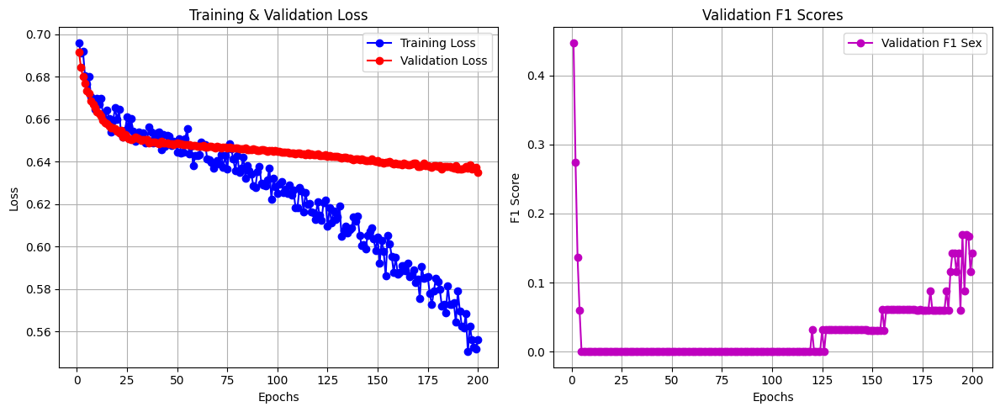

In [165]:
# train_losses: List of average training loss per epoch
# val_losses: List of average validation loss per epoch
# val_metrics_history: List of dictionaries, where each dict contains metrics for one epoch

# --- Plotting Loss ---
epochs = range(1, len(train_losses) + 1)

plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.plot(epochs, train_losses, 'b-o', label='Training Loss')
plt.plot(epochs, val_losses, 'r-o', label='Validation Loss')
plt.title('Training & Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)

# --- Plotting a Key Metric (e.g., Custom F1 Avg) ---
# Extract the metric history for plotting

f1_sex_history = [metrics.get('f1_Sex', np.nan) for metrics in val_metrics_history]


plt.subplot(1, 2, 2)

plt.plot(epochs, f1_sex_history, 'm-o', label='Validation F1 Sex')
plt.title('Validation F1 Scores')
plt.xlabel('Epochs')
plt.ylabel('F1 Score')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()


--- Starting Test Set Evaluation ---
Loading best model weights from: best_model_sex_only_checkpoint.pth
Model loaded successfully.
Running inference on the test set...


/tmp/ipykernel_13/2925485795.py:27: FutureWarning:

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.



[Test Inference]:   0%|                                                       | 0/6 [00:00<?, ?it/s]

Calculating final test metrics...
Using threshold: 0.5

--- Test Set Performance ---
Accuracy:  0.5165
F1 Score:  0.4500
Recall:    0.5714
Precision: 0.3711
AUC-ROC:   0.5460

Confusion Matrix:
[[58 61]
 [27 36]]


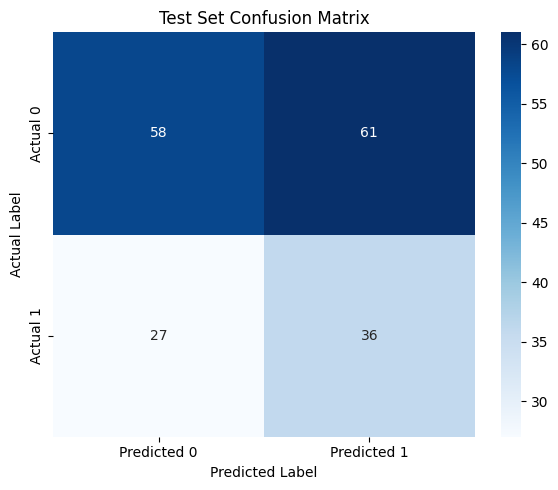


--- Test Set Evaluation Finished ---


In [166]:
# --- Step 9: Evaluate the Best Model on the Test Set ---

print("\n--- Starting Test Set Evaluation ---")

# --- Configuration ---
model_checkpoint_path = 'best_model_sex_only_checkpoint.pth'

# --- Check if test_loader and checkpoint exist ---
if 'test_loader' not in locals():
    print("Error: 'test_loader' is not defined. Please create a DataLoader for your test set.")
    # Optionally, exit or skip evaluation
    # exit()
elif not os.path.exists(model_checkpoint_path):
    print(f"Error: Model checkpoint '{model_checkpoint_path}' not found. Cannot evaluate.")
    # Optionally, exit or skip evaluation
    # exit()
else:
    # --- Load the Best Model ---
    print(f"Loading best model weights from: {model_checkpoint_path}")
    # Instantiate a new model instance with the same architecture as during training
    eval_model = BrainGNN_BatchNorm(num_node_features=num_node_features,
                                    num_classes=num_classes, # Should be 1
                                    hidden_channels=hidden_channels)

    try:
        # Load the saved state dictionary
        eval_model.load_state_dict(torch.load(model_checkpoint_path, map_location=device)) # Use map_location for flexibility
        eval_model.to(device) # Move the loaded model to the correct device
        eval_model.eval() # Set the model to evaluation mode
        print("Model loaded successfully.")
    except Exception as e:
        print(f"Error loading model state_dict: {e}")
        # Optionally, exit or skip evaluation
        # exit()


    # --- Perform Inference on Test Set ---
    all_test_outputs_list = []
    all_test_labels_list = []

    print("Running inference on the test set...")
    with torch.no_grad(): # Disable gradient calculations for inference
        test_pbar = tqdm(test_loader, desc="[Test Inference]", leave=False, ncols=100)
        for batch in test_pbar:
            try:
                batch = batch.to(device)
                outputs = eval_model(batch.x, batch.edge_index, batch.edge_attr, batch.batch) # Shape: [batch_size, 1]

                # *** Select the correct target column (assuming Sex_F is index 1) ***
                # Adapt this logic based on your test data structure
                if batch.y.dim() > 1 and batch.y.shape[1] > 1:
                    correct_labels_for_metrics = batch.y[:, 1].cpu() # Store the correct labels (CPU)
                else:
                    correct_labels_for_metrics = batch.y.cpu() # Store the correct labels (CPU)

                # Store results (outputs are raw logits)
                all_test_outputs_list.append(outputs.cpu())
                all_test_labels_list.append(correct_labels_for_metrics)

            except Exception as e:
                print(f"\nError during test batch: {e}")
                print(f"Batch data keys: {batch.keys}")
                print(f"Output shape: {outputs.shape if 'outputs' in locals() else 'N/A'}")
                print(f"Target shape: {batch.y.shape if batch.y is not None else 'N/A'}")
                continue # Skip to next batch on error

    # --- Calculate Final Test Metrics ---
    if not all_test_outputs_list or not all_test_labels_list:
        print("Warning: No test results collected, cannot calculate final metrics.")
    else:
        try:
            print("Calculating final test metrics...")
            all_test_outputs = torch.cat(all_test_outputs_list, dim=0) # Shape: [total_test_samples, 1]
            all_test_labels = torch.cat(all_test_labels_list, dim=0)   # Shape: [total_test_samples, 1] or [total_test_samples]

            # Get probabilities and predicted classes (thresholding at 0.5)
            test_probs = torch.sigmoid(all_test_outputs.squeeze()) # Squeeze to [total_test_samples]
            # --- Thresholding ---
            # You might want to experiment with different thresholds here if 0.5 isn't optimal
            threshold = 0.5
            test_preds = (test_probs > threshold).float() # Shape: [total_test_samples]
            print(f"Using threshold: {threshold}")

            # Convert to NumPy for sklearn functions
            y_true_np = all_test_labels.squeeze().numpy() # Squeeze to 1D array
            y_pred_np = test_preds.numpy()
            y_prob_np = test_probs.numpy()

            # --- Calculate Metrics ---
            test_accuracy = accuracy_score(y_true_np, y_pred_np)
            test_f1 = f1_score(y_true_np, y_pred_np, zero_division=0)
            test_recall = recall_score(y_true_np, y_pred_np, zero_division=0)
            test_precision = precision_score(y_true_np, y_pred_np, zero_division=0)

            # Calculate AUC only if both classes (0 and 1) are present
            if len(np.unique(y_true_np)) > 1:
                test_auc = roc_auc_score(y_true_np, y_prob_np)
            else:
                test_auc = np.nan # Assign NaN if only one class in test set

            # Calculate Confusion Matrix
            cm = confusion_matrix(y_true_np, y_pred_np)

            # --- Print Results ---
            print("\n--- Test Set Performance ---")
            print(f"Accuracy:  {test_accuracy:.4f}")
            print(f"F1 Score:  {test_f1:.4f}")
            print(f"Recall:    {test_recall:.4f}")
            print(f"Precision: {test_precision:.4f}")
            print(f"AUC-ROC:   {test_auc:.4f}")
            print("\nConfusion Matrix:")
            print(cm)

            # --- Optional: Plot Confusion Matrix ---
            try:
                plt.figure(figsize=(6, 5))
                sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                            xticklabels=['Predicted 0', 'Predicted 1'],
                            yticklabels=['Actual 0', 'Actual 1'])
                plt.ylabel('Actual Label')
                plt.xlabel('Predicted Label')
                plt.title('Test Set Confusion Matrix')
                plt.tight_layout()
                plt.show()
            except Exception as plot_e:
                print(f"Could not plot confusion matrix: {plot_e}")


        except Exception as e:
             print(f"\nError during final test metric calculation: {e}")

print("\n--- Test Set Evaluation Finished ---")



--- Finding Optimal Classification Threshold ---
Loading best model weights from: best_model_sex_only_checkpoint.pth
Model loaded successfully.
Running inference on the validation set to find optimal threshold...


/tmp/ipykernel_13/3988310109.py:21: FutureWarning:

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.



[Validation Inference]:   0%|                                                 | 0/6 [00:00<?, ?it/s]


Optimal Threshold based on Validation Set F1 Score: 0.4937
  Best Validation F1 Score: 0.5094
  Precision at optimal threshold: 0.3557
  Recall at optimal threshold:    0.8548


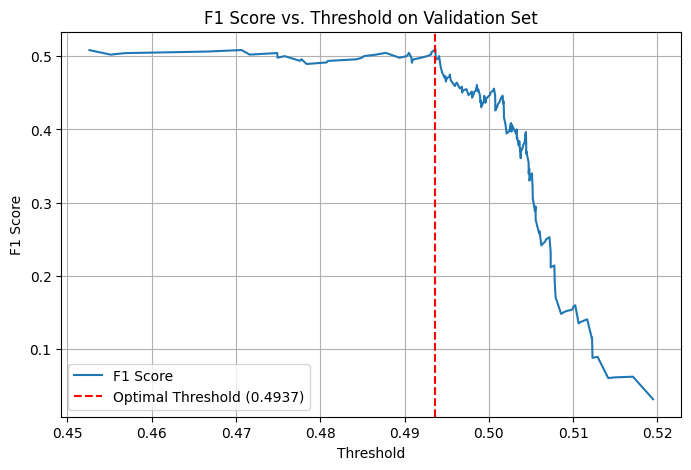


--- Re-evaluating Test Set using Optimal Threshold: 0.4937 ---


[Test Inference w/ Opt Threshold]:   0%|                                      | 0/6 [00:00<?, ?it/s]


--- Test Set Performance (Optimal Threshold) ---
Optimal Threshold: 0.4937
Accuracy:  0.4286
F1 Score:  0.4800
Recall:    0.7619
Precision: 0.3504
AUC-ROC:   0.5460 (Unaffected by threshold)

Confusion Matrix (Optimal Threshold):
[[30 89]
 [15 48]]


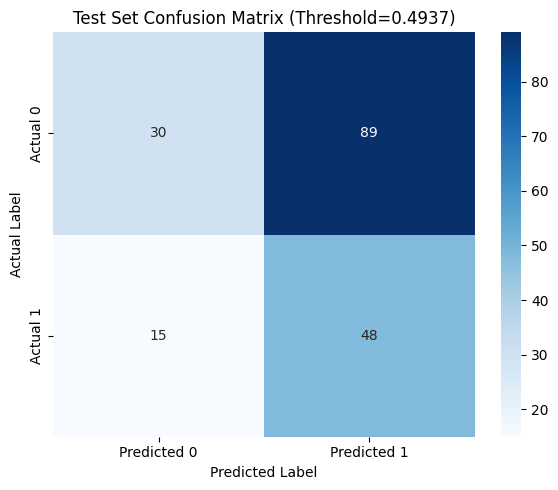


--- Optimal Threshold Finding Finished ---


In [167]:
print("\n--- Finding Optimal Classification Threshold ---")

# --- Configuration ---
model_checkpoint_path = 'best_model_sex_only_checkpoint.pth'

# --- Check if loaders and checkpoint exist ---
if 'val_loader' not in locals() or 'test_loader' not in locals():
    print("Error: 'val_loader' or 'test_loader' is not defined.")
    # exit()
elif not os.path.exists(model_checkpoint_path):
    print(f"Error: Model checkpoint '{model_checkpoint_path}' not found.")
    # exit()
else:
    # --- Load the Best Model ---
    print(f"Loading best model weights from: {model_checkpoint_path}")
    # Instantiate a new model instance
    eval_model = BrainGNN_BatchNorm(num_node_features=num_node_features,
                                    num_classes=num_classes, # Should be 1
                                    hidden_channels=hidden_channels)
    try:
        eval_model.load_state_dict(torch.load(model_checkpoint_path, map_location=device))
        eval_model.to(device)
        eval_model.eval() # Set to evaluation mode
        print("Model loaded successfully.")
    except Exception as e:
        print(f"Error loading model state_dict: {e}")
        # exit()

    # --- Get Probabilities on Validation Set ---
    all_val_outputs_list = []
    all_val_labels_list = []
    print("Running inference on the validation set to find optimal threshold...")
    with torch.no_grad():
        val_pbar = tqdm(val_loader, desc="[Validation Inference]", leave=False, ncols=100)
        for batch in val_pbar:
            try:
                batch = batch.to(device)
                outputs = eval_model(batch.x, batch.edge_index, batch.edge_attr, batch.batch)

                # Select the correct target column (assuming Sex_F is index 1)
                if batch.y.dim() > 1 and batch.y.shape[1] > 1:
                    correct_labels_for_metrics = batch.y[:, 1].cpu()
                else:
                    correct_labels_for_metrics = batch.y.cpu()

                all_val_outputs_list.append(outputs.cpu())
                all_val_labels_list.append(correct_labels_for_metrics)
            except Exception as e:
                print(f"\nError during validation batch for threshold finding: {e}")
                continue

    if not all_val_outputs_list or not all_val_labels_list:
        print("Warning: No validation results collected, cannot find threshold.")
    else:
        all_val_outputs = torch.cat(all_val_outputs_list, dim=0)
        all_val_labels = torch.cat(all_val_labels_list, dim=0)

        # Get probabilities
        val_probs = torch.sigmoid(all_val_outputs.squeeze()).numpy()
        y_true_val = all_val_labels.squeeze().numpy()

        # --- Calculate Precision, Recall, F1 for different thresholds ---
        # precision_recall_curve returns precision, recall, thresholds
        # Note: thresholds[i] corresponds to precision[i+1] and recall[i+1]
        precision, recall, thresholds = precision_recall_curve(y_true_val, val_probs)

        # Calculate F1 score for each threshold point (excluding the last element of p/r)
        # Add epsilon to avoid division by zero
        epsilon = 1e-7
        f1_scores = 2 * (precision[:-1] * recall[:-1]) / (precision[:-1] + recall[:-1] + epsilon)

        # Find the threshold that maximizes F1 score
        best_f1_idx = np.argmax(f1_scores)
        optimal_threshold = thresholds[best_f1_idx]
        best_f1 = f1_scores[best_f1_idx]
        best_precision = precision[best_f1_idx + 1] # +1 because thresholds is shorter
        best_recall = recall[best_f1_idx + 1]    # +1 because thresholds is shorter

        print(f"\nOptimal Threshold based on Validation Set F1 Score: {optimal_threshold:.4f}")
        print(f"  Best Validation F1 Score: {best_f1:.4f}")
        print(f"  Precision at optimal threshold: {best_precision:.4f}")
        print(f"  Recall at optimal threshold:    {best_recall:.4f}")

        # --- Optional: Plot F1 vs Threshold ---
        try:
            plt.figure(figsize=(8, 5))
            plt.plot(thresholds, f1_scores, label='F1 Score')
            plt.xlabel('Threshold')
            plt.ylabel('F1 Score')
            plt.title('F1 Score vs. Threshold on Validation Set')
            plt.axvline(optimal_threshold, color='r', linestyle='--', label=f'Optimal Threshold ({optimal_threshold:.4f})')
            plt.legend()
            plt.grid(True)
            plt.show()
        except Exception as plot_e:
            print(f"Could not plot F1 vs Threshold: {plot_e}")


        # --- Re-evaluate Test Set using Optimal Threshold ---
        print(f"\n--- Re-evaluating Test Set using Optimal Threshold: {optimal_threshold:.4f} ---")
        all_test_outputs_list = []
        all_test_labels_list = []
        with torch.no_grad():
            test_pbar = tqdm(test_loader, desc="[Test Inference w/ Opt Threshold]", leave=False, ncols=100)
            for batch in test_pbar:
                try:
                    batch = batch.to(device)
                    outputs = eval_model(batch.x, batch.edge_index, batch.edge_attr, batch.batch)
                    if batch.y.dim() > 1 and batch.y.shape[1] > 1:
                        correct_labels_for_metrics = batch.y[:, 1].cpu()
                    else:
                        correct_labels_for_metrics = batch.y.cpu()
                    all_test_outputs_list.append(outputs.cpu())
                    all_test_labels_list.append(correct_labels_for_metrics)
                except Exception as e:
                    print(f"\nError during test batch for re-evaluation: {e}")
                    continue

        if not all_test_outputs_list or not all_test_labels_list:
            print("Warning: No test results collected for re-evaluation.")
        else:
            all_test_outputs = torch.cat(all_test_outputs_list, dim=0)
            all_test_labels = torch.cat(all_test_labels_list, dim=0)

            test_probs = torch.sigmoid(all_test_outputs.squeeze()).numpy()
            y_true_test = all_test_labels.squeeze().numpy()

            # Apply the optimal threshold found on the validation set
            test_preds_optimal = (test_probs > optimal_threshold).astype(int)

            # Calculate metrics with the new threshold
            test_accuracy_opt = accuracy_score(y_true_test, test_preds_optimal)
            test_f1_opt = f1_score(y_true_test, test_preds_optimal, zero_division=0)
            test_recall_opt = recall_score(y_true_test, test_preds_optimal, zero_division=0)
            test_precision_opt = precision_score(y_true_test, test_preds_optimal, zero_division=0)
            # AUC doesn't depend on the threshold, so it remains the same
            if len(np.unique(y_true_test)) > 1:
                test_auc = roc_auc_score(y_true_test, test_probs) # Use original probs for AUC
            else:
                test_auc = np.nan

            cm_opt = confusion_matrix(y_true_test, test_preds_optimal)

            print("\n--- Test Set Performance (Optimal Threshold) ---")
            print(f"Optimal Threshold: {optimal_threshold:.4f}")
            print(f"Accuracy:  {test_accuracy_opt:.4f}")
            print(f"F1 Score:  {test_f1_opt:.4f}")
            print(f"Recall:    {test_recall_opt:.4f}")
            print(f"Precision: {test_precision_opt:.4f}")
            print(f"AUC-ROC:   {test_auc:.4f} (Unaffected by threshold)")
            print("\nConfusion Matrix (Optimal Threshold):")
            print(cm_opt)

            # --- Optional: Plot New Confusion Matrix ---
            try:
                plt.figure(figsize=(6, 5))
                sns.heatmap(cm_opt, annot=True, fmt='d', cmap='Blues',
                            xticklabels=['Predicted 0', 'Predicted 1'],
                            yticklabels=['Actual 0', 'Actual 1'])
                plt.ylabel('Actual Label')
                plt.xlabel('Predicted Label')
                plt.title(f'Test Set Confusion Matrix (Threshold={optimal_threshold:.4f})')
                plt.tight_layout()
                plt.show()
            except Exception as plot_e:
                print(f"Could not plot optimal confusion matrix: {plot_e}")


print("\n--- Optimal Threshold Finding Finished ---")



# Feature selections on Functional Connectivity Metrics 

In [168]:
my_classifiers = {
    "Logistic Regression": LogisticRegression(),
    "Gaussian NB": GaussianNB(),
    "LightGBM": LGBMClassifier(force_col_wise=True,verbose=-1),
    "CatBoost": CatBoostClassifier(verbose=0)
}

In [169]:
def try_classifiers_(
    df, col_feature , col_target, classifiers=my_classifiers, cv=5, random_state = SEED
):
    """
    Trains and evaluates multiple classifiers using stratified k-fold
    cross-validation on the training data and then evaluates each trained
    classifier once on a hold-out test set.

    Parameters
    ----------
    df : pd.DataFrame
        The input Pandas DataFrame containing features and the target variable.
    col_feature : list of str
        A list of column names in the DataFrame to be used as features.
    col_target : str
        The column name in the DataFrame to be used as the target variable.
    classifiers : dict
        A dictionary where keys are the names of the classifiers (strings)
        and values are the initialized classifier objects.
        e.g., {'Logistic Regression': LogisticRegression(), 'Random Forest': RandomForestClassifier(random_state=42)}
    cv : int, default=5
        Number of folds to use for StratifiedKFold cross-validation.
    random_state : int, default = SEED
        Random seed for reproducibility of the data splitting and
        cross-validation shuffling. Pass an int for reproducible output
        across multiple function calls.

    Returns
    -------
    pd.DataFrame
        A Pandas DataFrame containing the cross-validation mean and standard
        deviation for accuracy, precision, recall, and F1-score, as well as
        the corresponding scores on the hold-out test set for each classifier.
        The DataFrame has columns: 'Model', 'CV Accuracy', 'CV Precision',
        'CV Recall', 'CV F1', 'Test Accuracy', 'Test Precision',
        'Test Recall', and 'Test F1'.
    """

    # Select features (X) and target (y) from the DataFrame
    X = df[col_feature]
    y = df[col_target]

    # Split the data into training and testing sets, maintaining class proportions
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=random_state, stratify=y)

    # Scale the features using StandardScaler
    #scaler = StandardScaler()
    #X_train = scaler.fit_transform(X_train)
    #X_test = scaler.transform(X_test)

    # Define StratifiedKFold for cross-validation
    skf = StratifiedKFold(n_splits=cv, shuffle=True, random_state=random_state)

    # Define scoring metrics
    scoring = {
        "acc": make_scorer(accuracy_score),
        "prec": make_scorer(precision_score, zero_division=0),
        "rec": make_scorer(recall_score, zero_division=0),
        "f1": make_scorer(f1_score, zero_division=0),
    }

    # Initialize an empty list to store the results
    records = []

    # Iterate through each classifier in the provided dictionary
    for name, clf in classifiers.items():
        # Perform stratified k-fold cross-validation on the training data
        cv_res = cross_validate(
            clf, X_train, y_train,
            cv=skf, scoring=scoring, n_jobs=-1, return_train_score=False
        )

        # Train the classifier on the entire training set
        clf.fit(X_train, y_train)

        # Make predictions on the hold-out test set
        y_pred = clf.predict(X_test)

        # Store the results for the current classifier
        records.append({
            "Model": name,
            "CV Accuracy": f"{cv_res['test_acc'].mean():.4f} ± {cv_res['test_acc'].std():.4f}",
            "CV Precision": f"{cv_res['test_prec'].mean():.4f} ± {cv_res['test_prec'].std():.4f}",
            "CV Recall": f"{cv_res['test_rec'].mean():.4f} ± {cv_res['test_rec'].std():.4f}",
            "CV F1": f"{cv_res['test_f1'].mean():.4f} ± {cv_res['test_f1'].std():.4f}",
            "Test Accuracy": accuracy_score(y_test, y_pred),
            "Test Precision": precision_score(y_test, y_pred, zero_division=0),
            "Test Recall": recall_score(y_test, y_pred, zero_division=0),
            "Test F1": f1_score(y_test, y_pred, zero_division=0),
        })

    # Return the results as a Pandas DataFrame
    return pd.DataFrame(records)

#### ========================Feature Selection based on p and r=================

In [170]:
# 1. Prepare and Calcultae
df = df_m.merge(df_s,on='participant_id',how='inner')

drop_cols = ['participant_id', 'ADHD_Outcome', 'Sex_F']


features = [c for c in df.columns if c not in drop_cols]
y = df['Sex_F']

# 3. Compute r & p for each feature
r_values = {}
p_values = {}
for col in features:
    x = df[col]
    mask = x.notna() & y.notna()
    if mask.sum() < 2:
        r_values[col] = 0.0
        p_values[col] = 1.0
    else:
        r, p = pearsonr(x[mask], y[mask])
        r_values[col] = abs(r)
        p_values[col] = p

r_series = pd.Series(r_values)
p_series = pd.Series(p_values)


In [171]:
# 2. Configuration
drop_cols = ['participant_id', 'ADHD_Outcome', 'Sex_F']
alpha    = 0.05                   # p‐value cutoff for significance
thresholds = {                    # |r| thresholds
    'strong': 0.130,
    'medium': 0.120,
    'weak':   0.105,
}

In [172]:
# 3. Initialize buckets
selected = {
    'strong': [],
    'medium': [],
    'weak': [],
    'other': []
}

# 4. Bucket features
for col in features:
    r = r_series[col]
    p = p_series[col]
    if p < alpha:
        # only bucket by r if significant
        if r >= thresholds['strong']:
            selected['strong'].append(col)
        elif r >= thresholds['medium']:
            selected['medium'].append(col)
        elif r >= thresholds['weak']:
            selected['weak'].append(col)
        else:
            selected['other'].append(col)
    else:
        # non‐significant go in 'other'
        selected['other'].append(col)

# 5. Inspect counts
print({k: len(v) for k, v in selected.items()})



{'strong': 40, 'medium': 47, 'weak': 128, 'other': 19685}


In [173]:
col_feature = selected['strong']
col_target = 'Sex_F'
df_result = try_classifiers_(df,col_feature,col_target)

In [174]:
display(df_result.sort_values(by=['Test F1','Test Accuracy'],ascending=False))

,Model,CV Accuracy,CV Precision,CV Recall,CV F1,Test Accuracy,Test Precision,Test Recall,Test F1
1,Gaussian NB,0.6588 ± 0.0389,0.5011 ± 0.0507,0.5765 ± 0.0843,0.5353 ± 0.0640,0.670782,0.516484,0.566265,0.540230
2,LightGBM,0.6814 ± 0.0164,0.5558 ± 0.0326,0.3571 ± 0.0575,0.4325 ± 0.0500,0.724280,0.648148,0.421687,0.510949
0,Logistic Regression,0.7000 ± 0.0404,0.6024 ± 0.0966,0.3899 ± 0.0729,0.4701 ± 0.0740,0.707819,0.615385,0.385542,0.474074
3,CatBoost,0.6928 ± 0.0148,0.6015 ± 0.0547,0.3332 ± 0.0344,0.4259 ± 0.0250,0.691358,0.586957,0.325301,0.418605


#### With top 40 correlation features statistically important

| Model              | CV Accuracy       | CV Precision       | CV Recall          | CV F1              | Test Accuracy | Test Precision | Test Recall | Test F1   |
|--------------------|-------------------|---------------------|---------------------|---------------------|----------------|------------------|--------------|------------|
| **Gaussian NB**     | 0.6588 ± 0.0389   | 0.5011 ± 0.0507     | 0.5765 ± 0.0843     | 0.5353 ± 0.0640     | 0.670782       | 0.516484         | 0.566265     | 0.540230   |
| **LightGBM**        | 0.6814 ± 0.0164   | 0.5558 ± 0.0326     | 0.3571 ± 0.0575     | 0.4325 ± 0.0500     | 0.724280       | 0.648148         | 0.421687     | 0.510949   |
| **Logistic Regression** | 0.7000 ± 0.0404 | 0.6024 ± 0.0966     | 0.3899 ± 0.0729     | 0.4701 ± 0.0740     | 0.707819       | 0.615385         | 0.385542     | 0.474074   |
| **CatBoost**         | 0.6928 ± 0.0148   | 0.6015 ± 0.0547     | 0.3332 ± 0.0344     | 0.4259 ± 0.0250     | 0.691358       | 0.586957         | 0.325301     | 0.418605   |


#### `Gaussian NB` has best Test F1 score at 0.54

#### `LightGBM` has best Test Accuracy at 0.724



## Test F1 score maximize

In [175]:
# 0. Merge data & define target
df = df_m.merge(df_s, on='participant_id', how='inner')
y  = df['Sex_F']

# 1. Compute |r| and p-values
drop_cols = ['participant_id', 'ADHD_Outcome', 'Sex_F']
features  = [c for c in df.columns if c not in drop_cols]

r_values, p_values = {}, {}
for col in features:
    x = df[col]
    mask = x.notna() & y.notna()
    if mask.sum() < 2:
        r_values[col], p_values[col] = 0.0, 1.0
    else:
        r, p = pearsonr(x[mask], y[mask])
        r_values[col], p_values[col] = abs(r), p

r_series = pd.Series(r_values)
p_series = pd.Series(p_values)

# 2. Filter significant features and sort by |r|
alpha     = 0.05
sig_feats = [f for f in features if p_series[f] < alpha]
sig_feats.sort(key=lambda f: r_series[f], reverse=True)

# 3. Train/test split once
X = df[sig_feats]
X_train, X_test, y_train, y_test = train_test_split(
    X, y, stratify=y, test_size=0.2, random_state=SEED
)

###################################common########################


Best test-F1=0.6270 with top-463 features (from 20 to 700).


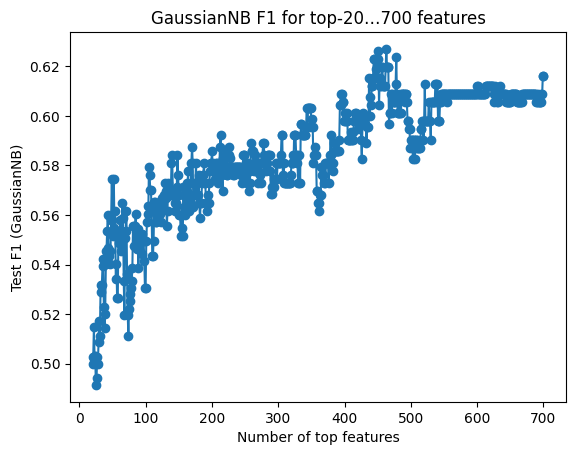

In [176]:
# 4. Loop n from 20 to 700 (or max available)
start_n, end_n = 20, 700
results = []
for n in range(start_n, min(end_n, len(sig_feats)) + 1):
    topn = sig_feats[:n]
    model = GaussianNB().fit(X_train[topn], y_train)
    y_pred = model.predict(X_test[topn])
    f1 = f1_score(y_test, y_pred)
    results.append((n, f1))

# 5. Find best
best_n, best_f1 = max(results, key=lambda x: x[1])
print(f"Best test-F1={best_f1:.4f} with top-{best_n} features (from {start_n} to {end_n}).")

# 6. Plot the F1 curve
ns, f1s = zip(*results)
plt.plot(ns, f1s, marker='o')
plt.xlabel("Number of top features")
plt.ylabel("Test F1 (GaussianNB)")
plt.title(f"GaussianNB F1 for top-{start_n}…{end_n} features")
plt.show()

### **Best test-F1=0.6270 with top-463 features (from 20 to 700).**

# Best model for Sex prediction

In [177]:
# 1. Load your full training set
df_train = df_m.merge(df_s, on='participant_id', how='inner')
y_train  = df_train['Sex_F']

# 2. Recompute r & p (so you can reconstruct the same top-463 list)
drop_cols = ['participant_id', 'ADHD_Outcome', 'Sex_F']
features  = [c for c in df_train.columns if c not in drop_cols]

r_vals, p_vals = {}, {}
for col in features:
    x = df_train[col]
    mask = x.notna() & y_train.notna()
    if mask.sum() < 2:
        r_vals[col], p_vals[col] = 0.0, 1.0
    else:
        r, p = pearsonr(x[mask], y_train[mask])
        r_vals[col], p_vals[col] = abs(r), p

r_series = pd.Series(r_vals)
p_series = pd.Series(p_vals)

# 3. Filter by p < 0.05 and sort by descending |r|
alpha     = 0.05
sig_feats = [f for f in features if p_series[f] < alpha]
sig_feats.sort(key=lambda f: r_series[f], reverse=True)

# 4. Select top-463 features
top_n = 463
selected_features = sig_feats[:top_n]

# 5. Train GaussianNB on the entire training set
X_train = df_train[selected_features]
model   = GaussianNB().fit(X_train, y_train)

# 6. Save the model, the feature list, and your best-F1 metadata
artifact = {
    'model': model,
    'features': selected_features,
    'test_f1': 0.6270     # your pre-computed best F1
}
joblib.dump(artifact, 'gaussian_nb_top463_fulltrain.pkl')
print("Saved best model → gaussian_nb_top463_fulltrain.pkl")

Saved best model → gaussian_nb_top463_fulltrain.pkl


# Submit

#### ============DL+ML============================

Using device: cpu

--- Step 1: Loading All Data ---

--- Step 2: Preparing GNN Data (Sex Prediction) ---


Processing GNN Training Data:   0%|          | 0/1213 [00:00<?, ?it/s]

Processing GNN Kaggle Test Data:   0%|          | 0/304 [00:00<?, ?it/s]

GNN Data: Train=970, Val=243, Kaggle Test=304

--- Step 3: Preparing Quantitative Data (ADHD Prediction) ---
Initial df_q shape: (1213, 19)
Initial test_q shape: (304, 19)
Dropping column 'MRI_Track_Age_at_Scan' from df_q...
Dropping column 'MRI_Track_Age_at_Scan' from test_q...
Number of quantitative features after dropping: 17
Imputing NaN values using median from training data (df_q)...
NaNs remaining in df_q_imputed: 0
NaNs remaining in test_q_imputed: 0
Fitting Scaler+PCA on cleaned full quantitative training data...
PCA (ADHD) selected 12 components.
Quantitative Data: Train Processed Shape=(1213, 12), Kaggle Test Processed Shape=(304, 12)
ADHD preprocessor saved to final_adhd_preprocessor.joblib

--- Step 4: Defining Models ---

--- Step 5: Defining GNN Helper Functions ---

--- Step 6: Initial GNN Training (Sex) & Find Best Epoch ---
Calculated pos_weight for Sex: 1.8614


[Train]:   0%|                                                               | 0/31 [00:00<?, ?it/s]

[Validate]:   0%|                                                             | 0/8 [00:00<?, ?it/s]

Epoch 1/100 [42.21s] (Initial Sex GNN) => Train Loss: 0.9113, Val Loss: 0.8794, Val F1: 0.0000
    -> Best Val F1 improved. Saving model to best_gnn_sex_model.pth


[Train]:   0%|                                                               | 0/31 [00:00<?, ?it/s]

[Validate]:   0%|                                                             | 0/8 [00:00<?, ?it/s]

Epoch 2/100 [40.37s] (Initial Sex GNN) => Train Loss: 0.9136, Val Loss: 0.8815, Val F1: 0.0920
    -> Best Val F1 improved. Saving model to best_gnn_sex_model.pth


[Train]:   0%|                                                               | 0/31 [00:00<?, ?it/s]

[Validate]:   0%|                                                             | 0/8 [00:00<?, ?it/s]

Epoch 3/100 [42.51s] (Initial Sex GNN) => Train Loss: 0.9151, Val Loss: 0.8830, Val F1: 0.2993
    -> Best Val F1 improved. Saving model to best_gnn_sex_model.pth


[Train]:   0%|                                                               | 0/31 [00:00<?, ?it/s]

[Validate]:   0%|                                                             | 0/8 [00:00<?, ?it/s]

Epoch 4/100 [45.95s] (Initial Sex GNN) => Train Loss: 0.8988, Val Loss: 0.8839, Val F1: 0.4339
    -> Best Val F1 improved. Saving model to best_gnn_sex_model.pth


[Train]:   0%|                                                               | 0/31 [00:00<?, ?it/s]

[Validate]:   0%|                                                             | 0/8 [00:00<?, ?it/s]

Epoch 5/100 [74.16s] (Initial Sex GNN) => Train Loss: 0.9008, Val Loss: 0.8832, Val F1: 0.3593


[Train]:   0%|                                                               | 0/31 [00:00<?, ?it/s]

[Validate]:   0%|                                                             | 0/8 [00:00<?, ?it/s]

Epoch 6/100 [43.66s] (Initial Sex GNN) => Train Loss: 0.9080, Val Loss: 0.8821, Val F1: 0.3953


[Train]:   0%|                                                               | 0/31 [00:00<?, ?it/s]

[Validate]:   0%|                                                             | 0/8 [00:00<?, ?it/s]

Epoch 7/100 [43.92s] (Initial Sex GNN) => Train Loss: 0.9052, Val Loss: 0.8839, Val F1: 0.4061


[Train]:   0%|                                                               | 0/31 [00:00<?, ?it/s]

[Validate]:   0%|                                                             | 0/8 [00:00<?, ?it/s]

Epoch 8/100 [44.07s] (Initial Sex GNN) => Train Loss: 0.9133, Val Loss: 0.8845, Val F1: 0.3497


[Train]:   0%|                                                               | 0/31 [00:00<?, ?it/s]

[Validate]:   0%|                                                             | 0/8 [00:00<?, ?it/s]

Epoch 9/100 [44.31s] (Initial Sex GNN) => Train Loss: 0.9085, Val Loss: 0.8818, Val F1: 0.3558


[Train]:   0%|                                                               | 0/31 [00:00<?, ?it/s]

[Validate]:   0%|                                                             | 0/8 [00:00<?, ?it/s]

Epoch 10/100 [44.91s] (Initial Sex GNN) => Train Loss: 0.9081, Val Loss: 0.8851, Val F1: 0.3878


[Train]:   0%|                                                               | 0/31 [00:00<?, ?it/s]

[Validate]:   0%|                                                             | 0/8 [00:00<?, ?it/s]

Epoch 11/100 [45.55s] (Initial Sex GNN) => Train Loss: 0.8981, Val Loss: 0.8836, Val F1: 0.3277


[Train]:   0%|                                                               | 0/31 [00:00<?, ?it/s]

[Validate]:   0%|                                                             | 0/8 [00:00<?, ?it/s]

Epoch 12/100 [43.76s] (Initial Sex GNN) => Train Loss: 0.9050, Val Loss: 0.8847, Val F1: 0.3333


[Train]:   0%|                                                               | 0/31 [00:00<?, ?it/s]

[Validate]:   0%|                                                             | 0/8 [00:00<?, ?it/s]

Epoch 13/100 [44.18s] (Initial Sex GNN) => Train Loss: 0.9043, Val Loss: 0.8834, Val F1: 0.3494


[Train]:   0%|                                                               | 0/31 [00:00<?, ?it/s]

[Validate]:   0%|                                                             | 0/8 [00:00<?, ?it/s]

Epoch 14/100 [43.85s] (Initial Sex GNN) => Train Loss: 0.9005, Val Loss: 0.8825, Val F1: 0.4100


[Train]:   0%|                                                               | 0/31 [00:00<?, ?it/s]

[Validate]:   0%|                                                             | 0/8 [00:00<?, ?it/s]

Epoch 15/100 [44.07s] (Initial Sex GNN) => Train Loss: 0.9048, Val Loss: 0.8822, Val F1: 0.4369
    -> Best Val F1 improved. Saving model to best_gnn_sex_model.pth


[Train]:   0%|                                                               | 0/31 [00:00<?, ?it/s]

[Validate]:   0%|                                                             | 0/8 [00:00<?, ?it/s]

Epoch 16/100 [44.69s] (Initial Sex GNN) => Train Loss: 0.9020, Val Loss: 0.8811, Val F1: 0.3108


[Train]:   0%|                                                               | 0/31 [00:00<?, ?it/s]

[Validate]:   0%|                                                             | 0/8 [00:00<?, ?it/s]

Epoch 17/100 [43.64s] (Initial Sex GNN) => Train Loss: 0.8963, Val Loss: 0.8831, Val F1: 0.4162


[Train]:   0%|                                                               | 0/31 [00:00<?, ?it/s]

[Validate]:   0%|                                                             | 0/8 [00:00<?, ?it/s]

Epoch 18/100 [44.16s] (Initial Sex GNN) => Train Loss: 0.9029, Val Loss: 0.8820, Val F1: 0.3230


[Train]:   0%|                                                               | 0/31 [00:00<?, ?it/s]

[Validate]:   0%|                                                             | 0/8 [00:00<?, ?it/s]

Epoch 19/100 [72.03s] (Initial Sex GNN) => Train Loss: 0.9033, Val Loss: 0.8810, Val F1: 0.3239


[Train]:   0%|                                                               | 0/31 [00:00<?, ?it/s]

[Validate]:   0%|                                                             | 0/8 [00:00<?, ?it/s]

Epoch 20/100 [43.86s] (Initial Sex GNN) => Train Loss: 0.8973, Val Loss: 0.8790, Val F1: 0.3804


[Train]:   0%|                                                               | 0/31 [00:00<?, ?it/s]

[Validate]:   0%|                                                             | 0/8 [00:00<?, ?it/s]

Epoch 21/100 [44.24s] (Initial Sex GNN) => Train Loss: 0.8979, Val Loss: 0.8780, Val F1: 0.4302


[Train]:   0%|                                                               | 0/31 [00:00<?, ?it/s]

[Validate]:   0%|                                                             | 0/8 [00:00<?, ?it/s]

Epoch 22/100 [43.66s] (Initial Sex GNN) => Train Loss: 0.9004, Val Loss: 0.8797, Val F1: 0.3580


[Train]:   0%|                                                               | 0/31 [00:00<?, ?it/s]

[Validate]:   0%|                                                             | 0/8 [00:00<?, ?it/s]

Epoch 23/100 [43.51s] (Initial Sex GNN) => Train Loss: 0.9061, Val Loss: 0.8786, Val F1: 0.3905


[Train]:   0%|                                                               | 0/31 [00:00<?, ?it/s]

[Validate]:   0%|                                                             | 0/8 [00:00<?, ?it/s]

Epoch 24/100 [43.96s] (Initial Sex GNN) => Train Loss: 0.8935, Val Loss: 0.8813, Val F1: 0.4300


[Train]:   0%|                                                               | 0/31 [00:00<?, ?it/s]

[Validate]:   0%|                                                             | 0/8 [00:00<?, ?it/s]

Epoch 25/100 [43.44s] (Initial Sex GNN) => Train Loss: 0.9034, Val Loss: 0.8789, Val F1: 0.3911


[Train]:   0%|                                                               | 0/31 [00:00<?, ?it/s]

[Validate]:   0%|                                                             | 0/8 [00:00<?, ?it/s]

Epoch 26/100 [43.78s] (Initial Sex GNN) => Train Loss: 0.8982, Val Loss: 0.8783, Val F1: 0.3291


[Train]:   0%|                                                               | 0/31 [00:00<?, ?it/s]

[Validate]:   0%|                                                             | 0/8 [00:00<?, ?it/s]

Epoch 27/100 [44.25s] (Initial Sex GNN) => Train Loss: 0.8923, Val Loss: 0.8797, Val F1: 0.4000


[Train]:   0%|                                                               | 0/31 [00:00<?, ?it/s]

[Validate]:   0%|                                                             | 0/8 [00:00<?, ?it/s]

Epoch 28/100 [45.42s] (Initial Sex GNN) => Train Loss: 0.8931, Val Loss: 0.8781, Val F1: 0.3354


[Train]:   0%|                                                               | 0/31 [00:00<?, ?it/s]

[Validate]:   0%|                                                             | 0/8 [00:00<?, ?it/s]

Epoch 29/100 [45.10s] (Initial Sex GNN) => Train Loss: 0.8991, Val Loss: 0.8816, Val F1: 0.3268


[Train]:   0%|                                                               | 0/31 [00:00<?, ?it/s]

[Validate]:   0%|                                                             | 0/8 [00:00<?, ?it/s]

Epoch 30/100 [44.46s] (Initial Sex GNN) => Train Loss: 0.8937, Val Loss: 0.8791, Val F1: 0.3310


[Train]:   0%|                                                               | 0/31 [00:00<?, ?it/s]

[Validate]:   0%|                                                             | 0/8 [00:00<?, ?it/s]

Epoch 31/100 [44.05s] (Initial Sex GNN) => Train Loss: 0.8939, Val Loss: 0.8764, Val F1: 0.3636


[Train]:   0%|                                                               | 0/31 [00:00<?, ?it/s]

[Validate]:   0%|                                                             | 0/8 [00:00<?, ?it/s]

Epoch 32/100 [45.61s] (Initial Sex GNN) => Train Loss: 0.8964, Val Loss: 0.8817, Val F1: 0.4088


[Train]:   0%|                                                               | 0/31 [00:00<?, ?it/s]

[Validate]:   0%|                                                             | 0/8 [00:00<?, ?it/s]

Epoch 33/100 [72.42s] (Initial Sex GNN) => Train Loss: 0.8983, Val Loss: 0.8791, Val F1: 0.3727


[Train]:   0%|                                                               | 0/31 [00:00<?, ?it/s]

[Validate]:   0%|                                                             | 0/8 [00:00<?, ?it/s]

Epoch 34/100 [44.05s] (Initial Sex GNN) => Train Loss: 0.8958, Val Loss: 0.8784, Val F1: 0.3544


[Train]:   0%|                                                               | 0/31 [00:00<?, ?it/s]

[Validate]:   0%|                                                             | 0/8 [00:00<?, ?it/s]

Epoch 35/100 [44.10s] (Initial Sex GNN) => Train Loss: 0.9024, Val Loss: 0.8771, Val F1: 0.3265


[Train]:   0%|                                                               | 0/31 [00:00<?, ?it/s]

[Validate]:   0%|                                                             | 0/8 [00:00<?, ?it/s]

Epoch 36/100 [44.08s] (Initial Sex GNN) => Train Loss: 0.9024, Val Loss: 0.8780, Val F1: 0.3934


[Train]:   0%|                                                               | 0/31 [00:00<?, ?it/s]

[Validate]:   0%|                                                             | 0/8 [00:00<?, ?it/s]

Epoch 37/100 [44.31s] (Initial Sex GNN) => Train Loss: 0.9053, Val Loss: 0.8788, Val F1: 0.3311


[Train]:   0%|                                                               | 0/31 [00:00<?, ?it/s]

[Validate]:   0%|                                                             | 0/8 [00:00<?, ?it/s]

Epoch 38/100 [43.96s] (Initial Sex GNN) => Train Loss: 0.8949, Val Loss: 0.8791, Val F1: 0.4199


[Train]:   0%|                                                               | 0/31 [00:00<?, ?it/s]

[Validate]:   0%|                                                             | 0/8 [00:00<?, ?it/s]

Epoch 39/100 [43.64s] (Initial Sex GNN) => Train Loss: 0.8944, Val Loss: 0.8790, Val F1: 0.4330


[Train]:   0%|                                                               | 0/31 [00:00<?, ?it/s]

[Validate]:   0%|                                                             | 0/8 [00:00<?, ?it/s]

Epoch 40/100 [44.23s] (Initial Sex GNN) => Train Loss: 0.8993, Val Loss: 0.8780, Val F1: 0.3908


[Train]:   0%|                                                               | 0/31 [00:00<?, ?it/s]

[Validate]:   0%|                                                             | 0/8 [00:00<?, ?it/s]

Epoch 41/100 [43.71s] (Initial Sex GNN) => Train Loss: 0.8905, Val Loss: 0.8768, Val F1: 0.4046


[Train]:   0%|                                                               | 0/31 [00:00<?, ?it/s]

[Validate]:   0%|                                                             | 0/8 [00:00<?, ?it/s]

Epoch 42/100 [43.57s] (Initial Sex GNN) => Train Loss: 0.8972, Val Loss: 0.8761, Val F1: 0.3742


[Train]:   0%|                                                               | 0/31 [00:00<?, ?it/s]

[Validate]:   0%|                                                             | 0/8 [00:00<?, ?it/s]

Epoch 43/100 [44.12s] (Initial Sex GNN) => Train Loss: 0.8908, Val Loss: 0.8741, Val F1: 0.4153


[Train]:   0%|                                                               | 0/31 [00:00<?, ?it/s]

[Validate]:   0%|                                                             | 0/8 [00:00<?, ?it/s]

Epoch 44/100 [43.61s] (Initial Sex GNN) => Train Loss: 0.8915, Val Loss: 0.8768, Val F1: 0.4286


[Train]:   0%|                                                               | 0/31 [00:00<?, ?it/s]

[Validate]:   0%|                                                             | 0/8 [00:00<?, ?it/s]

Epoch 45/100 [44.20s] (Initial Sex GNN) => Train Loss: 0.8901, Val Loss: 0.8787, Val F1: 0.3143


[Train]:   0%|                                                               | 0/31 [00:00<?, ?it/s]

[Validate]:   0%|                                                             | 0/8 [00:00<?, ?it/s]

Epoch 46/100 [47.75s] (Initial Sex GNN) => Train Loss: 0.8848, Val Loss: 0.8777, Val F1: 0.2602


[Train]:   0%|                                                               | 0/31 [00:00<?, ?it/s]

[Validate]:   0%|                                                             | 0/8 [00:00<?, ?it/s]

Epoch 47/100 [70.08s] (Initial Sex GNN) => Train Loss: 0.8887, Val Loss: 0.8750, Val F1: 0.3879


[Train]:   0%|                                                               | 0/31 [00:00<?, ?it/s]

[Validate]:   0%|                                                             | 0/8 [00:00<?, ?it/s]

Epoch 48/100 [45.20s] (Initial Sex GNN) => Train Loss: 0.8947, Val Loss: 0.8774, Val F1: 0.4294


[Train]:   0%|                                                               | 0/31 [00:00<?, ?it/s]

[Validate]:   0%|                                                             | 0/8 [00:00<?, ?it/s]

Epoch 49/100 [44.63s] (Initial Sex GNN) => Train Loss: 0.8967, Val Loss: 0.8759, Val F1: 0.4024


[Train]:   0%|                                                               | 0/31 [00:00<?, ?it/s]

[Validate]:   0%|                                                             | 0/8 [00:00<?, ?it/s]

Epoch 50/100 [43.98s] (Initial Sex GNN) => Train Loss: 0.8896, Val Loss: 0.8769, Val F1: 0.3774


[Train]:   0%|                                                               | 0/31 [00:00<?, ?it/s]

[Validate]:   0%|                                                             | 0/8 [00:00<?, ?it/s]

Epoch 51/100 [44.03s] (Initial Sex GNN) => Train Loss: 0.8938, Val Loss: 0.8782, Val F1: 0.4024


[Train]:   0%|                                                               | 0/31 [00:00<?, ?it/s]

[Validate]:   0%|                                                             | 0/8 [00:00<?, ?it/s]

Epoch 52/100 [43.70s] (Initial Sex GNN) => Train Loss: 0.8897, Val Loss: 0.8766, Val F1: 0.4246


[Train]:   0%|                                                               | 0/31 [00:00<?, ?it/s]

[Validate]:   0%|                                                             | 0/8 [00:00<?, ?it/s]

Epoch 53/100 [46.19s] (Initial Sex GNN) => Train Loss: 0.8910, Val Loss: 0.8760, Val F1: 0.4000


[Train]:   0%|                                                               | 0/31 [00:00<?, ?it/s]

[Validate]:   0%|                                                             | 0/8 [00:00<?, ?it/s]

Epoch 54/100 [44.26s] (Initial Sex GNN) => Train Loss: 0.8892, Val Loss: 0.8761, Val F1: 0.4398
    -> Best Val F1 improved. Saving model to best_gnn_sex_model.pth


[Train]:   0%|                                                               | 0/31 [00:00<?, ?it/s]

[Validate]:   0%|                                                             | 0/8 [00:00<?, ?it/s]

Epoch 55/100 [43.61s] (Initial Sex GNN) => Train Loss: 0.8897, Val Loss: 0.8750, Val F1: 0.4167


[Train]:   0%|                                                               | 0/31 [00:00<?, ?it/s]

[Validate]:   0%|                                                             | 0/8 [00:00<?, ?it/s]

Epoch 56/100 [44.06s] (Initial Sex GNN) => Train Loss: 0.8901, Val Loss: 0.8757, Val F1: 0.3975


[Train]:   0%|                                                               | 0/31 [00:00<?, ?it/s]

[Validate]:   0%|                                                             | 0/8 [00:00<?, ?it/s]

Epoch 57/100 [43.62s] (Initial Sex GNN) => Train Loss: 0.8999, Val Loss: 0.8768, Val F1: 0.4324


[Train]:   0%|                                                               | 0/31 [00:00<?, ?it/s]

[Validate]:   0%|                                                             | 0/8 [00:00<?, ?it/s]

Epoch 58/100 [43.49s] (Initial Sex GNN) => Train Loss: 0.8892, Val Loss: 0.8753, Val F1: 0.3673


[Train]:   0%|                                                               | 0/31 [00:00<?, ?it/s]

[Validate]:   0%|                                                             | 0/8 [00:00<?, ?it/s]

Epoch 59/100 [43.82s] (Initial Sex GNN) => Train Loss: 0.8910, Val Loss: 0.8758, Val F1: 0.3871


[Train]:   0%|                                                               | 0/31 [00:00<?, ?it/s]

[Validate]:   0%|                                                             | 0/8 [00:00<?, ?it/s]

Epoch 60/100 [59.54s] (Initial Sex GNN) => Train Loss: 0.8901, Val Loss: 0.8745, Val F1: 0.3905


[Train]:   0%|                                                               | 0/31 [00:00<?, ?it/s]

[Validate]:   0%|                                                             | 0/8 [00:00<?, ?it/s]

Epoch 61/100 [55.80s] (Initial Sex GNN) => Train Loss: 0.8982, Val Loss: 0.8739, Val F1: 0.3404


[Train]:   0%|                                                               | 0/31 [00:00<?, ?it/s]

[Validate]:   0%|                                                             | 0/8 [00:00<?, ?it/s]

Epoch 62/100 [44.88s] (Initial Sex GNN) => Train Loss: 0.8895, Val Loss: 0.8742, Val F1: 0.4048


[Train]:   0%|                                                               | 0/31 [00:00<?, ?it/s]

[Validate]:   0%|                                                             | 0/8 [00:00<?, ?it/s]

Epoch 63/100 [44.12s] (Initial Sex GNN) => Train Loss: 0.9007, Val Loss: 0.8738, Val F1: 0.3953


[Train]:   0%|                                                               | 0/31 [00:00<?, ?it/s]

[Validate]:   0%|                                                             | 0/8 [00:00<?, ?it/s]

Epoch 64/100 [44.57s] (Initial Sex GNN) => Train Loss: 0.8857, Val Loss: 0.8744, Val F1: 0.4024


[Train]:   0%|                                                               | 0/31 [00:00<?, ?it/s]

[Validate]:   0%|                                                             | 0/8 [00:00<?, ?it/s]

Epoch 65/100 [45.22s] (Initial Sex GNN) => Train Loss: 0.8887, Val Loss: 0.8757, Val F1: 0.3951


[Train]:   0%|                                                               | 0/31 [00:00<?, ?it/s]

[Validate]:   0%|                                                             | 0/8 [00:00<?, ?it/s]

Epoch 66/100 [45.79s] (Initial Sex GNN) => Train Loss: 0.8932, Val Loss: 0.8754, Val F1: 0.3333


[Train]:   0%|                                                               | 0/31 [00:00<?, ?it/s]

[Validate]:   0%|                                                             | 0/8 [00:00<?, ?it/s]

Epoch 67/100 [45.88s] (Initial Sex GNN) => Train Loss: 0.8890, Val Loss: 0.8738, Val F1: 0.3662


[Train]:   0%|                                                               | 0/31 [00:00<?, ?it/s]

[Validate]:   0%|                                                             | 0/8 [00:00<?, ?it/s]

Epoch 68/100 [44.35s] (Initial Sex GNN) => Train Loss: 0.8955, Val Loss: 0.8752, Val F1: 0.3673


[Train]:   0%|                                                               | 0/31 [00:00<?, ?it/s]

[Validate]:   0%|                                                             | 0/8 [00:00<?, ?it/s]

Epoch 69/100 [43.98s] (Initial Sex GNN) => Train Loss: 0.8884, Val Loss: 0.8772, Val F1: 0.4023


[Train]:   0%|                                                               | 0/31 [00:00<?, ?it/s]

[Validate]:   0%|                                                             | 0/8 [00:00<?, ?it/s]

Epoch 70/100 [44.35s] (Initial Sex GNN) => Train Loss: 0.8922, Val Loss: 0.8761, Val F1: 0.3537


[Train]:   0%|                                                               | 0/31 [00:00<?, ?it/s]

[Validate]:   0%|                                                             | 0/8 [00:00<?, ?it/s]

Epoch 71/100 [43.71s] (Initial Sex GNN) => Train Loss: 0.8849, Val Loss: 0.8759, Val F1: 0.3562


[Train]:   0%|                                                               | 0/31 [00:00<?, ?it/s]

[Validate]:   0%|                                                             | 0/8 [00:00<?, ?it/s]

Epoch 72/100 [43.76s] (Initial Sex GNN) => Train Loss: 0.8869, Val Loss: 0.8748, Val F1: 0.3791


[Train]:   0%|                                                               | 0/31 [00:00<?, ?it/s]

[Validate]:   0%|                                                             | 0/8 [00:00<?, ?it/s]

Epoch 73/100 [43.59s] (Initial Sex GNN) => Train Loss: 0.9053, Val Loss: 0.8747, Val F1: 0.3030


[Train]:   0%|                                                               | 0/31 [00:00<?, ?it/s]

[Validate]:   0%|                                                             | 0/8 [00:00<?, ?it/s]

Epoch 74/100 [72.19s] (Initial Sex GNN) => Train Loss: 0.8950, Val Loss: 0.8739, Val F1: 0.3562


[Train]:   0%|                                                               | 0/31 [00:00<?, ?it/s]

[Validate]:   0%|                                                             | 0/8 [00:00<?, ?it/s]

Epoch 75/100 [44.14s] (Initial Sex GNN) => Train Loss: 0.8935, Val Loss: 0.8745, Val F1: 0.4183


[Train]:   0%|                                                               | 0/31 [00:00<?, ?it/s]

[Validate]:   0%|                                                             | 0/8 [00:00<?, ?it/s]

Epoch 76/100 [43.80s] (Initial Sex GNN) => Train Loss: 0.8951, Val Loss: 0.8724, Val F1: 0.3951


[Train]:   0%|                                                               | 0/31 [00:00<?, ?it/s]

[Validate]:   0%|                                                             | 0/8 [00:00<?, ?it/s]

Epoch 77/100 [43.51s] (Initial Sex GNN) => Train Loss: 0.8997, Val Loss: 0.8731, Val F1: 0.3784


[Train]:   0%|                                                               | 0/31 [00:00<?, ?it/s]

[Validate]:   0%|                                                             | 0/8 [00:00<?, ?it/s]

Epoch 78/100 [44.11s] (Initial Sex GNN) => Train Loss: 0.8916, Val Loss: 0.8722, Val F1: 0.3974


[Train]:   0%|                                                               | 0/31 [00:00<?, ?it/s]

[Validate]:   0%|                                                             | 0/8 [00:00<?, ?it/s]

Epoch 79/100 [43.87s] (Initial Sex GNN) => Train Loss: 0.8891, Val Loss: 0.8737, Val F1: 0.4607
    -> Best Val F1 improved. Saving model to best_gnn_sex_model.pth


[Train]:   0%|                                                               | 0/31 [00:00<?, ?it/s]

[Validate]:   0%|                                                             | 0/8 [00:00<?, ?it/s]

Epoch 80/100 [43.79s] (Initial Sex GNN) => Train Loss: 0.8934, Val Loss: 0.8726, Val F1: 0.4503


[Train]:   0%|                                                               | 0/31 [00:00<?, ?it/s]

[Validate]:   0%|                                                             | 0/8 [00:00<?, ?it/s]

Epoch 81/100 [44.22s] (Initial Sex GNN) => Train Loss: 0.9017, Val Loss: 0.8725, Val F1: 0.4294


[Train]:   0%|                                                               | 0/31 [00:00<?, ?it/s]

[Validate]:   0%|                                                             | 0/8 [00:00<?, ?it/s]

Epoch 82/100 [44.19s] (Initial Sex GNN) => Train Loss: 0.8878, Val Loss: 0.8736, Val F1: 0.4260


[Train]:   0%|                                                               | 0/31 [00:00<?, ?it/s]

[Validate]:   0%|                                                             | 0/8 [00:00<?, ?it/s]

Epoch 83/100 [47.01s] (Initial Sex GNN) => Train Loss: 0.8883, Val Loss: 0.8729, Val F1: 0.3976


[Train]:   0%|                                                               | 0/31 [00:00<?, ?it/s]

[Validate]:   0%|                                                             | 0/8 [00:00<?, ?it/s]

Epoch 84/100 [46.52s] (Initial Sex GNN) => Train Loss: 0.9049, Val Loss: 0.8769, Val F1: 0.3766


[Train]:   0%|                                                               | 0/31 [00:00<?, ?it/s]

[Validate]:   0%|                                                             | 0/8 [00:00<?, ?it/s]

Epoch 85/100 [44.74s] (Initial Sex GNN) => Train Loss: 0.8937, Val Loss: 0.8744, Val F1: 0.3281


[Train]:   0%|                                                               | 0/31 [00:00<?, ?it/s]

[Validate]:   0%|                                                             | 0/8 [00:00<?, ?it/s]

Epoch 86/100 [44.84s] (Initial Sex GNN) => Train Loss: 0.8851, Val Loss: 0.8739, Val F1: 0.3810


[Train]:   0%|                                                               | 0/31 [00:00<?, ?it/s]

[Validate]:   0%|                                                             | 0/8 [00:00<?, ?it/s]

Epoch 87/100 [45.66s] (Initial Sex GNN) => Train Loss: 0.8783, Val Loss: 0.8727, Val F1: 0.3556


[Train]:   0%|                                                               | 0/31 [00:00<?, ?it/s]

[Validate]:   0%|                                                             | 0/8 [00:00<?, ?it/s]

Epoch 88/100 [75.01s] (Initial Sex GNN) => Train Loss: 0.8916, Val Loss: 0.8717, Val F1: 0.4082


[Train]:   0%|                                                               | 0/31 [00:00<?, ?it/s]

[Validate]:   0%|                                                             | 0/8 [00:00<?, ?it/s]

Epoch 89/100 [44.01s] (Initial Sex GNN) => Train Loss: 0.8880, Val Loss: 0.8730, Val F1: 0.3259


[Train]:   0%|                                                               | 0/31 [00:00<?, ?it/s]

[Validate]:   0%|                                                             | 0/8 [00:00<?, ?it/s]

Epoch 90/100 [43.89s] (Initial Sex GNN) => Train Loss: 0.8913, Val Loss: 0.8718, Val F1: 0.4156


[Train]:   0%|                                                               | 0/31 [00:00<?, ?it/s]

[Validate]:   0%|                                                             | 0/8 [00:00<?, ?it/s]

Epoch 91/100 [44.66s] (Initial Sex GNN) => Train Loss: 0.8881, Val Loss: 0.8728, Val F1: 0.3924


[Train]:   0%|                                                               | 0/31 [00:00<?, ?it/s]

[Validate]:   0%|                                                             | 0/8 [00:00<?, ?it/s]

Epoch 92/100 [44.35s] (Initial Sex GNN) => Train Loss: 0.8914, Val Loss: 0.8728, Val F1: 0.3816


[Train]:   0%|                                                               | 0/31 [00:00<?, ?it/s]

[Validate]:   0%|                                                             | 0/8 [00:00<?, ?it/s]

Epoch 93/100 [44.22s] (Initial Sex GNN) => Train Loss: 0.8880, Val Loss: 0.8741, Val F1: 0.3841


[Train]:   0%|                                                               | 0/31 [00:00<?, ?it/s]

[Validate]:   0%|                                                             | 0/8 [00:00<?, ?it/s]

Epoch 94/100 [45.18s] (Initial Sex GNN) => Train Loss: 0.8950, Val Loss: 0.8741, Val F1: 0.3472


[Train]:   0%|                                                               | 0/31 [00:00<?, ?it/s]

[Validate]:   0%|                                                             | 0/8 [00:00<?, ?it/s]

Epoch 95/100 [44.55s] (Initial Sex GNN) => Train Loss: 0.8807, Val Loss: 0.8728, Val F1: 0.3662


[Train]:   0%|                                                               | 0/31 [00:00<?, ?it/s]

[Validate]:   0%|                                                             | 0/8 [00:00<?, ?it/s]

Epoch 96/100 [44.92s] (Initial Sex GNN) => Train Loss: 0.8960, Val Loss: 0.8717, Val F1: 0.4231


[Train]:   0%|                                                               | 0/31 [00:00<?, ?it/s]

[Validate]:   0%|                                                             | 0/8 [00:00<?, ?it/s]

Epoch 97/100 [43.61s] (Initial Sex GNN) => Train Loss: 0.8888, Val Loss: 0.8713, Val F1: 0.4048


[Train]:   0%|                                                               | 0/31 [00:00<?, ?it/s]

[Validate]:   0%|                                                             | 0/8 [00:00<?, ?it/s]

Epoch 98/100 [43.78s] (Initial Sex GNN) => Train Loss: 0.8936, Val Loss: 0.8723, Val F1: 0.4106


[Train]:   0%|                                                               | 0/31 [00:00<?, ?it/s]

[Validate]:   0%|                                                             | 0/8 [00:00<?, ?it/s]

Epoch 99/100 [44.38s] (Initial Sex GNN) => Train Loss: 0.8881, Val Loss: 0.8725, Val F1: 0.3231


[Train]:   0%|                                                               | 0/31 [00:00<?, ?it/s]

[Validate]:   0%|                                                             | 0/8 [00:00<?, ?it/s]

Epoch 100/100 [44.13s] (Initial Sex GNN) => Train Loss: 0.8950, Val Loss: 0.8734, Val F1: 0.3252
Initial GNN training finished. Best Val F1=0.4607 at epoch 79

--- Step 7: Finding Optimal Threshold for Best GNN (Sex) ---
Finding optimal threshold for target index 1 using best_gnn_sex_model.pth...


/tmp/ipykernel_13/2576663017.py:318: FutureWarning:

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.



[Validate]:   0%|                                                             | 0/8 [00:00<?, ?it/s]

Optimal threshold found: 0.4335 (F1: 0.4898)


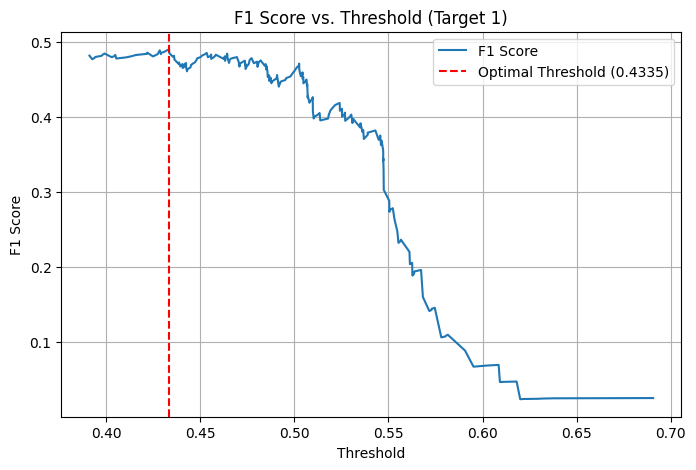


--- Step 8: Training Final Models ---
Retraining final GNN Sex model...
Retraining GNN for 79 epochs...


[Train]:   0%|                                                               | 0/38 [00:00<?, ?it/s]

Epoch 1/79 [Final GNN Sex Train] => Loss: 0.9250


[Train]:   0%|                                                               | 0/38 [00:00<?, ?it/s]

Epoch 2/79 [Final GNN Sex Train] => Loss: 0.9206


[Train]:   0%|                                                               | 0/38 [00:00<?, ?it/s]

Epoch 3/79 [Final GNN Sex Train] => Loss: 0.9116


[Train]:   0%|                                                               | 0/38 [00:00<?, ?it/s]

Epoch 4/79 [Final GNN Sex Train] => Loss: 0.9185


[Train]:   0%|                                                               | 0/38 [00:00<?, ?it/s]

Epoch 5/79 [Final GNN Sex Train] => Loss: 0.9225


[Train]:   0%|                                                               | 0/38 [00:00<?, ?it/s]

Epoch 6/79 [Final GNN Sex Train] => Loss: 0.9149


[Train]:   0%|                                                               | 0/38 [00:00<?, ?it/s]

Epoch 7/79 [Final GNN Sex Train] => Loss: 0.9161


[Train]:   0%|                                                               | 0/38 [00:00<?, ?it/s]

Epoch 8/79 [Final GNN Sex Train] => Loss: 0.9218


[Train]:   0%|                                                               | 0/38 [00:00<?, ?it/s]

Epoch 9/79 [Final GNN Sex Train] => Loss: 0.9131


[Train]:   0%|                                                               | 0/38 [00:00<?, ?it/s]

Epoch 10/79 [Final GNN Sex Train] => Loss: 0.9150


[Train]:   0%|                                                               | 0/38 [00:00<?, ?it/s]

Epoch 11/79 [Final GNN Sex Train] => Loss: 0.9168


[Train]:   0%|                                                               | 0/38 [00:00<?, ?it/s]

Epoch 12/79 [Final GNN Sex Train] => Loss: 0.9146


[Train]:   0%|                                                               | 0/38 [00:00<?, ?it/s]

Epoch 13/79 [Final GNN Sex Train] => Loss: 0.9146


[Train]:   0%|                                                               | 0/38 [00:00<?, ?it/s]

Epoch 14/79 [Final GNN Sex Train] => Loss: 0.9152


[Train]:   0%|                                                               | 0/38 [00:00<?, ?it/s]

Epoch 15/79 [Final GNN Sex Train] => Loss: 0.9093


[Train]:   0%|                                                               | 0/38 [00:00<?, ?it/s]

Epoch 16/79 [Final GNN Sex Train] => Loss: 0.9095


[Train]:   0%|                                                               | 0/38 [00:00<?, ?it/s]

Epoch 17/79 [Final GNN Sex Train] => Loss: 0.9181


[Train]:   0%|                                                               | 0/38 [00:00<?, ?it/s]

Epoch 18/79 [Final GNN Sex Train] => Loss: 0.9044


[Train]:   0%|                                                               | 0/38 [00:00<?, ?it/s]

Epoch 19/79 [Final GNN Sex Train] => Loss: 0.9059


[Train]:   0%|                                                               | 0/38 [00:00<?, ?it/s]

Epoch 20/79 [Final GNN Sex Train] => Loss: 0.9154


[Train]:   0%|                                                               | 0/38 [00:00<?, ?it/s]

Epoch 21/79 [Final GNN Sex Train] => Loss: 0.9085


[Train]:   0%|                                                               | 0/38 [00:00<?, ?it/s]

Epoch 22/79 [Final GNN Sex Train] => Loss: 0.9058


[Train]:   0%|                                                               | 0/38 [00:00<?, ?it/s]

Epoch 23/79 [Final GNN Sex Train] => Loss: 0.8980


[Train]:   0%|                                                               | 0/38 [00:00<?, ?it/s]

Epoch 24/79 [Final GNN Sex Train] => Loss: 0.9043


[Train]:   0%|                                                               | 0/38 [00:00<?, ?it/s]

Epoch 25/79 [Final GNN Sex Train] => Loss: 0.9038


[Train]:   0%|                                                               | 0/38 [00:00<?, ?it/s]

Epoch 26/79 [Final GNN Sex Train] => Loss: 0.9102


[Train]:   0%|                                                               | 0/38 [00:00<?, ?it/s]

Epoch 27/79 [Final GNN Sex Train] => Loss: 0.9062


[Train]:   0%|                                                               | 0/38 [00:00<?, ?it/s]

Epoch 28/79 [Final GNN Sex Train] => Loss: 0.9150


[Train]:   0%|                                                               | 0/38 [00:00<?, ?it/s]

Epoch 29/79 [Final GNN Sex Train] => Loss: 0.9070


[Train]:   0%|                                                               | 0/38 [00:00<?, ?it/s]

Epoch 30/79 [Final GNN Sex Train] => Loss: 0.9074


[Train]:   0%|                                                               | 0/38 [00:00<?, ?it/s]

Epoch 31/79 [Final GNN Sex Train] => Loss: 0.9103


[Train]:   0%|                                                               | 0/38 [00:00<?, ?it/s]

Epoch 32/79 [Final GNN Sex Train] => Loss: 0.9021


[Train]:   0%|                                                               | 0/38 [00:00<?, ?it/s]

Epoch 33/79 [Final GNN Sex Train] => Loss: 0.9056


[Train]:   0%|                                                               | 0/38 [00:00<?, ?it/s]

Epoch 34/79 [Final GNN Sex Train] => Loss: 0.9050


[Train]:   0%|                                                               | 0/38 [00:00<?, ?it/s]

Epoch 35/79 [Final GNN Sex Train] => Loss: 0.9034


[Train]:   0%|                                                               | 0/38 [00:00<?, ?it/s]

Epoch 36/79 [Final GNN Sex Train] => Loss: 0.9064


[Train]:   0%|                                                               | 0/38 [00:00<?, ?it/s]

Epoch 37/79 [Final GNN Sex Train] => Loss: 0.9050


[Train]:   0%|                                                               | 0/38 [00:00<?, ?it/s]

Epoch 38/79 [Final GNN Sex Train] => Loss: 0.9017


[Train]:   0%|                                                               | 0/38 [00:00<?, ?it/s]

Epoch 39/79 [Final GNN Sex Train] => Loss: 0.9055


[Train]:   0%|                                                               | 0/38 [00:00<?, ?it/s]

Epoch 40/79 [Final GNN Sex Train] => Loss: 0.8999


[Train]:   0%|                                                               | 0/38 [00:00<?, ?it/s]

Epoch 41/79 [Final GNN Sex Train] => Loss: 0.9063


[Train]:   0%|                                                               | 0/38 [00:00<?, ?it/s]

Epoch 42/79 [Final GNN Sex Train] => Loss: 0.9008


[Train]:   0%|                                                               | 0/38 [00:00<?, ?it/s]

Epoch 43/79 [Final GNN Sex Train] => Loss: 0.9023


[Train]:   0%|                                                               | 0/38 [00:00<?, ?it/s]

Epoch 44/79 [Final GNN Sex Train] => Loss: 0.9074


[Train]:   0%|                                                               | 0/38 [00:00<?, ?it/s]

Epoch 45/79 [Final GNN Sex Train] => Loss: 0.9053


[Train]:   0%|                                                               | 0/38 [00:00<?, ?it/s]

Epoch 46/79 [Final GNN Sex Train] => Loss: 0.9073


[Train]:   0%|                                                               | 0/38 [00:00<?, ?it/s]

Epoch 47/79 [Final GNN Sex Train] => Loss: 0.9042


[Train]:   0%|                                                               | 0/38 [00:00<?, ?it/s]

Epoch 48/79 [Final GNN Sex Train] => Loss: 0.9040


[Train]:   0%|                                                               | 0/38 [00:00<?, ?it/s]

Epoch 49/79 [Final GNN Sex Train] => Loss: 0.8992


[Train]:   0%|                                                               | 0/38 [00:00<?, ?it/s]

Epoch 50/79 [Final GNN Sex Train] => Loss: 0.9002


[Train]:   0%|                                                               | 0/38 [00:00<?, ?it/s]

Epoch 51/79 [Final GNN Sex Train] => Loss: 0.9047


[Train]:   0%|                                                               | 0/38 [00:00<?, ?it/s]

Epoch 52/79 [Final GNN Sex Train] => Loss: 0.8994


[Train]:   0%|                                                               | 0/38 [00:00<?, ?it/s]

Epoch 53/79 [Final GNN Sex Train] => Loss: 0.8998


[Train]:   0%|                                                               | 0/38 [00:00<?, ?it/s]

Epoch 54/79 [Final GNN Sex Train] => Loss: 0.9042


[Train]:   0%|                                                               | 0/38 [00:00<?, ?it/s]

Epoch 55/79 [Final GNN Sex Train] => Loss: 0.9035


[Train]:   0%|                                                               | 0/38 [00:00<?, ?it/s]

Epoch 56/79 [Final GNN Sex Train] => Loss: 0.9056


[Train]:   0%|                                                               | 0/38 [00:00<?, ?it/s]

Epoch 57/79 [Final GNN Sex Train] => Loss: 0.9052


[Train]:   0%|                                                               | 0/38 [00:00<?, ?it/s]

Epoch 58/79 [Final GNN Sex Train] => Loss: 0.8971


[Train]:   0%|                                                               | 0/38 [00:00<?, ?it/s]

Epoch 59/79 [Final GNN Sex Train] => Loss: 0.9037


[Train]:   0%|                                                               | 0/38 [00:00<?, ?it/s]

Epoch 60/79 [Final GNN Sex Train] => Loss: 0.9031


[Train]:   0%|                                                               | 0/38 [00:00<?, ?it/s]

Epoch 61/79 [Final GNN Sex Train] => Loss: 0.9018


[Train]:   0%|                                                               | 0/38 [00:00<?, ?it/s]

Epoch 62/79 [Final GNN Sex Train] => Loss: 0.8972


[Train]:   0%|                                                               | 0/38 [00:00<?, ?it/s]

Epoch 63/79 [Final GNN Sex Train] => Loss: 0.8989


[Train]:   0%|                                                               | 0/38 [00:00<?, ?it/s]

Epoch 64/79 [Final GNN Sex Train] => Loss: 0.8989


[Train]:   0%|                                                               | 0/38 [00:00<?, ?it/s]

Epoch 65/79 [Final GNN Sex Train] => Loss: 0.9005


[Train]:   0%|                                                               | 0/38 [00:00<?, ?it/s]

Epoch 66/79 [Final GNN Sex Train] => Loss: 0.9009


[Train]:   0%|                                                               | 0/38 [00:00<?, ?it/s]

Epoch 67/79 [Final GNN Sex Train] => Loss: 0.8993


[Train]:   0%|                                                               | 0/38 [00:00<?, ?it/s]

Epoch 68/79 [Final GNN Sex Train] => Loss: 0.8964


[Train]:   0%|                                                               | 0/38 [00:00<?, ?it/s]

Epoch 69/79 [Final GNN Sex Train] => Loss: 0.9021


[Train]:   0%|                                                               | 0/38 [00:00<?, ?it/s]

Epoch 70/79 [Final GNN Sex Train] => Loss: 0.9023


[Train]:   0%|                                                               | 0/38 [00:00<?, ?it/s]

Epoch 71/79 [Final GNN Sex Train] => Loss: 0.8961


[Train]:   0%|                                                               | 0/38 [00:00<?, ?it/s]

Epoch 72/79 [Final GNN Sex Train] => Loss: 0.8985


[Train]:   0%|                                                               | 0/38 [00:00<?, ?it/s]

Epoch 73/79 [Final GNN Sex Train] => Loss: 0.9023


[Train]:   0%|                                                               | 0/38 [00:00<?, ?it/s]

Epoch 74/79 [Final GNN Sex Train] => Loss: 0.8986


[Train]:   0%|                                                               | 0/38 [00:00<?, ?it/s]

Epoch 75/79 [Final GNN Sex Train] => Loss: 0.9010


[Train]:   0%|                                                               | 0/38 [00:00<?, ?it/s]

Epoch 76/79 [Final GNN Sex Train] => Loss: 0.9067


[Train]:   0%|                                                               | 0/38 [00:00<?, ?it/s]

Epoch 77/79 [Final GNN Sex Train] => Loss: 0.8985


[Train]:   0%|                                                               | 0/38 [00:00<?, ?it/s]

Epoch 78/79 [Final GNN Sex Train] => Loss: 0.9015


[Train]:   0%|                                                               | 0/38 [00:00<?, ?it/s]

Epoch 79/79 [Final GNN Sex Train] => Loss: 0.9010
Final GNN Sex model saved to final_gnn_sex_model.pth
Training final SVC ADHD model...
SVC training complete.
Final SVC ADHD model saved to final_svc_adhd_model.joblib

--- Step 9: Generating Kaggle Predictions ---
Predicting Sex (GNN)...


/tmp/ipykernel_13/2576663017.py:413: FutureWarning:

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.



[GNN Sex Inference]:   0%|          | 0/10 [00:00<?, ?it/s]

Generated 304 Sex predictions using threshold 0.4335.
Predicting ADHD (SVC+PCA)...
Generated 304 ADHD predictions.

--- Step 10: Creating Submission File ---
Loading sample submission from: path/to/your/sample_submission.csv
Error: Sample submission file not found at 'path/to/your/sample_submission.csv'. Cannot create file.

--- Full Pipeline Finished ---


In [178]:
# -*- coding: utf-8 -*-
"""
Full Combined Pipeline for Kaggle Submission:
1. GNN for Sex Prediction (using connectivity data: df_m, test_c)
2. SVC+PCA for ADHD Prediction (using quantitative data: df_q, test_q)

Includes data cleaning (NaN handling), GNN training, validation, threshold finding,
optional retraining, SVC+PCA fitting, prediction generation, and submission file creation.
"""

# --- Core Libraries ---
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torch_geometric.data import Data
from torch_geometric.loader import DataLoader
from torch_geometric.nn import GraphConv, global_mean_pool, BatchNorm
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.svm import SVC
from sklearn.pipeline import Pipeline as SklearnPipeline # Rename to avoid conflict
from sklearn.metrics import (accuracy_score, f1_score, recall_score,
                             precision_score, roc_auc_score, confusion_matrix,
                             precision_recall_curve)
# from sklearn.impute import SimpleImputer # Alternative imputation method
from tqdm.notebook import tqdm # Or from tqdm import tqdm
import numpy as np
import pandas as pd
import os
import time
import joblib # Optional: For saving sklearn models/preprocessors
import matplotlib.pyplot as plt # For plotting threshold curve

# --- Configuration & Setup ---
DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {DEVICE}")

# --- Constants (Adjust as needed) ---
SEED = 8828
VAL_SIZE = 0.20 # Validation split for GNN training
# GNN Config
BATCH_SIZE_GNN = 32
LEARNING_RATE_GNN = 1e-4
WEIGHT_DECAY_GNN = 1e-5
NUM_EPOCHS_GNN = 100 # Initial GNN training epochs
HIDDEN_CHANNELS_GNN = 64
NUM_NODES = 200
NUM_NODE_FEATURES_GNN = 1 # Assuming Node Strength
EDGE_THRESHOLD_GNN = 0.0
# SVC+PCA Config
N_COMPONENTS_PCA = 0.95 # Or integer number of components
# Column Names
ADHD_LABEL_COL = 'ADHD_Outcome'
SEX_LABEL_COL = 'Sex_F'
ID_COL = 'participant_id'
COLUMN_TO_DROP = 'MRI_Track_Age_at_Scan' # Column to drop from quantitative data
# File Paths & Names
MODEL_SAVE_PATH_GNN_SEX_BEST = 'best_gnn_sex_model.pth' # Best model from val
FINAL_MODEL_GNN_SEX_PATH = 'final_gnn_sex_model.pth' # Final retrained model
FINAL_PREPROCESSOR_SVC_ADHD_PATH = 'final_adhd_preprocessor.joblib'
FINAL_MODEL_SVC_ADHD_PATH = 'final_svc_adhd_model.joblib'
SUBMISSION_FILENAME = 'final_submission_combined.csv'
# Control Flags
RETRAIN_FINAL_GNN = True # Set True to retrain GNN on train+val after finding best epoch
RETRAIN_FINAL_SVC = True # Set True to train SVC on full data (recommended)

# Set seed for reproducibility
torch.manual_seed(SEED)
np.random.seed(SEED)
if torch.cuda.is_available():
    torch.cuda.manual_seed(SEED)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

# --- Step 1: Data Loading ---
print("\n--- Step 1: Loading All Data ---")
# *** USER ACTION REQUIRED: Load your actual data ***
# Example:
MODEL_SAVE_PATH_GNN_SEX_BEST = 'best_gnn_sex_model.pth' # Best model from val
FINAL_MODEL_GNN_SEX_PATH = 'final_gnn_sex_model.pth' # Final retrained model
FINAL_PREPROCESSOR_SVC_ADHD_PATH = 'final_adhd_preprocessor.joblib'
FINAL_MODEL_SVC_ADHD_PATH = 'final_svc_adhd_model.joblib'
SUBMISSION_FILENAME = 'submission.csv'

# --- Placeholder DataFrames (Remove when using real data) ---
if ('df_m' not in locals() or 'df_q' not in locals() or 'df_s' not in locals() or
    'test_c' not in locals() or 'test_q' not in locals()):
    print("Warning: Using placeholder DataFrames. Load your actual data.")
    num_train_samples = 100; num_test_samples = 50
    num_conn_features = 19900; num_quant_features = 50
    df_m_data = {ID_COL: [f'sub-{i:04d}' for i in range(num_train_samples)]}; df_m_data.update({f'{r}throw_{c}thcolumn': np.random.rand(num_train_samples)*0.5-0.1 for r in range(NUM_NODES) for c in range(r + 1, NUM_NODES)}); df_m = pd.DataFrame(df_m_data)
    test_c_data = {ID_COL: [f'test-{i:04d}' for i in range(num_test_samples)]}; test_c_data.update({f'{r}throw_{c}thcolumn': np.random.rand(num_test_samples)*0.5-0.1 for r in range(NUM_NODES) for c in range(r + 1, NUM_NODES)}); test_c = pd.DataFrame(test_c_data)
    df_q_data = {ID_COL: [f'sub-{i:04d}' for i in range(num_train_samples)]}; df_q_data.update({f'quant_feat_{j}': np.random.randn(num_train_samples) for j in range(num_quant_features)}); df_q = pd.DataFrame(df_q_data)
    # Add the column to drop and some NaNs to placeholder df_q
    df_q[COLUMN_TO_DROP] = np.random.rand(num_train_samples) * 10 + 5
    df_q.loc[0:10, 'quant_feat_1'] = np.nan
    df_q.loc[5:15, 'quant_feat_2'] = np.nan
    df_q.loc[20:25, COLUMN_TO_DROP] = np.nan
    test_q_data = {ID_COL: [f'test-{i:04d}' for i in range(num_test_samples)]}; test_q_data.update({f'quant_feat_{j}': np.random.randn(num_test_samples) for j in range(num_quant_features)}); test_q = pd.DataFrame(test_q_data)
    # Add the column to drop and some NaNs to placeholder test_q
    test_q[COLUMN_TO_DROP] = np.random.rand(num_test_samples) * 10 + 5
    test_q.loc[0:5, 'quant_feat_1'] = np.nan
    test_q.loc[3:7, COLUMN_TO_DROP] = np.nan
    df_s = pd.DataFrame({ID_COL: [f'sub-{i:04d}' for i in range(num_train_samples)], ADHD_LABEL_COL: np.random.randint(0, 2, num_train_samples), SEX_LABEL_COL: np.random.randint(0, 2, num_train_samples)})
    kaggle_sample_submission = pd.DataFrame({'SampleID': [f'test-{i:04d}' for i in range(num_test_samples)], ADHD_LABEL_COL: np.zeros(num_test_samples, dtype=int), SEX_LABEL_COL: np.zeros(num_test_samples, dtype=int)})
# --- End Placeholder DataFrames ---


# --- Step 2: GNN Preprocessing & Data Structures ---
# (Assuming GNN data (df_m, test_c) does not need NaN handling here)
print("\n--- Step 2: Preparing GNN Data (Sex Prediction) ---")
# Graph Creation Function
def create_graph_data(feature_row, label_row=None):
    # (Same function as before)
    adj = np.zeros((NUM_NODES, NUM_NODES))
    feature_values = feature_row.drop(ID_COL).values
    row_indices, col_indices = np.triu_indices(NUM_NODES, k=1)
    adj[row_indices, col_indices] = feature_values
    adj = adj + adj.T
    edge_index_list, edge_attr_list = [], []
    for i in range(NUM_NODES):
        for j in range(i + 1, NUM_NODES):
            weight = adj[i, j]
            if weight > EDGE_THRESHOLD_GNN:
                edge_index_list.append([i, j]); edge_index_list.append([j, i])
                edge_attr_list.append(weight); edge_attr_list.append(weight)
    if not edge_index_list: edge_index = torch.empty((2, 0), dtype=torch.long); edge_attr = torch.empty((0,), dtype=torch.float)
    else: edge_index = torch.tensor(edge_index_list, dtype=torch.long).t().contiguous(); edge_attr = torch.tensor(edge_attr_list, dtype=torch.float)
    node_features = [[np.sum(np.abs(adj[i, :]))] for i in range(NUM_NODES)]
    x = torch.tensor(node_features, dtype=torch.float)
    if x.shape[1] != NUM_NODE_FEATURES_GNN: raise ValueError(f"GNN Node feature dim mismatch!")
    y = None
    if label_row is not None: y = torch.tensor([[label_row[ADHD_LABEL_COL], label_row[SEX_LABEL_COL]]], dtype=torch.float)
    data = Data(x=x, edge_index=edge_index, edge_attr=edge_attr, y=y)
    data.participant_id = feature_row[ID_COL]
    return data

# Create GNN Data Lists
df_gnn_train_merged = pd.merge(df_m, df_s[[ID_COL, ADHD_LABEL_COL, SEX_LABEL_COL]], on=ID_COL, how='inner')
all_gnn_data_list = [create_graph_data(df_gnn_train_merged.iloc[i][df_m.columns], df_gnn_train_merged.iloc[i][df_s.columns]) for i in tqdm(range(len(df_gnn_train_merged)), desc="Processing GNN Training Data")]
kaggle_gnn_test_data_list = [create_graph_data(test_c.iloc[i], None) for i in tqdm(range(len(test_c)), desc="Processing GNN Kaggle Test Data")]

# Split GNN data for validation
if not all_gnn_data_list: raise ValueError("GNN data list is empty.")
gnn_train_list, gnn_val_list = train_test_split(all_gnn_data_list, test_size=VAL_SIZE, random_state=SEED)
print(f"GNN Data: Train={len(gnn_train_list)}, Val={len(gnn_val_list)}, Kaggle Test={len(kaggle_gnn_test_data_list)}")

# Create GNN DataLoaders
gnn_train_loader = DataLoader(gnn_train_list, batch_size=BATCH_SIZE_GNN, shuffle=True)
gnn_val_loader = DataLoader(gnn_val_list, batch_size=BATCH_SIZE_GNN, shuffle=False)
kaggle_gnn_test_loader = DataLoader(kaggle_gnn_test_data_list, batch_size=BATCH_SIZE_GNN, shuffle=False)


# --- Step 3: SVC+PCA Preprocessing (ADHD Prediction) ---
print("\n--- Step 3: Preparing Quantitative Data (ADHD Prediction) ---")

# --- *** NEW: Data Cleaning for Quantitative Data *** ---
print(f"Initial df_q shape: {df_q.shape}")
print(f"Initial test_q shape: {test_q.shape}")

# 1. Drop specified column if it exists
if COLUMN_TO_DROP in df_q.columns:
    print(f"Dropping column '{COLUMN_TO_DROP}' from df_q...")
    df_q = df_q.drop(columns=[COLUMN_TO_DROP])
if COLUMN_TO_DROP in test_q.columns:
    print(f"Dropping column '{COLUMN_TO_DROP}' from test_q...")
    test_q = test_q.drop(columns=[COLUMN_TO_DROP])

# Identify feature columns (excluding ID) AFTER dropping
quant_feature_cols = [col for col in df_q.columns if col != ID_COL]
print(f"Number of quantitative features after dropping: {len(quant_feature_cols)}")

# Check if test set has the same feature columns now
test_quant_feature_cols = [col for col in test_q.columns if col != ID_COL]
if set(quant_feature_cols) != set(test_quant_feature_cols):
    raise ValueError("Mismatch in quantitative feature columns between df_q and test_q after dropping.")

# 2. Impute remaining NaNs using median from TRAINING data
print("Imputing NaN values using median from training data (df_q)...")
# Calculate medians only from training features
train_medians = df_q[quant_feature_cols].median()

# Impute NaNs in training data
df_q_imputed = df_q.copy()
df_q_imputed[quant_feature_cols] = df_q_imputed[quant_feature_cols].fillna(train_medians)

# Impute NaNs in test data using TRAINING medians
test_q_imputed = test_q.copy()
test_q_imputed[quant_feature_cols] = test_q_imputed[quant_feature_cols].fillna(train_medians)

# --- Check if imputation worked ---
print(f"NaNs remaining in df_q_imputed: {df_q_imputed[quant_feature_cols].isnull().sum().sum()}")
print(f"NaNs remaining in test_q_imputed: {test_q_imputed[quant_feature_cols].isnull().sum().sum()}")
if df_q_imputed[quant_feature_cols].isnull().sum().sum() > 0 or test_q_imputed[quant_feature_cols].isnull().sum().sum() > 0:
     print("Warning: NaNs still present after imputation. Check data or imputation logic.")
# --- *** End Data Cleaning *** ---


# Prepare data for SVC+PCA using the cleaned dataframes
df_adhd_train_merged = pd.merge(df_q_imputed, df_s[[ID_COL, ADHD_LABEL_COL]], on=ID_COL, how='inner')
X_train_quant_full = df_adhd_train_merged[quant_feature_cols] # Use features from imputed df
y_train_adhd_full = df_adhd_train_merged[ADHD_LABEL_COL]

# Define and Fit Scaler+PCA Preprocessor on cleaned, full training data
adhd_preprocessor = SklearnPipeline([
    ('scaler', StandardScaler()),
    ('pca', PCA(n_components=N_COMPONENTS_PCA, random_state=SEED))
])
print("Fitting Scaler+PCA on cleaned full quantitative training data...")
adhd_preprocessor.fit(X_train_quant_full)
print(f"PCA (ADHD) selected {adhd_preprocessor.named_steps['pca'].n_components_} components.")
# Transform training data (needed for SVC training)
X_train_adhd_processed = adhd_preprocessor.transform(X_train_quant_full)

# Prepare Kaggle quantitative test data using the cleaned test dataframe
X_kaggle_test_quant = test_q_imputed[quant_feature_cols] # Use features from imputed test_q
kaggle_quant_test_ids = test_q_imputed[ID_COL] # Store IDs from imputed test_q
# Transform Kaggle test data using the *fitted* preprocessor
X_kaggle_test_adhd_processed = adhd_preprocessor.transform(X_kaggle_test_quant)
print(f"Quantitative Data: Train Processed Shape={X_train_adhd_processed.shape}, Kaggle Test Processed Shape={X_kaggle_test_adhd_processed.shape}")

# Optional: Save fitted preprocessor
try:
    joblib.dump(adhd_preprocessor, FINAL_PREPROCESSOR_SVC_ADHD_PATH)
    print(f"ADHD preprocessor saved to {FINAL_PREPROCESSOR_SVC_ADHD_PATH}")
except Exception as e:
    print(f"Error saving ADHD preprocessor: {e}")


# --- Step 4: Model Definitions ---
print("\n--- Step 4: Defining Models ---")
# GNN Model Definition (Same as before)
class BrainGNN_BatchNorm(nn.Module):
    def __init__(self, num_node_features, num_classes=1, hidden_channels=64):
        super(BrainGNN_BatchNorm, self).__init__()
        torch.manual_seed(SEED); self.conv1 = GraphConv(num_node_features, hidden_channels); self.bn1 = BatchNorm(hidden_channels)
        self.conv2 = GraphConv(hidden_channels, hidden_channels * 2); self.bn2 = BatchNorm(hidden_channels * 2)
        self.conv3 = GraphConv(hidden_channels * 2, hidden_channels * 4); self.bn3 = BatchNorm(hidden_channels * 4)
        self.lin1 = nn.Linear(hidden_channels * 4, hidden_channels * 2); self.lin2 = nn.Linear(hidden_channels * 2, num_classes)
        self.dropout = nn.Dropout(p=0.5)
    def forward(self, x, edge_index, edge_attr, batch):
        edge_weight = edge_attr
        if edge_weight is not None:
            if edge_weight.dim()==0: edge_weight=edge_weight.unsqueeze(0)
            if edge_weight.numel()==0: edge_weight=None
            elif edge_weight.dim()!=1: edge_weight=None
        x=self.conv1(x, edge_index, edge_weight=edge_weight); x=self.bn1(x); x=F.relu(x)
        x=self.conv2(x, edge_index, edge_weight=edge_weight); x=self.bn2(x); x=F.relu(x)
        x=self.conv3(x, edge_index, edge_weight=edge_weight); x=self.bn3(x); x=F.relu(x)
        graph_embedding = global_mean_pool(x, batch); graph_embedding = self.dropout(graph_embedding)
        x=self.lin1(graph_embedding); x=F.relu(x); x=self.dropout(x); x=self.lin2(x)
        return x

# SVC Model Definition
svc_model_adhd = SVC(probability=True, random_state=SEED) # Add tuned params if available


# --- Step 5: GNN Helper Functions ---
print("\n--- Step 5: Defining GNN Helper Functions ---")
# run_epoch, calculate_metrics, get_pos_weight, find_optimal_threshold
# (Definitions are unchanged, ensure they are present)
def run_epoch(loader, model, criterion, optimizer, device, target_index, is_training):
    if is_training: model.train()
    else: model.eval()
    total_loss = 0.0; all_outputs = []; all_labels = []
    pbar_desc = "[Train]" if is_training else "[Validate]"
    pbar = tqdm(loader, desc=pbar_desc, leave=False, ncols=100)
    for batch in pbar:
        batch = batch.to(device)
        if batch.x is None or batch.edge_index is None or batch.edge_attr is None or batch.batch is None: continue
        if (is_training or criterion is not None) and batch.y is None: continue
        if is_training: optimizer.zero_grad()
        try: outputs = model(batch.x, batch.edge_index, batch.edge_attr, batch.batch)
        except Exception as e: print(f"\nError during model forward pass: {e}"); continue
        loss = torch.tensor(0.0)
        if criterion is not None:
            labels = batch.y[:, target_index].squeeze().float(); outputs_squeezed = outputs.squeeze()
            if outputs_squeezed.shape != labels.shape: print(f"\nWarning: Shape mismatch! Output: {outputs_squeezed.shape}, Label: {labels.shape}. Skipping loss.")
            else:
                loss = criterion(outputs_squeezed, labels)
                if is_training: loss.backward(); optimizer.step()
                total_loss += loss.item()
        if not is_training:
            all_outputs.append(outputs.detach().cpu())
            if batch.y is not None: all_labels.append(batch.y[:, target_index].detach().cpu())
        pbar.set_postfix({'loss': f'{loss.item():.4f}'})
    num_batches_processed = len(loader) - (len(loader) - pbar.n)
    avg_loss = total_loss / num_batches_processed if num_batches_processed > 0 else 0
    return avg_loss, all_outputs, all_labels

def calculate_metrics(all_outputs, all_labels, threshold=0.5):
    if not all_outputs or not all_labels: return { 'acc': np.nan, 'f1': np.nan, 'recall': np.nan, 'precision': np.nan, 'auc': np.nan }, None, None
    try: all_outputs = torch.cat(all_outputs, dim=0); all_labels = torch.cat(all_labels, dim=0)
    except Exception as e: print(f"Error concatenating outputs/labels: {e}"); return { 'acc': np.nan, 'f1': np.nan, 'recall': np.nan, 'precision': np.nan, 'auc': np.nan }, None, None
    probs = torch.sigmoid(all_outputs.squeeze()).numpy(); true = all_labels.squeeze().numpy()
    unique_labels = np.unique(true); is_binary = len(unique_labels) > 1
    preds = (probs >= threshold).astype(int); metrics = {}
    metrics['acc'] = accuracy_score(true, preds); metrics['f1'] = f1_score(true, preds, zero_division=0)
    metrics['recall'] = recall_score(true, preds, zero_division=0); metrics['precision'] = precision_score(true, preds, zero_division=0)
    metrics['auc'] = roc_auc_score(true, probs) if is_binary else np.nan
    return metrics, true, probs

def get_pos_weight(data_list, target_index):
    if not data_list: return torch.tensor([1.0])
    try: labels = torch.cat([d.y[:, target_index] for d in data_list if d.y is not None and d.y.shape[1] > target_index], dim=0).cpu().numpy()
    except Exception as e: print(f"Error extracting labels for pos_weight (idx={target_index}): {e}"); return torch.tensor([1.0])
    if len(labels) == 0: print(f"Warning: No labels found for target index {target_index} for pos_weight."); return torch.tensor([1.0])
    neg_count = (labels == 0).sum(); pos_count = (labels == 1).sum()
    if pos_count == 0: print(f"Warning: No positive samples found for target index {target_index}. Using pos_weight=1.0"); return torch.tensor([1.0])
    return torch.tensor([neg_count / pos_count], dtype=torch.float)

def find_optimal_threshold(model_path, val_loader, target_index, device):
    print(f"Finding optimal threshold for target index {target_index} using {model_path}...")
    if not os.path.exists(model_path): print(f"Error: Model path {model_path} not found."); return 0.5
    model = BrainGNN_BatchNorm(NUM_NODE_FEATURES_GNN, num_classes=1, hidden_channels=HIDDEN_CHANNELS_GNN).to(device)
    try: model.load_state_dict(torch.load(model_path, map_location=device)); model.eval()
    except Exception as e: print(f"Error loading model {model_path}: {e}"); return 0.5
    _, val_outputs, val_labels = run_epoch(val_loader, model, None, None, device, target_index, is_training=False)
    if not val_outputs or not val_labels: print("No validation results to find threshold."); return 0.5
    _, y_true_val, val_probs = calculate_metrics(val_outputs, val_labels)
    if y_true_val is None or val_probs is None: print("Could not get labels/probs for threshold finding."); return 0.5
    if len(np.unique(y_true_val)) < 2: print("Warning: Only one class present in validation labels. Returning 0.5."); return 0.5
    precision, recall, thresholds = precision_recall_curve(y_true_val, val_probs); epsilon = 1e-7
    f1_scores = 2 * (precision[:-1] * recall[:-1]) / (precision[:-1] + recall[:-1] + epsilon)
    if len(f1_scores) == 0: print("Could not calculate F1 scores for thresholds. Returning 0.5."); return 0.5
    best_f1_idx = np.argmax(f1_scores); optimal_threshold = thresholds[best_f1_idx]
    print(f"Optimal threshold found: {optimal_threshold:.4f} (F1: {f1_scores[best_f1_idx]:.4f})")
    plt.figure(figsize=(8, 5)); plt.plot(thresholds, f1_scores, label='F1 Score')
    plt.xlabel('Threshold'); plt.ylabel('F1 Score'); plt.title(f'F1 Score vs. Threshold (Target {target_index})')
    plt.axvline(optimal_threshold, color='r', linestyle='--', label=f'Optimal Threshold ({optimal_threshold:.4f})')
    plt.legend(); plt.grid(True); plt.show()
    return optimal_threshold


# --- Step 6: Initial GNN Training (Sex) & Find Best Epoch ---
print("\n--- Step 6: Initial GNN Training (Sex) & Find Best Epoch ---")
# (Code is unchanged from previous version)
TARGET_INDEX_SEX = 1
pos_weight_sex = get_pos_weight(gnn_train_list, TARGET_INDEX_SEX).to(DEVICE)
print(f"Calculated pos_weight for Sex: {pos_weight_sex.item():.4f}")
model_gnn_sex_initial = BrainGNN_BatchNorm(NUM_NODE_FEATURES_GNN, num_classes=1, hidden_channels=HIDDEN_CHANNELS_GNN).to(DEVICE)
criterion_sex = nn.BCEWithLogitsLoss(pos_weight=pos_weight_sex)
optimizer_sex = optim.AdamW(model_gnn_sex_initial.parameters(), lr=LEARNING_RATE_GNN, weight_decay=WEIGHT_DECAY_GNN)
best_val_f1_sex = -1.0; best_epoch_sex = -1
for epoch in range(1, NUM_EPOCHS_GNN + 1):
    start_time = time.time()
    train_loss, _, _ = run_epoch(gnn_train_loader, model_gnn_sex_initial, criterion_sex, optimizer_sex, DEVICE, TARGET_INDEX_SEX, is_training=True)
    val_loss, val_outputs, val_labels = run_epoch(gnn_val_loader, model_gnn_sex_initial, criterion_sex, None, DEVICE, TARGET_INDEX_SEX, is_training=False)
    val_metrics, _, _ = calculate_metrics(val_outputs, val_labels)
    duration = time.time() - start_time
    current_f1 = val_metrics.get('f1', -1.0); current_f1 = -1.0 if np.isnan(current_f1) else current_f1
    print(f"Epoch {epoch}/{NUM_EPOCHS_GNN} [{duration:.2f}s] (Initial Sex GNN) => Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}, Val F1: {current_f1:.4f}")
    if current_f1 > best_val_f1_sex:
        best_val_f1_sex = current_f1; best_epoch_sex = epoch
        try: torch.save(model_gnn_sex_initial.state_dict(), MODEL_SAVE_PATH_GNN_SEX_BEST); print(f"    -> Best Val F1 improved. Saving model to {MODEL_SAVE_PATH_GNN_SEX_BEST}")
        except Exception as e: print(f"    -> Error saving best GNN model: {e}")
print(f"Initial GNN training finished. Best Val F1={best_val_f1_sex:.4f} at epoch {best_epoch_sex}")
if best_epoch_sex == -1: print("Warning: Best epoch not found. Using NUM_EPOCHS_GNN for retraining."); best_epoch_sex = NUM_EPOCHS_GNN


# --- Step 7: Find Optimal Threshold for Best GNN (Sex) ---
print("\n--- Step 7: Finding Optimal Threshold for Best GNN (Sex) ---")
optimal_threshold_sex = find_optimal_threshold(MODEL_SAVE_PATH_GNN_SEX_BEST, gnn_val_loader, TARGET_INDEX_SEX, DEVICE)


# --- Step 8: Final Model Training ---
print("\n--- Step 8: Training Final Models ---")
# --- A) Final GNN Retraining (Sex) ---
if RETRAIN_FINAL_GNN:
    # (Code is unchanged from previous version)
    print("Retraining final GNN Sex model...")
    full_gnn_train_list = gnn_train_list + gnn_val_list
    if not full_gnn_train_list: raise ValueError("Cannot retrain GNN, combined list is empty.")
    full_gnn_train_loader = DataLoader(full_gnn_train_list, batch_size=BATCH_SIZE_GNN, shuffle=True)
    final_epochs_gnn = best_epoch_sex
    print(f"Retraining GNN for {final_epochs_gnn} epochs...")
    model_gnn_sex_final = BrainGNN_BatchNorm(NUM_NODE_FEATURES_GNN, num_classes=1, hidden_channels=HIDDEN_CHANNELS_GNN).to(DEVICE)
    pos_weight_sex_full = get_pos_weight(full_gnn_train_list, TARGET_INDEX_SEX).to(DEVICE)
    criterion_sex_final = nn.BCEWithLogitsLoss(pos_weight=pos_weight_sex_full)
    optimizer_sex_final = optim.AdamW(model_gnn_sex_final.parameters(), lr=LEARNING_RATE_GNN, weight_decay=WEIGHT_DECAY_GNN)
    for epoch in range(1, final_epochs_gnn + 1):
        train_loss, _, _ = run_epoch(full_gnn_train_loader, model_gnn_sex_final, criterion_sex_final, optimizer_sex_final, DEVICE, TARGET_INDEX_SEX, is_training=True)
        print(f"Epoch {epoch}/{final_epochs_gnn} [Final GNN Sex Train] => Loss: {train_loss:.4f}")
    try: torch.save(model_gnn_sex_final.state_dict(), FINAL_MODEL_GNN_SEX_PATH); print(f"Final GNN Sex model saved to {FINAL_MODEL_GNN_SEX_PATH}")
    except Exception as e: print(f"Error saving final GNN Sex model: {e}")
else:
    print(f"Skipping final GNN retraining. Using best model from initial run: {MODEL_SAVE_PATH_GNN_SEX_BEST}")
    FINAL_MODEL_GNN_SEX_PATH = MODEL_SAVE_PATH_GNN_SEX_BEST

# --- B) Final SVC Training (ADHD) ---
if RETRAIN_FINAL_SVC:
    # (Code is unchanged from previous version)
    print("Training final SVC ADHD model...")
    svc_model_adhd.fit(X_train_adhd_processed, y_train_adhd_full)
    print("SVC training complete.")
    try: joblib.dump(svc_model_adhd, FINAL_MODEL_SVC_ADHD_PATH); print(f"Final SVC ADHD model saved to {FINAL_MODEL_SVC_ADHD_PATH}")
    except Exception as e: print(f"Error saving final SVC model: {e}")
else:
    print(f"Skipping SVC training. Attempting to load from {FINAL_MODEL_SVC_ADHD_PATH}")
    if not os.path.exists(FINAL_MODEL_SVC_ADHD_PATH): raise FileNotFoundError(f"SVC Model file not found: {FINAL_MODEL_SVC_ADHD_PATH}")
    svc_model_adhd = joblib.load(FINAL_MODEL_SVC_ADHD_PATH)


# --- Step 9: Generate Kaggle Predictions ---
print("\n--- Step 9: Generating Kaggle Predictions ---")
# --- A) Predict Sex using Final GNN ---
print("Predicting Sex (GNN)...")
# (Code is unchanged from previous version)
model_gnn_sex_pred = BrainGNN_BatchNorm(NUM_NODE_FEATURES_GNN, num_classes=1, hidden_channels=HIDDEN_CHANNELS_GNN).to(DEVICE)
if not os.path.exists(FINAL_MODEL_GNN_SEX_PATH): raise FileNotFoundError(f"Final GNN model not found: {FINAL_MODEL_GNN_SEX_PATH}")
model_gnn_sex_pred.load_state_dict(torch.load(FINAL_MODEL_GNN_SEX_PATH, map_location=DEVICE)); model_gnn_sex_pred.eval()
all_kaggle_outputs_sex = []; kaggle_gnn_participant_ids = []
with torch.no_grad():
    for batch in tqdm(kaggle_gnn_test_loader, desc="[GNN Sex Inference]"):
        if hasattr(batch, 'participant_id'): kaggle_gnn_participant_ids.extend(batch.participant_id)
        batch = batch.to(DEVICE)
        if batch.x is None or batch.edge_index is None or batch.edge_attr is None or batch.batch is None: continue
        outputs_sex = model_gnn_sex_pred(batch.x, batch.edge_index, batch.edge_attr, batch.batch)
        all_kaggle_outputs_sex.append(outputs_sex.cpu())
if not all_kaggle_outputs_sex: raise ValueError("No Sex predictions generated.")
outputs_sex_tensor = torch.cat(all_kaggle_outputs_sex, dim=0); probs_sex = torch.sigmoid(outputs_sex_tensor.squeeze()).numpy()
preds_sex = (probs_sex >= optimal_threshold_sex).astype(int)
print(f"Generated {len(preds_sex)} Sex predictions using threshold {optimal_threshold_sex:.4f}.")
df_preds_sex = pd.DataFrame({ID_COL: kaggle_gnn_participant_ids, SEX_LABEL_COL: preds_sex})

# --- B) Predict ADHD using Final SVC ---
print("Predicting ADHD (SVC+PCA)...")
# (Code is unchanged from previous version)
if not RETRAIN_FINAL_SVC: svc_model_adhd = joblib.load(FINAL_MODEL_SVC_ADHD_PATH)
preds_adhd = svc_model_adhd.predict(X_kaggle_test_adhd_processed)
print(f"Generated {len(preds_adhd)} ADHD predictions.")
df_preds_adhd = pd.DataFrame({ID_COL: kaggle_quant_test_ids, ADHD_LABEL_COL: preds_adhd})


# --- Step 10: Create Submission File ---
print("\n--- Step 10: Creating Submission File ---")
# (Code is unchanged from previous version)
try:
    sample_submission_path = 'path/to/your/sample_submission.csv' # IMPORTANT
    if 'kaggle_sample_submission' in locals(): sample_df = kaggle_sample_submission; print("Using pre-loaded sample submission DataFrame.")
    else: print(f"Loading sample submission from: {sample_submission_path}"); sample_df = pd.read_csv(sample_submission_path)
    kaggle_id_col = sample_df.columns[0]
    kaggle_adhd_col_name = next((col for col in sample_df.columns if 'ADHD' in col), ADHD_LABEL_COL)
    kaggle_sex_col_name = next((col for col in sample_df.columns if 'Sex' in col), SEX_LABEL_COL)
    print(f"Using submission columns: ID='{kaggle_id_col}', ADHD='{kaggle_adhd_col_name}', Sex='{kaggle_sex_col_name}'")
    final_submission = sample_df[[kaggle_id_col]].copy()
    df_preds_adhd_renamed = df_preds_adhd.rename(columns={ADHD_LABEL_COL: kaggle_adhd_col_name})
    final_submission = pd.merge(final_submission, df_preds_adhd_renamed[[ID_COL, kaggle_adhd_col_name]], on=ID_COL, how='left')
    df_preds_sex_renamed = df_preds_sex.rename(columns={SEX_LABEL_COL: kaggle_sex_col_name})
    final_submission = pd.merge(final_submission, df_preds_sex_renamed[[ID_COL, kaggle_sex_col_name]], on=ID_COL, how='left')
    if final_submission[kaggle_adhd_col_name].isnull().any() or final_submission[kaggle_sex_col_name].isnull().any():
        print("Warning: Missing predictions found after merging. Filling with 0.")
        final_submission[kaggle_adhd_col_name] = final_submission[kaggle_adhd_col_name].fillna(0).astype(int)
        final_submission[kaggle_sex_col_name] = final_submission[kaggle_sex_col_name].fillna(0).astype(int)
    required_columns = sample_df.columns.tolist()
    final_submission = final_submission[required_columns]
    final_submission.to_csv(SUBMISSION_FILENAME, index=False)
    print(f"Submission file saved as: {SUBMISSION_FILENAME}")
except FileNotFoundError: print(f"Error: Sample submission file not found at '{sample_submission_path}'. Cannot create file.")
except KeyError as e: print(f"Error: Column name mismatch: {e}.")
except Exception as e: print(f"Error creating submission file: {e}")

print("\n--- Full Pipeline Finished ---")


### ==========================ML=================================

In [179]:
import pandas as pd
import joblib
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import Pipeline
from scipy.stats import pearsonr
import numpy as np # Import numpy for NaN handling if needed

# --- Configuration ---
# Training Data Paths (adjust if necessary)
TRAIN_CONNECTOME_PATH = "/kaggle/input/widsdatathon2025/TRAIN_NEW/TRAIN_FUNCTIONAL_CONNECTOME_MATRICES_new_36P_Pearson.csv"
TRAIN_QUANTITATIVE_PATH = "/kaggle/input/widsdatathon2025/TRAIN_NEW/TRAIN_QUANTITATIVE_METADATA_new.xlsx"
TRAIN_SOLUTIONS_PATH = "/kaggle/input/widsdatathon2025/TRAIN_NEW/TRAINING_SOLUTIONS.xlsx"

# Test Data Paths (adjust if necessary)
TEST_QUANTITATIVE_PATH = "/kaggle/input/widsdatathon2025/TEST/TEST_QUANTITATIVE_METADATA.xlsx"
TEST_CONNECTOME_PATH = "/kaggle/input/widsdatathon2025/TEST/TEST_FUNCTIONAL_CONNECTOME_MATRICES.csv"

# Model Paths & Output
MODEL_ADHD_PATH = 'adhd_logreg_model.joblib' # Still load this pre-trained model
OUTPUT_SUBMISSION_PATH = 'submission.csv'

# Parameters
SEED = 8828
SEX_TOP_N_FEATURES = 463 # Number of features for Sex prediction
ADHD_FEATURE_COLS = [
    'SDQ_SDQ_Conduct_Problems', 'SDQ_SDQ_Difficulties_Total',
    'SDQ_SDQ_Externalizing', 'SDQ_SDQ_Generating_Impact',
    'SDQ_SDQ_Hyperactivity', 'SDQ_SDQ_Emotional_Problems',
    'SDQ_SDQ_Internalizing', 'APQ_P_APQ_P_ID', 'APQ_P_APQ_P_INV',
    'APQ_P_APQ_P_PM', 'SDQ_SDQ_Peer_Problems', 'SDQ_SDQ_Prosocial'
]

# --- 1. Load Training Data ---
print("Loading training data...")
try:
    df_m = pd.read_csv(TRAIN_CONNECTOME_PATH)
    df_q = pd.read_excel(TRAIN_QUANTITATIVE_PATH)
    df_s = pd.read_excel(TRAIN_SOLUTIONS_PATH)
    print("Training data loaded successfully.")
except FileNotFoundError as e:
    print(f"Error loading training data: {e}")
    print("Please ensure the training data paths are correct.")
    exit() # Exit if training data is missing

# --- 2. Train GaussianNB Model for Sex_F ---
print("Training GaussianNB model for Sex_F...")

# 2.1 Merge training data for Sex model
df_train_sex = df_m.merge(df_s, on='participant_id', how='inner')
y_train_sex = df_train_sex['Sex_F']

# 2.2 Recompute r & p for feature selection
drop_cols_sex = ['participant_id', 'ADHD_Outcome', 'Sex_F']
features_sex_all = [c for c in df_train_sex.columns if c not in drop_cols_sex]

r_vals, p_vals = {}, {}
print("Calculating correlations for feature selection...")
for col in features_sex_all:
    x = df_train_sex[col]
    mask = x.notna() & y_train_sex.notna()
    if mask.sum() < 2: # Check if enough data points for correlation
        r_vals[col], p_vals[col] = 0.0, 1.0
    else:
        # Handle potential constant columns after masking
        if np.std(x[mask]) == 0 or np.std(y_train_sex[mask]) == 0:
             r, p = 0.0, 1.0
        else:
            try:
                r, p = pearsonr(x[mask], y_train_sex[mask])
                # Check for NaN results from pearsonr
                if np.isnan(r): r = 0.0
                if np.isnan(p): p = 1.0
            except ValueError: # Handle potential errors in pearsonr
                 r, p = 0.0, 1.0
        r_vals[col], p_vals[col] = abs(r), p

r_series = pd.Series(r_vals)
p_series = pd.Series(p_vals)
print("Correlation calculation complete.")

# 2.3 Filter by p < 0.05 and sort by descending |r|
alpha = 0.05
sig_feats = [f for f in features_sex_all if f in p_series and p_series[f] < alpha]
# Sort by absolute correlation value in descending order
sig_feats.sort(key=lambda f: r_series.get(f, 0), reverse=True) # Use .get for safety

# 2.4 Select top-N features
selected_features_sex = sig_feats[:SEX_TOP_N_FEATURES]
if len(selected_features_sex) < SEX_TOP_N_FEATURES:
    print(f"Warning: Only found {len(selected_features_sex)} significant features (p < {alpha}). Using these.")
if not selected_features_sex:
    print("Error: No significant features found for Sex prediction. Cannot train model.")
    exit()
print(f"Selected top {len(selected_features_sex)} features for Sex_F model.")

# 2.5 Impute and Train GaussianNB on the *entire* training set
X_train_sex = df_train_sex[selected_features_sex]

# Impute missing values in the training data *before* training
print("Imputing missing values in training data for Sex_F (median)...")
imputer_sex_train = SimpleImputer(strategy='median')
X_train_sex_imputed = imputer_sex_train.fit_transform(X_train_sex) # Fit and transform training data
X_train_sex_imputed_df = pd.DataFrame(X_train_sex_imputed, columns=selected_features_sex, index=X_train_sex.index)

print("Fitting GaussianNB model...")
model_sex = GaussianNB()
model_sex.fit(X_train_sex_imputed_df, y_train_sex)
print("GaussianNB model training complete.")

# --- 3. Load Pre-trained Logistic Regression Pipeline for ADHD_Outcome ---
print(f"Loading pre-trained Logistic Regression model: {MODEL_ADHD_PATH}...")
try:
    pipeline_adhd = joblib.load(MODEL_ADHD_PATH)
    print("Logistic Regression pipeline loaded successfully.")
except FileNotFoundError:
    print(f"Error: Pre-trained ADHD model not found at {MODEL_ADHD_PATH}")
    print("Please ensure the model file exists and the path is correct.")
    exit() # Exit if ADHD model is missing

# --- 4. Load Test Data ---
print("Loading test data...")
try:
    test_q = pd.read_excel(TEST_QUANTITATIVE_PATH)
    test_c = pd.read_csv(TEST_CONNECTOME_PATH)
    print("Test data loaded successfully.")
except FileNotFoundError as e:
    print(f"Error loading test data: {e}")
    print("Please ensure the test data paths are correct.")
    exit() # Exit if test data is missing

# Keep track of participant IDs for the final submission
participant_ids = test_q['participant_id'].unique()

# --- 5. Predict on Test Data ---

# 5.1 Predict Sex_F using the newly trained GaussianNB model
print("Preparing test data for Sex_F prediction...")
df_test_sex = test_q.merge(test_c, on='participant_id', how='inner') # Merge test data

# Ensure all selected features are present in the merged test data, add if missing
for feature in selected_features_sex:
    if feature not in df_test_sex.columns:
        print(f"Warning: Feature '{feature}' for Sex model not found in test data. Adding as NaN.")
        df_test_sex[feature] = np.nan # Add missing columns with NaN

# Select the features used during training
X_test_sex = df_test_sex[selected_features_sex]

# Impute missing values in the test data using the imputer fitted on training data
print("Imputing missing values in test data for Sex_F (using training median)...")
X_test_sex_imputed = imputer_sex_train.transform(X_test_sex) # Use transform only
X_test_sex_imputed_df = pd.DataFrame(X_test_sex_imputed, columns=selected_features_sex, index=X_test_sex.index)

print("Predicting Sex_F...")
sex_predictions = model_sex.predict(X_test_sex_imputed_df)
df_sex_pred = pd.DataFrame({
    'participant_id': df_test_sex['participant_id'],
    'Sex_F_pred': sex_predictions
}).drop_duplicates(subset=['participant_id']) # Ensure unique participant IDs
print("Sex_F prediction complete.")

# 5.2 Predict ADHD_Outcome using the loaded Logistic Regression pipeline
print("Preparing test data for ADHD_Outcome prediction...")
df_test_adhd = test_q.copy() # Use only quantitative test data

# Ensure all required features for ADHD model are present
for feature in ADHD_FEATURE_COLS:
    if feature not in df_test_adhd.columns:
        print(f"Warning: Feature '{feature}' for ADHD model not found in test data. Adding as NaN.")
        df_test_adhd[feature] = np.nan # Pipeline's imputer will handle this

# Select the features required by the pipeline
X_test_adhd = df_test_adhd[ADHD_FEATURE_COLS]

# Predict using the pipeline (handles imputation and scaling)
print("Predicting ADHD_Outcome...")
adhd_predictions = pipeline_adhd.predict(X_test_adhd)
df_adhd_pred = pd.DataFrame({
    'participant_id': df_test_adhd['participant_id'],
    'ADHD_Outcome_pred': adhd_predictions
}).drop_duplicates(subset=['participant_id']) # Ensure unique participant IDs
print("ADHD_Outcome prediction complete.")

# --- 6. Create Submission File ---
print("Creating submission file...")
# Start with a DataFrame containing all unique participant IDs from the test set
df_submission = pd.DataFrame({'participant_id': participant_ids})

# Merge the predictions using left merge to keep all participants
df_submission = df_submission.merge(df_adhd_pred, on='participant_id', how='left')
df_submission = df_submission.merge(df_sex_pred, on='participant_id', how='left')

# Rename columns to match submission format
df_submission = df_submission.rename(columns={
    'ADHD_Outcome_pred': 'ADHD_Outcome',
    'Sex_F_pred': 'Sex_F'
})

# Ensure correct column order
df_submission = df_submission[['participant_id', 'ADHD_Outcome', 'Sex_F']]

# Handle potential NaNs in predictions (fill with 0, review if appropriate)
# Check if any NaNs exist before filling
if df_submission['ADHD_Outcome'].isnull().any():
    print("Warning: NaNs found in ADHD_Outcome predictions. Filling with 0.")
    df_submission['ADHD_Outcome'] = df_submission['ADHD_Outcome'].fillna(0)
if df_submission['Sex_F'].isnull().any():
     print("Warning: NaNs found in Sex_F predictions. Filling with 0.")
     df_submission['Sex_F'] = df_submission['Sex_F'].fillna(0)

# Convert prediction columns to integer type
df_submission['ADHD_Outcome'] = df_submission['ADHD_Outcome'].astype(int)
df_submission['Sex_F'] = df_submission['Sex_F'].astype(int)

# Save the submission file
df_submission.to_csv(OUTPUT_SUBMISSION_PATH, index=False)
print(f"Submission file saved to: {OUTPUT_SUBMISSION_PATH}")
print(f"Submission file head:\n{df_submission.head()}")
print("Script finished.")


Loading training data...
Training data loaded successfully.
Training GaussianNB model for Sex_F...
Calculating correlations for feature selection...
Correlation calculation complete.
Selected top 463 features for Sex_F model.
Imputing missing values in training data for Sex_F (median)...
Fitting GaussianNB model...
GaussianNB model training complete.
Loading pre-trained Logistic Regression model: adhd_logreg_model.joblib...
Logistic Regression pipeline loaded successfully.
Loading test data...
Test data loaded successfully.
Preparing test data for Sex_F prediction...
Imputing missing values in test data for Sex_F (using training median)...
Predicting Sex_F...
Sex_F prediction complete.
Preparing test data for ADHD_Outcome prediction...
Predicting ADHD_Outcome...
ADHD_Outcome prediction complete.
Creating submission file...
Submission file saved to: submission.csv
Submission file head:
  participant_id  ADHD_Outcome  Sex_F
0   Cfwaf5FX7jWK             1      0
1   vhGrzmvA3Hjq          